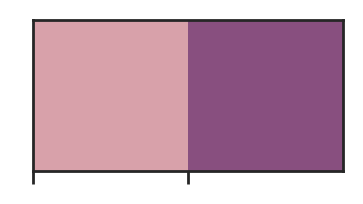

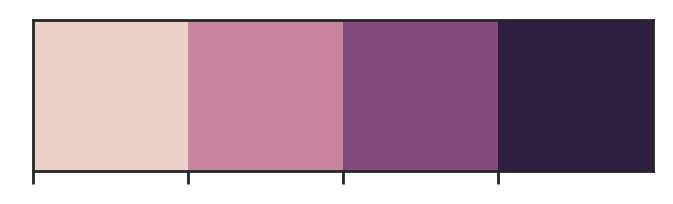

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"

import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams["font.size"] = 20
rcParams['figure.dpi'] = 100
rcParams["savefig.dpi"] = 300
rcParams["savefig.bbox"] = 'tight'

import seaborn as sns
sns.set_context("paper")
sns.set_style("ticks")

import numpy as np
import pandas as pd
import pickle

import os
import requests
from io import BytesIO
from io import StringIO

from astropy.table import Table
from astropy.table import join
from astropy.io import ascii
import astropy.constants as c

from scipy import interpolate
from sklearn import svm
from arviz import hpd

# Function to get NASA Exoplanet Archive catalogs 
# from Dan Foreman-Mackey (https://github.com/dfm/exopop)
def get_catalog(name, basepath="data"):
    fn = os.path.join(basepath, "{0}.h5".format(name))
    if os.path.exists(fn):
        return pd.read_hdf(fn, name)
    if not os.path.exists(basepath):
        os.makedirs(basepath)
    print("Downloading {0}...".format(name))
    url = ("http://exoplanetarchive.ipac.caltech.edu/cgi-bin/nstedAPI/"
           "nph-nstedAPI?table={0}&select=*").format(name)
    r = requests.get(url)
    if r.status_code != requests.codes.ok:
        r.raise_for_status()
        
    fh = BytesIO(r.content)
    df = pd.read_csv(fh)
    df.to_hdf(fn, name, format="t")
    return df

#To track the provenance of different columns, we want a function to prepend an informative string to each column name.
#We will do this before merging tables to make tracking the information easier.
def prepend_dataframe_columns(df, prefix):
    df.columns = [prefix+col for col in df.columns]
    return 


#Suppressing astropy units warnings
import warnings
from astropy.utils.exceptions import AstropyWarning

warnings.filterwarnings('ignore', category=UserWarning, append=True)
warnings.simplefilter('ignore', category=AstropyWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

#Suppressing Pandas chained assignment warnings
pd.options.mode.chained_assignment = None  # default='warn'


# Consistent color map throughout
cpal = sns.cubehelix_palette(4)
#cmap = sns.cubehelix_palette(start=3, light=0.9, as_cmap=True)
#cmap = sns.cubehelix_palette(start=3, light=1, as_cmap=True)
cmap = sns.cubehelix_palette(start=3, light=0.95, as_cmap=True)
tt_cmap = sns.cubehelix_palette(2, light=0.7, dark=0.4, as_cmap=True)
tt_cpal = sns.cubehelix_palette(2, light=0.7, dark=0.4, as_cmap=False)
#tt_cpal = sns.cubehelix_palette(2, light=0.65, dark=0.45, as_cmap=False)

sns.set_palette(cpal)
sns.palplot(tt_cpal)
sns.palplot(cpal)

fig_overwrite = False

### Move this (Fig. 16)

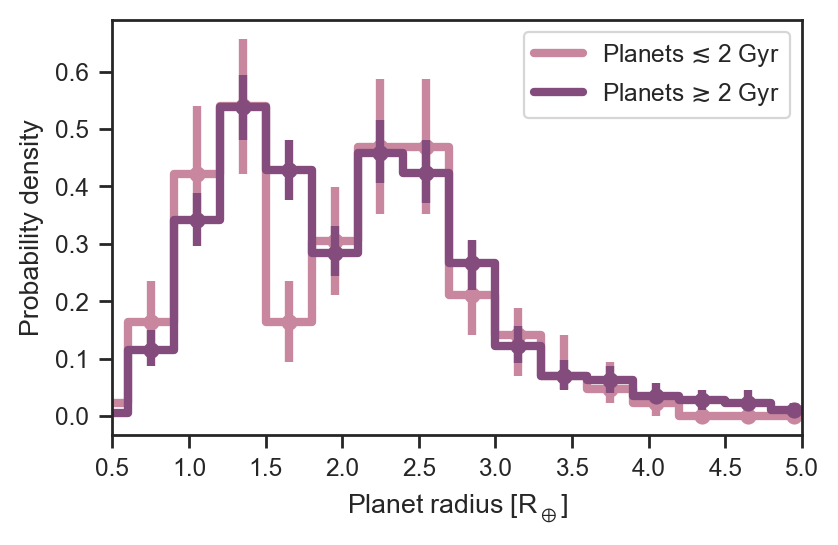

In [457]:
#Move this
thresh = 5

x1 = cks['f18_Rp'][iso_allyng&(cks['rp_prec']<thresh)]
x1err = cks['f18_E_Rp'][iso_allyng&(cks['rp_prec']<thresh)]
x2 = cks['f18_Rp'][iso_old&(cks['rp_prec']<thresh)]
x2err = cks['f18_E_Rp'][iso_old&(cks['rp_prec']<thresh)]

rpbins = np.arange(0,10.3,0.3)

nboot = 1000
hist1 = []
hist2 = []

np.random.seed(1701)

for i in range(nboot):
    
    arg1 = np.random.choice(len(x1), len(x1), replace=True)
    arg2 = np.random.choice(len(x2), len(x2), replace=True)
    
    x1sim = np.random.normal(x1, x1err)
    x2sim = np.random.normal(x2, x2err)
    
    _hist1, bin_edges = np.histogram(x1sim[arg1], bins=rpbins, density=True)
    _hist2, bin_edges = np.histogram(x2sim[arg2], bins=rpbins, density=True)
    
    hist1.append(_hist1)
    hist2.append(_hist2)
    
    
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
hist1_e = np.median(hist1, axis=0)-np.percentile(hist1, 16., axis=0)
hist1_E = np.percentile(hist1, 84., axis=0)-np.median(hist1, axis=0)

hist2_e = np.median(hist2, axis=0)-np.percentile(hist2, 16., axis=0)
hist2_E = np.percentile(hist2, 84., axis=0)-np.median(hist2, axis=0)

plt.plot(bin_centers, np.median(hist1, axis=0), drawstyle='steps-mid', lw=3, color=cpal[1], label=r'Planets $\lesssim$ 2 Gyr', zorder=1)
plt.errorbar(bin_centers, np.median(hist1, axis=0), yerr=[hist1_e, hist1_E], fmt='o', color=cpal[1], lw=3, zorder=1)
plt.plot(bin_centers, np.median(hist2, axis=0), drawstyle='steps-mid', lw=3, color=cpal[2], label=r'Planets $\gtrsim$ 2 Gyr', zorder=2)
plt.errorbar(bin_centers, np.median(hist2, axis=0), yerr=[hist2_e, hist2_E], fmt='o', color=cpal[2], lw=3, zorder=2)

plt.xlim(0.5,5)    
plt.xlabel(r'Planet radius [$\mathregular{R_\oplus}$]')
plt.ylabel('Probability density')
plt.legend()
plt.gcf().set_size_inches(2.75*1.618,2.75)
#plt.savefig('../figures/fivepct.pdf')
plt.show()

### Load the CKS VII table (merged with several literature tables)
This table is the output of the merge-tables.ipynb notebook

In [2]:
cks = pd.read_parquet('../data/cks-merged.parquet')

### MIST v1.1 isochrones
For plotting and sample selection purposes

In [53]:
#Non-rotating solar metallicity MIST isochrones
mist  = np.genfromtxt('../data/isochrones/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.0_basic.iso', skip_header=10, names=True)
#Non-rotating Fe/H = -0.25 MIST isochrones
mistm = np.genfromtxt('../data/isochrones/MIST_v1.2_feh_m0.25_afe_p0.0_vvcrit0.0_basic.iso', skip_header=10, names=True)
#Non-rotating Fe/H = +0.25 MIST isochrones
mistp = np.genfromtxt('../data/isochrones/MIST_v1.2_feh_p0.25_afe_p0.0_vvcrit0.0_basic.iso', skip_header=10, names=True)
#Rotating (v/vcrit=0.4) solar metallicity MIST isochrones
mistr = np.genfromtxt('../data/isochrones/MIST_v1.2_feh_p0.00_afe_p0.0_vvcrit0.4_basic.iso', skip_header=10, names=True)

### Sample selection and masking of unreliable data

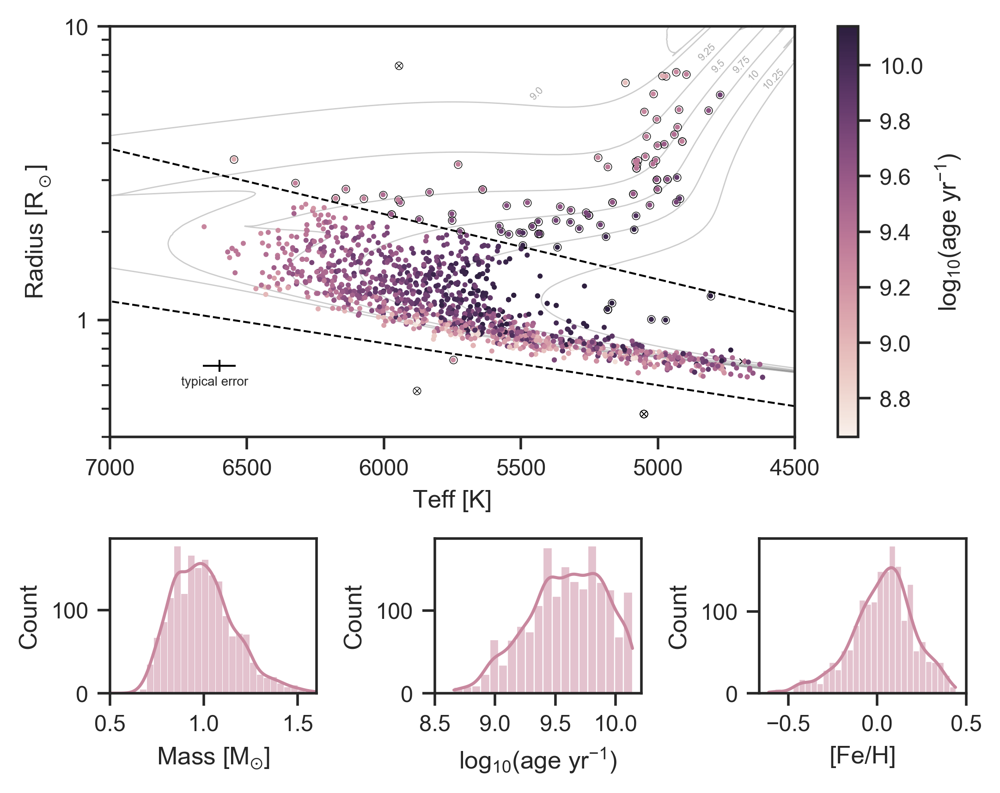

In [5]:
def maxage_teff(rstar):
    arg = (mistp['log10_isochrone_age_yr']==10.25)&(mistp['EEP']<500)
    f = interpolate.interp1d(10.**mistp['log_R'][arg], 
                             10.**mistp['log_Teff'][arg], 
                             kind='cubic', fill_value='extrapolate')
    return f(rstar)


def hrd_plot(fig_path=None):

    _teff = np.linspace(4500,7000,10)

    #We wish to remove stars that obviously fall below the main sequence as these may have unreliable stellar parameters
    m_onms = cks['f18_R'] > 10.**((cks['f18_Teff']-5500)/7000 - 0.15)
    #Our study will focus stars which have not evolved far off the main sequence
    m_unevolved = cks['f18_R'] < 10.**((cks['f18_Teff']-5500)/4500 + 0.25)
    #Some cool stars appear to be elevated from the main-sequence, corresponding to ages older than the universe
    #even if they are metal-rich.
    m_unelevated = cks['f18_Teff'] > maxage_teff(cks['f18_R'])

    #Combining masks
    m_ms = m_onms&m_unevolved&m_unelevated

    #Plotting the HRD
    fig = plt.figure(figsize=(5*1.1,4*1.1), dpi=200)
    ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=3, rowspan=2)
    ax2 = plt.subplot2grid((3, 3), (2, 0), colspan=1)
    ax3 = plt.subplot2grid((3, 3), (2, 1), colspan=1)
    ax4 = plt.subplot2grid((3, 3), (2, 2), colspan=1)

    ax1.plot(cks['f18_Teff'][~np.isfinite(cks['f18_logAiso'])], cks['f18_R'][~np.isfinite(cks['f18_logAiso'])], 'kx', ms=2, mew=0.25)
    ax1.plot(cks['f18_Teff'][~m_ms], cks['f18_R'][~m_ms], 'ko', mfc="None", ms=3, mew=0.25)
    scpl = ax1.scatter(cks['f18_Teff'], cks['f18_R'], c=cks['f18_logAiso'], s=4, cmap=cmap, lw=0, zorder=999)

    ax1.plot(_teff, 10.**((_teff-5500)/4500 + 0.25), '--', color='k', lw=0.75) #upper boundary
    ax1.plot(_teff, 10.**((_teff-5500)/7000 - 0.15), '--', color='k', lw=0.75) #lower boundary

    for la in [9.,9.25,9.5,9.75,10,10.25]:
        __ = mist['log10_isochrone_age_yr']==la
        ax1.plot(10.**mist['log_Teff'][__], 10.**mist['log_R'][__], color='k', alpha=0.2, lw=0.5)
        __ &= (mist['EEP']==505)
        ax1.text(10.**mist['log_Teff'][__]+30, 1.05*10.**mist['log_R'][__], 
                 str(la), rotation=45, color='darkgrey', size=4)

    ax1.errorbar(6600,0.7, 
                 xerr=np.nanmedian(cks['f18_E_Teff']),
                 yerr=np.nanmedian(cks['f18_E_R']),
                 fmt='.', ms=0, color='k', lw=0.75)
    ax1.text(6740,0.6,'typical error',size=5)

    ax1.set_xlabel('Teff [K]')
    ax1.set_ylabel(r'Radius [$\mathregular{R_\odot}$]')
    ax1.set_xlim(7000,4500)
    ax1.semilogy()
    ax1.set_ylim(0.4,10)
    ax1.set_yticks([1,10])
    ax1.set_yticklabels(['1','10'])
    fig.colorbar(scpl, label=r'log$_\mathregular{10}$(age yr$^\mathregular{-1}$)', ax=ax1)

    sns.histplot(cks['f18_Miso'][m_ms], kde=True, ax=ax2, color=cpal[1])
    sns.histplot(cks['f18_logAiso'][m_ms], kde=True, ax=ax3, color=cpal[1])
    sns.histplot(cks['f18_[Fe/H]'][m_ms], kde=True, ax=ax4, color=cpal[1])

    ax2.set_xlim(0.5,1.6)
    ax3.set_xticks([8.5,9,9.5,10])
    ax4.set_xticks([-0.5,0,0.5])
    ax2.set_xlabel(r'Mass [M$_\mathregular{\odot}$]')
    ax3.set_xlabel(r'log$_\mathregular{10}$(age yr$^\mathregular{-1}$)')
    ax4.set_xlabel(r'[Fe/H]')

    plt.tight_layout()
    
    if fig_path:
        plt.savefig(fig_path)
    plt.show()

    return m_ms, m_onms, m_unevolved, m_unelevated

m_ms, m_onms, m_unevolved, m_unelevated = hrd_plot() #Masks to be used later

### Empirical open cluster gyrochrones ([Curtis et al. 2020](https://arxiv.org/abs/2010.02272))
We will use published gyrochrones derived from open clusters to empirically age-rank planet hosts

In [6]:
# Curtis et al. 2020 table
def curtis_bprp_teff(bprp):
    #Estimating effective temperature from the dereddened Gaia DR2 (Bp-Rp) color
    bprp  = np.array(bprp)
    coeff = [-416.585, 39780.0, -84190.5, 85203.9, -48225.9, 15598.5, -2694.76, 192.865]    
    teff  = np.array([np.sum([co*_bprp**i for i,co in enumerate(coeff)]) for _bprp in bprp])
    mask  = (bprp>=0.55) & (bprp<=3.25)
    teff[~mask] = np.nan
    return teff

def curtis_gyrochrone(bprp, kind):
    bprp = np.array(bprp)
    
    if kind=='kepler': #Kepler lower envelope
        bprp_min, bprp_max = 0.6, 2.1
        coeff = [36.4756, -202.718, 414.752, -395.161, 197.800, -50.0287, 5.05738]
        
    elif kind=='pleiades-ro':
        bprp_min, bprp_max = 0.6, 1.3
        coeff = [37.068, -188.02, 332.32, -235.78, 60.395]

    elif kind=='pleiades-quad':
        bprp_min, bprp_max = 0.6, 1.3
        coeff = [-8.467, 19.64, -5.438]
        
    elif kind=='praesepe':
        bprp_min, bprp_max = 0.6, 2.4
        coeff = [-330.810, 1462.48, -2569.35, 2347.13, -1171.90, 303.620, -31.9227]
        
    elif kind=='ngc6811':
        bprp_min, bprp_max = 0.65, 1.95 
        coeff = [-594.019, 2671.90, -4791.80, 4462.64, -2276.40, 603.772, -65.0830]
        
    elif kind=='ngc752':
        bprp_min, bprp_max = 1.32, 2.24
        coeff = [6.80, 5.63] 
    
    elif kind=='ngc6819+ruprecht147':
        bprp_min, bprp_max = 0.62, 2.07
        coeff = [-271.783, 932.879, -1148.51, 695.539, -210.562, 25.8119]
        
    prot  = np.array([np.sum([co*_bprp**i for i,co in enumerate(coeff)]) for _bprp in bprp])
    mask  = (bprp>=bprp_min) & (bprp<=bprp_max)
    prot[~mask] = np.nan
    
    return prot
        

#Re-casting the Curtis et al. 2020 polynomial relations in Teff

from scipy import interpolate

def curtis_teff_gyrochrone(teff, kind):
    
    _bprp = np.linspace(0,5,10000)
    _teff = curtis_bprp_teff(_bprp)
    _prot = curtis_gyrochrone(_bprp, kind)
    
    _ = (np.isfinite(_teff)) & (np.isfinite(_prot))
    
    # Be cognizant that using "extrapolate" means the resulting relations will be unreliable
    # outside the Teff ranges over which they were derived, but for our purposes it is effective 
    f = interpolate.interp1d(_teff[_], _prot[_], kind='cubic', fill_value='extrapolate')
    
    return f(teff)


def curtis_teff_bprp(teff):
    #Invert Teff-BpRp relation
    
    _bprp = np.linspace(0.55,3.25,10000)
    _teff = curtis_bprp_teff(_bprp)
    
    _ = (np.isfinite(_teff)) & (np.isfinite(_bprp))
    
    # Be cognizant that using "extrapolate" means the resulting relations will be unreliable
    # outside the Teff ranges over which they were derived, but for our purposes it is effective 
    f = interpolate.interp1d(_teff[_], _bprp[_], kind='cubic', fill_value='extrapolate')
    
    return f(teff)

### Defining new columns and masks
Masks will be used to construct various subsamples

In [44]:
# Computing additional columns
cks['d20_ruwe'][cks['d20_ruwe']>1e4]=np.inf #There are two sources that are significant outliers in RUWE (>1e20)
cks['f18_depth_ppm'] = (cks['f18_Rp/R*']**2.0)/1e-6
cks['single_transit_snr'] = 1.0e6*((1.0*c.R_earth.value)/(cks['f18_R']*c.R_sun.value))**2. * 1.0/cks['stlr_rrmscdpp03p0']
cks['Rcut'] = 10.**((cks['f18_Teff']-5500)/4500 + 0.25) #Fulton & Petigura use 0.2 instead of 0.25
cks['rs_prec'] = 100.*np.max([cks['f18_e_R'], cks['f18_E_R']], axis=0)/cks['f18_R'] #Fractional stellar radius precision
cks['rp_prec'] = 100.*np.max([cks['f18_e_Rp'], cks['f18_E_Rp']], axis=0)/cks['f18_Rp'] #Fractional planet radius precision
cks['nkoi'] = [np.sum(cks['f18_KOI_int']==k) for k in cks['f18_KOI_int']]
cks['f18_age_gyr'] = 10.**(cks['f18_logAiso'])/1.0e9
cks['f18_agelo_gyr'] = 10.**((cks['f18_logAiso']-cks['f18_e_logAiso']))/1.0e9
cks['f18_agehi_gyr'] = 10.**((cks['f18_logAiso']+cks['f18_E_logAiso']))/1.0e9

# Threshold parameters for masks
mstar_min, mstar_max = 0.75, 1.25
period_max = 100.
r8_max = 1.1
rcf_max = 1.05
abs_feh_max = 0.3
ruwe_max = 1.4
ag_max = 2
av_max = 0.5
gkp_max = 1.0
snr_min = 0.25
dlogage_max = 1.0
rperr_max = 0.2
ageerr_max = 0.25
rtau_min = 0.6
koiscore_min = 0.8

print(len(cks), 'planets')

# Remove False Positives
m_disp = cks['p17_Disp'] != 'FP'
print(len(cks[~m_disp]), 'planets with FP disposition')

# Remove single-planet systems
#m &= ful_planet['nplanets'] > 1
#print(len(ful_planet[m]), 'planets')

# Remove stars with flux contamination determined from Gaia
m_r8 = cks['f18_r8'] < r8_max
print(len(cks[~m_r8]), 'planets fail r8 cut')

# Exclude stars with flux contamination from follow-up high-res imaging
m_rcf = np.invert(cks['f18_RCF'] >= rcf_max)
print(len(cks[~m_rcf]), 'planets fail RCF cut')

# Exclude any subgiants or giants
m_ms = m_onms & m_unevolved & m_unelevated
print(len(cks[~m_ms]), 'planets fail stellar radius cut')

# Exclude long period planets
m_period = cks['f18_P'] < period_max
print(len(cks[~m_period]), 'planets fail period cut')

# Limit the stellar masses
m_mass = (mstar_min<=cks['f18_Miso']) & (cks['f18_Miso']<=mstar_max)
print(len(cks[~m_mass]), 'planets fail stellar mass cut')

# Limit the metallicity
m_feh = abs(cks['f18_[Fe/H]'])<abs_feh_max
print(len(cks[~m_feh]), 'planets fail stellar metallicity cut')

# No transit depth disagreement between FP2018 and DR25
m_depth = abs(cks['f18_depth_ppm'] - cks['dr25_koi_depth'])<10000
print(len(cks[~m_depth]), 'planets fail transit depth agreement cut')

# Signal-to-noise cut
m_snr = cks['single_transit_snr'] > snr_min
print(len(cks[~m_snr]), 'planets fail SNR cut')

# Age disagreement between FP18 and B20
m_deltaage = abs(cks['f18_logAiso'] - cks['b20_log10_iso_age'])< dlogage_max
print(len(cks[~m_deltaage]), 'planets fail age agreement test')

# Precise ages
m_ageerr = np.all(np.array([cks['f18_e_logAiso'], cks['f18_E_logAiso']])<ageerr_max, axis=0)
print(len(cks[~m_ageerr]), 'planets fail age precision cut')

# Well-determined planet radii
m_rperr = np.all(np.array([cks['f18_e_Rp']/cks['f18_Rp'], cks['f18_E_Rp']/cks['f18_Rp']])<rperr_max, axis=0)
print(len(cks[~m_rperr]), 'planets fail radius precision cut')

# Small planets
m_rp = cks['f18_Rp']<10.0
print(len(cks[~m_rp]), 'planets fail radius cut')

# RUWE cut
m_ruwe = cks['d20_ruwe']<ruwe_max
print(len(cks[~m_ruwe]), 'planets fail RUWE cut')

# Stars with discrepant Kp and Gaia mags
m_deltamag = abs(cks['gaia_phot_g_mean_mag']-cks['dr25_koi_kepmag'])<gkp_max
print(len(cks[~m_deltamag]), 'planets fail Gaia-Kepler brightness agreement test')

# Stars with low Gaia reddening
#m_red = cks['gaia_a_g_val']<ag_max
m_red = cks['l20_Av']<av_max
print(len(cks[~m_red]), 'planets fail reddening cut')

# Stars with discrepant Gaia and isochrone parallaxes
m_plx = abs(cks['f18_plx']-cks['f18_plxspec'])/np.min(np.array([cks['f18_e_plxspec'],cks['f18_E_plxspec']]), axis=0) < 4
print(len(cks[~m_plx]), 'planets fail parallax agreement test')

# Planets with grazing transits
m_nongrazing = cks['p20_Rtau'] >= rtau_min
print(len(cks[~m_nongrazing]), 'planets with grazing transits')

# KOI score
m_koiscore = cks['dr25_koi_score']>koiscore_min

m = m_disp&\
    m_r8&\
    m_rcf&\
    m_ms&\
    m_period&\
    m_mass&\
    m_feh&\
    m_rperr&\
    m_rp&\
    m_ruwe&\
    m_deltamag&\
    m_plx&\
    m_nongrazing & m_red & m_depth #& m_snr  & m_deltaage


common_cuts = m_ms & m_disp & m_period & m_rp & m_rperr & (cks['f18_Miso']>0.5) #& m_koiscore
cc = m_ms & m_disp & m_period & m_rp & m_rperr & (cks['f18_Miso']>0.5)

print("Base sample")
print(len(cks[common_cuts]), 'planets remaining after cuts in base sample')
print(len(np.unique(np.array(cks['f18_KOI_int'][common_cuts]))), 'unique hosts remaining after cuts in base sample')

print("Filtered sample")
print(len(cks[m]), 'planets remaining after cuts in filtered sample')
print(len(np.unique(np.array(cks['f18_KOI_int'][m]))), 'unique hosts remaining after cuts in filtered sample')

print("Hot star sample")
hot_stars = common_cuts & (cks['f18_Teff']>5500.)
print(len(cks[hot_stars]), 'planets remaining after cuts in filtered sample')
print(len(np.unique(np.array(cks['f18_KOI_int'][hot_stars]))), 'unique hosts remaining after cuts in filtered sample')

mask_dict = {1: 'False positive disposition',
             2: 'Flux contamination from Gaia',
             3: 'Flux contamination from imaging',
             4: 'Evolved stars',
             5: 'Long periods', 
             6: 'Stellar mass cut',
             7: 'Stellar metallicity cut', 
             8: 'Transit depth disagreement', 
             9: 'Earth-sized transit SNR',
             10: 'Age disagreement between F18 and B20', 
             11: 'Low precision in planet radius',
             12: 'Small planets', 
             13: 'Gaia RUWE > 1.4', 
             14: 'Discrepant Gaia G and Kepler Kp magnitudes', 
             15: 'Large Gaia reddening',
             16: 'Discrepant trigonometric and spectroscopic parallaxes',
             17: 'Grazing transits'}

1913 planets
149 planets with FP disposition
137 planets fail r8 cut
78 planets fail RCF cut
105 planets fail stellar radius cut
223 planets fail period cut
253 planets fail stellar mass cut
219 planets fail stellar metallicity cut
179 planets fail transit depth agreement cut
233 planets fail SNR cut
184 planets fail age agreement test
814 planets fail age precision cut
96 planets fail radius precision cut
153 planets fail radius cut
234 planets fail RUWE cut
140 planets fail Gaia-Kepler brightness agreement test
216 planets fail reddening cut
99 planets fail parallax agreement test
601 planets with grazing transits
Base sample
1443 planets remaining after cuts in base sample
871 unique hosts remaining after cuts in base sample
Filtered sample
732 planets remaining after cuts in filtered sample
466 unique hosts remaining after cuts in filtered sample
Hot star sample
997 planets remaining after cuts in filtered sample
622 unique hosts remaining after cuts in filtered sample


/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:75: RuntimeWarning: invalid value encountered in less
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:79: RuntimeWarning: invalid value encountered in less


### Figure 18

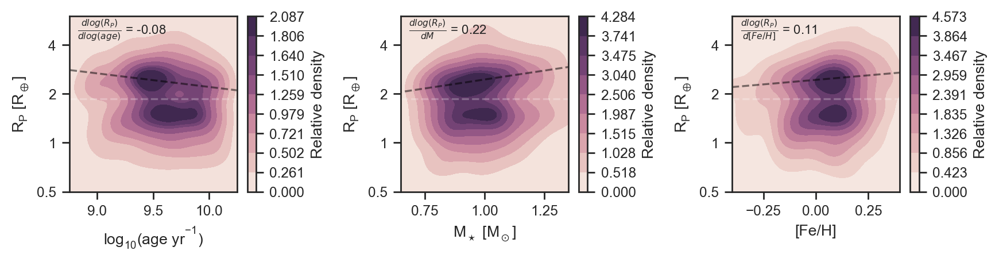

In [60]:
def triptych(samples, fig_path=None, cbar_kws=None):

    fig,ax = plt.subplots(nrows=1, ncols=3, figsize=(0.8*11,0.8*3))

    arg = samples
    sns.kdeplot(cks['f18_logAiso'][arg], np.log10(cks['f18_Rp'][arg]), fill=True, thresh=0, cmap=cmap, ax=ax[0], cbar=True, cbar_kws=cbar_kws)
    sns.kdeplot(cks['f18_Miso'][arg], np.log10(cks['f18_Rp'][arg]), fill=True, thresh=0, cmap=cmap, ax=ax[1], cbar=True, cbar_kws=cbar_kws)
    sns.kdeplot(cks['f18_[Fe/H]'][arg], np.log10(cks['f18_Rp'][arg]), fill=True, thresh=0, cmap=cmap, ax=ax[2], cbar=True, cbar_kws=cbar_kws)
        
    for j in range(3):
        ax[j].set_ylabel(r'$\mathregular{R_P~[R_\oplus]}$')
        ax[j].set_ylim(np.log10(0.5),np.log10(6))
        ax[j].axhline(np.log10(1.87),color='white',ls='--',alpha=0.25)
        ax[j].set_yticks(np.log10([0.5,1,2,4]))
        ax[j].set_yticklabels(['0.5','1','2','4'])        
     

    ax[0].set_xlabel(r'$\mathregular{log_{10}(age~yr^{-1})}$')
    ax[1].set_xlabel(r'$\mathregular{M_\star~[M_\odot]}$')
    ax[2].set_xlabel(r'[Fe/H]')

    ax[0].set_xlim(8.75,10.25)
    ax[1].set_xlim(0.65,1.35)
    ax[2].set_xlim(-0.4,0.4)

    x1min,x1max = 8,11
    y1min,y1max = 0.51,0.26
    
    x2min,x2max = 0.5,1.4
    y2min,y2max = np.log10(1.9),np.log10(3)
    
    x3min,x3max = -0.4,0.4
    y3min,y3max = np.log10(2.2),np.log10(2.7)
    
    ax[0].plot([x1min,x1max],[y1min,y1max],'k--',alpha=0.5)
    ax[1].plot([x2min,x2max],[y2min,y2max],'k--',alpha=0.5)
    ax[2].plot([x3min,x3max],[y3min,y3max],'k--',alpha=0.5)

    ax[0].text(0.05,0.9,r'$\frac{dlog(R_P)}{dlog(age)}$ = '+ "%.2f" % float((y1min-y1max)/(x1min-x1max)), transform=ax[0].transAxes, size=8)
    ax[1].text(0.05,0.9,r'$\frac{dlog(R_P)}{dM}$ = '+ "%.2f" % float((y2min-y2max)/(x2min-x2max)), transform=ax[1].transAxes, size=8)
    ax[2].text(0.05,0.9,r'$\frac{dlog(R_P)}{d[Fe/H]}$ = '+ "%.2f" % float((y3min-y3max)/(x3min-x3max)), transform=ax[2].transAxes, size=8)    
    
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.5)
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
        
cbar_kwargs = {'label': 'Relative density'}
    
#triptych(common_cuts&(cks['rp_prec']<6), fig_path='../figures/triptych.pdf')
triptych(common_cuts&(cks['rp_prec']<6), cbar_kws=cbar_kwargs)

### P-R evolution plots

In [13]:
def pr_evolution_plot(smpl, 
                      age_bins=np.arange(9,10.25,0.25),
                      fig_path=None, scatter_kwargs={'rasterized': True}):
    
    # Van Eylen et al. 2018 valley
    xvalley = np.log10([0.1,100])
    yvalley = -0.09*xvalley+0.37

    _x = np.log10(cks['f18_P'][smpl])
    _y = np.log10(cks['f18_Rp'][smpl])
    _z = cks['f18_Miso'][smpl]
    _yerrlo, _yerrhi = cks['f18_e_Rp'][smpl], cks['f18_E_Rp'][smpl]

    fig, ax = plt.subplots(4,len(age_bins)-1, figsize=(0.7*16,0.7*14))

    for i in range(len(age_bins)-1):

        ax1 = ax[0][i]
        ax2 = ax[1][i]
        ax3 = ax[2][i]
        ax4 = ax[3][i]

        ax1.set_xlabel('Period [days]')
        ax1.set_xticks(np.log10([1,3,10,30,100]))
        ax1.set_xticklabels(['1','3','10','30','100'])
        ax1.set_yticks(np.log10([0.5,1,2,4,8]))
        ax1.set_yticklabels(['0.5','1','2','4','8'])    
        ax1.set_xlim(-0.5,2)
        ax1.set_ylim(np.log10(0.5),np.log10(10))    


        #Using CKS VII ages
        if i==0:
            _arg = (cks['f18_logAiso'][smpl] < age_bins[i+1])
            ax1.set_title(r'log$_\mathregular{10}$(age yr$^\mathregular{-1}$) < '+str(age_bins[i+1]), size=12)
            
        elif i==len(age_bins)-2:
            _arg = (age_bins[i] <= cks['f18_logAiso'][smpl])
            ax1.set_title(r'$\mathregular{log_{10}(age~yr^{-1})~\geq} $'+str(age_bins[i]), size=12)
        else:
            _arg = (age_bins[i] <= cks['f18_logAiso'][smpl]) & (cks['f18_logAiso'][smpl] < age_bins[i+1])
            ax1.set_title(r'log$_\mathregular{10}$(age yr$^\mathregular{-1}$) = '+str(age_bins[i])+'-'+str(age_bins[i+1]), size=12)


        sns.kdeplot(np.log10(cks['f18_P'][m_disp]), np.log10(cks['f18_Rp'][m_disp]), fill=True, thresh=0, cmap=cmap, ax=ax1)
        sns.scatterplot(x=_x[_arg], y=_y[_arg], color='white', edgecolor='darkgrey', alpha=0.8, s=12, linewidth=1, ax=ax1, **scatter_kwargs)
        ax1.plot(xvalley, yvalley, color='k', ls='--', lw=0.5, label='Radius valley\n(Van Eylen et al. 2018)')
        ax1.text(0.05,0.9,r'$\mathregular{n_{pl}}$ = '+str(len(_x[_arg])), size=8, transform=ax1.transAxes)
        
        # Completeness contour
        _cc = pd.read_csv('../data/cks_completeness_contour_25pct.csv')
        ax1.fill_between(np.log10(_cc['p']), np.log10(0.5), np.log10(_cc['rp']), 
                         color='grey', 
                         alpha=0.25, 
                         lw=1)

        ax2.hist(cks['f18_Rp'][smpl][_arg], 
                  bins=np.arange(0,10,0.375),#bins=np.linspace(0,7.5,21), 
                  histtype='step', 
                  color=cpal[1], 
                  lw=2, 
                  density=True)
        ax2.set_xlim(-0.5,8.5)
        ax2.set_ylim(0,0.75)
        ax2.axvspan(1.59,1.77,color='darkgrey',lw=0,alpha=0.5)
        ax2.set_xlabel('Planet radius [R$_\mathregular{\oplus}$]')


        itv_arg = (cks['f18_Rp'][smpl]>1.6)&(cks['f18_Rp'][smpl]<1.9)
        
        ax3.plot(cks['f18_Teff'][smpl], cks['f18_R'][smpl], '.', color='lightgrey', **scatter_kwargs)
        ax3.plot(cks['f18_Teff'][smpl][_arg], cks['f18_R'][smpl][_arg], '.', color=cpal[1], **scatter_kwargs)
        ax3.plot(cks['f18_Teff'][smpl][_arg&itv_arg], cks['f18_R'][smpl][_arg&itv_arg], '.', color=cpal[1], mec='k', lw=0.5, **scatter_kwargs)
        ax3.invert_xaxis()
        ax3.set_xlabel('Teff [K]')

        ax4.set_xlabel(r'$\mathregular{M_\star [M_\odot]}$')
        ax4.axvline(1, color='lightgrey')
        ax4.axhline(0, color='lightgrey')
        ax4.plot(cks['f18_Miso'][smpl], cks['f18_[Fe/H]'][smpl], '.', color='lightgrey', **scatter_kwargs)
        ax4.plot(cks['f18_Miso'][smpl][_arg], cks['f18_[Fe/H]'][smpl][_arg], '.', color=cpal[1], **scatter_kwargs)
        ax4.plot(cks['f18_Miso'][smpl][_arg&itv_arg], cks['f18_[Fe/H]'][smpl][_arg&itv_arg], '.', color=cpal[1], mec='k', lw=0.5, **scatter_kwargs)

        if i==0:
            ax1.set_ylabel('Planet radius [R$_\mathregular{\oplus}$]')
            ax2.set_ylabel('Probability density')
            ax3.set_ylabel(r'Radius [R$_\odot$]')
            ax4.set_ylabel('[Fe/H]')

        else:
            ax1.set_ylabel('')
            ax1.set_yticklabels('')
            ax2.set_ylabel('')
            ax2.set_yticklabels('')
            ax3.set_ylabel('')
            ax3.set_yticklabels('')
            ax4.set_ylabel('')
            ax4.set_yticklabels('')

    plt.subplots_adjust(wspace=0, hspace=0.4)
    if fig_path:
        plt.savefig(fig_path)

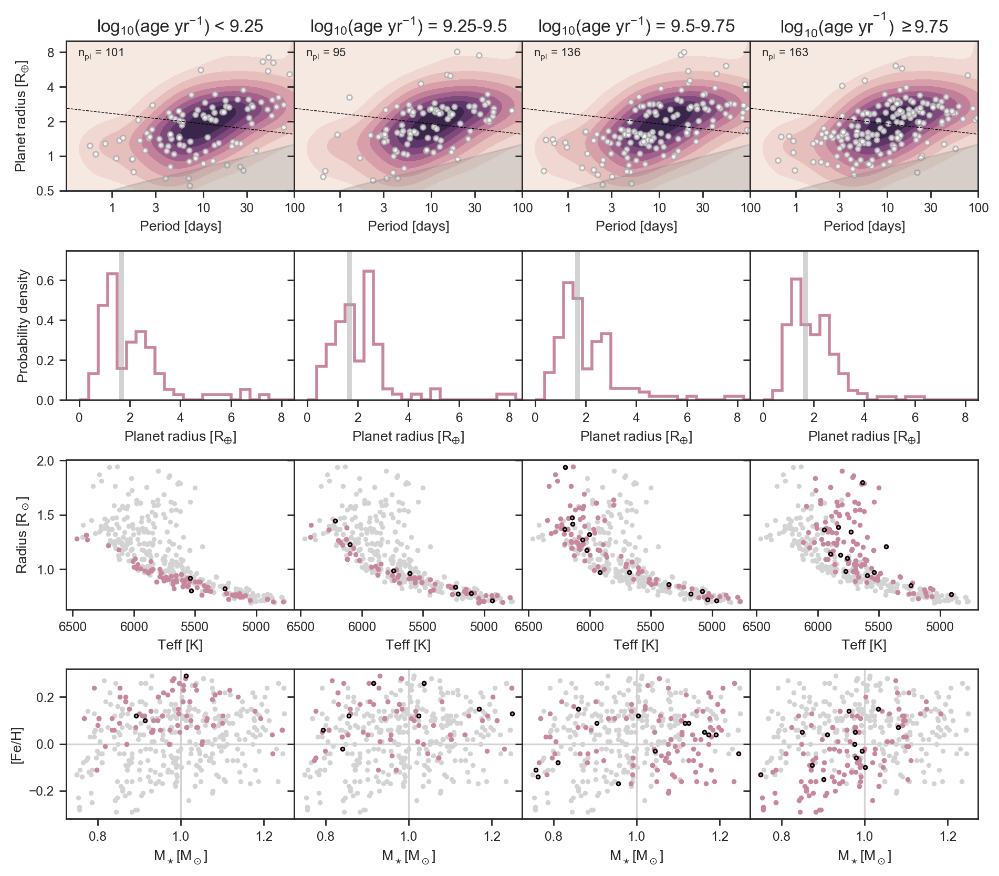

In [15]:
pr_evolution_plot(m&(cks['rp_prec']<6), fig_path='../figures/pr-filtered-precise.pdf')

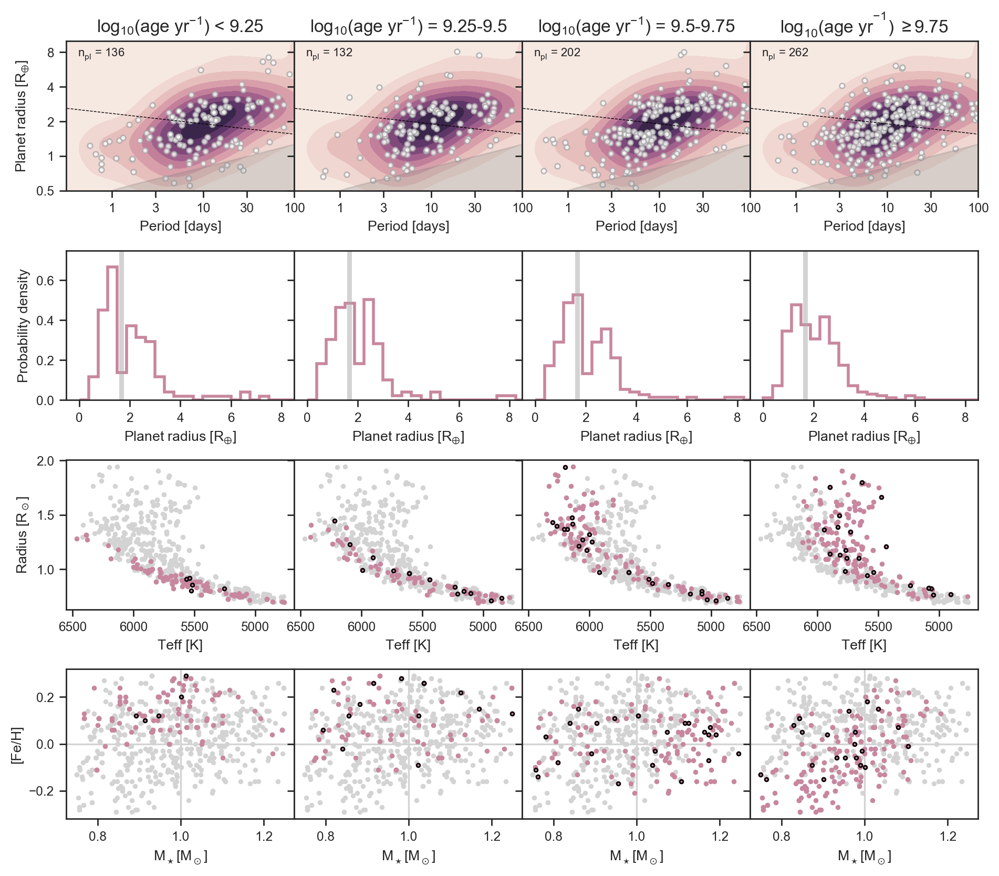

In [16]:
pr_evolution_plot(m, fig_path='../figures/pr-filtered.pdf')

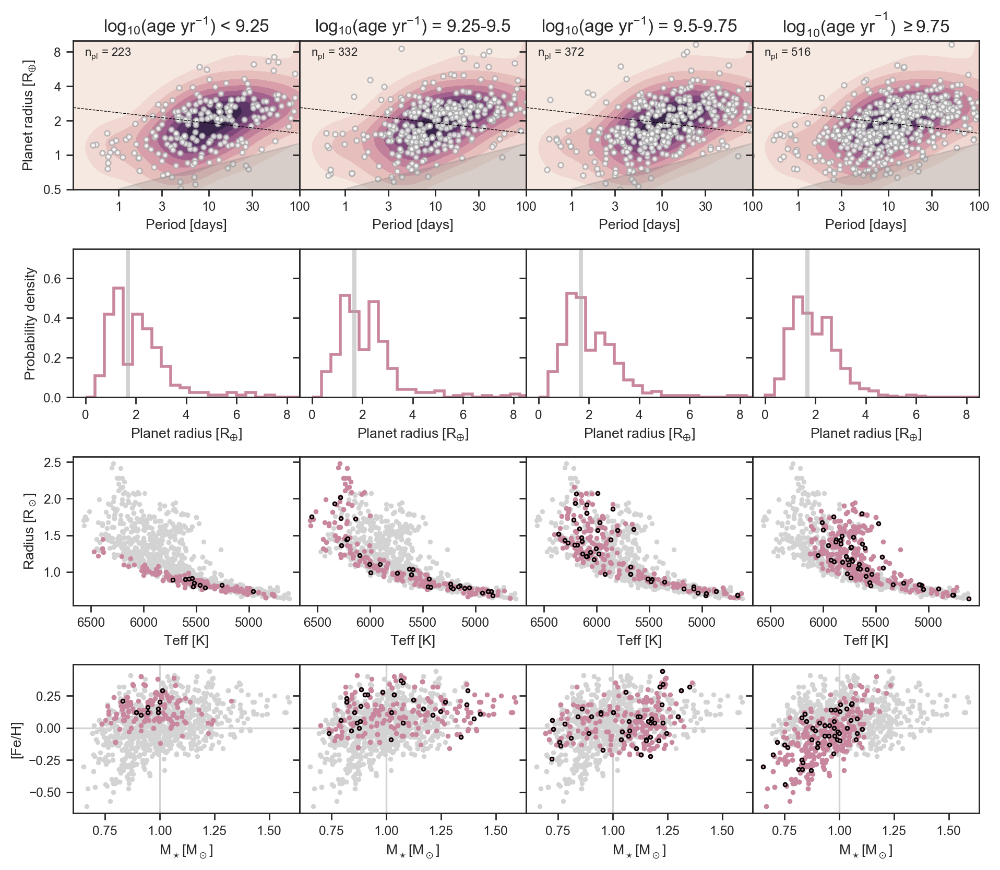

In [17]:
pr_evolution_plot(cc, fig_path='../figures/pr-base.pdf')

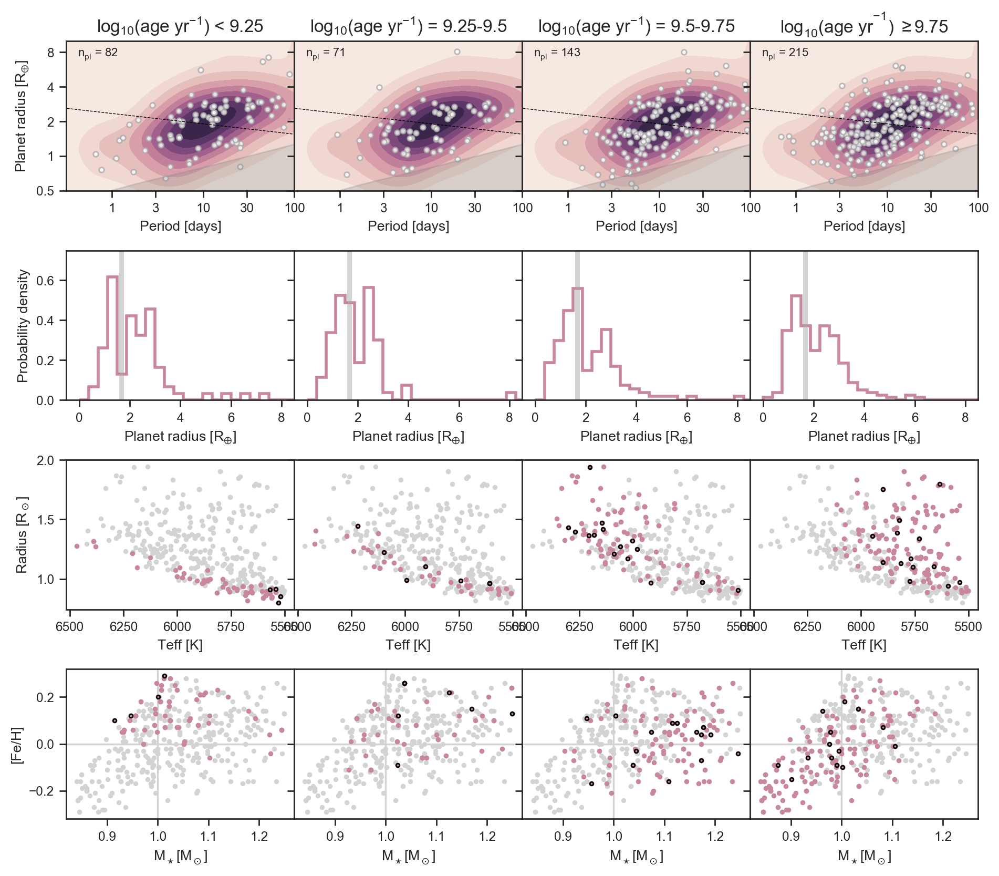

In [18]:
pr_evolution_plot(hot_stars&m, fig_path=None)

### Histogram plot

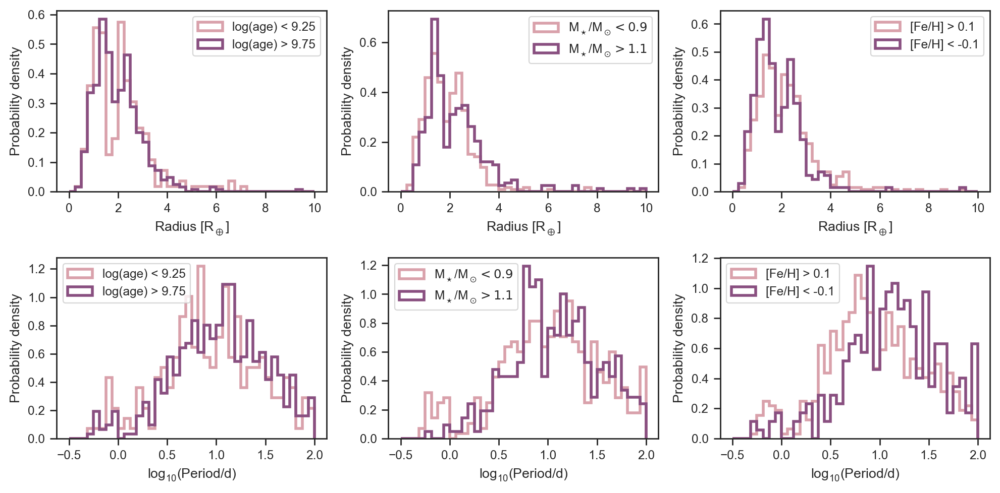

In [66]:
def hist_plot(fig_path=None):

    fig,(ax1,ax2) = plt.subplots(nrows=2,ncols=3, figsize=(10,5))
    rpl = cks['f18_Rp'] #- 10.**(-0.08*np.log10(cks['f18_P']) + 0.31)
    ppl = np.log10(cks['f18_P'])
    rpl_bins = np.linspace(0,10,41)
    ppl_bins = np.linspace(-0.5,2,41)
    hist_kwargs = {'histtype': 'step', 'density': True, 'lw': 2}

    feh_lo, feh_hi = -0.1, 0.1
    age_lo, age_hi = 9.25, 9.75
    mass_lo, mass_hi = 0.9, 1.1

    ax1[0].hist(rpl[common_cuts&(cks['f18_logAiso']<age_lo)], rpl_bins, color=tt_cpal[0], label='log(age) < 9.25', **hist_kwargs)
    ax1[0].hist(rpl[common_cuts&(cks['f18_logAiso']>age_hi)], rpl_bins,color=tt_cpal[1], label='log(age) > 9.75', **hist_kwargs)


    ax1[1].hist(rpl[common_cuts&(cks['f18_Miso']<mass_lo)], rpl_bins, color=tt_cpal[0], label=r'$\mathregular{M_\star/M_\odot} < 0.9$', **hist_kwargs)
    ax1[1].hist(rpl[common_cuts&(cks['f18_Miso']>mass_hi)], rpl_bins,color=tt_cpal[1], label=r'$\mathregular{M_\star/M_\odot} > 1.1$', **hist_kwargs)


    ax1[2].hist(rpl[common_cuts&(cks['f18_[Fe/H]']>feh_hi)], rpl_bins, color=tt_cpal[0], label='[Fe/H] > 0.1', **hist_kwargs)
    ax1[2].hist(rpl[common_cuts&(cks['f18_[Fe/H]']<feh_lo)], rpl_bins,color=tt_cpal[1],  label='[Fe/H] < -0.1', **hist_kwargs)

    ax2[0].hist(ppl[common_cuts&(cks['f18_logAiso']<age_lo)], ppl_bins, color=tt_cpal[0], label='log(age) < 9.25', **hist_kwargs)
    ax2[0].hist(ppl[common_cuts&(cks['f18_logAiso']>age_hi)], ppl_bins,color=tt_cpal[1], label='log(age) > 9.75', **hist_kwargs)

    ax2[1].hist(ppl[common_cuts&(cks['f18_Miso']<mass_lo)], ppl_bins, color=tt_cpal[0], label=r'$\mathregular{M_\star/M_\odot} < 0.9$', **hist_kwargs)
    ax2[1].hist(ppl[common_cuts&(cks['f18_Miso']>mass_hi)], ppl_bins,color=tt_cpal[1], label=r'$\mathregular{M_\star/M_\odot} > 1.1$', **hist_kwargs)

    ax2[2].hist(ppl[common_cuts&(cks['f18_[Fe/H]']>feh_hi)], ppl_bins, color=tt_cpal[0], label='[Fe/H] > 0.1', **hist_kwargs)
    ax2[2].hist(ppl[common_cuts&(cks['f18_[Fe/H]']<feh_lo)], ppl_bins,color=tt_cpal[1], label='[Fe/H] < -0.1', **hist_kwargs)


    for i in range(3):
        ax1[i].legend(loc='best')
        ax2[i].legend(loc='upper left')
        ax1[i].set_xlabel(r'Radius [$\mathregular{R_\oplus}$]')
        ax2[i].set_xlabel(r'$\mathregular{log_{10}}$(Period/d)')
        ax1[i].set_ylabel('Probability density')
        ax2[i].set_ylabel('Probability density')

    plt.tight_layout()

    if fig_path:
        plt.savefig(fig_path)
    
    plt.show()
    return

hist_plot('../figures/hist.pdf')

### Defining the samples (Fig. 6)

Number of planets in isochrone-selected sample (1-1.8 Gyr): 156
Number of planets in isochrone-selected sample (<1.8 Gyr): 238
Number of planets in isochrone-selected hot star sample (<1.8 Gyr): 124
Number of planets in rotation-selected sample (<2.7 Gyr): 190


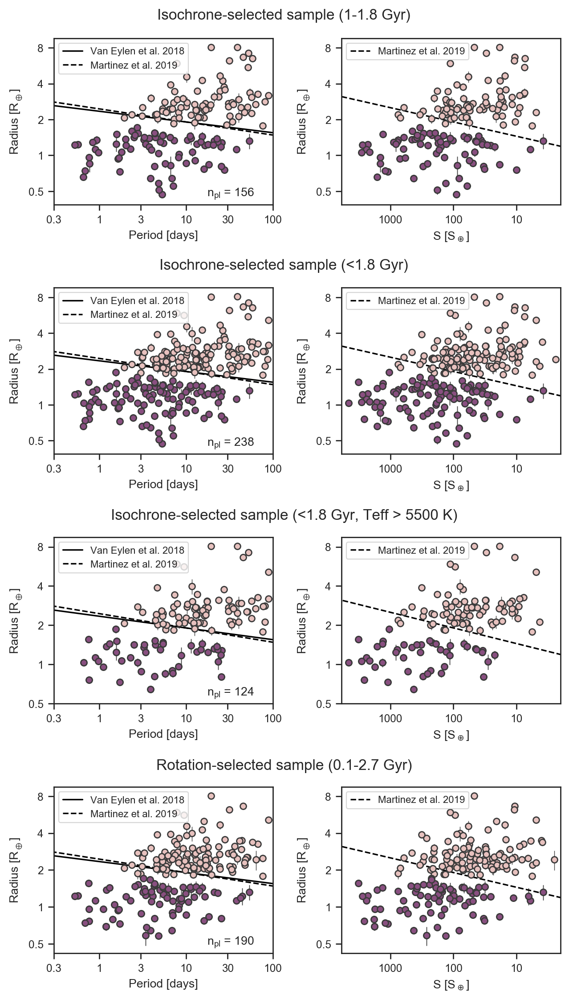

In [65]:
# cpal = sns.cubehelix_palette(4)
# cmap = sns.cubehelix_palette(start=3, light=0.95, as_cmap=True)
# tt_cmap = sns.cubehelix_palette(2, light=0.7, dark=0.4, as_cmap=True)
# tt_cpal = sns.cubehelix_palette(2, light=0.7, dark=0.4, as_cmap=False)

def v18_valley(p):
    #Van Eylen et al. 2018 radius valley in period-radius space
    log10rp = -0.09*np.log10(p)+0.37
    return 10.**log10rp

def m19_valley(p):
    #Martinez et al. 2019 radius valley in period-radius space
    log10rp = -0.11*np.log10(p)+0.39
    return 10.**log10rp

def m19_svalley(s):
    #Martinez et al. 2019 radius valley in period-insolation space
    log10rp = 0.12*np.log10(s) + 0.04
    return 10.**log10rp

def v18_valley_shifted(p):
    #Van Eylen et al. 2018 radius valley shifted, used to classify sample
    log10rp = -0.09*np.log10(p)+0.30
    return 10.**log10rp


iso_yng = common_cuts & (cks['f18_logAiso']>9.0) & (cks['f18_logAiso']<=9.25)
iso_old = common_cuts & (cks['f18_logAiso']>9.25)
iso_allyng = common_cuts & (cks['f18_logAiso']<=9.25)

iso_hot = common_cuts & (cks['f18_Teff']>5500) & (cks['f18_logAiso']<=9.25)

#Preparing isochrone-selected samples for SVC analysis
xiso, yiso, ziso = cks['f18_P'][iso_yng], cks['f18_Rp'][iso_yng], cks['f18_Sinc'][iso_yng]
exiso = [cks['f18_e_P'][iso_yng], cks['f18_E_P'][iso_yng]]
eyiso = [cks['f18_e_Rp'][iso_yng], cks['f18_E_Rp'][iso_yng]]
eziso = [cks['f18_e_Sinc'][iso_yng], cks['f18_E_Sinc'][iso_yng]]

xiso, yiso, ziso = np.array(xiso), np.array(yiso), np.array(ziso)
npl_iso = len(xiso)
print('Number of planets in isochrone-selected sample (1-1.8 Gyr):', npl_iso)

#Preparing isochrone-selected samples for SVC analysis
xiso_all, yiso_all, ziso_all = cks['f18_P'][iso_allyng], cks['f18_Rp'][iso_allyng], cks['f18_Sinc'][iso_allyng]
exiso_all = [cks['f18_e_P'][iso_allyng], cks['f18_E_P'][iso_allyng]]
eyiso_all = [cks['f18_e_Rp'][iso_allyng], cks['f18_E_Rp'][iso_allyng]]
eziso_all = [cks['f18_e_Sinc'][iso_allyng], cks['f18_E_Sinc'][iso_allyng]]

xiso_all, yiso_all, ziso_all = np.array(xiso_all), np.array(yiso_all), np.array(ziso_all)
npl_iso_all = len(xiso_all)
print('Number of planets in isochrone-selected sample (<1.8 Gyr):', npl_iso_all)

#Preparing isochrone-selected samples for SVC analysis
xhot, yhot, zhot = cks['f18_P'][iso_hot], cks['f18_Rp'][iso_hot], cks['f18_Sinc'][iso_hot]
exhot = [cks['f18_e_P'][iso_hot], cks['f18_E_P'][iso_hot]]
eyhot = [cks['f18_e_Rp'][iso_hot], cks['f18_E_Rp'][iso_hot]]
ezhot = [cks['f18_e_Sinc'][iso_hot], cks['f18_E_Sinc'][iso_hot]]

xhot, yhot, zhot = np.array(xhot), np.array(yhot), np.array(zhot)
npl_hot = len(xhot)
print('Number of planets in isochrone-selected hot star sample (<1.8 Gyr):', npl_hot)


#Preparing rotation-selected sample for SVC analysis
gyro = common_cuts & m_ruwe & (cks['f18_Teff']<6000.)

gyro_yng = gyro & (cks['prot']<curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))&\
                  (cks['prot']>curtis_teff_gyrochrone(cks['f18_Teff'], kind='pleiades-quad'))&\
                  (cks['Prot_flag']=='a')


gyro_old = gyro & (cks['prot']>=curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))
gyro_nop = gyro & (np.isnan(cks['prot']))


xgyro, ygyro, zgyro = cks['f18_P'][gyro_yng], cks['f18_Rp'][gyro_yng], cks['f18_Sinc'][gyro_yng]
exgyro = [cks['f18_e_P'][gyro_yng], cks['f18_E_P'][gyro_yng]]
eygyro = [cks['f18_e_Rp'][gyro_yng], cks['f18_E_Rp'][gyro_yng]]
ezgyro = [cks['f18_e_Sinc'][gyro_yng], cks['f18_E_Sinc'][gyro_yng]]
npl_gyro = len(xgyro)

xgyro, ygyro, zgyro = np.array(xgyro), np.array(ygyro), np.array(zgyro)


print('Number of planets in rotation-selected sample (<2.7 Gyr):', npl_gyro)


#Flags for SVC analysis
flag_iso = np.zeros(len(xiso), dtype=bool)
flag_iso[yiso<v18_valley_shifted(xiso)] = 1

flag_iso_all = np.zeros(len(xiso_all), dtype=bool)
flag_iso_all[yiso_all<v18_valley_shifted(xiso_all)] = 1

flag_hot = np.zeros(len(xhot), dtype=bool)
flag_hot[yhot<v18_valley_shifted(xhot)] = 1

flag_gyro = np.zeros(len(xgyro), dtype=bool)
flag_gyro[ygyro<v18_valley_shifted(xgyro)] = 1

xdata = [xiso, xiso_all, xhot, xgyro]
ydata = [yiso, yiso_all, yhot, ygyro]
zdata = [ziso, ziso_all, zhot, zgyro]
flags = [flag_iso, flag_iso_all, flag_hot, flag_gyro]
xerr = [exiso, exiso_all, exhot, exgyro]
yerr = [eyiso, eyiso_all, eyhot, eygyro]
zerr = [eziso, eziso_all, ezhot, ezgyro]


def sample_plot(fig_path=None):
    
    ebar_kwargs = {'rasterized':True, 'mec':'#3b3b3b', 'ecolor':'#3b3b3b', 'fmt':'o', 'lw':0.5, 'ms':5}
    
    cmap = sns.cubehelix_palette(2, light=0.8, dark=0.4, as_cmap=True)
    cpal = sns.cubehelix_palette(2, light=0.8, dark=0.4)

    sample_labels = ['Isochrone-selected sample (1-1.8 Gyr)',
                     'Isochrone-selected sample (<1.8 Gyr)',
                     'Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)',
                     'Rotation-selected sample (0.1-2.7 Gyr)']

    for i in range(4):
        plt.subplot(4,2,2*i+1)
        plt.figtext(0.5, 1.01-(0.25*i*1.02), sample_labels[i], ha='center', va='center', size=12)

        plt.plot([0.1,100],v18_valley([0.1,100]),'k', label='Van Eylen et al. 2018')    
        plt.plot([0.1,100],m19_valley([0.1,100]),'k--', label='Martinez et al. 2019')    

        plt.errorbar(xdata[i], ydata[i], xerr=xerr[i], yerr=yerr[i], color=cpal[0], **ebar_kwargs)
        plt.errorbar(xdata[i][flags[i]==1], ydata[i][flags[i]==1], 
                 xerr=[xerr[i][0][flags[i]==1], xerr[i][1][flags[i]==1]], 
                 yerr=[yerr[i][0][flags[i]==1], yerr[i][1][flags[i]==1]], color=cpal[1], **ebar_kwargs)

        plt.xlabel('Period [days]')
        plt.ylabel(r'Radius [$\mathregular{R_\oplus}$]')
        plt.loglog()

        xticks = [0.3,1,3,10,30,100]
        yticks = [0.5,1,2,4,8]

        plt.xticks(xticks, [str(xt) for xt in xticks])
        plt.yticks(yticks, [str(yt) for yt in yticks])

        plt.xlim(0.3,100)
        plt.minorticks_off()
        plt.legend(prop={'size':8})
        plt.text(0.7,0.05,
                 r'n$_\mathregular{pl}$ = '+str(int(len(xdata[i]))), transform=plt.gca().transAxes)



        plt.subplot(4,2,2*i+2)
        plt.plot([1,1e4],m19_svalley([1,1e4]),'k--', label='Martinez et al. 2019')    

        plt.errorbar(zdata[i], ydata[i], xerr=zerr[i], yerr=yerr[i], color=cpal[0], **ebar_kwargs)
        plt.errorbar(zdata[i][flags[i]==1], ydata[i][flags[i]==1], 
                 xerr=[zerr[i][0][flags[i]==1], zerr[i][1][flags[i]==1]], 
                 yerr=[yerr[i][0][flags[i]==1], yerr[i][1][flags[i]==1]], color=cpal[1], **ebar_kwargs)


        plt.xlabel(r'S [S$_\oplus$]')
        plt.ylabel(r'Radius [$\mathregular{R_\oplus}$]')
        plt.loglog()
        plt.legend(loc='upper left', prop={'size':8})

        xticks = [10,100,1000]
        yticks = [0.5,1,2,4,8]

        plt.xticks(xticks, [str(xt) for xt in xticks])
        plt.yticks(yticks, [str(yt) for yt in yticks])
        plt.xlim(6000,2)
        plt.minorticks_off()

    plt.gcf().set_size_inches(6.5,11)
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.5)
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    
#sample_plot('../figures/samples.pdf') 
sample_plot() 

### Plotting the rotation-selected sample in the H-R diagram (Fig. 4)

/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in log10
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in log10


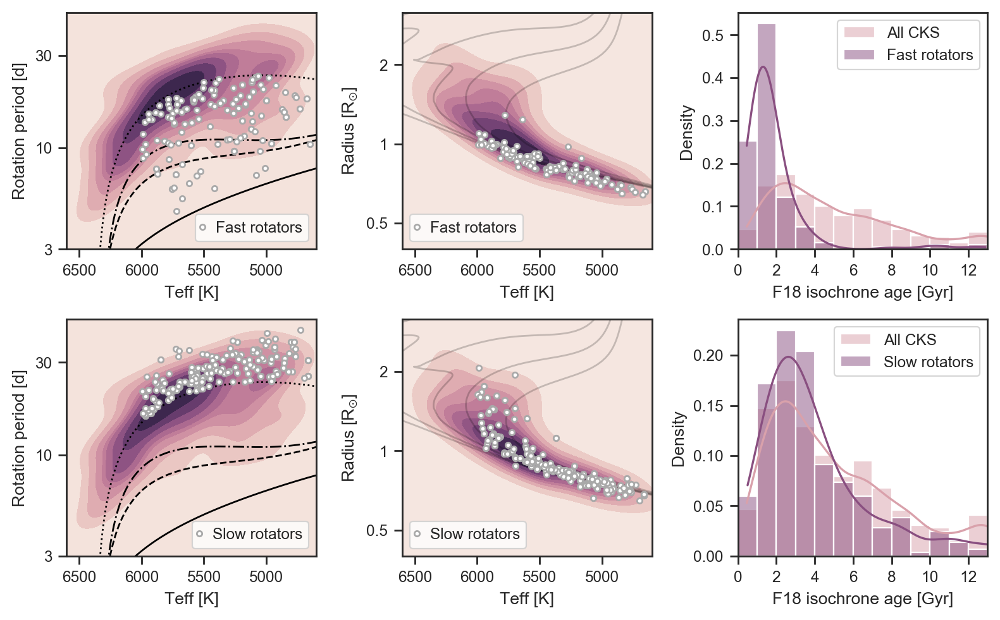

In [39]:
def gyro_hrd_plot(fig_path=None):

    smpl_labels = ['Fast rotators', 'Slow rotators']

    fig, ax = plt.subplots(nrows=2,ncols=3, figsize=(8,5))

    for i,smpl in enumerate([gyro_yng, gyro_old]):
        _ax = ax[i][0]

        #Gyrochronology diagram
        arg = (np.isfinite(cks['f18_Teff'])) & (np.isfinite(cks['Prot']))
        sns.kdeplot(x=cks['f18_Teff'][arg], y=np.log10(cks['Prot'][arg]), fill=True, thresh=0, cmap=cmap, ax=_ax)

        bprp = np.linspace(0,5,1000)
        teff = curtis_bprp_teff(bprp)

        _ax.plot(teff, np.log10(curtis_gyrochrone(bprp, kind='pleiades-quad')), 'k-', lw=1)
        _ax.plot(teff, np.log10(curtis_gyrochrone(bprp, kind='praesepe')), 'k--', lw=1)
        _ax.plot(teff, np.log10(curtis_gyrochrone(bprp, kind='ngc6811')), 'k-.', lw=1)
        _ax.plot(teff, np.log10(curtis_gyrochrone(bprp, kind='ngc6819+ruprecht147')), 'k:', lw=1)

        _ax.set_xlim(6600,4600)
        _ax.set_ylim(0.5,1.7)
        _ax.set_yticks(np.log10([3,10,30]))
        _ax.set_yticklabels(['3','10','30'])
        _ax.set_xlabel('Teff [K]')
        _ax.set_ylabel('Rotation period [d]')

        _ax.errorbar(cks['f18_Teff'][smpl], np.log10(cks['prot'][smpl]), 
                      fmt='o', color='white', mec='darkgrey', ms=3, mew=1, ecolor='darkgrey', label=smpl_labels[i])
        _ax.legend(loc='lower right', handlelength=0.1)


        #H-R diagram
        _ax = ax[i][1]
        arg = (np.isfinite(cks['f18_Teff'])) & (np.isfinite(cks['f18_R']))
        sns.kdeplot(x=cks['f18_Teff'][arg], y=np.log10(cks['f18_R'][arg]), fill=True, thresh=0, cmap=cmap, ax=_ax)

        _ax.errorbar(cks['f18_Teff'][smpl], np.log10(cks['f18_R'][smpl]), 
                      fmt='o', color='white', mec='darkgrey', ms=3, mew=1, ecolor='darkgrey', label=smpl_labels[i])


        for la in [9.,9.25,9.5,9.75,10]:
            arg = mist['log10_isochrone_age_yr']==la
            _ax.plot(10.**mist['log_Teff'][arg], mist['log_R'][arg], color='k', lw=1, alpha=0.2)

        _ax.set_ylim(-0.4,0.5)    
        _ax.set_xlim(6600,4600)
        
        _ax.set_yticks(np.log10([0.5,1,2]))
        _ax.set_yticklabels(['0.5','1','2'])    
        _ax.set_xlabel('Teff [K]')
        _ax.set_ylabel(r'Radius [R$_\mathregular{\odot}$]')
        _ax.legend(handlelength=0.1)

        #Age distributions
        _ax = ax[i][2]

        _x1 = (10.**cks['f18_logAiso'])/1.0e9
        _x2 = (10.**cks['f18_logAiso'][smpl])/1.0e9

        sns.histplot(_x1, color=tt_cpal[0], ax=_ax, kde=True, stat='density', bins=np.arange(0,14), label='All CKS')
        sns.histplot(_x2, color=tt_cpal[1], ax=_ax, kde=True, stat='density', bins=np.arange(0,14), label=smpl_labels[i])
        _ax.set_xlim(0,13)
        _ax.set_xticks(np.arange(0,14,2))
        _ax.set_xlabel('F18 isochrone age [Gyr]')
        _ax.legend()

    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    return

gyro_hrd_plot('../figures/gyro-sample.pdf')

### Support Vector Classification analysis
The code below was adapted from a [scikitlearn tutorial](https://scikit-learn.org/stable/auto_examples/svm/plot_svm_margin.html)
(Code source: Gaël Varoquaux. Modified for documentation by Jaques Grobler. License: BSD 3 clause.)

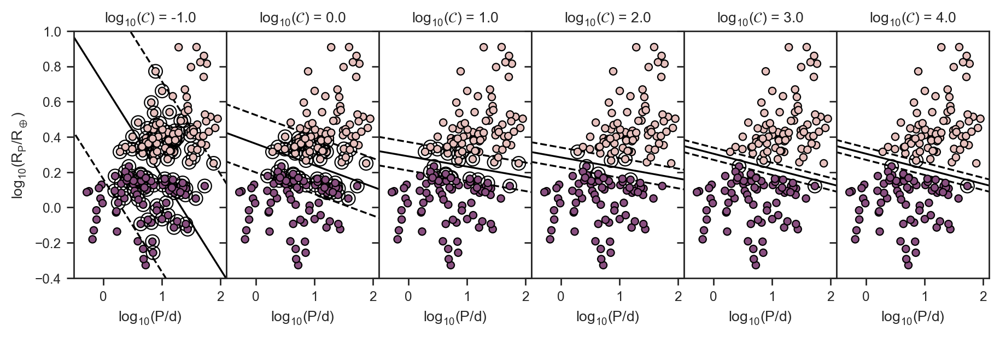

In [47]:
def regularization_plot(xdata=xiso, 
                        ydata=yiso, 
                        flag=flag_iso,
                        fig_path=None, scatter_kwargs={'rasterized': True}):
    
    cmap = sns.cubehelix_palette(2, light=0.8, dark=0.4, as_cmap=True)
    
    np.random.seed(1701)

    X = np.array([np.log10(xdata), 
                  np.log10(ydata)]).T

    Y = flag

    fignum = 1

    fig, ax = plt.subplots(nrows=1,ncols=6,figsize=(0.6*18,0.6*5),sharex=True)

    for i,penalty in enumerate([1e-1,1e0,1e1,1e2,1e3,1e4]):

        clf = svm.SVC(kernel='linear', C=penalty)
        clf.fit(X, Y)

        # Get the separating hyperplane
        w = clf.coef_[0]
        a = -w[0] / w[1]
        xx = np.linspace(-1, 2.2)
        yy = a * xx - (clf.intercept_[0]) / w[1]

        # Plot the parallels to the separating hyperplane that pass through the
        # support vectors (margin away from hyperplane in direction
        # perpendicular to hyperplane). This is sqrt(1+a^2) away vertically in
        # 2-d.
        margin = 1 / np.sqrt(np.sum(clf.coef_ ** 2))
        yy_down = yy - np.sqrt(1 + a ** 2) * margin
        yy_up = yy + np.sqrt(1 + a ** 2) * margin

        ax[i].plot(xx, yy, 'k-')
        ax[i].plot(xx, yy_down, 'k--')
        ax[i].plot(xx, yy_up, 'k--')

        ax[i].scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=80,
                    facecolors='none', zorder=10, edgecolors='k', **scatter_kwargs)
        ax[i].scatter(X[:, 0], X[:, 1], c=Y, zorder=10, cmap=cmap, edgecolors='k', **scatter_kwargs)

        plt.axis('tight')
        x_min = -2
        x_max = 2
        y_min = -1
        y_max = 1

        XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j]
        Z = clf.predict(np.c_[XX.ravel(), YY.ravel()])

        # Plot result in scatter plot
        Z = Z.reshape(XX.shape)

        ax[i].set_title(r'$\mathregular{log_{10}}$($\mathcal{C}$) = '+str(np.log10(penalty)))
        ax[i].set_ylim(-0.4,1)
        ax[i].set_xlim(-0.5,2.1)
        ax[i].set_xticks([0,1,2])
        ax[i].set_xlabel(r'$\mathregular{log_{10}(P/d)}$')
        if i==0:
            ax[i].set_ylabel(r'$\mathregular{log_{10}(R_P/R_\oplus)}$')

        if i>0:
            ax[i].set_yticklabels([])

    plt.subplots_adjust(wspace=0)
    if fig_path:
        plt.savefig(fig_path)
    
    return

regularization_plot(fig_path='../figures/regularization.pdf')
#regularization_plot()

### SVC with errorbars from bootstrapping

Sample A
 & 5 & $-0.09^{+0.06}_{-0.06}$ & $0.33^{+0.06}_{-0.07}$ & $0.14^{+0.01}_{-0.01}$\\
 & 10 & $-0.08^{+0.06}_{-0.04}$ & $0.31^{+0.05}_{-0.05}$ & $0.11^{+0.01}_{-0.01}$\\
 & 100 & $-0.06^{+0.02}_{-0.04}$ & $0.29^{+0.02}_{-0.04}$ & $0.07^{+0.01}_{-0.01}$\\
 & 1000 & $-0.06^{+0.02}_{-0.04}$ & $0.29^{+0.03}_{-0.03}$ & $0.06^{+0.01}_{-0.01}$\\
--------------------------------------------------------------------------------
Sample B
 & 5 & $-0.1^{+0.07}_{-0.05}$ & $0.32^{+0.06}_{-0.06}$ & $0.14^{+0.01}_{-0.01}$\\
 & 10 & $-0.08^{+0.05}_{-0.05}$ & $0.3^{+0.04}_{-0.07}$ & $0.11^{+0.01}_{-0.01}$\\
 & 100 & $-0.07^{+0.04}_{-0.04}$ & $0.29^{+0.04}_{-0.05}$ & $0.06^{+0.01}_{-0.01}$\\
 & 1000 & $-0.08^{+0.07}_{-0.03}$ & $0.3^{+0.04}_{-0.05}$ & $0.05^{+0.01}_{-0.02}$\\
--------------------------------------------------------------------------------
Sample C
 & 5 & $-0.12^{+0.06}_{-0.06}$ & $0.32^{+0.05}_{-0.05}$ & $0.14^{+0.01}_{-0.02}$\\
 & 10 & $-0.08^{+0.05}_{-0.04}$ & $0.3^{+0.05}_{-0.04}$

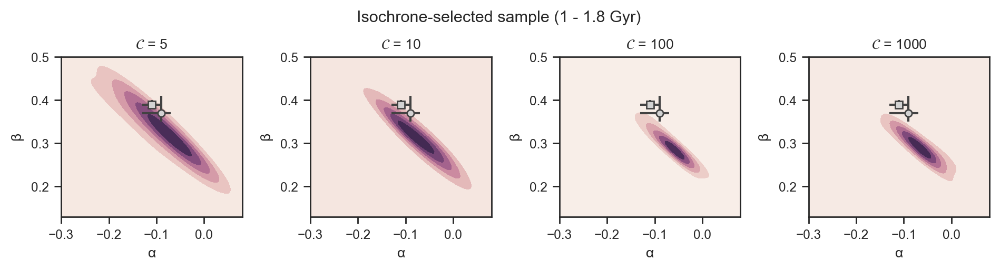

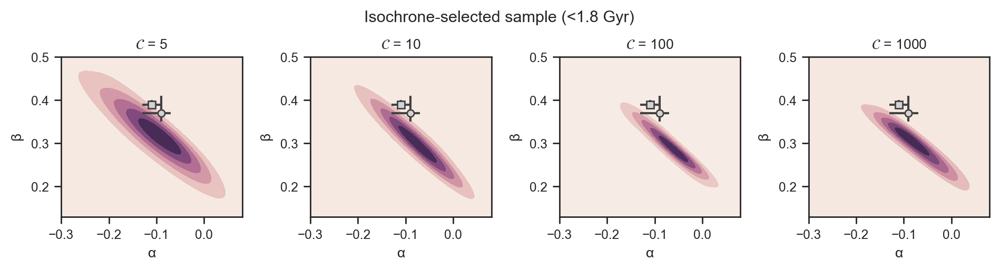

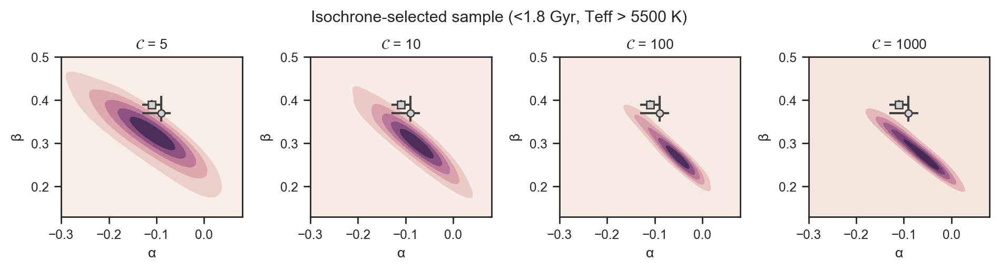

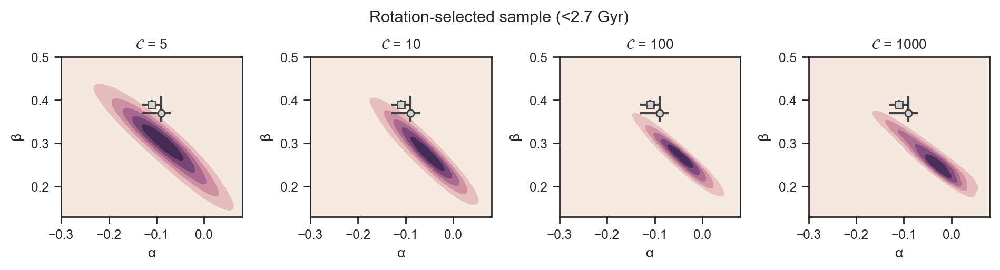

In [66]:
from sklearn.utils import resample
from astropy.stats import bootstrap

cmap = sns.cubehelix_palette(start=3, light=0.98, as_cmap=True)

def svm_analysis(xdata, ydata, flag, 
                 nboot=1000,
                 sboot=50,
                 penalty=[5,10,100,1000],
                 fig_title=None,
                 fig_path=None,
                 plot_lit='pr',
                 plot=False, 
                 xrange=(-0.3,0.08), 
                 yrange=(0.13,0.5),
                 sigfig=2):
    
    X = np.array([np.log10(xdata), np.log10(ydata)]).T
    Y = flag
    
    np.random.seed(1701)
    fig, ax = plt.subplots(nrows=1, ncols=len(penalty), figsize=(2.4*len(penalty),2.4))

    slopes = [[] for _ in range(len(penalty))]
    intercepts = [[] for _ in range(len(penalty))]
    margins = [[] for _ in range(len(penalty))]
    
    
    table_row = []
    
    for i,p in enumerate(penalty):
    
        for _ in range(nboot):

            #Resample the data with replacement
            arg = np.random.choice(len(X),sboot,replace=True)

            _X = X[arg]
            _Y = Y[arg]

            clf = svm.SVC(kernel='linear', C=p)
            clf.fit(_X, _Y)

            # Get the separating hyperplane
            w = clf.coef_[0]
            a = -w[0] / w[1]
            xx = np.linspace(-2, 2)
            yy = a * xx - (clf.intercept_[0]) / w[1]

            # Plot the parallels to the separating hyperplane that pass through the
            # support vectors (margin away from hyperplane in direction
            # perpendicular to hyperplane). This is sqrt(1+a^2) away vertically in
            # 2-d.
            margin = 1 / np.sqrt(np.sum(clf.coef_ ** 2))
            yy_down = yy - np.sqrt(1 + a ** 2) * margin
            yy_up = yy + np.sqrt(1 + a ** 2) * margin

            # Save the results
            slopes[i].append(a)
            intercepts[i].append((-clf.intercept_[0]) / w[1] ) #remember offset
            margins[i].append(np.sqrt(1 + a ** 2) * margin)    

            # Plot the line, the points, and the nearest vectors to the plane
            if plot==True:
                plt.figure(fignum, figsize=(4, 3))
                plt.clf()
                plt.plot(xx, yy, 'k-')
                plt.plot(xx, yy_down, 'k--')
                plt.plot(xx, yy_up, 'k--')

                plt.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1], s=80,
                            facecolors='none', zorder=10, edgecolors='k')
                plt.scatter(X[:, 0], X[:, 1], c=Y, zorder=10, cmap=plt.cm.Paired,
                            edgecolors='k')

                plt.axis('tight')
                plt.title('log10(C)='+str(np.log10(penalty)))
                plt.show()
    
    
    
        _df = pd.DataFrame({'slopes': slopes[i], 'intercepts': intercepts[i]})

        sns.kdeplot(x=_df['slopes'], y=_df['intercepts'],
                    cmap=cmap, ax=ax[i], fill='True', thresh=0, levels=7, bw_method='scott', bw_adjust=2)

        
        if plot_lit=='pr':
            #Van Eylen et al. 2018 values
            ax[i].errorbar(-0.09, 0.37, xerr=np.array([[0.04,0.02]]).T,
                           yerr=np.array([[0.02,0.04]]).T, fmt='o', mfc='lightgrey', color='#424242', lw=1.5)

            #Martinez et al. 2019 values
            ax[i].errorbar(-0.11, 0.39, xerr=np.array([[0.02,0.02]]).T,
                           yerr=np.array([[0.01,0.01]]).T, fmt='s', mfc='lightgrey', color='#424242', lw=1.5)
        elif plot_lit=='sr':
            #Martinez et al. 2019 values
            ax[i].errorbar(0.12, 0.04, xerr=np.array([[0.02,0.02]]).T,
                           yerr=np.array([[0.03,0.03]]).T, fmt='s', mfc='lightgrey', color='#424242', lw=1.5)
            
            pass

        ax[i].set_title(r'$\mathcal{C}$ = '+str(int(p)))
        ax[i].set_xlabel(r'$\mathregular{\alpha}$')
        ax[i].set_ylabel(r'$\mathregular{\beta}$')
        ax[i].set_xlim(xrange[0],xrange[1])
        ax[i].set_ylim(yrange[0],yrange[1])

        slope_err = (hpd(np.array(slopes[i]), 0.68)-np.median(slopes[i])).round(sigfig)
        intercept_err = (hpd(np.array(intercepts[i]), 0.68)-np.median(intercepts[i])).round(sigfig)
        margin_err = (hpd(np.array(margins[i]), 0.68)-np.median(margins[i])).round(sigfig)
    
        #Print LaTeX table rows
        print(' & '+ str(p)+' & $'+str(np.median(slopes[i]).round(sigfig))+'^{+'+str(slope_err[1])+'}_{'+str(slope_err[0])+'}$'+\
                         ' & $'+str(np.median(intercepts[i]).round(sigfig))+'^{+'+str(intercept_err[1])+'}_{'+str(intercept_err[0])+'}$'+\
                        ' & $'+str(np.median(margins[i]).round(sigfig))+'^{+'+str(margin_err[1])+'}_{'+str(margin_err[0])+'}$'+'\\\\')
    
    if fig_title:
        plt.figtext(0.5, 1.02, fig_title, ha='center', va='center', size=11)
    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    print('--'*40)
    
    return slopes, intercepts, margins

print('Sample A')
slopes_A, intercepts_A, margins_A = svm_analysis(xdata=xiso, ydata=yiso, flag=flag_iso, fig_title='Isochrone-selected sample (1 - 1.8 Gyr)', fig_path='../figures/jointplots-a.pdf')    
print('Sample B')
slopes_B, intercepts_B, margins_B = svm_analysis(xdata=xiso_all, ydata=yiso_all, flag=flag_iso_all, fig_title='Isochrone-selected sample (<1.8 Gyr)', fig_path='../figures/jointplots-b.pdf')
print('Sample C')
slopes_C, intercepts_C, margins_C = svm_analysis(xdata=xhot, ydata=yhot, flag=flag_hot, fig_title='Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)', fig_path='../figures/jointplots-c.pdf')
print('Sample D')
slopes_D, intercepts_D, margins_D = svm_analysis(xdata=xgyro, ydata=ygyro, flag=flag_gyro, fig_title='Rotation-selected sample (<2.7 Gyr)', fig_path='../figures/jointplots-d.pdf')

### Gold sample (move this down)

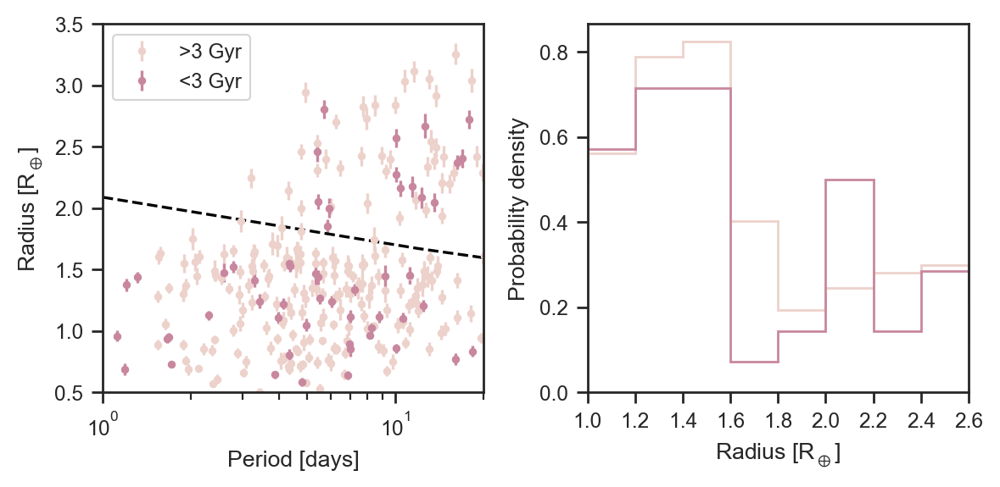

 & 5 & $-0.21^{+0.1}_{-0.06}$ & $0.49^{+0.07}_{-0.11}$ & $0.16^{+0.01}_{-0.02}$\\
 & 10 & $-0.16^{+0.08}_{-0.06}$ & $0.43^{+0.05}_{-0.08}$ & $0.12^{+0.01}_{-0.02}$\\
 & 100 & $-0.11^{+0.08}_{-0.03}$ & $0.35^{+0.04}_{-0.07}$ & $0.06^{+0.01}_{-0.01}$\\
 & 1000 & $-0.09^{+0.07}_{-0.05}$ & $0.33^{+0.08}_{-0.05}$ & $0.03^{+0.01}_{-0.01}$\\
--------------------------------------------------------------------------------
 & 5 & $-0.16^{+0.07}_{-0.06}$ & $0.41^{+0.05}_{-0.08}$ & $0.15^{+0.01}_{-0.02}$\\
 & 10 & $-0.12^{+0.05}_{-0.03}$ & $0.36^{+0.04}_{-0.05}$ & $0.12^{+0.01}_{-0.01}$\\
 & 100 & $-0.07^{+0.02}_{-0.03}$ & $0.29^{+0.03}_{-0.03}$ & $0.07^{+0.01}_{-0.01}$\\
 & 1000 & $-0.07^{+0.02}_{-0.03}$ & $0.29^{+0.02}_{-0.03}$ & $0.06^{+0.01}_{-0.01}$\\
--------------------------------------------------------------------------------


NameError: name 'plot_results' is not defined

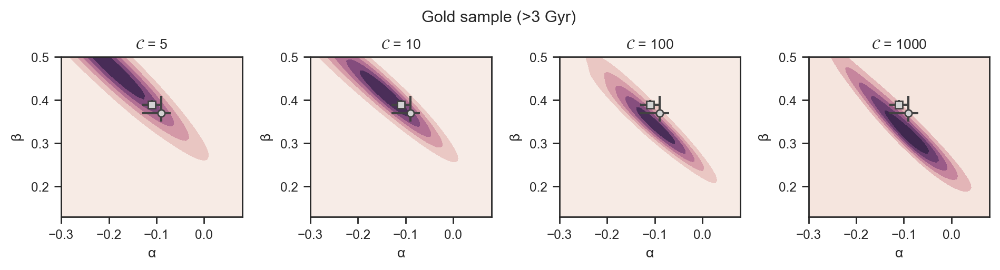

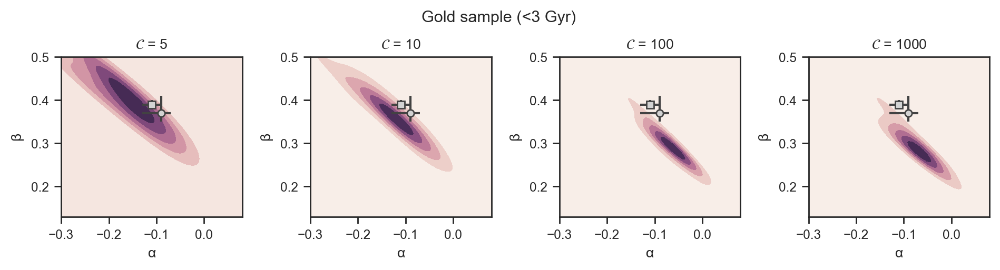

In [54]:
def v18_valley_shifted_2(p):
    #Van Eylen et al. 2018 radius valley shifted, used to classify sample
    log10rp = -0.09*np.log10(p)+0.32
    return 10.**log10rp

# tmp = m & (cks['f18_logAiso']>9.5) & (cks['f18_logAiso']<9.75) & (cks['rp_prec']<10)
# tmp2 = m & (cks['f18_logAiso']<9.25) & (cks['rp_prec']<10)

gold_old = m & ~gyro_yng & (cks['f18_age_gyr']>3) & (cks['f18_E_Rp']<0.1)
gold_yng = m & gyro_yng & (cks['f18_age_gyr']<3) & (cks['f18_E_Rp']<0.1)

#gold_old = m & ~gyro_yng & (cks['f18_age_gyr']>5) & (cks['rp_prec']<7)
#gold_yng = m & gyro_yng  & (cks['f18_age_gyr']<3) & (cks['rp_prec']<7)

#tmp = m & (cks['f18_age_gyr']>3) & (cks['f18_E_Rp']<0.1)
#tmp2 = m & gyro_yng & (cks['f18_age_gyr']<3) & (cks['f18_E_Rp']<0.1)

#tmp = m & (cks['f18_age_gyr']>5) & (cks['f18_age_gyr']<10) & (cks['f18_E_Rp']<0.1) & (cks['f18_P']<20)
#tmp2 = m & gyro_yng & (cks['f18_age_gyr']<3) & (cks['f18_E_Rp']<0.1) & (cks['f18_P']<20)


fig, (ax1,ax2) = plt.subplots(1,2,figsize=(6,3))

#plt.plot(cks['f18_P'][m], cks['f18_Rp'][m], '.')
ax1.errorbar(cks['f18_P'][gold_old], cks['f18_Rp'][gold_old], yerr=cks['f18_E_Rp'][gold_old], fmt='.', label='>3 Gyr')
ax1.errorbar(cks['f18_P'][gold_yng], cks['f18_Rp'][gold_yng], yerr=cks['f18_E_Rp'][gold_yng], fmt='.', label='<3 Gyr')

ax1.plot(np.linspace(1,100,10), v18_valley_shifted_2(np.linspace(1,100,10)), 'k--')
#ax1.plot(np.linspace(1,100,10), v18_valley(np.linspace(1,100,10)), 'k:')

ax1.semilogx()
ax1.set_ylim(0.5,3.5)
ax1.set_xlim(1,20)
#ax1.set_xticks([1,3,10])
#ax1.set_xticklabels([1,3,10])
ax1.set_xlabel('Period [days]')
ax1.set_ylabel('Radius [$\mathregular{R_\oplus}$]')
ax1.legend()

ax2.hist(cks['f18_Rp'][gold_old], bins=np.arange(0.2,4.2,0.2), density=True, histtype='step', lw=1, zorder=1)
ax2.hist(cks['f18_Rp'][gold_yng], bins=np.arange(0.2,4.2,0.2), density=True, histtype='step', lw=1, zorder=2)
ax2.set_xlim(1,2.6)
ax2.set_xlabel('Radius [$\mathregular{R_\oplus}$]')
ax2.set_ylabel('Probability density')
ax2.set_xticks(np.arange(1,2.8,0.2))
plt.tight_layout()
plt.show()


xgold_old, ygold_old, zgold_old = cks['f18_P'][gold_old], cks['f18_Rp'][gold_old], cks['f18_Sinc'][gold_old]
exgold_old = [cks['f18_e_P'][gold_old], cks['f18_E_P'][gold_old]]
eygold_old = [cks['f18_e_Rp'][gold_old], cks['f18_E_Rp'][gold_old]]
ezgold_old = [cks['f18_e_Sinc'][gold_old], cks['f18_E_Sinc'][gold_old]]

xgold_old, ygold_old, zgold_old = np.array(xgold_old), np.array(ygold_old), np.array(zgold_old)

xgold_yng, ygold_yng, zgold_yng = cks['f18_P'][gold_yng], cks['f18_Rp'][gold_yng], cks['f18_Sinc'][gold_yng]
exgold_yng = [cks['f18_e_P'][gold_yng], cks['f18_E_P'][gold_yng]]
eygold_yng = [cks['f18_e_Rp'][gold_yng], cks['f18_E_Rp'][gold_yng]]
ezgold_yng = [cks['f18_e_Sinc'][gold_yng], cks['f18_E_Sinc'][gold_yng]]

xgold_yng, ygold_yng, zgold_yng = np.array(xgold_yng), np.array(ygold_yng), np.array(zgold_yng)

flag_gold_old = np.zeros(len(xgold_old), dtype=bool)
flag_gold_old[ygold_old<v18_valley_shifted_2(xgold_old)] = 1
#flag_gold_old[ygold_old<1.8] = 1

flag_gold_yng = np.zeros(len(xgold_yng), dtype=bool)
flag_gold_yng[ygold_yng<v18_valley_shifted_2(xgold_yng)] = 1
#flag_gold_yng[ygold_yng<1.8] = 1


slopes_gold_old, intercepts_gold_old, margins_gold_old = svm_analysis(xdata=xgold_old, ydata=ygold_old, flag=flag_gold_old, fig_title='Gold sample (>3 Gyr)')    
slopes_gold_yng, intercepts_gold_yng, margins_gold_yng = svm_analysis(xdata=xgold_yng, ydata=ygold_yng, flag=flag_gold_yng, fig_title='Gold sample (<3 Gyr)')    

plot_results(xdata=xgold_old, ydata=ygold_old, flag=flag_gold_old, slopes=slopes_gold_old, 
             intercepts=intercepts_gold_old, margins=margins_gold_old, 
             fig_title='Gold sample (>3 Gyr)')


plot_results(xdata=xgold_yng, ydata=ygold_yng, flag=flag_gold_yng, slopes=slopes_gold_yng, 
             intercepts=intercepts_gold_yng, margins=margins_gold_yng, 
             fig_title='Gold sample (<3 Gyr)')


plt.scatter(slopes_gold_old[2][:], intercepts_gold_old[2][:])
plt.scatter(slopes_gold_yng[2][:], intercepts_gold_yng[2][:])
plt.show()

r10_old = 10.**(np.array(slopes_gold_old[2][:])+np.array(intercepts_gold_old[2][:]))
r10_yng = 10.**(np.array(slopes_gold_yng[2][:])+np.array(intercepts_gold_yng[2][:]))

plt.hist(r10_old, bins=np.arange(1.2,2.4,0.05), histtype='step', lw=2)
plt.hist(r10_yng, bins=np.arange(1.2,2.4,0.05), histtype='step', lw=2)
plt.show()

plt.hist(np.array(slopes_gold_old[2][:]), bins=20, histtype='step', lw=2)
plt.hist(np.array(slopes_gold_yng[2][:]), bins=20, histtype='step', lw=2)
plt.show()

### Repeat analysis for insolation-radius plane

Sample A
 & 5 & $0.06^{+0.04}_{-0.05}$ & $0.13^{+0.12}_{-0.06}$ & $0.14^{+0.01}_{-0.01}$\\
 & 10 & $0.06^{+0.03}_{-0.04}$ & $0.13^{+0.11}_{-0.04}$ & $0.11^{+0.01}_{-0.01}$\\
 & 100 & $0.04^{+0.02}_{-0.03}$ & $0.15^{+0.04}_{-0.06}$ & $0.07^{+0.01}_{-0.01}$\\
 & 1000 & $0.04^{+0.04}_{-0.01}$ & $0.15^{+0.04}_{-0.08}$ & $0.05^{+0.01}_{-0.01}$\\
--------------------------------------------------------------------------------
Sample B
 & 5 & $0.08^{+0.04}_{-0.05}$ & $0.07^{+0.1}_{-0.09}$ & $0.14^{+0.01}_{-0.01}$\\
 & 10 & $0.06^{+0.04}_{-0.04}$ & $0.11^{+0.08}_{-0.07}$ & $0.11^{+0.01}_{-0.01}$\\
 & 100 & $0.04^{+0.04}_{-0.03}$ & $0.15^{+0.06}_{-0.06}$ & $0.06^{+0.01}_{-0.01}$\\
 & 1000 & $0.05^{+0.02}_{-0.04}$ & $0.13^{+0.08}_{-0.07}$ & $0.05^{+0.01}_{-0.02}$\\
--------------------------------------------------------------------------------
Sample C
 & 5 & $0.09^{+0.05}_{-0.05}$ & $0.02^{+0.15}_{-0.11}$ & $0.15^{+0.01}_{-0.02}$\\
 & 10 & $0.07^{+0.03}_{-0.04}$ & $0.08^{+0.11}_{-0.05}$ & $0.1

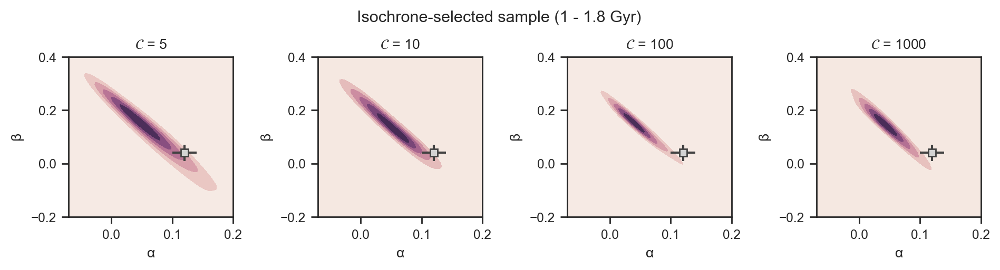

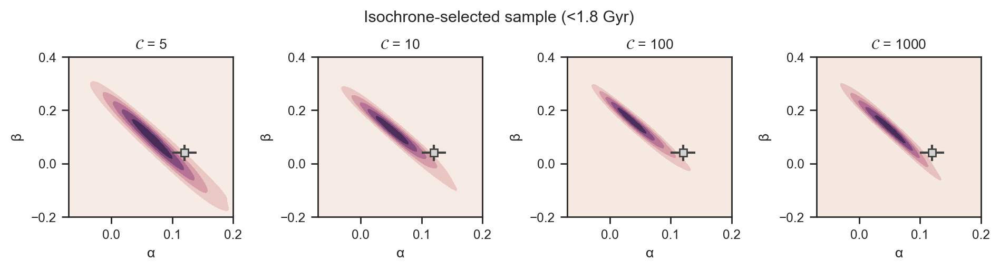

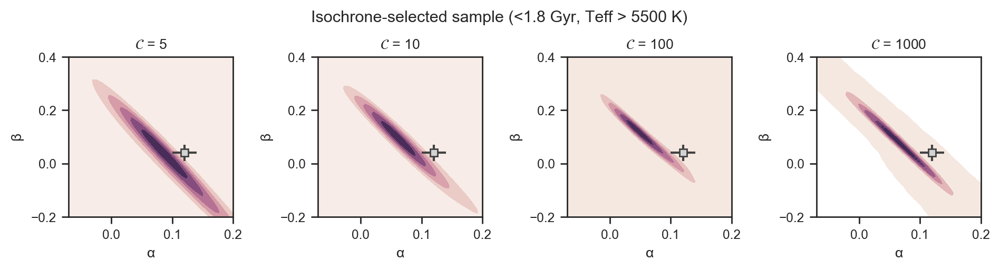

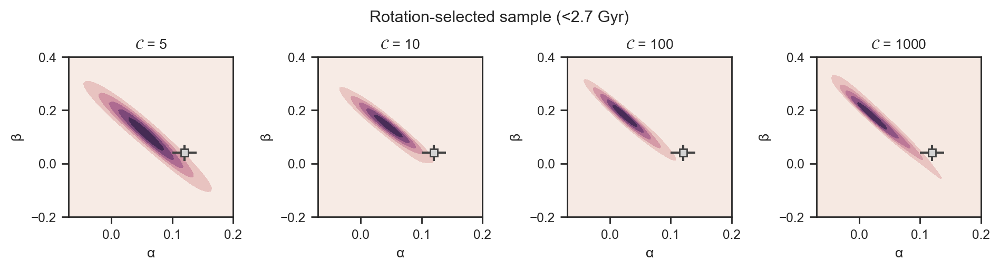

In [67]:
print('Sample A')
slopes_AA, intercepts_AA, margins_AA = svm_analysis(xdata=ziso, 
                                                    ydata=yiso, 
                                                    flag=flag_iso, 
                                                    fig_title='Isochrone-selected sample (1 - 1.8 Gyr)', 
                                                    plot_lit='sr', xrange=(-0.07,0.2), yrange=(-0.2,0.4))    

print('Sample B')
slopes_BB, intercepts_BB, margins_BB = svm_analysis(xdata=ziso_all, 
                                                    ydata=yiso_all, 
                                                    flag=flag_iso_all, 
                                                    fig_title='Isochrone-selected sample (<1.8 Gyr)', 
                                                    plot_lit='sr', xrange=(-0.07,0.2), yrange=(-0.2,0.4))    

print('Sample C')
slopes_CC, intercepts_CC, margins_CC = svm_analysis(xdata=zhot, 
                                                    ydata=yhot, 
                                                    flag=flag_hot, 
                                                    fig_title='Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)', 
                                                    plot_lit='sr', xrange=(-0.07,0.2), yrange=(-0.2,0.4))    

print('Sample D')
slopes_DD, intercepts_DD, margins_DD = svm_analysis(xdata=zgyro, 
                                                    ydata=ygyro, 
                                                    flag=flag_gyro, 
                                                    fig_title='Rotation-selected sample (<2.7 Gyr)', 
                                                    plot_lit='sr', xrange=(-0.07,0.2), yrange=(-0.2,0.4))    


### Plot the results of the SVM bootstrapping simulations

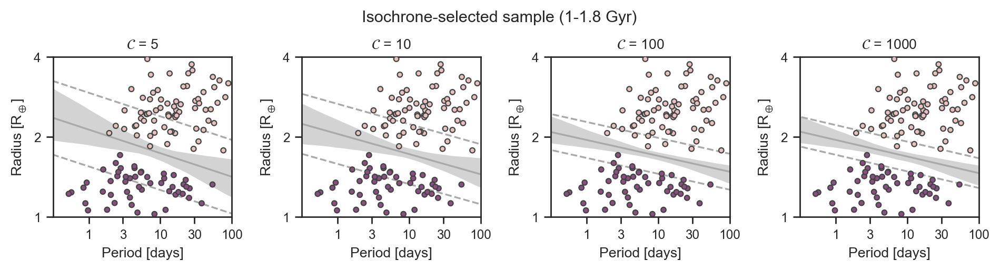

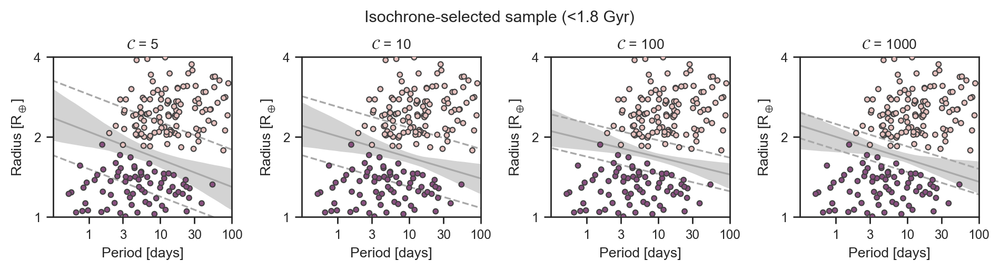

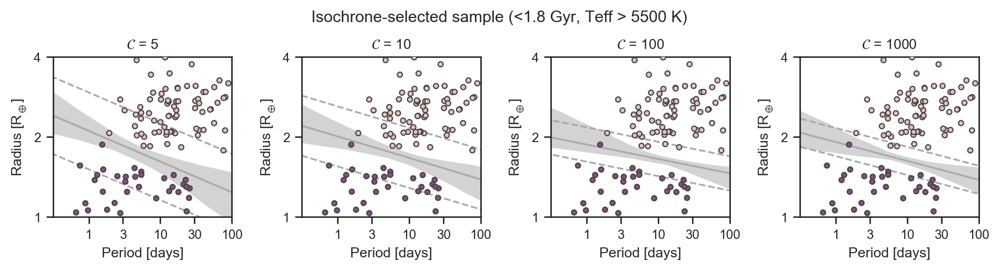

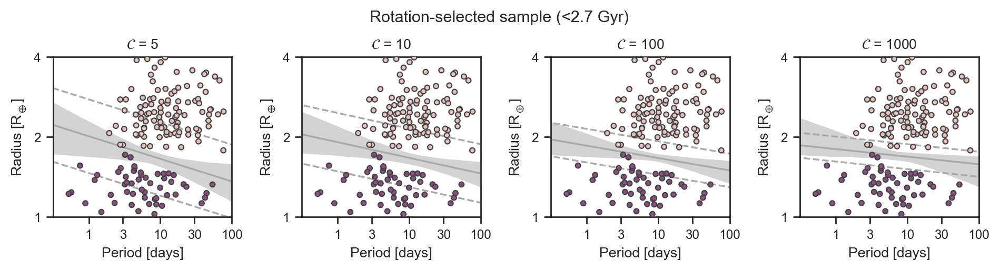

In [57]:
def plot_results(xdata, ydata, flag, 
                 slopes, intercepts, margins,
                 penalty=[5,10,100,1000],
                 xaxis='period',
                 plot_median=True,
                 plot_margins=True,
                 plot_lit=False,
                 fig_title=None,
                 fig_path=None,
                 scatter_kwargs={'rasterized':True}):
    
    #Function for plotting the results of the SVM bootstrapping analysis
    tt_cmap = sns.cubehelix_palette(2, light=0.8, dark=0.4, as_cmap=True)

    
    X = np.array([np.log10(xdata), np.log10(ydata)]).T
    Y = flag

    if xaxis=='period':
        xx = np.linspace(-2,2)
        xmin,xmax = -0.5,2
        xlabel = 'Period [days]'
        xticks = (np.log10([1,3,10,30,100]), ['1','3','10','30','100'])
    elif xaxis=='insolation':
        xx = np.linspace(-2,4)
        xmin,xmax = 3.9,0
        xlabel = 'S [S$_\mathregular{\oplus}$]'
        xticks = (np.log10([1,10,100,1000]), ['1','10','100','1000'])
    
    fig, ax = plt.subplots(nrows=1,ncols=len(penalty),
                           figsize=(2.4*len(penalty),2.4))

    for i,p in enumerate(penalty):

        _slopes = slopes[:][i]
        _intercepts = intercepts[:][i]
        _margins = margins[:][i]


        #for the umbalance it's the class_weight param in svm.SVC
        #plt.scatter(np.log10(xtmp), np.log10(ytmp))        
        yy = np.zeros([len(_slopes), len(xx)])
        for j in range(len(_slopes)):
            yy[j,:] = xx*_slopes[j] + _intercepts[j]

        ax[i].fill_between(xx, 
                         np.percentile(yy, 16., axis=0), 
                         np.percentile(yy, 84., axis=0), color='lightgrey')

        if plot_median==True:
            ax[i].plot(xx, np.median(_slopes)*xx + np.median(_intercepts), color='darkgrey')
        else:
            pass


        #Plot margins
        if plot_margins==True:
            ax[i].plot(xx, np.median(_slopes)*xx + np.median(_intercepts) + np.sqrt(1+np.median(_slopes)**2) * np.median(_margins), '--', color='darkgrey')
            ax[i].plot(xx, np.median(_slopes)*xx + np.median(_intercepts) - np.sqrt(1+np.median(_slopes)**2) * np.median(_margins), '--', color='darkgrey')
        else:
            pass


        ax[i].scatter(X[:, 0], 
                      X[:, 1], 
                      c=Y, 
                      s=12, 
                      zorder=10, 
                      cmap=tt_cmap,
                      edgecolors='#424242',
                      **scatter_kwargs)

        ax[i].set_xlabel(xlabel)
        ax[i].set_ylabel(r'Radius [$\mathregular{R_\oplus}$]')
        ax[i].set_xticks(xticks[0])
        ax[i].set_xticklabels(xticks[1])
        #ax[i].set_yticks(np.log10([0.5,1,2,4,8]))
        #ax[i].set_yticklabels(['0.5','1','2','4','8'])
        ax[i].set_yticks(np.log10([0.5,1,2,4]))
        ax[i].set_yticklabels(['0.5','1','2','4'])        

        #Van Eylen 2018 RV
        if plot_lit==True:
            ax[i].plot(np.log10([0.1,100]),np.log10(v18_valley([0.1,100])),'k')
        else:
            pass

        ax[i].set_xlim(xmin,xmax)
        #ax[i].set_xlim(xdata.min()-0.5,xdata.max()+0.5)
        ax[i].set_ylim(np.log10(1),np.log10(4))
        ax[i].set_title(r'$\mathcal{C}$ = '+str(p))

    if fig_title:
        plt.figtext(0.5, 1.02, fig_title, ha='center', va='center', size=11)
    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    return

plot_results(xdata=xiso, ydata=yiso, flag=flag_iso, 
             slopes=slopes_A, intercepts=intercepts_A, margins=margins_A, 
             fig_title='Isochrone-selected sample (1-1.8 Gyr)', fig_path='../figures/errors-a.pdf')    

plot_results(xdata=xiso_all, ydata=yiso_all, flag=flag_iso_all, 
             slopes=slopes_B, intercepts=intercepts_B, margins=margins_B, 
             fig_title='Isochrone-selected sample (<1.8 Gyr)', fig_path='../figures/errors-b.pdf')    


plot_results(xdata=xhot, ydata=yhot, flag=flag_hot, slopes=slopes_C, 
             intercepts=intercepts_C, margins=margins_C, 
             fig_title='Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)', fig_path='../figures/errors-c.pdf')    

plot_results(xdata=xgyro, ydata=ygyro, flag=flag_gyro, slopes=slopes_D, 
             intercepts=intercepts_D, margins=margins_D, 
             fig_title='Rotation-selected sample (<2.7 Gyr)', fig_path='../figures/errors-d.pdf')    

### Insolation-radius plane

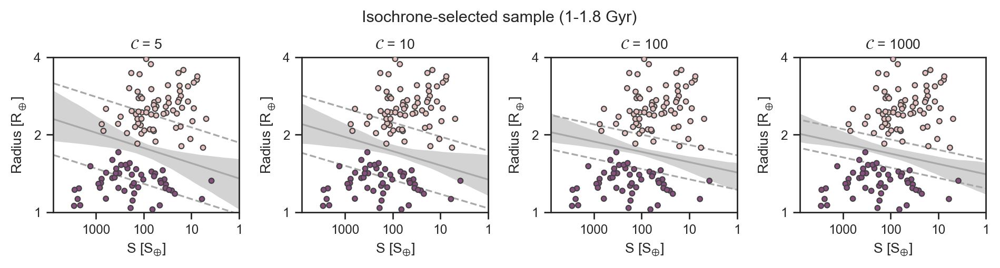

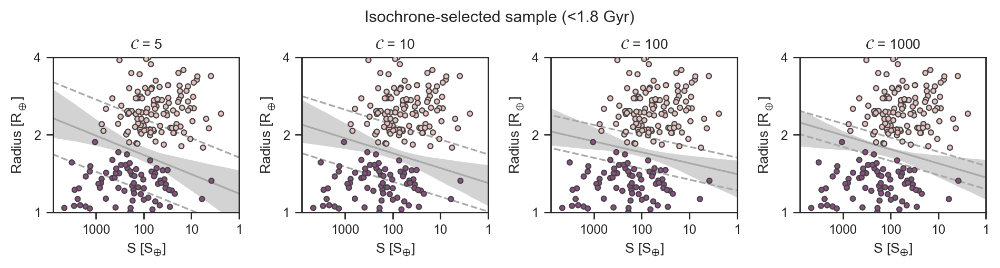

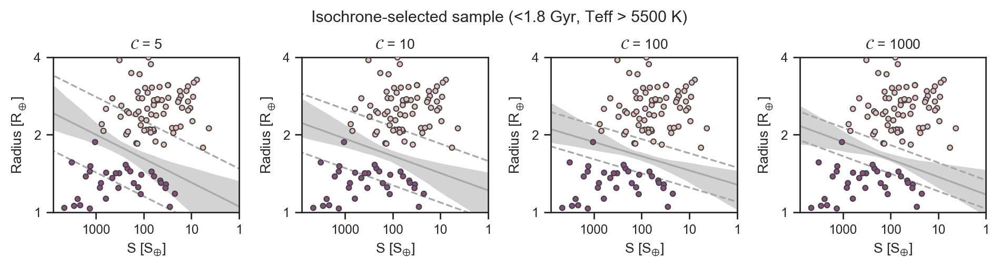

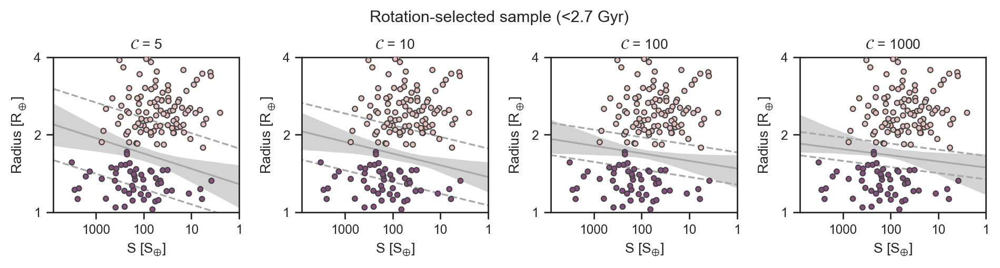

In [58]:
plot_results(xdata=ziso, ydata=yiso, flag=flag_iso, 
             slopes=slopes_AA, intercepts=intercepts_AA, margins=margins_AA, 
             fig_title='Isochrone-selected sample (1-1.8 Gyr)', 
             fig_path='../figures/serrors-a.pdf',
             xaxis='insolation')

plot_results(xdata=ziso_all, ydata=yiso_all, flag=flag_iso_all, 
             slopes=slopes_BB, intercepts=intercepts_BB, margins=margins_BB, 
             fig_title='Isochrone-selected sample (<1.8 Gyr)', 
             fig_path='../figures/serrors-b.pdf',
             xaxis='insolation')

plot_results(xdata=zhot, ydata=yhot, flag=flag_hot, 
             slopes=slopes_CC, intercepts=intercepts_CC, margins=margins_CC, 
             fig_title='Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)', 
             fig_path='../figures/serrors-c.pdf',
             xaxis='insolation')

plot_results(xdata=zgyro, ydata=ygyro, flag=flag_gyro, 
             slopes=slopes_DD, intercepts=intercepts_DD, margins=margins_DD, 
             fig_title='Rotation-selected sample (<2.7 Gyr)', 
             fig_path='../figures/serrors-d.pdf',
             xaxis='insolation')

### Effect of regularization parameter on the margins of the radius valley
(Fig. 11)

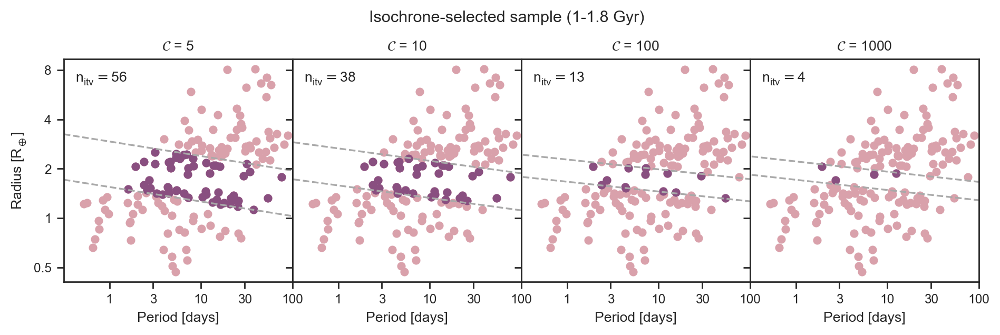

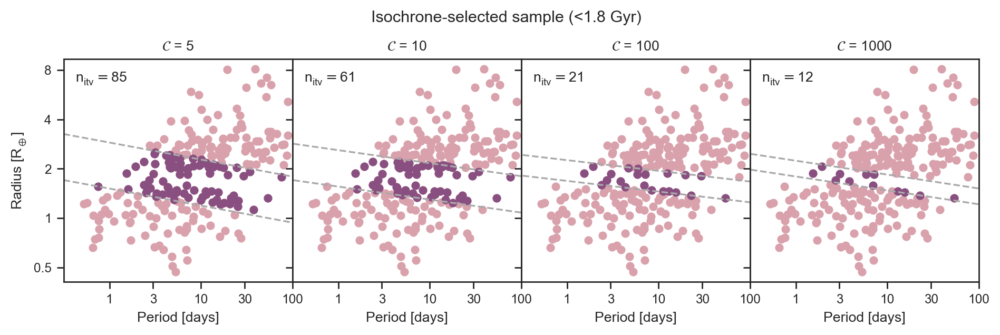

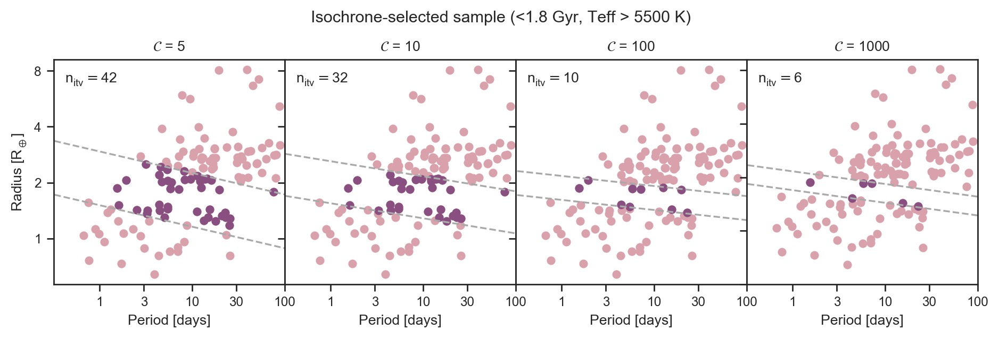

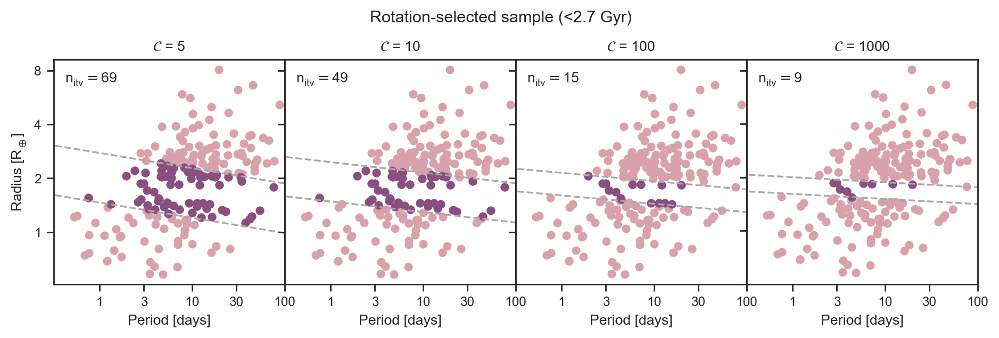

In [68]:
def plot_margins(xdata, 
                 ydata, 
                 slopes, 
                 intercepts, 
                 margins, 
                 penalty=[5,10,100,1000],
                 fig_title=None,
                 fig_path=None,
                 scatter_kwargs={'rasterized':True}):
    
    xx = np.linspace(-2,2)
    npl_itv = np.zeros(len(penalty))
    
    fig, ax = plt.subplots(nrows=1,ncols=len(penalty),
                       figsize=(2.8*len(penalty),2.8), sharey=True)

    for i,p in enumerate(penalty):

        _slopes = slopes[:][i]
        _intercepts = intercepts[:][i]
        _margins = margins[:][i]

        smed = np.median(_slopes)
        imed = np.median(_intercepts)
        mmed = np.median(_margins)

        def upper_margin(p):
            return smed*p + imed + np.sqrt(1+smed**2) * mmed

        def lower_margin(p):
            return smed*p + imed - np.sqrt(1+smed**2) * mmed

        in_the_valley = (np.log10(ydata)>lower_margin(np.log10(xdata))) & (np.log10(ydata)<upper_margin(np.log10(xdata)))

        #Record the number of planets in the valley
        npl_itv[i] = len(xdata[in_the_valley])

        ax[i].plot(np.log10(xdata),np.log10(ydata),'o', color=tt_cpal[0], **scatter_kwargs)
        ax[i].plot(np.log10(xdata[in_the_valley]),np.log10(ydata[in_the_valley]),'o', color=tt_cpal[1], **scatter_kwargs)

        ax[i].plot(xx, np.median(_slopes)*xx + np.median(_intercepts) + np.sqrt(1+np.median(_slopes)**2) * np.median(_margins), '--', color='darkgrey')
        ax[i].plot(xx, np.median(_slopes)*xx + np.median(_intercepts) - np.sqrt(1+np.median(_slopes)**2) * np.median(_margins), '--', color='darkgrey')
        ax[i].set_xlim(-0.5,2)

        ax[i].set_xticks(np.log10([1,3,10,30,100]))
        ax[i].set_xticklabels(['1','3','10','30','100'])
        ax[i].set_yticks(np.log10([0.5,1,2,4,8]))
        if i==0:
            ax[i].set_yticklabels(['0.5','1','2','4','8'])
            ax[i].set_ylabel(r'Radius [$\mathregular{R_\oplus}$]')

        ax[i].set_xlabel('Period [days]')
        ax[i].set_title(r'$\mathcal{C}$ = '+str(p))
        ax[i].text(0.05,0.9,r'$\mathregular{n_{itv}} = $'+str(int(npl_itv[i])), transform=ax[i].transAxes)

    plt.subplots_adjust(wspace=0)
    if fig_title:
        plt.figtext(0.5, 1.02, fig_title, ha='center', va='center', size=11)
    if fig_path:
        plt.savefig(fig_path)
    plt.show()

    return npl_itv


nitv_iso = plot_margins(xiso, yiso, slopes_A, intercepts_A, margins_A, 
                        fig_title='Isochrone-selected sample (1-1.8 Gyr)',
                        fig_path='../figures/margins-a.pdf')

nitv_iso_all = plot_margins(xiso_all, yiso_all, slopes_B, intercepts_B, margins_B, 
                            fig_title='Isochrone-selected sample (<1.8 Gyr)',
                            fig_path='../figures/margins-b.pdf')

nitv_hot = plot_margins(xhot, yhot, slopes_C, intercepts_C, margins_C, 
                         fig_title='Isochrone-selected sample (<1.8 Gyr, Teff > 5500 K)',
                         fig_path='../figures/margins-c.pdf')

nitv_gyro = plot_margins(xgyro, ygyro, slopes_D, intercepts_D, margins_D, 
                         fig_title='Rotation-selected sample (<2.7 Gyr)',
                         fig_path='../figures/margins-d.pdf')

### What is the likelihood that the sparsity of the observed gap is due to random chance?

Accounting for RV uncertainties
5 27.3
10 11.17
100 0.24
1000 0.04
--------------------------------------------------------------------------------
5 31.36
10 16.33
100 0.68
1000 4.06
--------------------------------------------------------------------------------
5 21.2
10 21.5
100 0.84
1000 3.82
--------------------------------------------------------------------------------
5 33.45
10 16.03
100 0.34
1000 4.58
--------------------------------------------------------------------------------
Not accounting for RV uncertainties
5 30.16
10 3.03
100 0.09
1000 0.0
--------------------------------------------------------------------------------
5 18.4
10 6.5
100 0.08
1000 0.01
--------------------------------------------------------------------------------
5 15.1
10 13.56
100 0.23
1000 0.12
--------------------------------------------------------------------------------
5 21.89
10 4.49
100 0.03
1000 0.08
--------------------------------------------------------------------------------


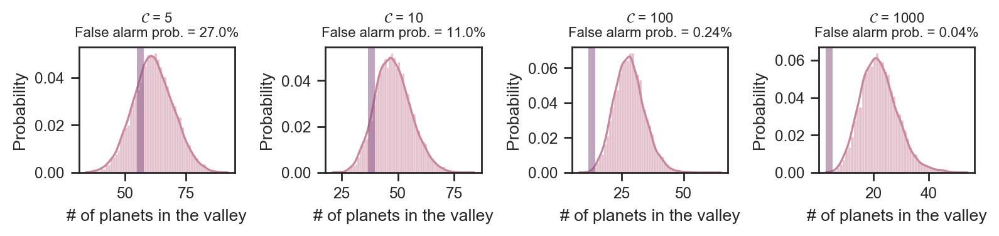

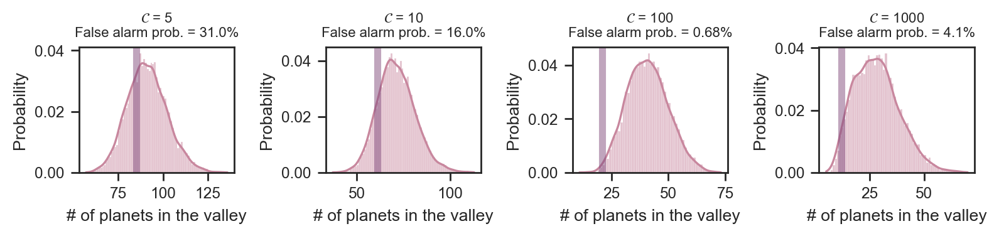

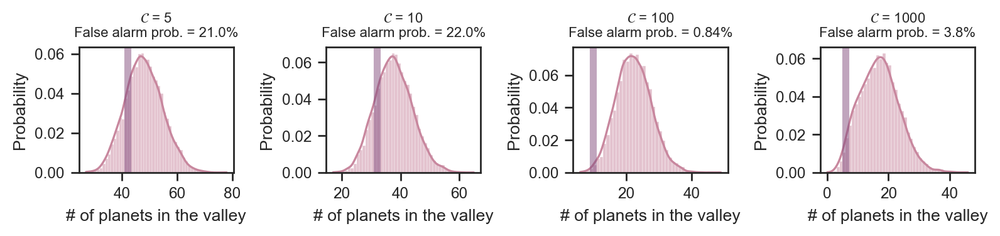

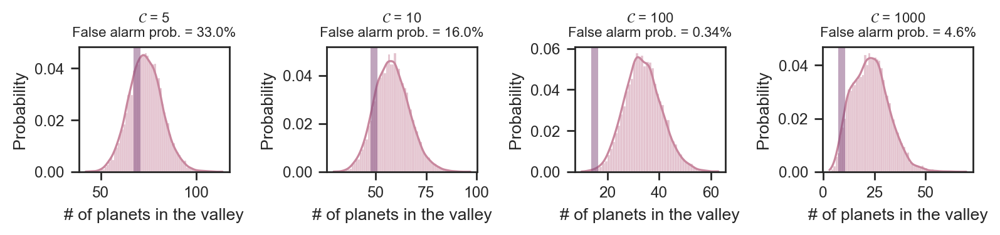

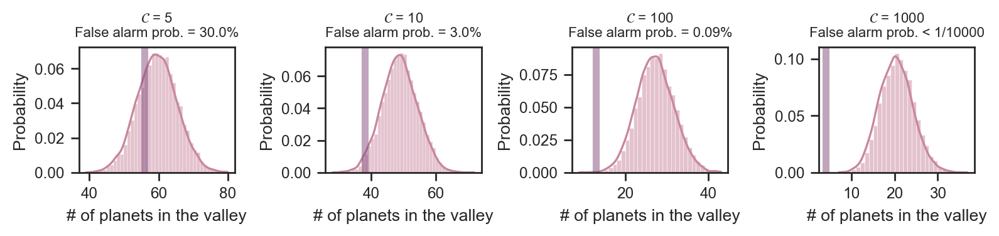

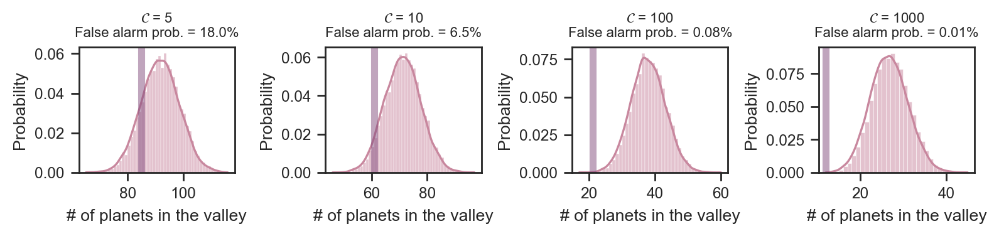

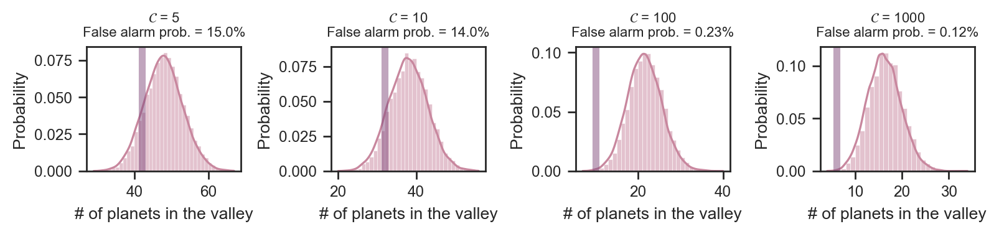

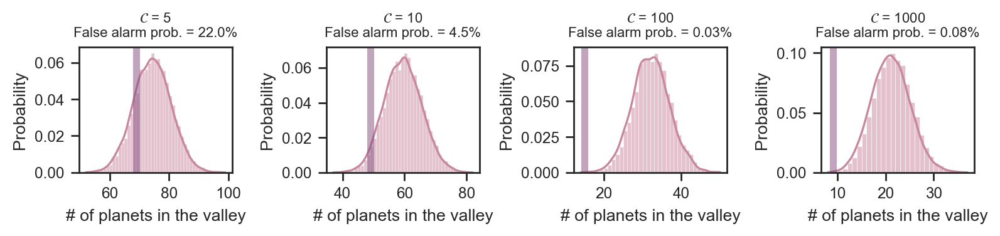

In [69]:
from tqdm import tqdm

def false_alarm_prob(xdata, ydata, slopes, intercepts, margins,
                     npl_itv,
                     penalty=[5,10,100,1000],
                     nsim=int(1e4),
                     control='cks',
                     rv_uncertainty=False,
                     fig_title=None,
                     fig_path=None):
    
    
    np.random.seed(1701)
    

    fig, ax = plt.subplots(nrows=1,ncols=4)

    for i in range(len(penalty)):

        _slopes = slopes[:][i]
        _intercepts = intercepts[:][i]
        _margins = margins[:][i]

        p = penalty[i]

#         def upper_margin(p):
#             return smed*p + imed + np.sqrt(1+smed**2) * mmed

#         def lower_margin(p):
#             return smed*p + imed - np.sqrt(1+smed**2) * mmed

        
        if control=='cks':
            mask = common_cuts
                    
        elif control=='cks-old':
            mask = common_cuts & (cks['f18_logAiso']>9.25)

        #Simulate 
        x_cks = np.random.normal(cks['f18_P'][mask], np.max([cks['f18_e_P'][mask], cks['f18_E_P'][mask]],axis=0))
        y_cks = np.random.normal(cks['f18_Rp'][mask], np.max([cks['f18_e_Rp'][mask], cks['f18_E_Rp'][mask]],axis=0))

        itv = []

        for j in range(nsim):

            arg = np.random.choice(len(x_cks), len(xdata), replace=False)
            _x = x_cks[arg]
            _y = y_cks[arg]
            
            
            
            if rv_uncertainty==True:
                rvarg = np.random.choice(len(_slopes))
            
                smed = _slopes[rvarg]
                imed = _intercepts[rvarg]
                mmed = _margins[rvarg]
            else:
                smed = np.median(_slopes)
                imed = np.median(_intercepts)
                mmed = np.median(_margins)

            def upper_margin(p):
                return smed*p + imed + np.sqrt(1+smed**2) * mmed

            def lower_margin(p):
                return smed*p + imed - np.sqrt(1+smed**2) * mmed            
              

            in_the_valley = (np.log10(_y)>lower_margin(np.log10(_x))) & (np.log10(_y)<upper_margin(np.log10(_x)))
            itv.append(len(_y[in_the_valley]))

        itv = np.array(itv)  

        sns.histplot(itv, bins=np.arange(itv.min(),itv.max()), kde=True, color=cpal[1], stat='probability', ax=ax[i])
        ax[i].axvline(npl_itv[i], color=cpal[2], lw=4, alpha=0.5)
        ax[i].set_xlabel('# of planets in the valley')

        if i==0:
            ax[i].set_ylabel('Probability')

        if len(itv[itv<=npl_itv[i]])>0:
            ax[i].set_title(r'$\mathcal{C}$ = '+str(int(p))+'\n'+
                              'False alarm prob. = '+ str(round(100.*float(len(itv[itv<=npl_itv[i]])/len(itv)),
                                                                      int(abs(np.log10(len(itv[itv<=npl_itv[i]])/len(itv))))))+'%', size=8)

        elif len(itv[itv<=npl_itv[i]])==0:
            ax[i].set_title(r'$\mathcal{C}$ = '+str(int(p))+'\n'+
                              'False alarm prob. < 1/'+ str(len(itv)), size=8)

        
        #print(p, 100.*len(itv[itv<=npl_itv[i]])/len(itv), npl_itv[i], len(itv[itv<=npl_itv[i]]), len(itv))
        print(p, 100.*len(itv[itv<=npl_itv[i]])/len(itv))
        
    print('--'*40)
    plt.subplots_adjust()
    plt.gcf().set_size_inches(8,2)
    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    
    return


print('Accounting for RV uncertainties')
print('Sample A')
false_alarm_prob(xiso, yiso, slopes_A, intercepts_A, margins_A, npl_itv=nitv_iso, rv_uncertainty=True)
print('Sample B')
false_alarm_prob(xiso_all, yiso_all, slopes_B, intercepts_B, margins_B, npl_itv=nitv_iso_all, rv_uncertainty=True)
print('Sample C')
false_alarm_prob(xhot, yhot, slopes_C, intercepts_C, margins_C, npl_itv=nitv_hot, rv_uncertainty=True)
print('Sample D')
false_alarm_prob(xgyro, ygyro, slopes_D, intercepts_D, margins_D, npl_itv=nitv_gyro, rv_uncertainty=True)

print('Not accounting for RV uncertainties')
print('Sample A')
false_alarm_prob(xiso, yiso, slopes_A, intercepts_A, margins_A, npl_itv=nitv_iso, rv_uncertainty=False)
print('Sample B')
false_alarm_prob(xiso_all, yiso_all, slopes_B, intercepts_B, margins_B, npl_itv=nitv_iso_all, rv_uncertainty=False)
print('Sample C')
false_alarm_prob(xhot, yhot, slopes_C, intercepts_C, margins_C, npl_itv=nitv_hot, rv_uncertainty=False)
print('Sample D')
false_alarm_prob(xgyro, ygyro, slopes_D, intercepts_D, margins_D, npl_itv=nitv_gyro, rv_uncertainty=False)

### How do the stellar properties for stars hosting planets in the valley compare to the overall CKS sample?

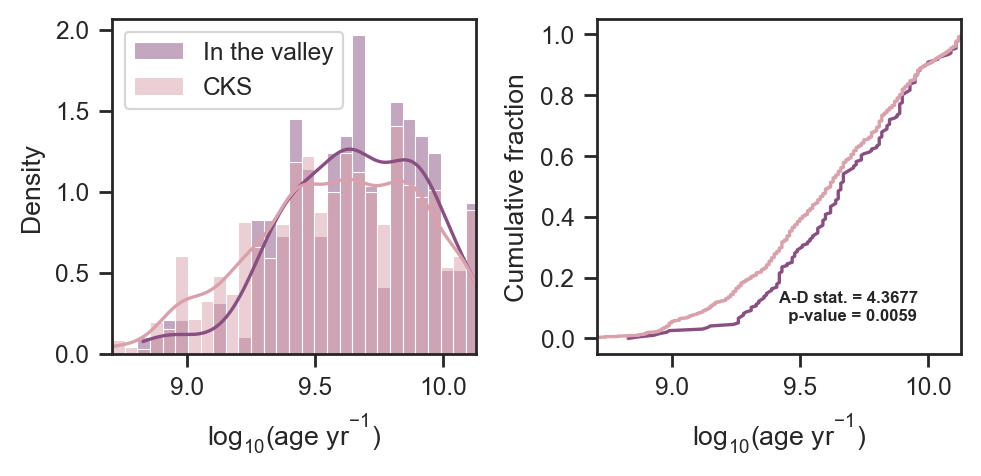

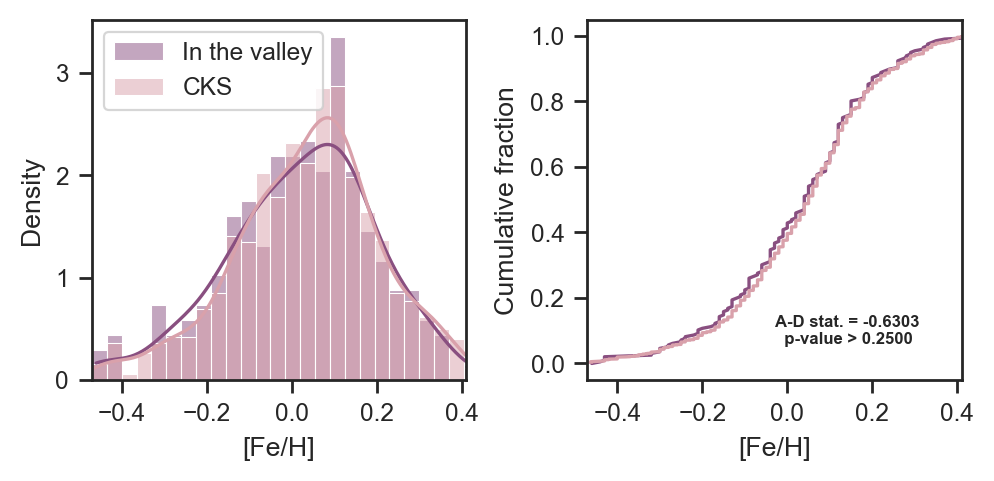

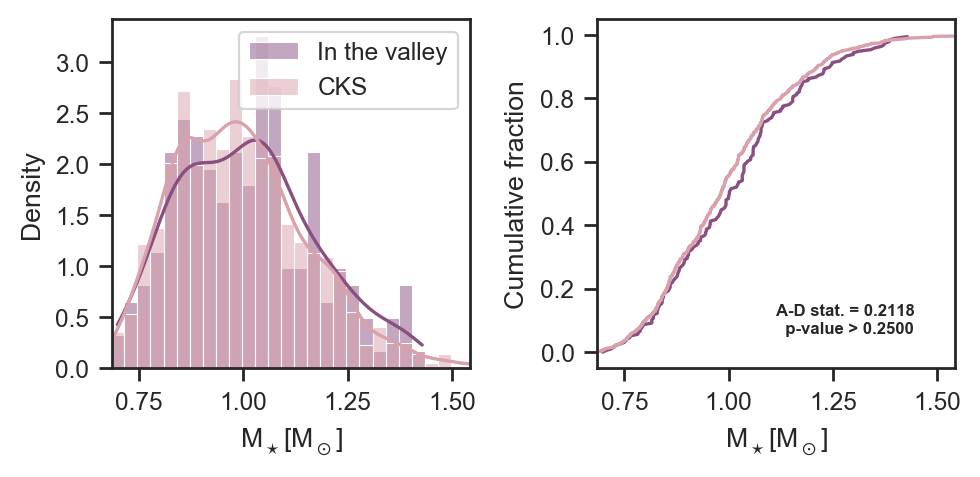

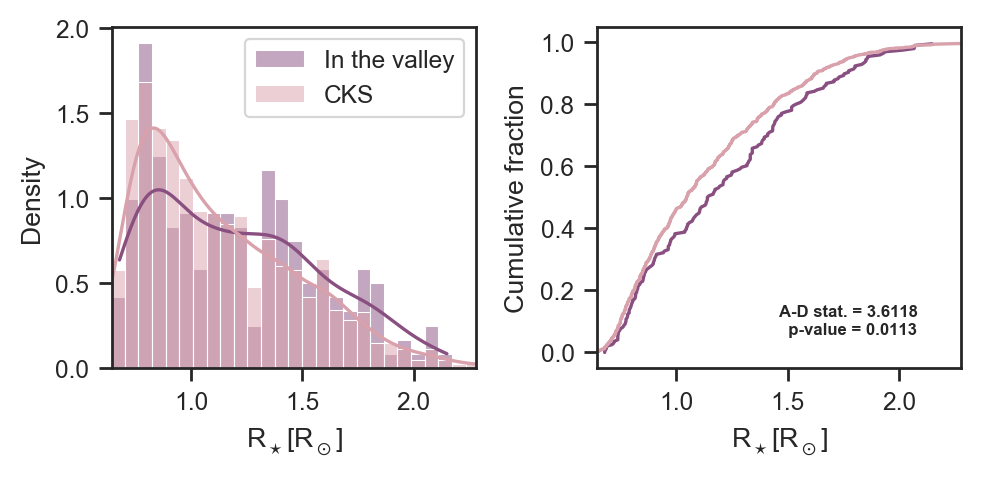

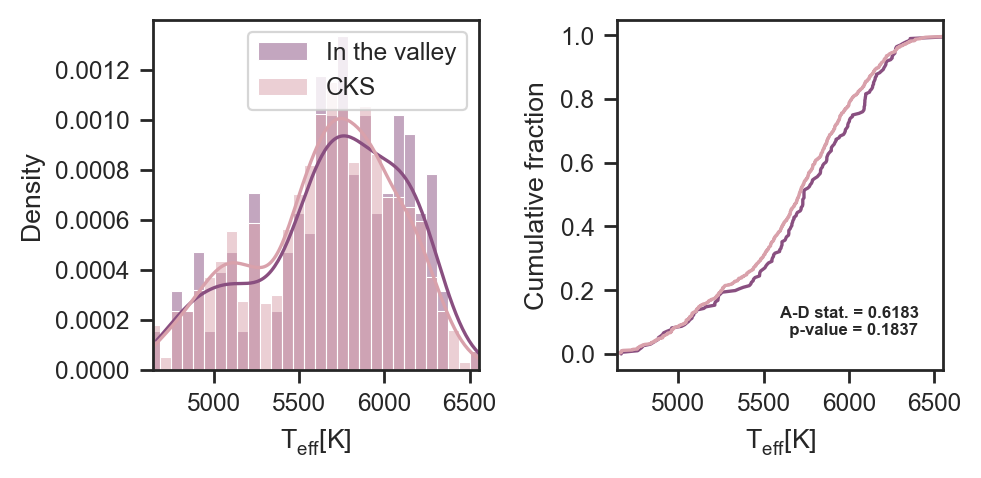

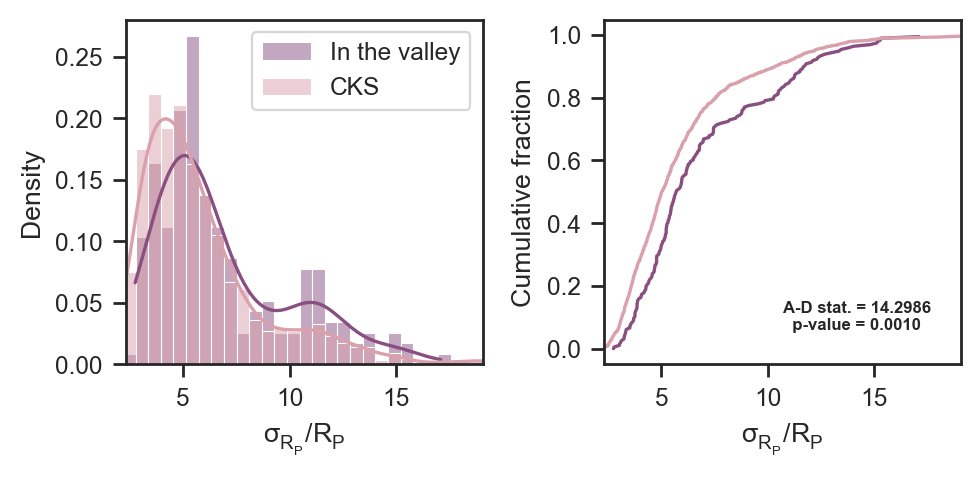

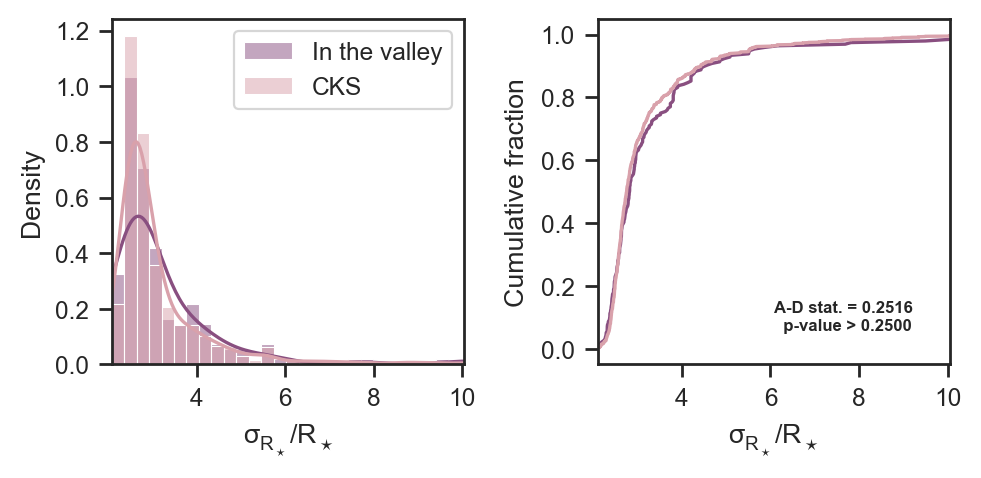

In [70]:
from scipy import stats

def cdf(x, nbins=100, normed=True, method=2):
    
    # Methods 1 & 2 return normalized CDF
    
    if method==1:    
        h,x1 = np.histogram(x, bins = nbins, normed=normed)
        dx = x1[1]-x1[0]
        f1 = np.cumsum(h)*dx
        cdfx, cdfy = x1[1:], f1

    elif method==2:
        x2 = np.sort(x)
        f2 = np.array(range(len(x)))/float(len(x))
        cdfx, cdfy = x2, f2
        
    elif method==3:
        from scipy import stats
        res  = stats.cumfreq(x, numbins=nbins)
        cdfx = res.lowerlimit + np.linspace(0, res.binsize*res.cumcount.size, res.cumcount.size)
        cdfy = res.cumcount
            
    return cdfx, cdfy


def distribution_plot(par, 
           slopes, 
           intercepts, 
           margins, 
           par_label,
           fig_title=None,
           fig_path=None):

    
    fig, ax = plt.subplots(nrows=1,ncols=2,
                       figsize=(2.5*2,2.5))


    _slopes = slopes[:][3]
    _intercepts = intercepts[:][3]
    _margins = margins[:][3]

    smed = np.median(_slopes)
    imed = np.median(_intercepts)
    mmed = np.median(_margins)

    def upper_margin(p):
        return smed*p + imed + np.sqrt(1+smed**2) * mmed

    def lower_margin(p):
        return smed*p + imed - np.sqrt(1+smed**2) * mmed

    if par in ['prot', 'a18_period', 'm13_Prot', 'm15_Prot', 'w13_Per']:
        cc = common_cuts & (np.isfinite(cks[par])) & (cks['f18_Teff']<6000)
        
        cc = (common_cuts) & (np.isfinite(cks[par])) & (cks['f18_Teff']<6000)
    else:
        cc = (common_cuts) & (np.isfinite(cks[par]))
    
    xdata=cks['f18_P'][cc] 
    ydata=cks['f18_Rp'][cc]

    in_the_valley = cc &\
                    (np.log10(ydata)>lower_margin(np.log10(xdata))) &\
                    (np.log10(ydata)<upper_margin(np.log10(xdata)))


    bins = np.linspace(np.min(cks[par][cc]), np.max(cks[par][cc]), 31)
    
    xmin,xmax = np.nanpercentile(cks[par][cc], [0.25,99.75])
    

    sns.histplot(cks[par][in_the_valley], color=tt_cpal[1], ax=ax[0], kde=True, stat='density', bins=bins, label='In the valley')
    sns.histplot(cks[par][cc], color=tt_cpal[0], ax=ax[0], kde=True, stat='density', bins=bins, label='CKS')

    _cdfx_itv,_cdfy_itv = cdf(cks[par][in_the_valley])
    _cdfx, _cdfy = cdf(cks[par][cc])

    ad_result = stats.anderson_ksamp([cks[par][in_the_valley], cks[par][cc]])
    
    if ad_result.significance_level==0.25:
        symbol = ' > '
    else:
        symbol = ' = '
    
    ax[1].text(0.5,0.1,'A-D stat. = '+"%.4f" % ad_result.statistic+
         '\n  p-value'+symbol+"%.4f" % ad_result.significance_level, 
         size=6, weight='bold', transform=ax[1].transAxes)
    
    
    ax[1].plot(_cdfx_itv, _cdfy_itv, color=tt_cpal[1])
    ax[1].plot(_cdfx, _cdfy, color=tt_cpal[0])
    ax[1].set_ylabel('Cumulative fraction')
    
    ax[0].set_xlabel(par_label)
    ax[0].set_xlim(xmin,xmax)
    ax[1].set_xlim(xmin,xmax)
    ax[1].set_xlabel(par_label)
    

    ax[0].legend()
    
    plt.tight_layout()
        
    if fig_title:
        plt.figtext(0.5, 1.02, fig_title, ha='center', va='center', size=11)
    if fig_path:
        plt.savefig(fig_path)
    plt.show()

    return


distribution_plot('f18_logAiso', slopes_A, intercepts_A, margins_A, par_label=r'$\mathregular{log_{10}(age~yr^{-1})}$', fig_path='../figures/dist-age.pdf')
distribution_plot('f18_[Fe/H]', slopes_A, intercepts_A, margins_A, par_label='[Fe/H]', fig_path='../figures/dist-feh.pdf')
distribution_plot('f18_Miso', slopes_A, intercepts_A, margins_A, par_label='$\mathregular{M_\star [M_\odot]}$', fig_path='../figures/dist-mass.pdf')
distribution_plot('f18_R', slopes_A, intercepts_A, margins_A, par_label='$\mathregular{R_\star [R_\odot]}$', fig_path='../figures/dist-rstar.pdf')
distribution_plot('f18_Teff', slopes_A, intercepts_A, margins_A, par_label='$\mathregular{T_{eff} [K]}$')
distribution_plot('rp_prec', slopes_A, intercepts_A, margins_A, par_label='$\mathregular{\sigma_{R_P}/R_P}$', fig_path='../figures/dist-rpprec.pdf')
distribution_plot('rs_prec', slopes_A, intercepts_A, margins_A, par_label='$\mathregular{\sigma_{R_\star}/R_\star}$', fig_path='../figures/dist-rsprec.pdf')

#distribution_plot(np.log10(cks['l20_Rvar']), slopes_A, intercepts_A, margins_A, par_label='Rvar')
#distribution_plot(np.log10(cks['m15_Rvar']), slopes_A, intercepts_A, margins_A, par_label=r'$\mathregular{log_{10}}$(Rvar/ppm)', fig_path='../figures/dist-rvar.pdf')
#distribution_plot(cks['f18_R'], slopes_A, intercepts_A, margins_A, par_label=r'$\mathregular{R_\star [R_\odot]}$', fig_path='../figures/dist-rstar.pdf')
#distribution_plot(100.*np.max([cks['f18_E_R'],cks['f18_e_R']],axis=0)/cks['f18_R'], slopes_A, intercepts_A, margins_A, par_label='$\mathregular{\sigma_{R_\star}/R_\star}$ [%]', fig_path='../figures/dist-rsprec.pdf')

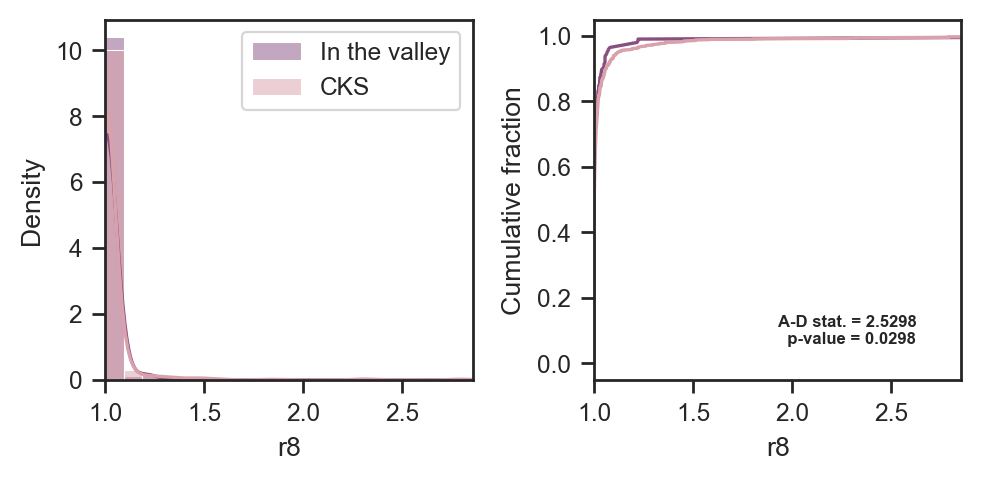

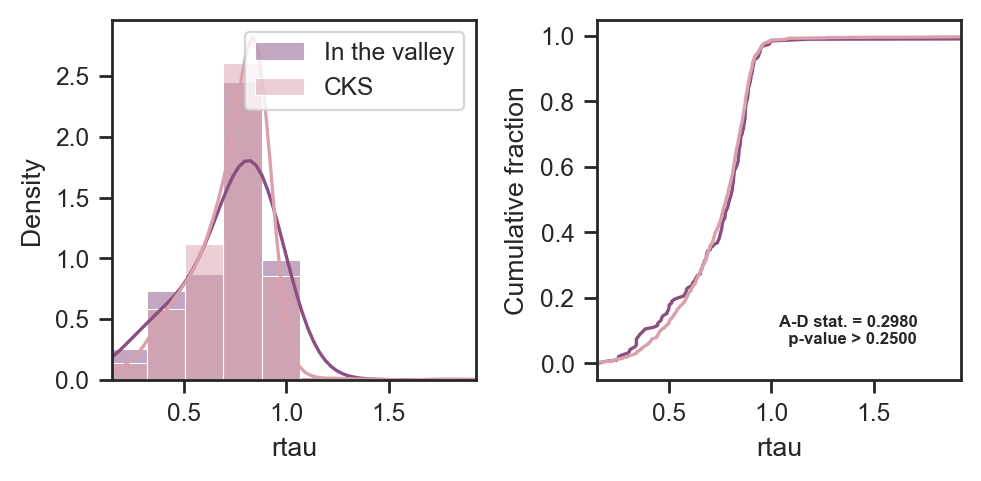

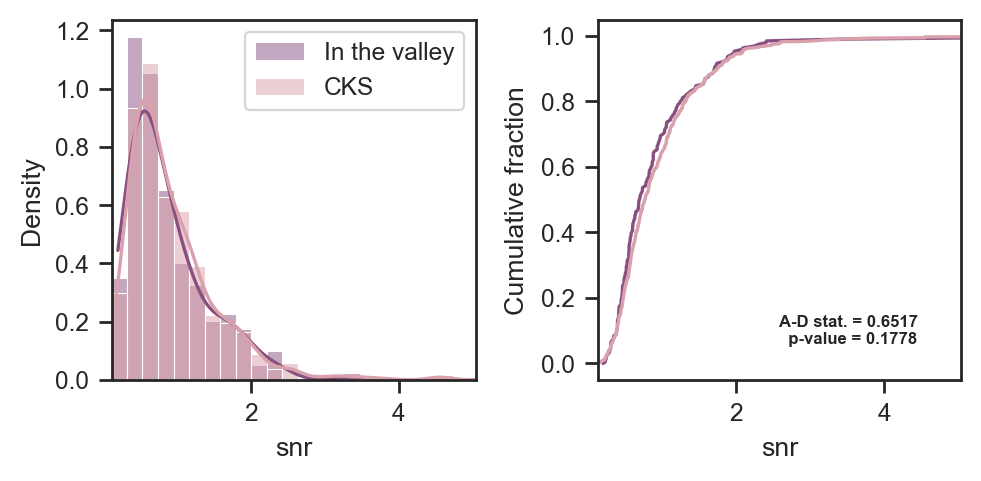

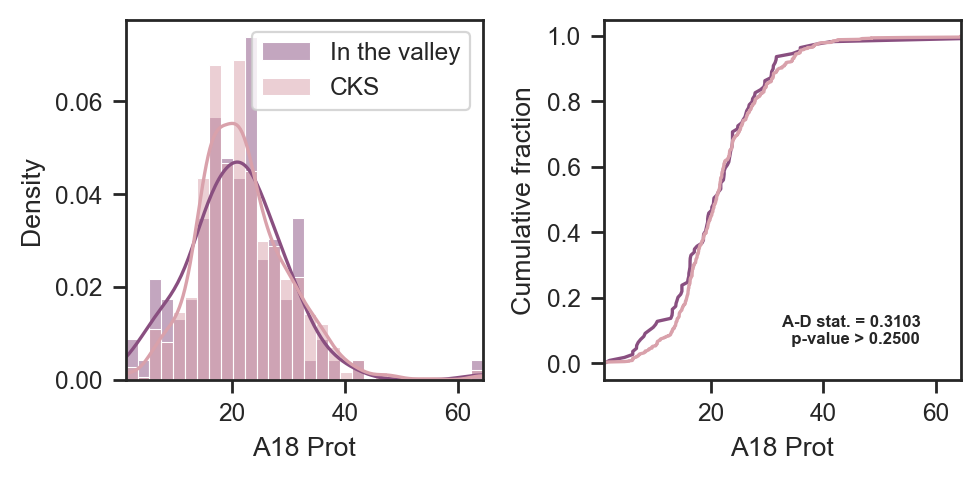

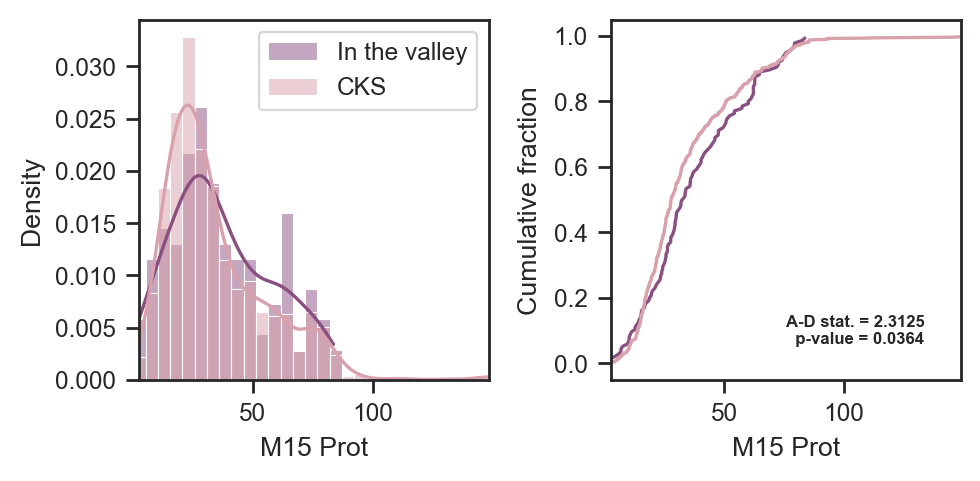

...

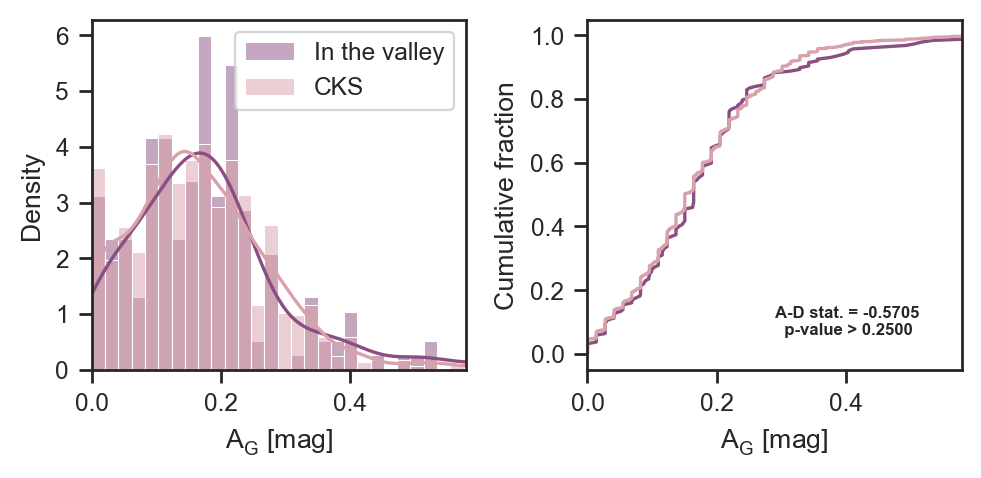

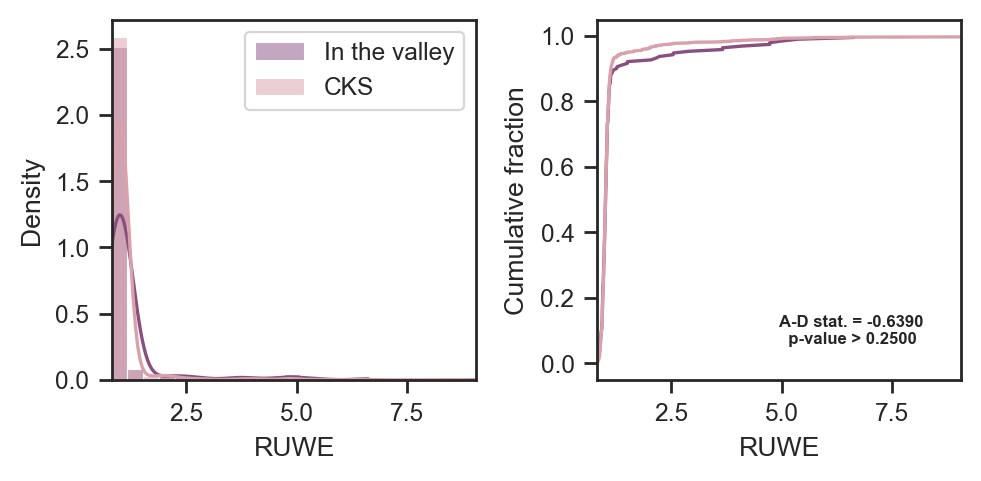

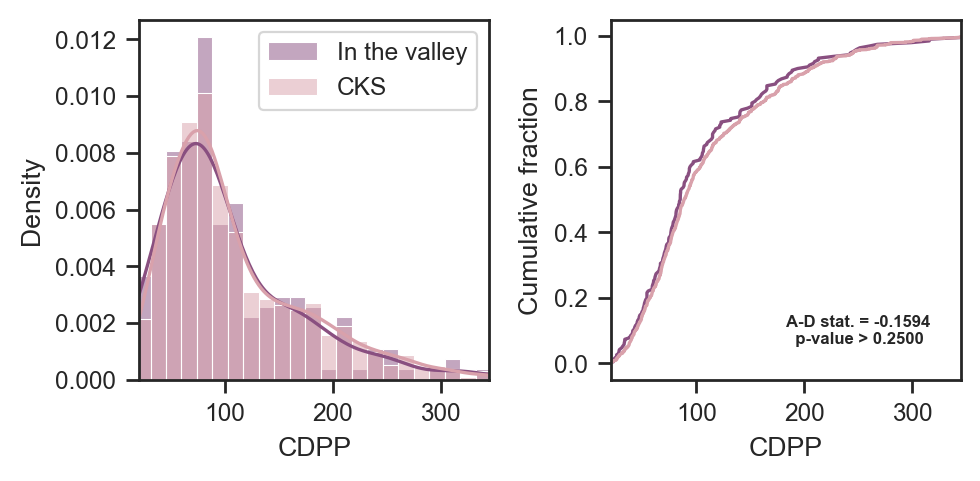

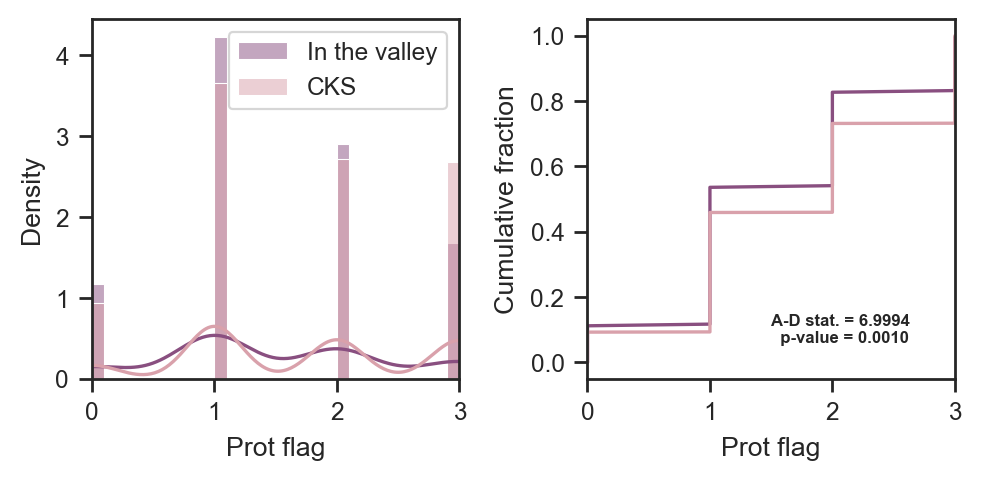

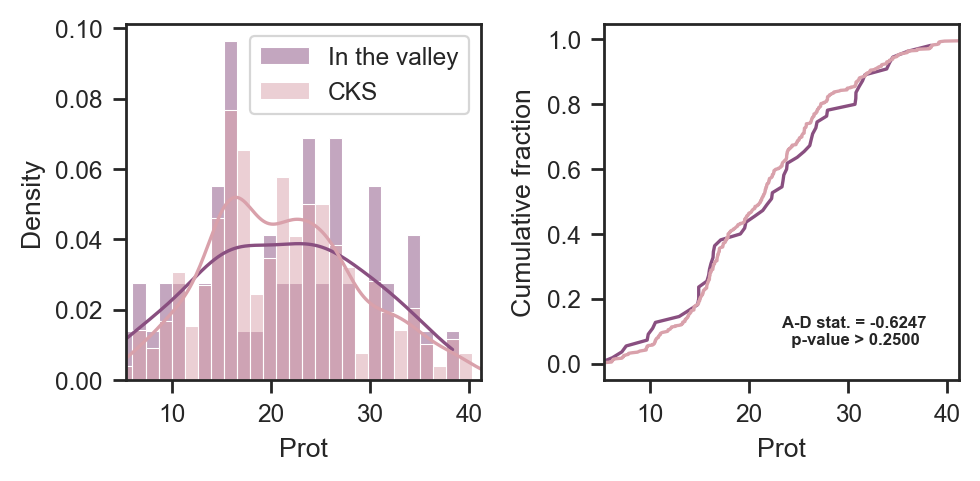

In [71]:
distribution_plot('f18_r8', slopes_A, intercepts_A, margins_A, par_label='r8')
distribution_plot('p20_Rtau', slopes_A, intercepts_A, margins_A, par_label='rtau')
distribution_plot('single_transit_snr', slopes_A, intercepts_A, margins_A, par_label='snr')
distribution_plot('a18_period', slopes_A, intercepts_A, margins_A, par_label='A18 Prot')
distribution_plot('m15_Prot', slopes_A, intercepts_A, margins_A, par_label='M15 Prot')
distribution_plot('m13_Prot', slopes_A, intercepts_A, margins_A, par_label='M13 Prot')
distribution_plot('m15_Rvar', slopes_A, intercepts_A, margins_A, par_label='Rvar')
distribution_plot('l20_Av', slopes_A, intercepts_A, margins_A, par_label=r'$\mathregular{A_G~[mag]}$')
distribution_plot('d20_ruwe', slopes_A, intercepts_A, margins_A, par_label='RUWE')
distribution_plot('stlr_rrmscdpp03p0', slopes_A, intercepts_A, margins_A, par_label='CDPP')
distribution_plot('prot_numflag', slopes_A, intercepts_A, margins_A, par_label='Prot flag')
distribution_plot('prot', slopes_A, intercepts_A, margins_A, par_label='Prot')

### Table 4 (Anderson-Darling tests)

In [72]:
def ad_table(par, 
             slopes, 
             intercepts, 
             margins):

    
    _slopes = slopes[:][3]
    _intercepts = intercepts[:][3]
    _margins = margins[:][3]

    smed = np.median(_slopes)
    imed = np.median(_intercepts)
    mmed = np.median(_margins)

    def upper_margin(p):
        return smed*p + imed + np.sqrt(1+smed**2) * mmed

    def lower_margin(p):
        return smed*p + imed - np.sqrt(1+smed**2) * mmed


    try:
        if par in ['prot', 'a18_period', 'm13_Prot', 'm15_Prot', 'w13_Per']:
            cc = common_cuts & (np.isfinite(cks[par])) & (cks['f18_Teff']<6000)
        else:
            cc = common_cuts & (np.isfinite(cks[par]))
            
    except:
        cc = common_cuts
        
    
    xdata=cks['f18_P'][cc] 
    ydata=cks['f18_Rp'][cc]

    in_the_valley = cc &\
                    (np.log10(ydata)>lower_margin(np.log10(xdata))) &\
                    (np.log10(ydata)<upper_margin(np.log10(xdata)))

    try:
        ad_result = stats.anderson_ksamp([cks[par][in_the_valley], cks[par][common_cuts & (np.isfinite(cks[par]))]])
        
        #print(par,"&","%.4f" % ad_result.statistic,"&","%.4f" % ad_result.significance_level)
    
        table_row = par+" & "+"%.4f" % ad_result.statistic+\
                " & "+"%.4f" % ad_result.significance_level+\
                " & "+str(len(xdata[in_the_valley]))+" & "+str(len(xdata))+' \\\\'
        
        return table_row, ad_result.statistic, ad_result.significance_level
    
    except:
        return [None,None,None]


pars = ['f18_logAiso', 
        'f18_Miso',         
        'f18_[Fe/H]', 
        'f18_Teff', 
        'rs_prec', 
        'rp_prec',
        'prot',
        'prot_numflag',
        'm15_Rvar',
        'gaia_phot_g_mean_mag',
        'dr25_koi_kepmag',
        'p20_Rtau',
        'd20_ruwe',
        'single_transit_snr',
        'stlr_rrmscdpp03p0',
        'f18_r8',
        'f18_RCF',
        'f18_plx',
        'f18_R',
        'b20_iso_avs',
        'l20_Av',
        'a18_period',
        'm13_Prot',
        'm15_Prot',
        'w13_Per',
        'b20_log10_iso_age']

for par in pars:
    row, ad_stat, ad_siglevel = ad_table(par, slopes_A, intercepts_A, margins_A)
    print(row)

f18_logAiso & 4.3677 & 0.0059 & 196 & 1443 \\
f18_Miso & 0.2118 & 0.2500 & 196 & 1443 \\
f18_[Fe/H] & -0.6303 & 0.2500 & 196 & 1443 \\
f18_Teff & 0.6183 & 0.1837 & 196 & 1443 \\
rs_prec & 0.2516 & 0.2500 & 196 & 1443 \\
rp_prec & 14.2986 & 0.0010 & 196 & 1443 \\
prot & 1.9495 & 0.0511 & 55 & 592 \\
prot_numflag & 6.9994 & 0.0010 & 196 & 1443 \\
m15_Rvar & 4.6740 & 0.0045 & 180 & 1334 \\
gaia_phot_g_mean_mag & -0.5572 & 0.2500 & 190 & 1420 \\
dr25_koi_kepmag & -0.2810 & 0.2500 & 190 & 1420 \\
p20_Rtau & 0.2980 & 0.2500 & 190 & 1415 \\
d20_ruwe & -0.6390 & 0.2500 & 190 & 1418 \\
single_transit_snr & 0.6517 & 0.1778 & 190 & 1420 \\
stlr_rrmscdpp03p0 & -0.1594 & 0.2500 & 190 & 1420 \\
f18_r8 & 2.5298 & 0.0298 & 196 & 1443 \\
f18_RCF & -0.9397 & 0.2500 & 55 & 423 \\
f18_plx & 0.0956 & 0.2500 & 196 & 1443 \\
f18_R & 3.6118 & 0.0113 & 196 & 1443 \\
b20_iso_avs & -0.5039 & 0.2500 & 188 & 1390 \\
l20_Av & -0.5705 & 0.2500 & 187 & 1382 \\
a18_period & 0.6685 & 0.1749 & 109 & 873 \\
m13_Prot & 2.

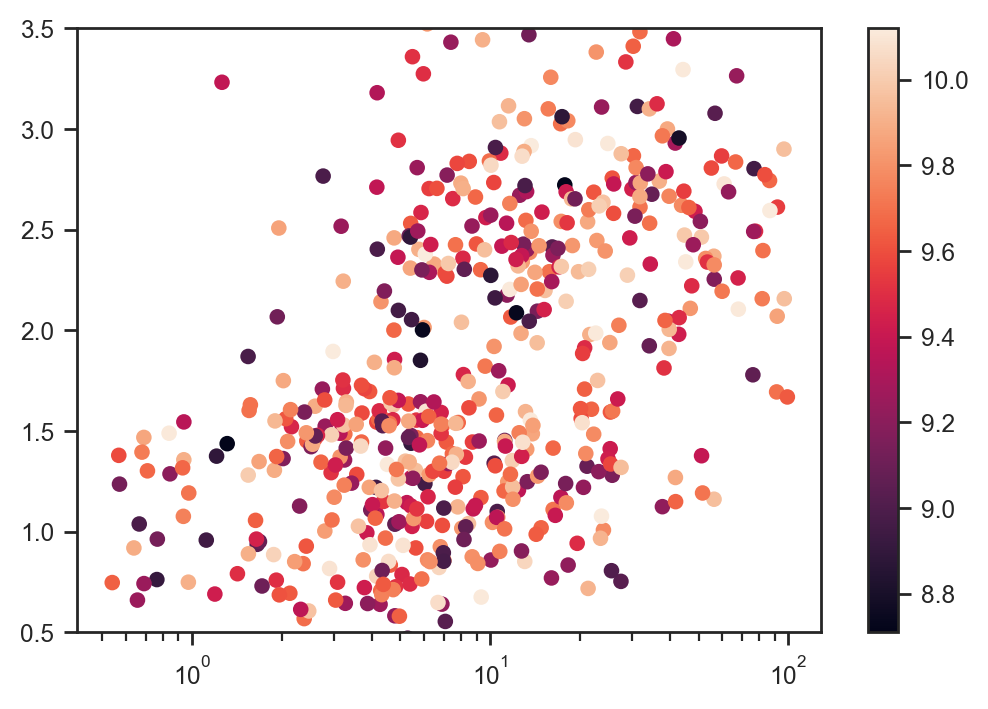

In [111]:
tmp = m & (cks['rp_prec']<7)

plt.scatter(cks['f18_P'][tmp], cks['f18_Rp'][tmp], c=cks['f18_logAiso'][tmp])
plt.semilogx()
plt.ylim(0.5,3.5)
plt.colorbar()
plt.show()

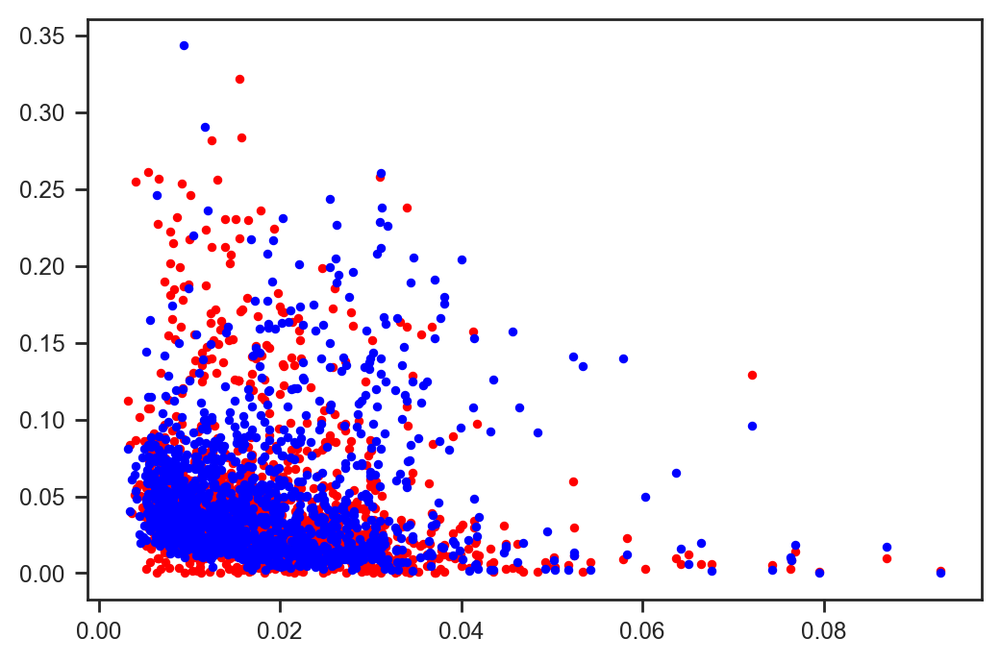

(0.5, 4)

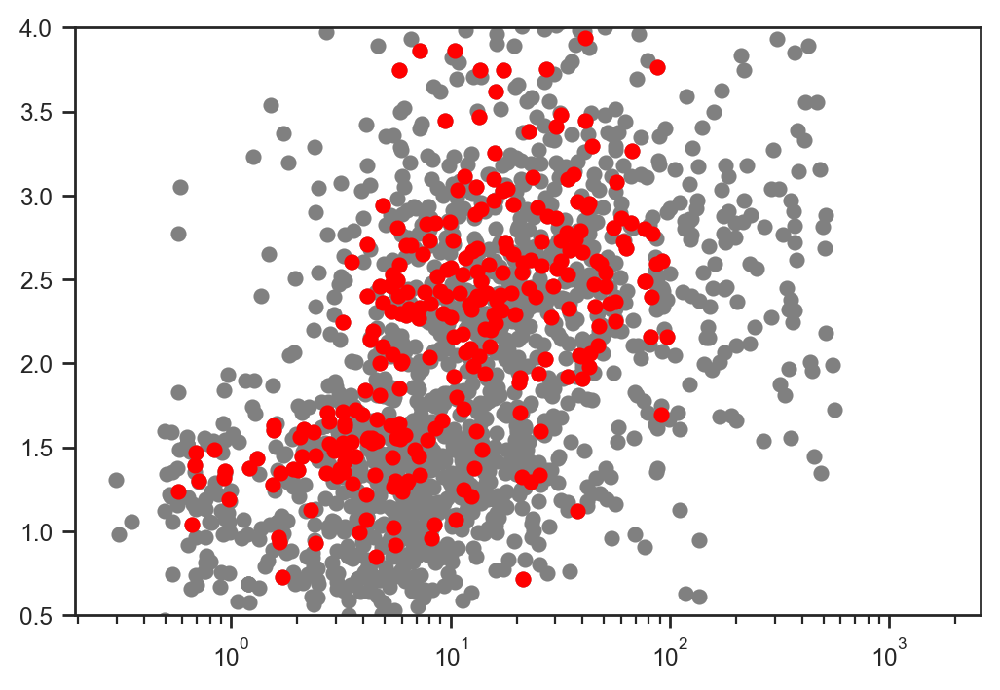

In [87]:
plt.plot(cks['f18_Rp/R*'][common_cuts], cks['f18_E_Rp/R*'][common_cuts]/cks['f18_Rp/R*'][common_cuts], 'r.')
plt.plot(cks['f18_Rp/R*'][common_cuts], cks['f18_e_Rp/R*'][common_cuts]/cks['f18_Rp/R*'][common_cuts], 'b.')
plt.show()

tmp = m & (cks['f18_E_Rp/R*'][common_cuts]/cks['f18_Rp/R*'][common_cuts]<0.04) & (cks['f18_e_Rp/R*'][common_cuts]/cks['f18_Rp/R*'][common_cuts]<0.04)

plt.plot(cks['f18_P'], cks['f18_Rp'], 'o', color='grey')
plt.plot(cks['f18_P'][tmp], cks['f18_Rp'][tmp], 'o', color='r')
plt.semilogx()
plt.ylim(0.5,4)

#### Repeat A-D test for entire dataframe, printing only significant correlations

In [73]:
for col in cks.columns:
    row, ad_stat, ad_siglevel = ad_table(col, slopes_A, intercepts_A, margins_A)
    if (ad_siglevel!=None):
        if (ad_siglevel<0.01):
            print(row)
        else:
            pass
    else:
        pass

f18_P & 5.7296 & 0.0019 & 196 & 1443 \\
f18_Rp/R* & 22.2823 & 0.0010 & 196 & 1443 \\
f18_e_Rp/R* & 8.1763 & 0.0010 & 196 & 1443 \\
f18_Rp & 67.6319 & 0.0010 & 196 & 1443 \\
f18_E_Rp & 9.9568 & 0.0010 & 196 & 1443 \\
f18_e_Rp & 9.9568 & 0.0010 & 196 & 1443 \\
f18_a & 5.2983 & 0.0027 & 196 & 1443 \\
f18_Sinc & 8.2843 & 0.0010 & 196 & 1443 \\
f18_E_Sinc & 8.4575 & 0.0010 & 196 & 1443 \\
f18_e_Sinc & 8.4575 & 0.0010 & 196 & 1443 \\
f18_E_R & 4.0175 & 0.0079 & 196 & 1443 \\
f18_e_R & 4.0656 & 0.0076 & 196 & 1443 \\
f18_rhoiso & 3.8176 & 0.0095 & 196 & 1443 \\
f18_logAiso & 4.3677 & 0.0059 & 196 & 1443 \\
f18_E_logAiso & 5.2996 & 0.0027 & 196 & 1443 \\
dr25_koi_num_transits & 6.3201 & 0.0012 & 190 & 1420 \\
dr25_koi_max_sngle_ev & 15.1251 & 0.0010 & 190 & 1420 \\
dr25_koi_max_mult_ev & 6.2405 & 0.0013 & 190 & 1420 \\
dr25_koi_model_snr & 6.0575 & 0.0015 & 190 & 1420 \\
dr25_koi_prad & 40.2816 & 0.0010 & 190 & 1420 \\
dr25_koi_prad_err1 & 11.4073 & 0.0010 & 190 & 1420 \\
dr25_koi_prad_err2 & 

In [85]:
# cks['f18_age'] = 10.**(cks['f18_logAiso'])/1.0e9
# cks['f18_agehi'] = 10.**(cks['f18_logAiso']+cks['f18_E_logAiso'])/1.0e9
# cks['f18_agelo'] = 10.**(cks['f18_logAiso']-cks['f18_e_logAiso'])/1.0e9

# cks['f18_age_pcterr'] = np.max([(cks['f18_age']-cks['f18_agelo'])/cks['f18_age'],
#                                (cks['f18_agehi']-cks['f18_age'])/cks['f18_age']], axis=0)

### Determine the number of planets in the valley resulting from each mask

In [74]:
# smed = np.median(slopes_B[3])
# imed = np.median(intercepts_B[3])
# mmed = np.median(margins_B[3])

# def upper_margin(logp):
#     return smed*logp + imed + np.sqrt(1+smed**2) * mmed

# def lower_margin(logp):
#     return smed*logp + imed - np.sqrt(1+smed**2) * mmed


masks = [
         m_disp,
         m_r8,
         m_rcf,
         m_ms,
         m_period,
         m_mass,
         m_feh,
         m_depth,
         m_snr,
         m_deltaage,
         m_rperr,
         m_rp,
         m_ruwe,
         m_deltamag,
         m_red,
         m_plx,
         m_nongrazing
        ]


for i,_m in enumerate(masks):
    _arg  = (~_m) & (cks['f18_logAiso']<9.25) & (cks['p17_Disp']!='FP')
    _arg0 = (cks['f18_logAiso']<9.25) & (cks['p17_Disp']!='FP')
    
    _argitv = (~_m) & (cks['f18_logAiso']<9.25) & (cks['p17_Disp']!='FP') &\
              (np.log10(cks['f18_Rp'])>lower_margin(np.log10(cks['f18_P']))) &\
              (np.log10(cks['f18_Rp'])<upper_margin(np.log10(cks['f18_P'])))
    
    print(len(cks[_argitv]))
    print(cks['f18_KOI'][_argitv])
    
    plt.scatter(np.log10(cks['f18_P'][_arg0]), np.log10(cks['f18_Rp'][_arg0]), color='lightgrey')
    plt.scatter(np.log10(cks['f18_P'][_arg]), np.log10(cks['f18_Rp'][_arg]), color=tt_cpal[1])
    plt.plot(np.log10([0.1,100]),upper_margin(np.log10([0.1,100])), 'k--')
    plt.plot(np.log10([0.1,100]),lower_margin(np.log10([0.1,100])), 'k--')
    plt.xlim(-0.5,2)
    plt.ylim(-0.5,1)
    plt.title(mask_dict[i+1])
    plt.gcf().set_size_inches(3,3)
    plt.show()
    
#    plt.gcf().set_size_inches(2,2)
#    plt.show()

#_arg = (cks['f18_logAiso']>=9) & (cks['f18_logAiso']<9.25) & (cks['p17_Disp']!='FP')
#in_the_valley = (np.log10(ytmp)>lower_margin(np.log10(xtmp))) & (np.log10(ytmp)<upper_margin(np.log10(xtmp)))

NameError: name 'lower_margin' is not defined

### Examining the radius distribution of the youngest planets from a gyrochronology analysis

### ^^ outdated?

In [88]:
smed = np.median(slopes_A[:][3])
imed = np.median(intercepts_A[:][3])
mmed = np.median(margins_A[:][3])

def upper_margin(logp):
    return smed*logp + imed + np.sqrt(1+smed**2) * mmed

def lower_margin(logp):
    return smed*logp + imed - np.sqrt(1+smed**2) * mmed

#Examining the radius distribution of the young planets
_x, _y = np.log10(cks['f18_P']), np.log10(cks['f18_Rp'])
_yerr = [_y-np.log10(cks['f18_Rp']-cks['f18_e_Rp']), np.log10(cks['f18_Rp']+cks['f18_E_Rp'])-_y]
_m = (np.isfinite(_x))&(np.isfinite(_y))


# OLD SCHEME DON'T DELETE
# gyro_young = (cks['prot']<curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))&\
#        (cks['prot']>curtis_teff_gyrochrone(cks['f18_Teff'], kind='pleiades-quad'))&\
#        (cks['Prot_flag']=='a')&\
#        (cks['f18_Teff']<6000.)&\
#         m_ms&\
#         m_disp&\
#         m_period&\
#         m_ruwe&\
#         m_rp&\
#         m_rperr

# gyro_young_in_the_void = gyro_young &\
#       (np.log10(cks['f18_Rp'])>lower_margin(np.log10(cks['f18_P']))) &\
#       (np.log10(cks['f18_Rp'])<upper_margin(np.log10(cks['f18_P'])))


# gyro_old = (cks['prot']>=curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))&\
#            (cks['f18_Teff']<6000.)&\
#             m_ms&\
#             m_disp&\
#             m_period&\
#             m_ruwe&\
#             m_rp&\
#             m_rperr

# gyro_old_in_the_void = gyro_old &\
#       (np.log10(cks['f18_Rp'])>lower_margin(np.log10(cks['f18_P']))) &\
#       (np.log10(cks['f18_Rp'])<upper_margin(np.log10(cks['f18_P'])))

# gyro_itv_df = cks[gyro_young_in_the_void].copy()
# gyro_itv_df.to_csv('../data/gyro_inthevoid.csv')


#cks['f18_R'] < 10.**((cks['f18_Teff']-5500)/4500 + 0.25)

gyro = common_cuts & m_ruwe & (cks['f18_Teff']<6000.)

gyro_yng = gyro & (cks['prot']<curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))&\
                  (cks['prot']>curtis_teff_gyrochrone(cks['f18_Teff'], kind='pleiades-quad'))&\
                  (cks['Prot_flag']=='a')

gyro_old = gyro & (cks['prot']>=curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))

gyro_nop = gyro & (np.isnan(cks['prot']))

/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


### What is the probability the gyro valley is so empty?

/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 5.78


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 1.29


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 0.2


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 0.11


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 0.02


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 1.65


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 1.38


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Probability of recovering a comparably empty void from old gyro sample (%) = 0.07


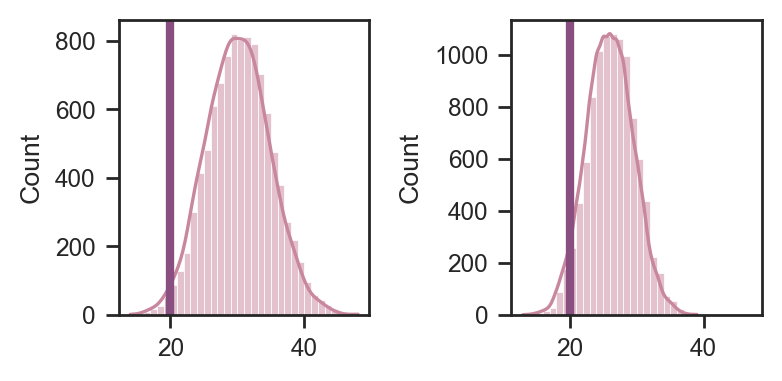

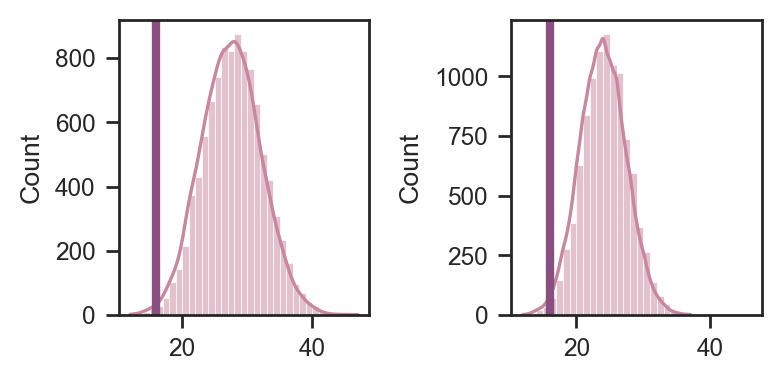

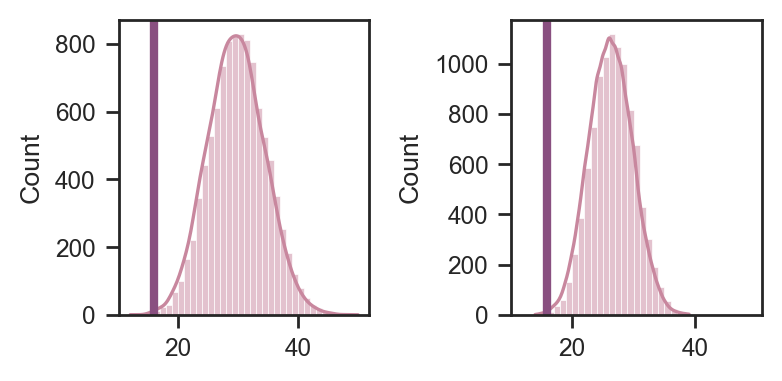

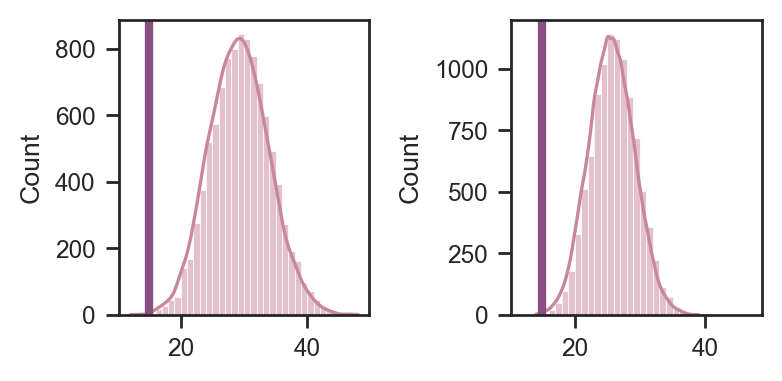

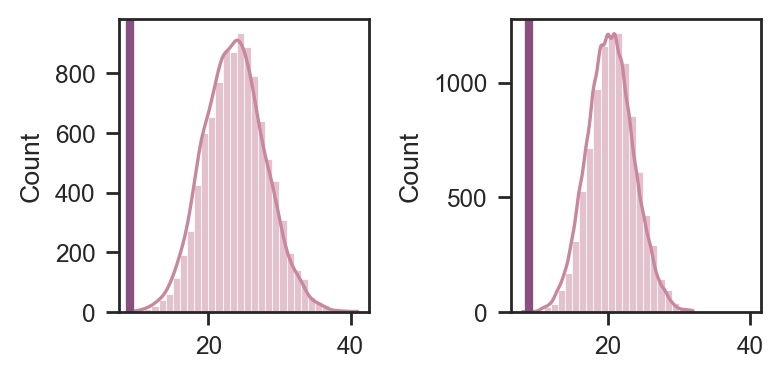

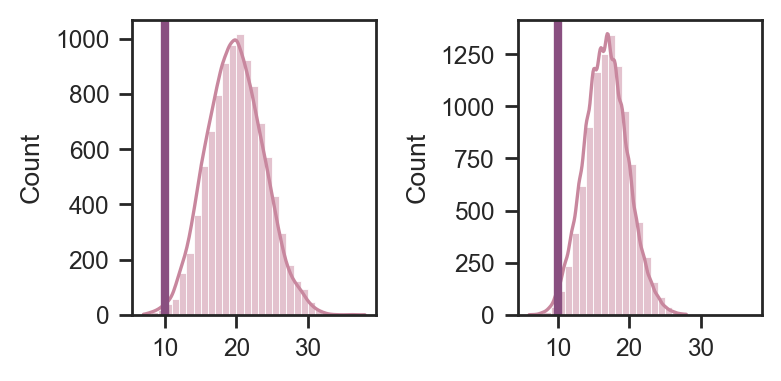

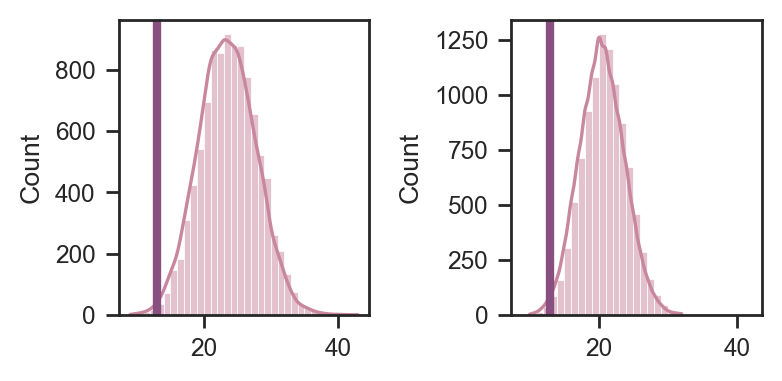

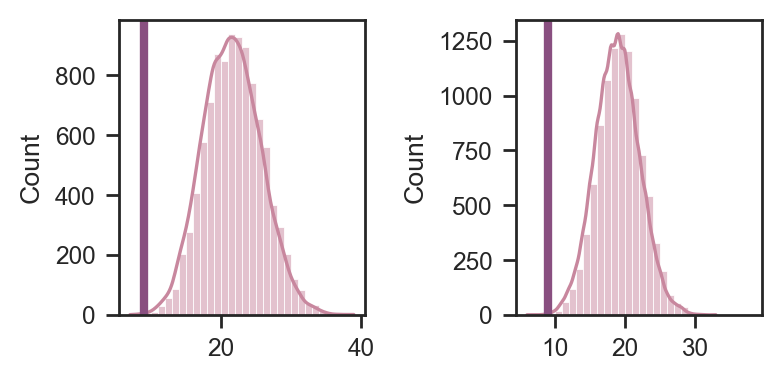

In [102]:
def false_alarm_prob_gyro(slopes, intercepts, margins):
    
    smed = np.median(slopes)
    imed = np.median(intercepts)
    mmed = np.median(margins)

    def upper_margin(p):
        return smed*p + imed + np.sqrt(1+smed**2) * mmed

    def lower_margin(p):
        return smed*p + imed - np.sqrt(1+smed**2) * mmed


    x, y = np.array(np.log10(cks['f18_P'])), np.array(np.log10(cks['f18_Rp']))
    xerr = np.max([cks['f18_e_P'], cks['f18_E_P']], axis=0)
    yerr = np.max([y-np.log10(cks['f18_Rp']-cks['f18_e_Rp']), 
                   np.log10(cks['f18_Rp']+cks['f18_E_Rp'])-y], axis=0)

    gyro_mask = m_ms & m_disp & m_period & m_rp & m_rperr & m_ruwe & (cks['f18_Teff']<6000.)

    gyro_young = gyro_mask & (cks['prot']<curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))&\
                             (cks['prot']>curtis_teff_gyrochrone(cks['f18_Teff'], kind='pleiades-quad'))&\
                             (cks['Prot_flag']=='a')

    gyro_old = gyro_mask & (cks['prot']>=curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))


    npl_young = len(x[gyro_young])
    npl_old   = len(x[gyro_old])
    #print(npl_young)
    #print(npl_old)

    itv_true = (y[gyro_young]<upper_margin(x[gyro_young])) & (y[gyro_young]>lower_margin(x[gyro_young]))
    nitv_true = len(x[gyro_young][itv_true])


    #What is the probability of recovering a valley so empty from the overall CKS sample with the same
    #initial masks applied to the gyro sample?

    np.random.seed(1701)
    nsim = int(1e4)
    nitv_sim = []
    nitv_sim_old = []

    for n in range(nsim):

        xsim = np.random.normal(x[gyro_mask], xerr[gyro_mask])
        ysim = np.random.normal(y[gyro_mask], yerr[gyro_mask])

        xsim_old = np.random.normal(x[gyro_old], xerr[gyro_old])
        ysim_old = np.random.normal(y[gyro_old], yerr[gyro_old])

        arg = np.random.choice(len(xsim), npl_young, replace=False)
        arg_old = np.random.choice(len(xsim_old), npl_young, replace=False)

        itv_sim = (ysim[arg] > lower_margin(xsim[arg])) & (ysim[arg] < upper_margin(xsim[arg]))
        itv_old_sim = (ysim_old[arg_old] > lower_margin(xsim_old[arg_old])) & (ysim_old[arg_old] < upper_margin(xsim_old[arg_old]))

        nitv_sim.append(len(ysim[arg][itv_sim]))
        nitv_sim_old.append(len(ysim_old[arg_old][itv_old_sim]))


    nitv_sim = np.array(nitv_sim)
    nitv_sim_old = np.array(nitv_sim_old)


    fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(4,2))

    sns.histplot(nitv_sim, bins=np.arange(nitv_sim.min(), nitv_sim.max()), kde=True, ax=ax1, color=cpal[1])
    ax1.axvline(nitv_true, color=tt_cpal[1], lw=3)

    sns.histplot(nitv_sim_old, bins=np.arange(nitv_sim.min(), nitv_sim.max()), kde=True, ax=ax2, color=cpal[1])
    ax2.axvline(nitv_true, color=tt_cpal[1], lw=3)

    plt.tight_layout()

    print('Probability of recovering a comparably empty void from old gyro sample (%) =', 
          100.*len(nitv_sim_old[nitv_sim_old<=nitv_true])/len(nitv_sim_old))
    
    
for i in range(2,4):
    false_alarm_prob_gyro(slopes_A[:][i], intercepts_A[:][i], margins_A[:][i])
    false_alarm_prob_gyro(slopes_B[:][i], intercepts_B[:][i], margins_B[:][i])
    false_alarm_prob_gyro(slopes_C[:][i], intercepts_C[:][i], margins_C[:][i])
    false_alarm_prob_gyro(slopes_D[:][i], intercepts_D[:][i], margins_D[:][i])

#false_alarm_prob_gyro(slopes_A[:][3], intercepts_A[:][3], margins_A[:][3])
#false_alarm_prob_gyro(slopes_B[:][3], intercepts_B[:][3], margins_B[:][3])
#false_alarm_prob_gyro(slopes_C[:][3], intercepts_C[:][3], margins_C[:][3])

#for i in range(4):
#    false_alarm_prob_gyro(slopes_C[:][i], intercepts_C[:][i], margins_C[:][i])

/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


190
290
Probability of recovering a comparably empty void from overall CKS sample (%) = 0.64
Probability of recovering a comparably empty void from old gyro sample (%) = 1.29


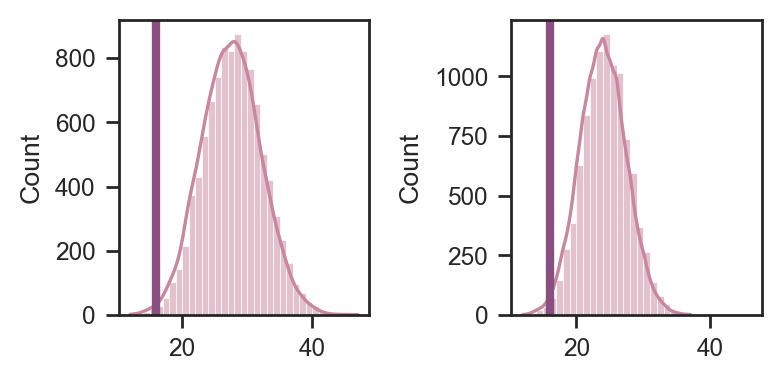

In [93]:
smed = np.median(slopes_B[:][2])
imed = np.median(intercepts_B[:][2])
mmed = np.median(margins_B[:][2])

def upper_margin(p):
    return smed*p + imed + np.sqrt(1+smed**2) * mmed

def lower_margin(p):
    return smed*p + imed - np.sqrt(1+smed**2) * mmed


x, y = np.array(np.log10(cks['f18_P'])), np.array(np.log10(cks['f18_Rp']))
xerr = np.max([cks['f18_e_P'], cks['f18_E_P']], axis=0)
yerr = np.max([y-np.log10(cks['f18_Rp']-cks['f18_e_Rp']), 
               np.log10(cks['f18_Rp']+cks['f18_E_Rp'])-y], axis=0)

gyro_mask = m_ms & m_disp & m_period & m_rp & m_rperr & m_ruwe & (cks['f18_Teff']<6000.)

gyro_young = gyro_mask & (cks['prot']<curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))&\
                         (cks['prot']>curtis_teff_gyrochrone(cks['f18_Teff'], kind='pleiades-quad'))&\
                         (cks['Prot_flag']=='a')

gyro_old = gyro_mask & (cks['prot']>=curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))


npl_young = len(x[gyro_young])
npl_old   = len(x[gyro_old])
print(npl_young)
print(npl_old)

itv_true = (y[gyro_young]<upper_margin(x[gyro_young])) & (y[gyro_young]>lower_margin(x[gyro_young]))
nitv_true = len(x[gyro_young][itv_true])


#What is the probability of recovering a valley so empty from the overall CKS sample with the same
#initial masks applied to the gyro sample?

np.random.seed(1701)
nsim = int(1e4)
nitv_sim = []
nitv_sim_old = []

for n in range(nsim):
    
    xsim = np.random.normal(x[gyro_mask], xerr[gyro_mask])
    ysim = np.random.normal(y[gyro_mask], yerr[gyro_mask])
    
    xsim_old = np.random.normal(x[gyro_old], xerr[gyro_old])
    ysim_old = np.random.normal(y[gyro_old], yerr[gyro_old])
    
    arg = np.random.choice(len(xsim), npl_young, replace=False)
    arg_old = np.random.choice(len(xsim_old), npl_young, replace=False)
    
    itv_sim = (ysim[arg] > lower_margin(xsim[arg])) & (ysim[arg] < upper_margin(xsim[arg]))
    itv_old_sim = (ysim_old[arg_old] > lower_margin(xsim_old[arg_old])) & (ysim_old[arg_old] < upper_margin(xsim_old[arg_old]))
    
    nitv_sim.append(len(ysim[arg][itv_sim]))
    nitv_sim_old.append(len(ysim_old[arg_old][itv_old_sim]))
    
    
nitv_sim = np.array(nitv_sim)
nitv_sim_old = np.array(nitv_sim_old)

    
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(4,2))
    
sns.histplot(nitv_sim, bins=np.arange(nitv_sim.min(), nitv_sim.max()), kde=True, ax=ax1, color=cpal[1])
ax1.axvline(nitv_true, color=tt_cpal[1], lw=3)

sns.histplot(nitv_sim_old, bins=np.arange(nitv_sim.min(), nitv_sim.max()), kde=True, ax=ax2, color=cpal[1])
ax2.axvline(nitv_true, color=tt_cpal[1], lw=3)

plt.tight_layout()

print('Probability of recovering a comparably empty void from overall CKS sample (%) =', 
      100.*len(nitv_sim[nitv_sim<=nitv_true])/len(nitv_sim))

print('Probability of recovering a comparably empty void from old gyro sample (%) =', 
      100.*len(nitv_sim_old[nitv_sim_old<=nitv_true])/len(nitv_sim_old))

### What are the young (rotation-selected) planets in the void?

### What is the probability of finding the valley so empty from random selection within the slow rotator sample?

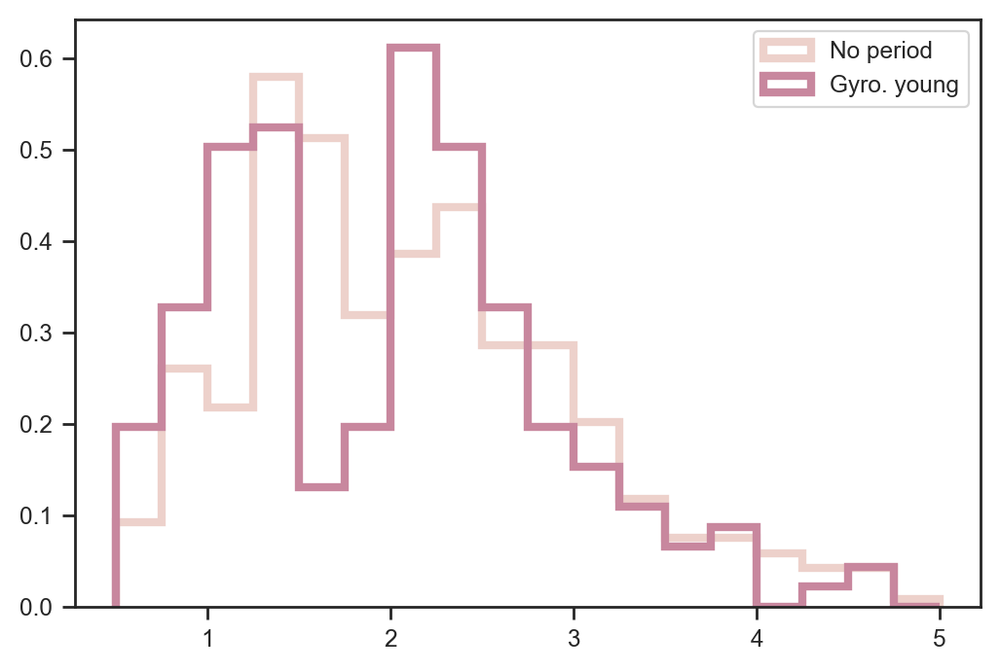

In [76]:
plt.hist(cks['f18_Rp'][gyro_nop], bins=np.arange(0.5,5.25,0.25), density=True, histtype='step', label='No period', lw=3)
plt.hist(cks['f18_Rp'][gyro_yng], bins=np.arange(0.5,5.25,0.25), density=True, histtype='step', label='Gyro. young', lw=3)
#plt.hist(y[isoc_yng], bins=np.arange(0.5,5.25,0.25), density=True, histtype='step')
plt.legend()
plt.show()

190


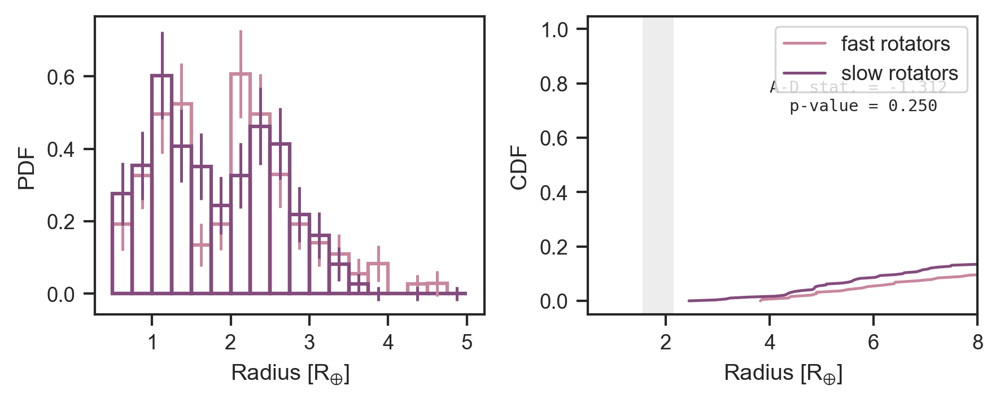

In [100]:
def cdf(x, nbins=100, normed=True, method=2):
    
    # Methods 1 & 2 return normalized CDF
    
    if method==1:    
        h,x1 = np.histogram(x, bins = nbins, normed=normed)
        dx = x1[1]-x1[0]
        f1 = np.cumsum(h)*dx
        cdfx, cdfy = x1[1:], f1

    elif method==2:
        x2 = np.sort(x)
        f2 = np.array(range(len(x)))/float(len(x))
        cdfx, cdfy = x2, f2
        
    elif method==3:
        from scipy import stats
        res  = stats.cumfreq(x, numbins=nbins)
        cdfx = res.lowerlimit + np.linspace(0, res.binsize*res.cumcount.size, res.cumcount.size)
        cdfy = res.cumcount
            
    return cdfx, cdfy



#Bootstrap errors here
_xy, _yy = cdf(10.**y[gyro_young])
_xo, _yo = cdf(10.**y[gyro_old])


cdf_isoc_yng = cdf(10.**y[isoc_yng])
cdf_isoc_old = cdf(10.**y[isoc_old])

cdf_gyro_yng = cdf(10.**y[gyro_yng])
cdf_gyro_old = cdf(10.**y[gyro_old])


nboot = 5000
sboot = 50
data = np.array(10.**y[gyro_young])

_cdf_x = []
_cdf_y = []

for _ in range(nboot):
        #Resample the data with replacement
        arg = np.random.choice(len(data),sboot,replace=True)
        _data = data[arg]
        _cdf_x.append(cdf(_data)[0])
        _cdf_y.append(cdf(_data)[1])
        
        
        
######################
data = np.array(10.**_y[gyro_young])
odata = np.array(10.**_y[gyro_old])
print(len(data))

nboot = 5000
sboot = 150

histy = []
ohisty = []

for _ in range(nboot):
    _data = data[np.random.choice(len(data), sboot, replace=True)]
    _odata = odata[np.random.choice(len(odata), sboot, replace=True)]
    
    _histy,binEdges = np.histogram(_data, bins=np.arange(0.5,5.25,0.25), density=True)
    histy.append(_histy)
    
    _ohisty,binEdges = np.histogram(_odata, bins=np.arange(0.5,5.25,0.25), density=True)
    ohisty.append(_ohisty)    
    
bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
histyerr = np.std(histy, axis=0)
histymed = np.median(histy, axis=0)

ohistyerr = np.std(ohisty, axis=0)
ohistymed = np.median(ohisty, axis=0)
        
from scipy import stats
    
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(6,2.5),dpi=150)
   
#ax1.hist(10.**y[gyro_young], bins=np.arange(0.5,5,0.25), color=cpal[1], histtype='step', density=True)
#ax1.hist(10.**y[gyro_old], bins=np.arange(0.5,5,0.25), color=cpal[2], histtype='step', density=True)

ax1.bar(bincenters, histymed, width=0.25, yerr=histyerr, color='None', edgecolor=cpal[1], ecolor=cpal[1], lw=1.5)
ax1.bar(bincenters, ohistymed, width=0.25, yerr=ohistyerr, color='None', edgecolor=cpal[2], ecolor=cpal[2], lw=1.5)
   
ax2.plot(_xy, _yy, label='fast rotators', color=cpal[1])
ax2.plot(_xo, _yo, label='slow rotators', color=cpal[2])


ad_result = stats.anderson_ksamp([_yy, _yo])
ax2.text(4,0.7,'A-D stat. = '+"%.3f" % ad_result.statistic+
         '\n  p-value = '+"%.3f" % ad_result.significance_level, 
         size=7, family='monospace', weight='light')

ax2.legend()
ax2.set_xlim(0.5,8)
ax2.axvspan(1.85-0.3,1.85+0.3, alpha=0.4, color='lightgrey', lw=0)


ax1.set_xlabel(r'Radius [R$_\mathregular{\oplus}$]')
ax2.set_xlabel(r'Radius [R$_\mathregular{\oplus}$]')
ax2.set_ylabel('CDF')
ax1.set_ylabel('PDF')
plt.tight_layout()
plt.show()

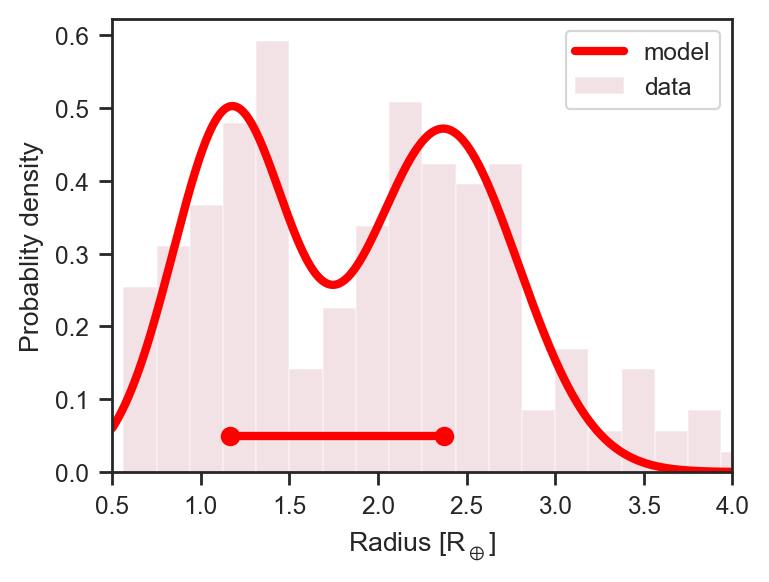

Width =  1.2047161022278525
Valley floor =  1.7462462462462462


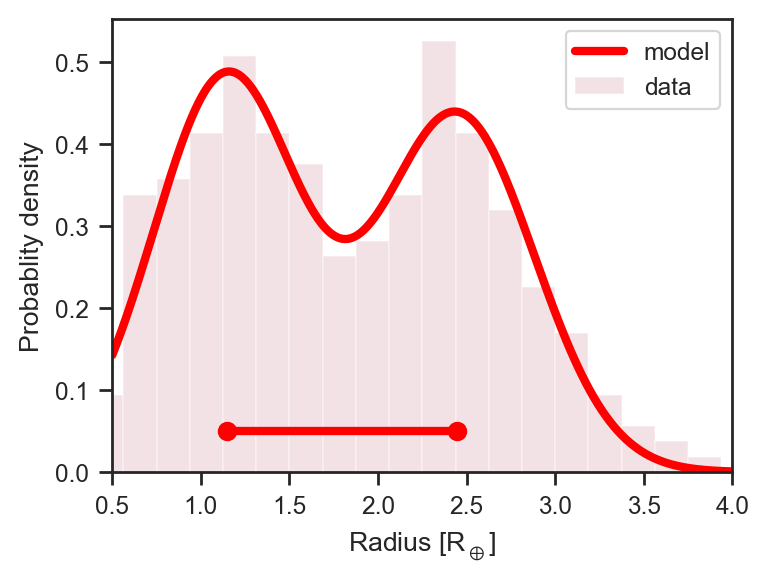

Width =  1.2996930346171025
Valley floor =  1.8153153153153152


1.2996930346171025

In [416]:
from pylab import *
from scipy.optimize import curve_fit

def gauss(x,mu,sigma,A):
    return A*exp(-(x-mu)**2/2/sigma**2)

def bimodal(x,mu1,sigma1,A1,mu2,sigma2,A2):
    return gauss(x,mu1,sigma1,A1)+gauss(x,mu2,sigma2,A2)

def two_component_gauss_fit(data,nbins=100):

    #y,x,_= hist(data,nbins,alpha=.3,label='data', density=True)
    #y,x,_= hist(data,bins=np.linspace(0.5,4,25),alpha=.3,label='data', density=True)
    y,x,_= hist(data,bins=np.linspace(0,7.5,41),alpha=.3,label='data', density=True)
    x=(x[1:]+x[:-1])/2 # for len(x)==len(y)

    xfine = np.linspace(0.5,5,1000)

    expected=(1.5,.2,0.5,2.5,.2,0.5)
    params,cov=curve_fit(bimodal,x,y,expected)
    sigma=sqrt(diag(cov))
    plt.plot(xfine,bimodal(xfine,*params),color='red',lw=3,label='model')
    plt.xlim(0.5,4)
    plt.plot([params[0],params[3]], [0.05,0.05],'r.-', lw=3, ms=12)
    plt.xlabel(r'Radius [$\mathregular{R_\oplus}$]')
    plt.ylabel(r'Probablity density')
    plt.legend()
    plt.gcf().set_size_inches(4,3)
    plt.show()
    
    width = params[3]-params[0]    
    #print(pd.DataFrame(data={'params':params,'sigma':sigma},index=bimodal.__code__.co_varnames[1:]))
    print("Width = ", width)
    
    
    xv = np.linspace(1,2.5,1000)
    print("Valley floor = ", xv[np.argmin(bimodal(xv,*params))])
    
    return width

two_component_gauss_fit(10.**_y[gyro])

two_component_gauss_fit(10.**_y[gyro_old])

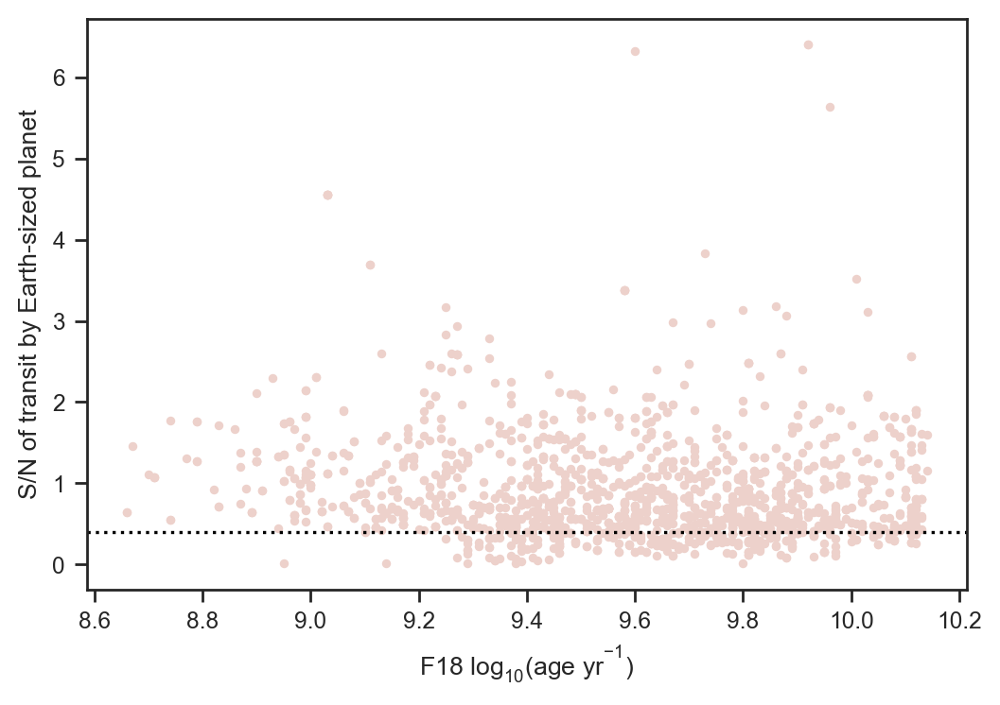

In [101]:
plt.plot(cks['f18_logAiso'], cks['single_transit_snr'], '.')
plt.ylabel('S/N of transit by Earth-sized planet')
plt.xlabel(r'F18 $\mathregular{log_{10}(age~yr^{-1})}$')
plt.axhline(0.4, ls=':', color='k')
plt.show()

### What are the young planets in the void?

In [103]:
in_the_void = (cks['f18_logAiso']<9.25) &\
      (cks['p17_Disp']!='FP') &\
      (cks['f18_P']<100) &\
      (cks['f18_Rp']<10) &\
      (np.log10(cks['f18_Rp'])>lower_margin(np.log10(cks['f18_P']))) &\
      (np.log10(cks['f18_Rp'])<upper_margin(np.log10(cks['f18_P'])))

itv_df = cks[in_the_void].copy()
#itv_df.to_csv('../data/inthevoid.csv')
itv_df.head()

,f18_KOI,f18_P,f18_E_P,f18_e_P,f18_Rp/R*,f18_E_Rp/R*,f18_e_Rp/R*,f18_Rp,f18_E_Rp,f18_e_Rp,...,sd_age_phot,f18_depth_ppm,single_transit_snr,Rcut,rs_prec,rp_prec,f18_age,f18_agehi,f18_agelo,f18_age_pcterr
213,K00299.01,1.541677,0.000001,0.000001,0.018805,0.000133,0.002241,1.870,0.127,0.127,...,9.442871,353.628025,1.444580,1.840301,2.417582,6.791444,0.954993,3.162278,0.371535,2.311311
234,K00323.01,5.835983,0.000005,0.000005,0.021113,0.000664,0.000254,1.851,0.060,0.060,...,8.654108,445.758769,1.710482,1.804864,2.366127,3.241491,0.676083,1.905461,0.524807,1.818383
247,K00338.01,7.010627,0.000012,0.000012,0.018662,0.000392,0.002210,1.587,0.118,0.118,...,9.536053,348.270244,1.734718,1.390308,2.570694,7.435413,0.891251,3.019952,0.524807,2.388442
250,K00341.02,4.699653,0.000008,0.000008,0.021196,0.002068,0.001594,2.026,0.183,0.183,...,9.329159,449.270416,1.333445,1.840301,2.514286,9.032577,1.548817,2.754229,0.316228,0.795826
368,K00505.04,8.348188,0.000030,0.000030,0.018666,0.000217,0.002981,1.480,0.134,0.134,...,9.415668,348.419556,1.268651,1.409649,2.751032,9.054054,0.794328,2.398833,0.257040,2.019952


Significance: 1671    0.188669
dtype: float64
Significance: 1671    0.204832
dtype: float64


(-0.5, 1)

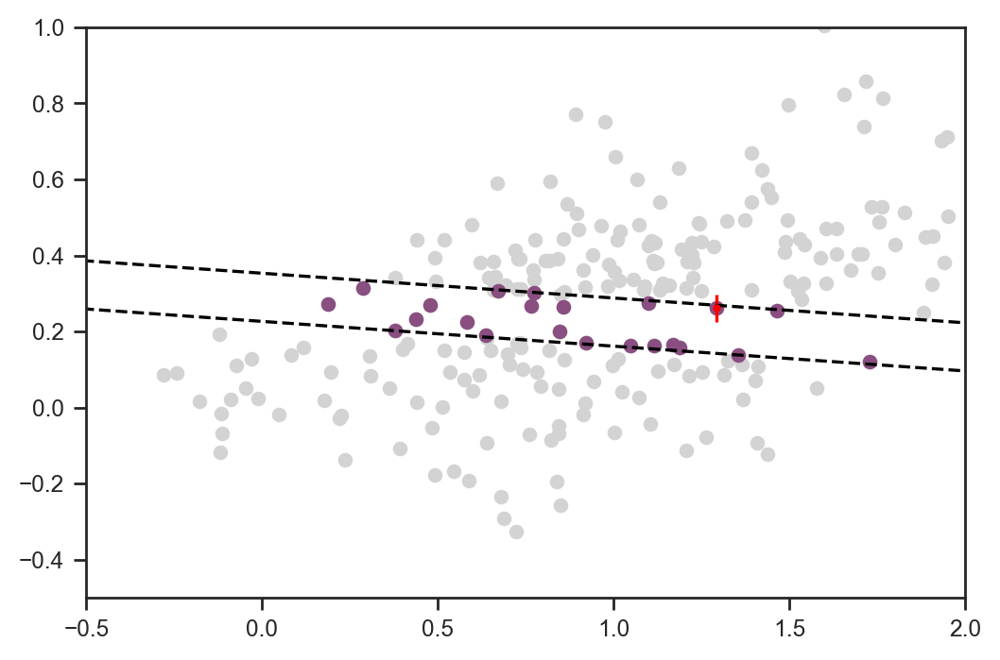

In [106]:
tmp = (cks['f18_logAiso']<9.25) &\
         (cks['p17_Disp']!='FP') &\
         (cks['f18_P']<100.)

ypitv = (cks['f18_logAiso']<9.25) &\
         (cks['p17_Disp']!='FP') &\
         (cks['f18_P']<100.) &\
         (np.log10(cks['f18_Rp'])>lower_margin(np.log10(cks['f18_P'])))&\
         (np.log10(cks['f18_Rp'])<upper_margin(np.log10(cks['f18_P'])))

plt.scatter(np.log10(cks['f18_P'][tmp]), 
            np.log10(cks['f18_Rp'][tmp]), color='lightgrey')
            
plt.scatter(np.log10(cks['f18_P'][ypitv]), 
            np.log10(cks['f18_Rp'][ypitv]), color=tt_cpal[1])            

plt.scatter(np.log10(cks['f18_P'][ypitv&cks['prot']>20]), 
            np.log10(cks['f18_Rp'][ypitv&cks['prot']>20]), color=tt_cpal[1], s=20)            



def get_koi_pr(koi):
    _arg = cks['f18_KOI'] == koi
    _x = np.log10(cks['f18_P'][_arg])
    _y = np.log10(cks['f18_Rp'][_arg])
    _yerr = [_y - np.log10(cks['f18_Rp'][_arg]-cks['f18_e_Rp'][_arg]),
             np.log10(cks['f18_Rp'][_arg]+cks['f18_E_Rp'][_arg]) - _y]
    return _x,_y,_yerr

# _x,_y,_yerr = get_koi_pr('K00323.01')
# _x,_y,_yerr = get_koi_pr('K00338.01')
#_x,_y,_yerr = get_koi_pr('K00338.02')
#_x,_y,_yerr = get_koi_pr('K00534.02')
#_x,_y,_yerr = get_koi_pr('K02035.01')
#_x,_y,_yerr = get_koi_pr('K02038.01')
# plt.errorbar(_x,_y,yerr=_yerr,fmt='o',color='r',ms=2)

# _x,_y,_yerr = get_koi_pr('K02038.02')
# plt.errorbar(_x,_y,yerr=_yerr,fmt='o',color='r',ms=2)

# _x,_y,_yerr = get_koi_pr('K02038.03')
# plt.errorbar(_x,_y,yerr=_yerr,fmt='o',color='r',ms=2)

# _x,_y,_yerr = get_koi_pr('K02038.04')
# plt.errorbar(_x,_y,yerr=_yerr,fmt='o',color='r',ms=2)

# _x,_y,_yerr = get_koi_pr('K02038.01')
# plt.errorbar(_x,_y,yerr=_yerr,fmt='o',color='r',ms=2)


#_x,_y,_yerr = get_koi_pr('K02111.01')
#plt.errorbar(_x,_y,yerr=_yerr,fmt='o',color='r',ms=2)

#_x,_y,_yerr = get_koi_pr('K02111.02')
#plt.errorbar(_x,_y,yerr=_yerr,fmt='o',color='r',ms=2)

#_x,_y,_yerr = get_koi_pr('K02678.01')

# _x,_y,_yerr = get_koi_pr('K02768.01')
# plt.errorbar(_x,_y,yerr=_yerr,fmt='o',color='r',ms=2)

# _x,_y,_yerr = get_koi_pr('K02768.02')
# plt.errorbar(_x,_y,yerr=_yerr,fmt='o',color='r',ms=2)


_x,_y,_yerr = get_koi_pr('K03876.01')
plt.errorbar(_x,_y,yerr=_yerr,fmt='o',color='r',ms=2)

print('Significance:', (upper_margin(_x)-_y)/_yerr[0])
print('Significance:', (upper_margin(_x)-_y)/_yerr[1])


#print(10.**_y)

#_x,_y,_yerr = get_koi_pr('K00534.01')
#plt.errorbar(_x,_y,yerr=_yerr,fmt='o',color='r')

#plt.scatter(np.log10(cks['f18_P'][_arg]), 
#            np.log10(1.874), color='g', s=40)

plt.plot(np.log10([0.1,100]),upper_margin(np.log10([0.1,100])), 'k--')
plt.plot(np.log10([0.1,100]),lower_margin(np.log10([0.1,100])), 'k--')
plt.xlim(-0.5,2)
plt.ylim(-0.5,1)

In [107]:
print('Chance probability of finding <10 planets in the valley = ', len(itv[itv<=10]),'in', len(itv))
print('Chance probability of finding <10 planets in the valley = ', 100.*len(itv[itv<=10])/len(itv), '%')

print('Chance probability of finding <7 planets in the valley = ', len(itv[itv<=6]),'in', len(itv))
print('Chance probability of finding <7 planets in the valley = ', 100.*len(itv[itv<=6])/len(itv), '%')

NameError: name 'itv' is not defined

### Figure 12: How many planets are in the valley as a function of bin width and center?

In [108]:
def occupancy_grid(parameter, 
                   slopes, 
                   intercepts, 
                   margins, 
                   nbins=100):
    
    smed = np.median(slopes)
    imed = np.median(intercepts)
    mmed = np.median(margins)
    
    def upper_margin(p):
        return smed*p + imed + np.sqrt(1+smed**2) * mmed

    def lower_margin(p):
        return smed*p + imed - np.sqrt(1+smed**2) * mmed

    
    if parameter=='age':
        par = cks['f18_logAiso']
        bin_centers = np.linspace(8.5,10.5,nbins)
        bin_widths  = np.linspace(0.1,1,nbins)
    elif parameter=='mass':
        par = cks['f18_Miso']
        bin_centers = np.linspace(0.5,1.6,nbins)
        bin_widths  = np.linspace(0.05,0.2,nbins)
    elif parameter=='feh':
        par = cks['f18_[Fe/H]']
        bin_centers = np.linspace(-0.6,0.5,nbins)
        bin_widths  = np.linspace(0.02,0.2,nbins)        
        
    cen,wid = np.meshgrid(bin_centers, bin_widths)
    nitv = np.zeros([nbins,nbins])
    fitv = np.zeros([nbins,nbins])

    for i in tqdm(range(len(bin_centers))):
        for j in range(len(bin_widths)):
        
            mask = m_disp & m_period & m_rp & m_rperr &\
                   (par>=cen[i,j]-wid[i,j])&(par<cen[i,j]+wid[i,j])

            x,y = np.array(cks['f18_P'][mask]), np.array(cks['f18_Rp'][mask])

            arg = (np.log10(y)>lower_margin(np.log10(x))) & (np.log10(y)<upper_margin(np.log10(x)))
            try:
                fitv[i,j] = len(y[arg])/len(y)
            except:
                fitv[i,j] = np.nan

            if len(y[arg])>0:
                nitv[i,j] = len(y[arg])
            else:
                nitv[i,j] = np.nan
                
    return fitv, nitv, cen, wid


fitv_age, nitv_age, cen_age, wid_age = occupancy_grid("age", slopes_A[3][:], 
                                                      intercepts_A[3][:], 
                                                      margins_A[3][:], 
                                                      nbins=50)

fitv_mass, nitv_mass, cen_mass, wid_mass = occupancy_grid("mass", slopes_A[3][:], 
                                                      intercepts_A[3][:], 
                                                      margins_A[3][:], 
                                                      nbins=50)

fitv_feh, nitv_feh, cen_feh, wid_feh = occupancy_grid("feh", slopes_A[3][:], 
                                                      intercepts_A[3][:], 
                                                      margins_A[3][:], 
                                                      nbins=50)

100%|██████████| 50/50 [00:02<00:00, 17.05it/s]


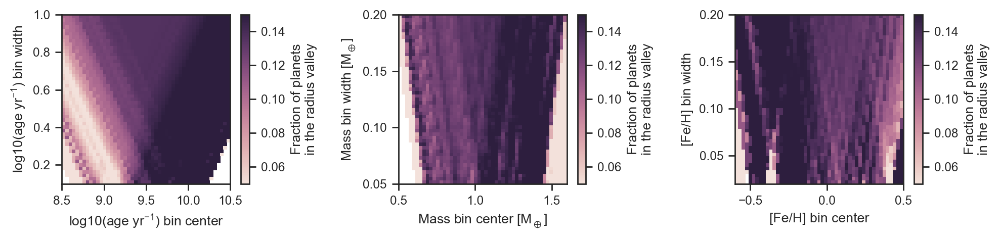

In [110]:
def plot_occupancy_grids(cen_age, wid_age, fitv_age,
                         cen_mass, wid_mass, fitv_mass,
                         cen_feh, wid_feh, fitv_feh, fig_path=None, vmin=0.05, vmax=0.15):
    
    cmap = sns.cubehelix_palette(start=3, light=0.9, as_cmap=True)
    
    plt.subplot(131)
    plt.pcolormesh(cen_age, wid_age, fitv_age, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar(label="Fraction of planets\nin the radius valley")
    plt.xlabel(r"log10(age yr$^\mathregular{-1}$) bin center")
    plt.ylabel(r"log10(age yr$^\mathregular{-1}$) bin width")
    
    plt.subplot(132)
    plt.pcolormesh(cen_mass, wid_mass, fitv_mass, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar(label="Fraction of planets\nin the radius valley")
    plt.xlabel(r"Mass bin center $\mathregular{[M_\oplus]}$")
    plt.ylabel(r"Mass bin width $\mathregular{[M_\oplus]}$")
    
    plt.subplot(133)
    plt.pcolormesh(cen_feh, wid_feh, fitv_feh, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.colorbar(label="Fraction of planets\nin the radius valley")
    plt.xlabel(r"[Fe/H] bin center")
    plt.ylabel(r"[Fe/H] bin width")    
    
    plt.gcf().set_size_inches(10,2.5)
    plt.tight_layout()
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    
    return

plot_occupancy_grids(cen_age, wid_age, fitv_age,
                     cen_mass, wid_mass, fitv_mass,
                     cen_feh, wid_feh, fitv_feh, fig_path='../figures/binning.pdf')

### Radius precision plot

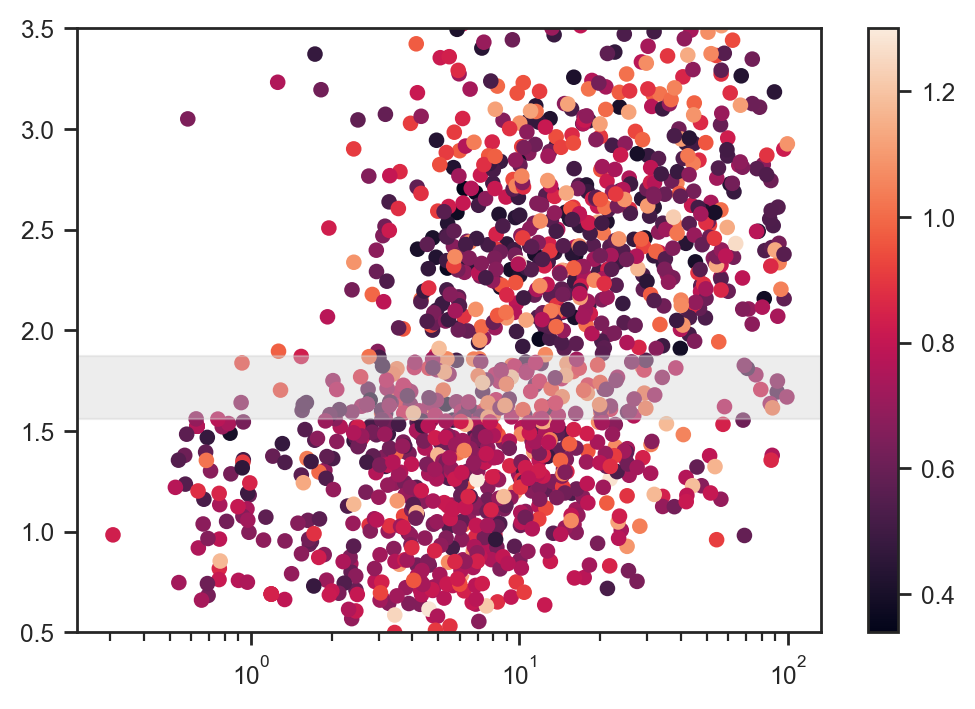

In [193]:
def period_radius(mask, color_axis=None):
    plt.scatter(cks['f18_P'][mask], cks['f18_Rp'][mask], c=color_axis[mask])
    plt.ylim(0.5,3.5)
    plt.axhspan(1.56,1.87, color='lightgrey', alpha=0.4)
    plt.semilogx()
    plt.colorbar()
    plt.show()
    
#period_radius(tmp, color_axis=cks['rp_prec'])
period_radius(common_cuts, color_axis=np.log10(cks['rp_prec']))

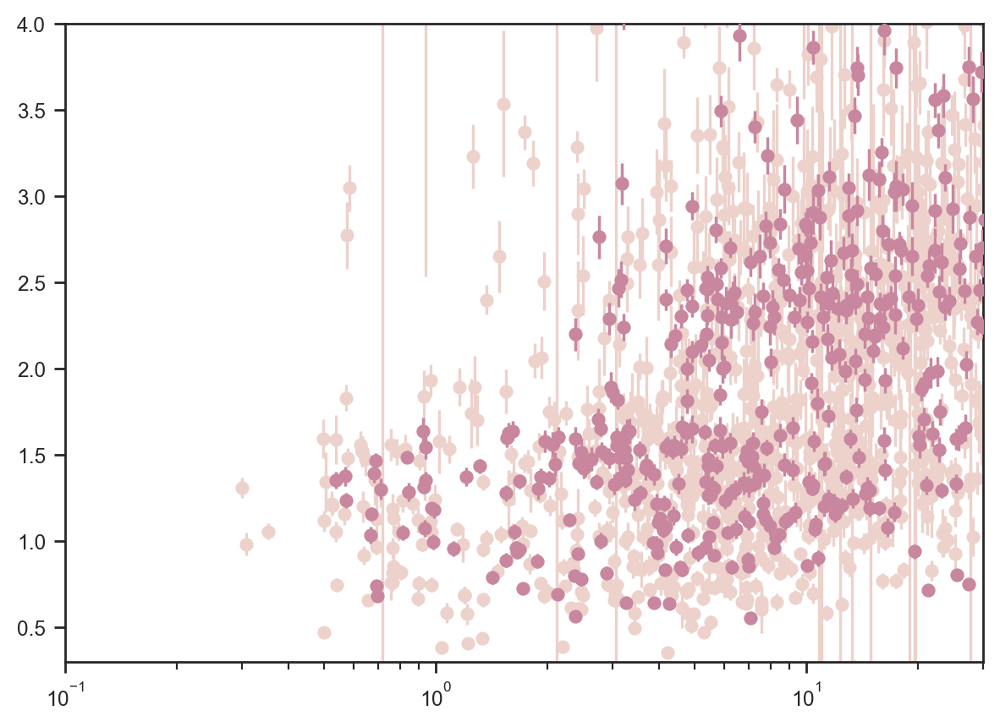

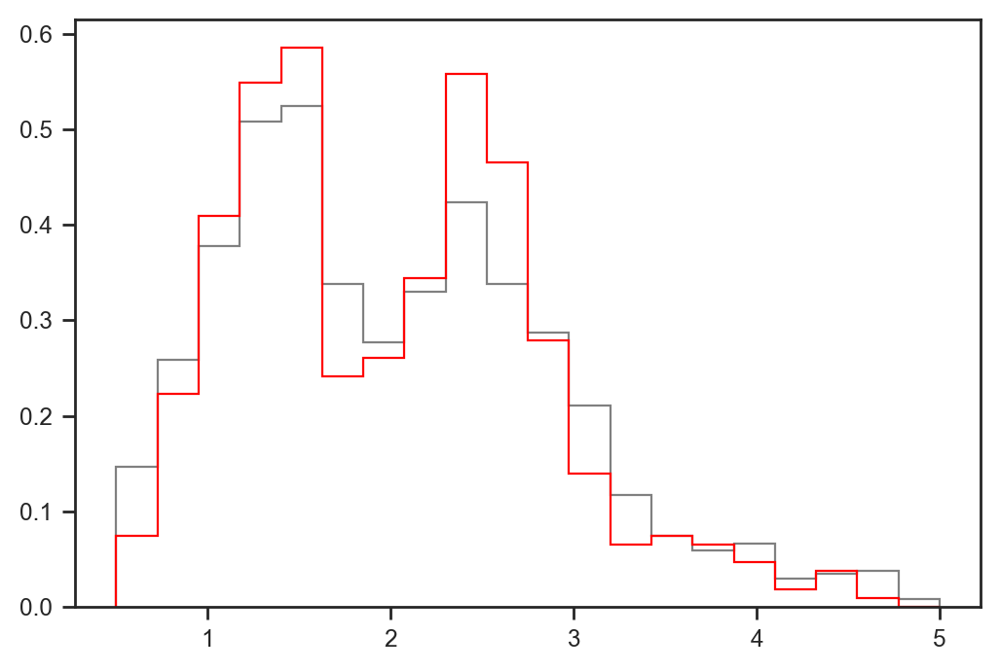

In [177]:
#tmp = (cks['single_transit_snr']>0.5) & common_cuts & (cks['rp_prec']<4) & m_nongrazing
tmp = common_cuts & (cks['rp_prec']<5) &\
m_nongrazing & m_ruwe & m_r8 & m_rcf & m_plx #& (cks['gaia_phot_g_mean_mag']<15) & (cks['single_transit_snr']>0.5)

plt.errorbar(cks['f18_P'], cks['f18_Rp'], yerr=cks['f18_E_Rp'], fmt='o')
plt.errorbar(cks['f18_P'][tmp], cks['f18_Rp'][tmp], yerr=cks['f18_E_Rp'][tmp], fmt='o', zorder=10)
plt.semilogx()
plt.xlim(0.1,30)
plt.ylim(0.3,4)
plt.gcf().set_size_inches(7,5)
plt.show()

_y1=cks['f18_Rp']
_y2=cks['f18_Rp'][tmp]
plt.hist(_y1, bins=np.linspace(0.5,5,21), color='grey', histtype='step', density=True)
plt.hist(_y2, bins=np.linspace(0.5,5,21), color='red', histtype='step', density=True)
plt.show()

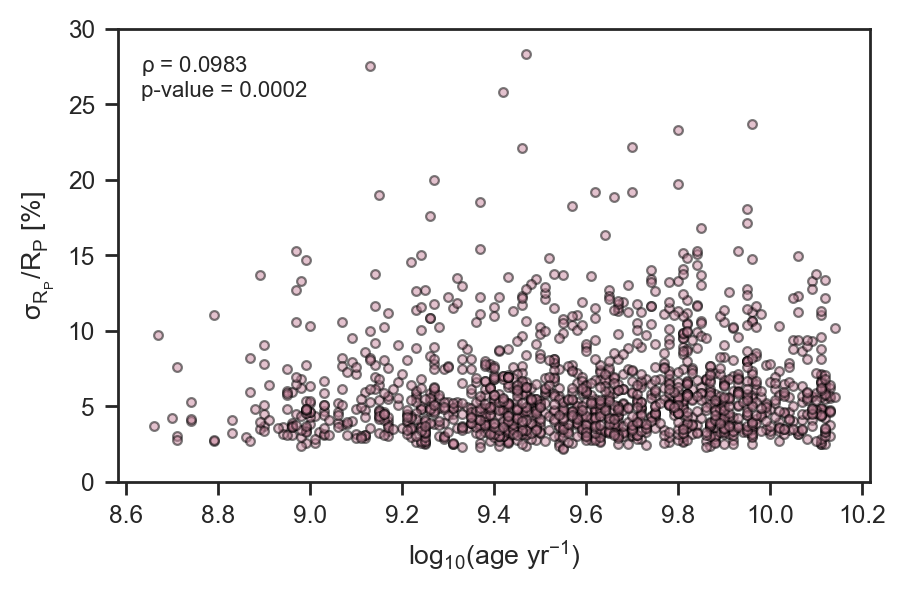

In [111]:
arg = m_disp & m_ms & m_rp & m_period & (np.isfinite(cks['f18_logAiso']))

_x,_y = cks['f18_logAiso'][arg], cks['rp_prec'][arg]

rho, pval = stats.spearmanr(_x,_y)

#plt.axhline(6, color='k', ls='--', zorder=0)
plt.scatter(_x, _y, edgecolor='k', alpha=0.5, s=10, color=cpal[1])
plt.ylim(0,30)
plt.text(0.03,0.85,r'$\mathregular{\rho}$ = '+"%.4f" % rho +'\np-value = '+"%.4f" % pval, 
         transform=plt.gca().transAxes, size=8)
plt.xlabel(r'log$_\mathregular{10}$(age yr$^\mathregular{-1}$)')
plt.ylabel(r'$\mathregular{\sigma_{R_P}/R_P}$ [%]')
plt.gcf().set_size_inches(3*1.618,3)
plt.savefig('../figures/age-precision.pdf')
plt.show()

/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


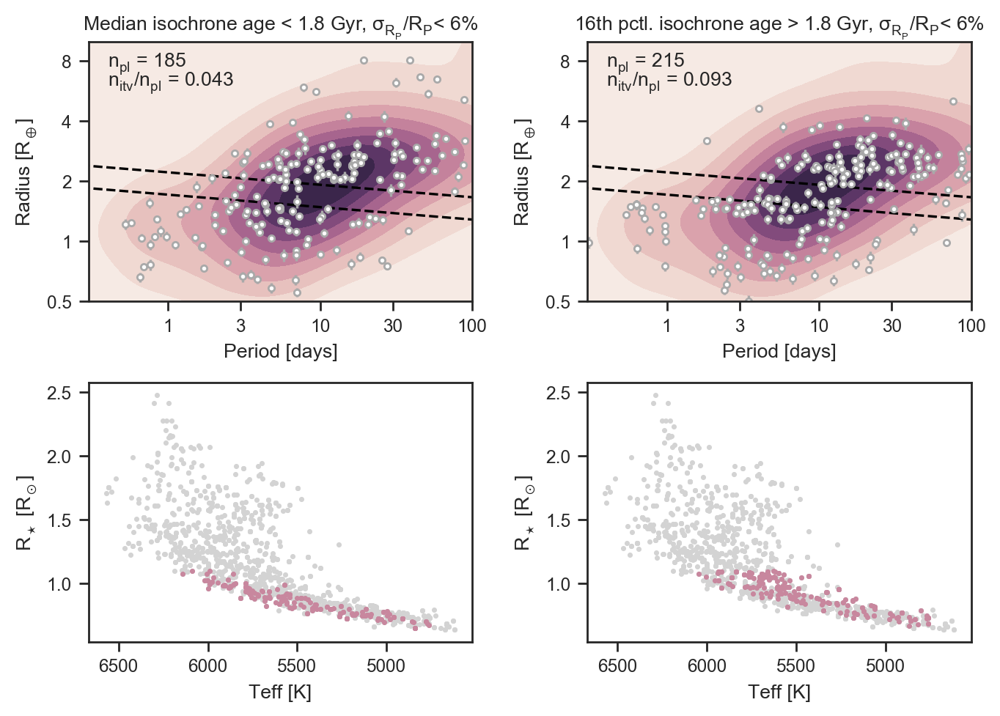

In [113]:
smed = np.median(slopes_A[3])
imed = np.median(intercepts_A[3])
mmed = np.median(margins_A[3])

def upper_margin(logp):
    return smed*logp + imed + np.sqrt(1+smed**2) * mmed

def lower_margin(logp):
    return smed*logp + imed - np.sqrt(1+smed**2) * mmed

# smpl1 = iso_allyng&m_plx&(cks['f18_R']<=1.1)&((cks['f18_E_Rp']/cks['f18_Rp'])<0.06)#&(cks['f18_Teff']>5500)
# smpl2 = iso_old&m_plx&(cks['f18_R']<=1.1)&((cks['f18_E_Rp']/cks['f18_Rp'])<0.06)#&(cks['f18_Teff']>5500)

#smpl1 = iso_allyng&(cks['f18_R']<=1.1)&(cks['rp_prec']<6)&(cks['f18_Teff']>5500)
#smpl2 = iso_old&(cks['f18_R']<=1.1)&(cks['rp_prec']<6)&(cks['f18_Teff']>5500)

# smpl1 = common_cuts & (cks['f18_logAiso']<9.25) & (cks['rp_prec']<6) & (cks['f18_R']<=1.1) #& (cks['f18_age_pcterr']<2) #& (cks['prot']<curtis_teff_gyrochrone(cks['f18_Teff'], kind='ngc6819+ruprecht147'))# & m_ageerr
# smpl2 = common_cuts & (cks['f18_logAiso']>9.25) & (cks['rp_prec']<6) & (cks['f18_R']<=1.1) #& (cks['f18_age_pcterr']<2) #& (np.isnan(cks['prot']))# & m_ageerr 


#smpl2 = common_cuts & (cks['f18_logAiso']>9.25) & (cks['rp_prec']<4) & (cks['f18_R']<=1.1)

#Interesting region of parameter space
#smpl2 = iso_old&(cks['f18_R']<=1.1)&(cks['rp_prec']<6)




#smpl1 = iso_allyng & (cks['rp_prec']<6) & (cks['f18_R']<=1.1)
#smpl2 = iso_old & (cks['rp_prec']<6) & (cks['f18_R']<=1.1)

#Final
smpl1 = common_cuts & (cks['f18_age']<1.8) & (cks['rp_prec']<7.5) & (cks['f18_R']<=1.1)
smpl2 = common_cuts & (cks['f18_agelo']>1.8) & (cks['rp_prec']<7.5) & (cks['f18_R']<=1.1)


cmap = sns.cubehelix_palette(start=3, light=0.95, as_cmap=True)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(7,5))

#Examining the radius distribution of the young planets
_x, _y = np.array(np.log10(cks['f18_P'])), np.array(np.log10(cks['f18_Rp']))
_yerr = np.array([_y-np.log10(cks['f18_Rp']-cks['f18_e_Rp']), np.log10(cks['f18_Rp']+cks['f18_E_Rp'])-_y])
_m = (np.isfinite(_x))&(np.isfinite(_y))


__p = []

for i,smpl in enumerate([smpl1, smpl2]):
    _ax = ax[0][i]

    sns.kdeplot(x=_x[_m], y=_y[_m], fill=True, thresh=0, cmap=cmap, ax=_ax)
    #sns.kdeplot(x=_x[smpl], y=_y[smpl], fill=True, thresh=0, cmap=cmap, ax=_ax)


    #To give same visual weight
#     _arg = np.random.choice(len(_x[smpl1]), len(_x[smpl1]), replace=False)
    
#     _ax.errorbar(_x[smpl][_arg], _y[smpl][_arg], yerr=[_yerr[0][smpl][_arg], _yerr[1][smpl][_arg]], 
#              fmt='o', color='white', mec='darkgrey', ms=3, mew=1, ecolor='darkgrey')
    
    _ax.errorbar(_x[smpl], _y[smpl], yerr=[_yerr[0][smpl], _yerr[1][smpl]], 
             fmt='o', color='white', mec='darkgrey', ms=3, mew=1, ecolor='darkgrey')
    
    
    _itv = (_y[smpl]>lower_margin(_x[smpl]))&(_y[smpl]<upper_margin(_x[smpl]))

    __p.append(_x[smpl][_itv])

    _ax.set_xlabel('Period [days]')
    _ax.set_ylabel(r'Radius [$\mathregular{R_\oplus}$]')
    

    _ax.set_xticks(np.log10([1,3,10,30,100]))
    _ax.set_xticklabels(['1','3','10','30','100'])
    
    
    _ax.set_yticks(np.log10([0.5,1,2,4,8]))
    _ax.set_yticklabels(['0.5','1','2','4','8'])
    
    _ax.set_xlim(np.log10(0.3),2)
    _ax.set_ylim(np.log10(0.5),1)

    _ax.plot(np.log10([0.1,100]),upper_margin(np.log10([0.1,100])), 'k--')
    _ax.plot(np.log10([0.1,100]),lower_margin(np.log10([0.1,100])), 'k--')
    _ax.text(np.log10(0.4), np.log10(7.5), r"$\mathregular{n_{pl}}$ = "+str(int(len(_x[smpl]))))
    _ax.text(np.log10(0.4), np.log10(6), r"$\mathregular{n_{itv}/n_{pl}}$ = "+"%.3f"%(len(_x[smpl][_itv])/len(_x[smpl])))

    
    ax[1][i].scatter(cks['f18_Teff'][common_cuts], cks['f18_R'][common_cuts], color='lightgrey', s=3)
    ax[1][i].scatter(cks['f18_Teff'][smpl], cks['f18_R'][smpl], color=cpal[1], s=3)
    #ax[1][i].scatter(cks['f18_Teff'][smpl][_itv], cks['f18_R'][smpl][_itv], color=cpal[1], edgecolor='k', s=3)
    
    
    #ax[1][i].semilogy()
    ax[1][i].invert_xaxis()
    ax[1][i].set_xlabel('Teff [K]')
    ax[1][i].set_ylabel(r'$\mathregular{R_\star~[R_\odot]}$')
    
    
ax[0][0].set_title(r'Median isochrone age < 1.8 Gyr, $\mathregular{\sigma_{R_P}/R_P}$< 6%')
ax[0][1].set_title(r'16th pctl. isochrone age > 1.8 Gyr, $\mathregular{\sigma_{R_P}/R_P}$< 6%')

plt.tight_layout()
#if fig_overwrite==True:
#    plt.savefig('../figures/pr-precision.pdf')
plt.show()

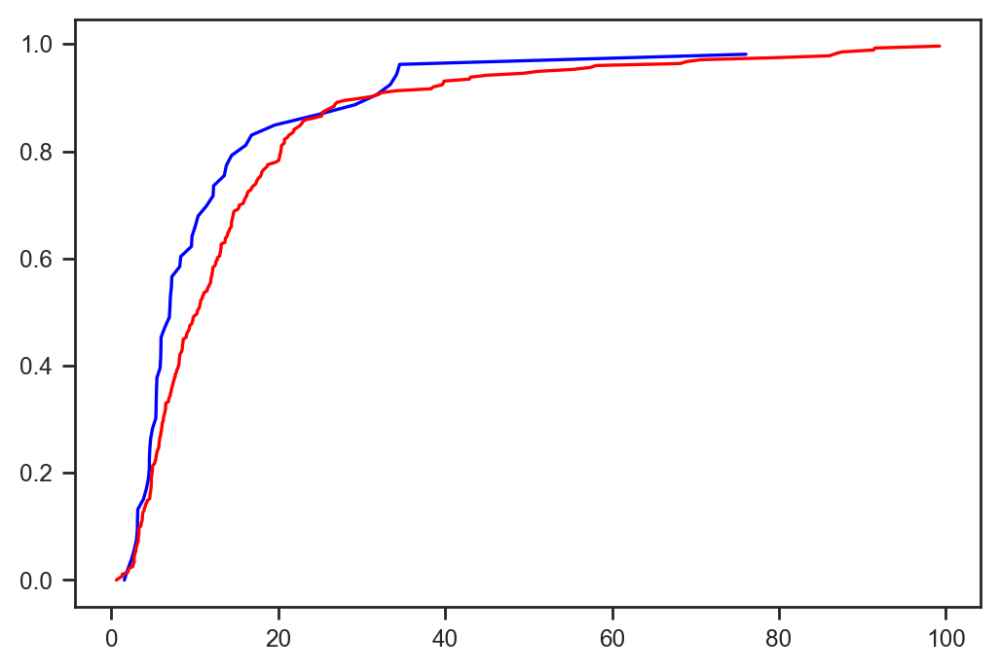

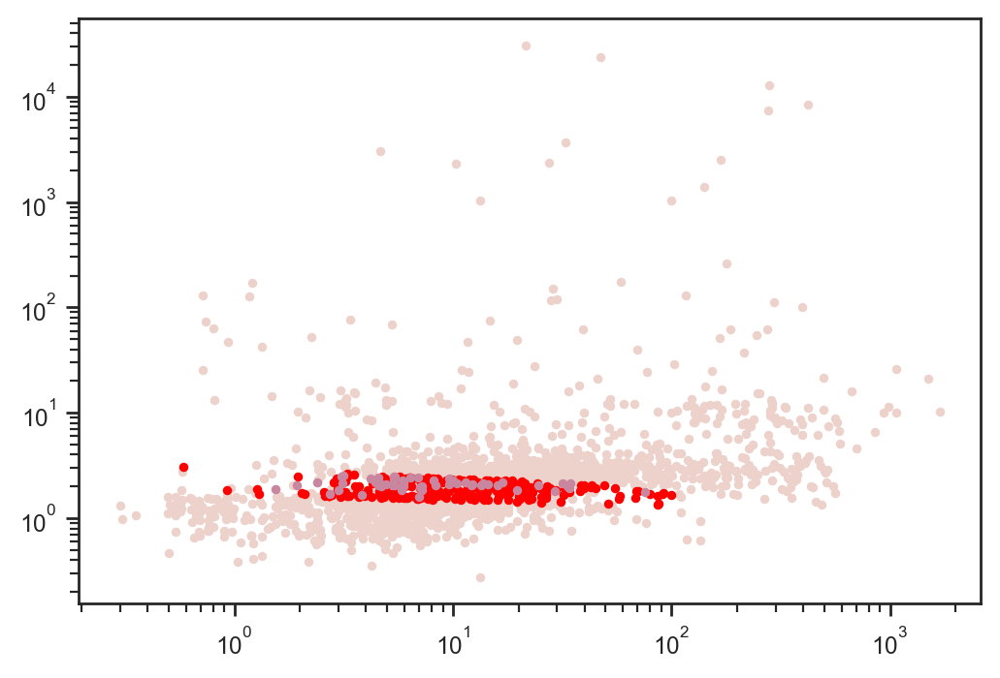

Anderson_ksampResult(statistic=3.9713939062309533, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), significance_level=0.00827252645363768)
Anderson_ksampResult(statistic=0.2049236893951575, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752, 4.592, 6.546]), significance_level=0.25)


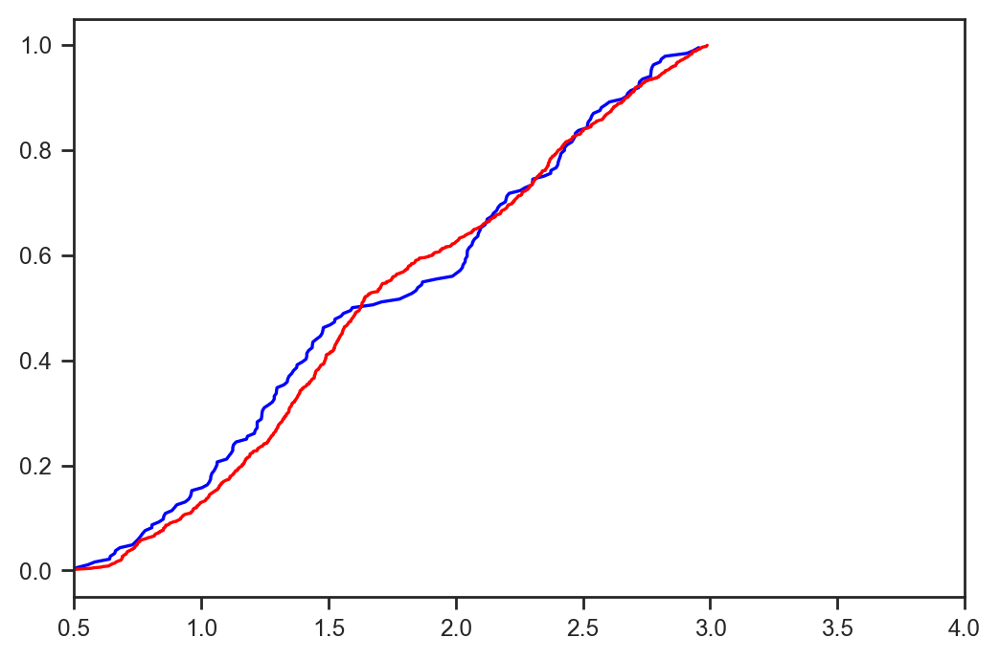

In [114]:
def upper_margin(logp, sample):
    if sample=="A":
        smed = np.median(slopes_A[:][0])
        imed = np.median(intercepts_A[:][0])
        mmed = np.median(margins_A[:][0])        
    elif sample=="B":
        smed = np.median(slopes_B[:][3])
        imed = np.median(intercepts_B[:][3])
        mmed = np.median(margins_B[:][3])                
    elif sample=="C":
        smed = np.median(slopes_C[:][3])
        imed = np.median(intercepts_C[:][3])
        mmed = np.median(margins_C[:][3])
    elif sample=="D":
        smed = np.median(slopes_D[:][3])
        imed = np.median(intercepts_D[:][3])
        mmed = np.median(margins_D[:][3])        
        
    
    return smed*logp + imed + np.sqrt(1+smed**2) * mmed

def lower_margin(logp, sample):
    if sample=="A":
        smed = np.median(slopes_A[:][3])
        imed = np.median(intercepts_A[:][3])
        mmed = np.median(margins_A[:][3])        
    elif sample=="B":
        smed = np.median(slopes_B[:][3])
        imed = np.median(intercepts_B[:][3])
        mmed = np.median(margins_B[:][3])                
    elif sample=="C":
        smed = np.median(slopes_C[:][3])
        imed = np.median(intercepts_C[:][3])
        mmed = np.median(margins_C[:][3])                            
    elif sample=="D":
        smed = np.median(slopes_D[:][3])
        imed = np.median(intercepts_D[:][3])
        mmed = np.median(margins_D[:][3])                                    
    
    return smed*logp + imed - np.sqrt(1+smed**2) * mmed


m_itv = (np.log10(cks['f18_Rp'])>lower_margin(np.log10(cks['f18_P']), sample='A')) & (np.log10(cks['f18_Rp'])<upper_margin(np.log10(cks['f18_P']), sample='A'))


thresh=10

#How do period distributions differ for planets in the valley
cdfx1,cdfy1 = cdf(cks['f18_P'][iso_allyng&m_itv&(cks['rp_prec']<thresh)])
cdfx2,cdfy2 = cdf(cks['f18_P'][iso_old&m_itv&(cks['rp_prec']<thresh)])

plt.plot(cdfx1,cdfy1,'b')
plt.plot(cdfx2,cdfy2,'r')
plt.show()

plt.plot(cks['f18_P'], cks['f18_Rp'], '.')
plt.plot(cks['f18_P'][iso_old&m_itv&(cks['rp_prec']<thresh)], cks['f18_Rp'][iso_old&m_itv&(cks['rp_prec']<thresh)], 'r.')
plt.plot(cks['f18_P'][iso_allyng&m_itv&(cks['rp_prec']<thresh)], cks['f18_Rp'][iso_allyng&m_itv&(cks['rp_prec']<thresh)], '.')
plt.loglog()
plt.show()

ad_result = stats.anderson_ksamp([cks['f18_P'][iso_allyng&m_itv&(cks['rp_prec']<7.5)], 
                                  cks['f18_P'][iso_old&m_itv&(cks['rp_prec']<7.5)]])
print(ad_result)


cdfx1,cdfy1 = cdf(cks['f18_Rp'][iso_allyng&(cks['rp_prec']<thresh)&(cks['f18_Rp']<3)])
cdfx2,cdfy2 = cdf(cks['f18_Rp'][iso_old&(cks['rp_prec']<thresh)&(cks['f18_Rp']<3)])

plt.plot(cdfx1,cdfy1,'b')
plt.plot(cdfx2,cdfy2,'r')
plt.xlim(0.5,4)

ad_result = stats.anderson_ksamp([cks['f18_Rp'][iso_allyng&(cks['rp_prec']<thresh)], 
                                  cks['f18_Rp'][iso_old&(cks['rp_prec']<thresh)]])
print(ad_result)

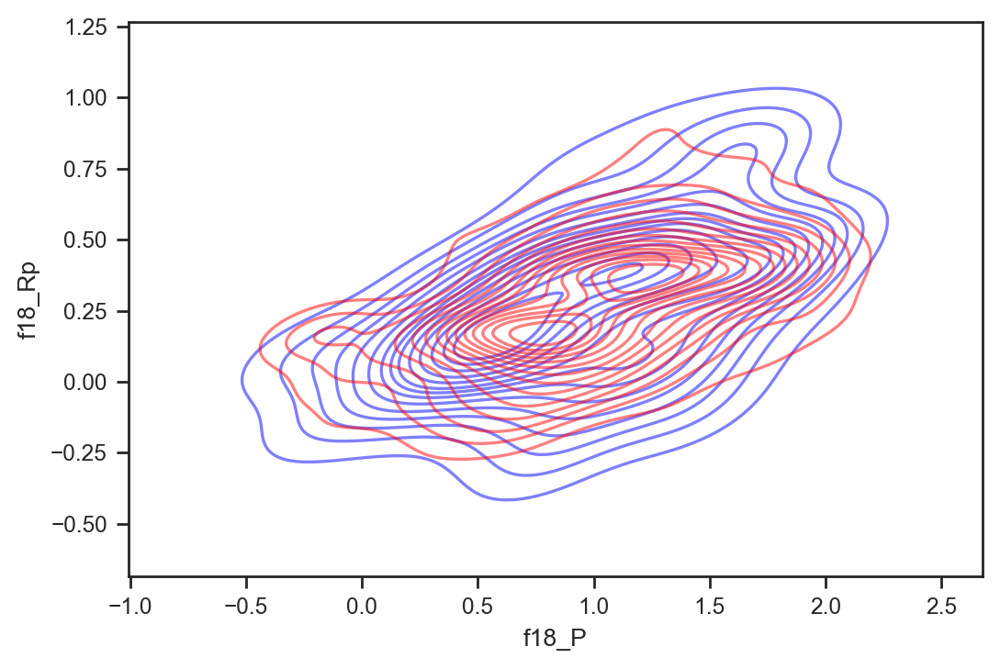

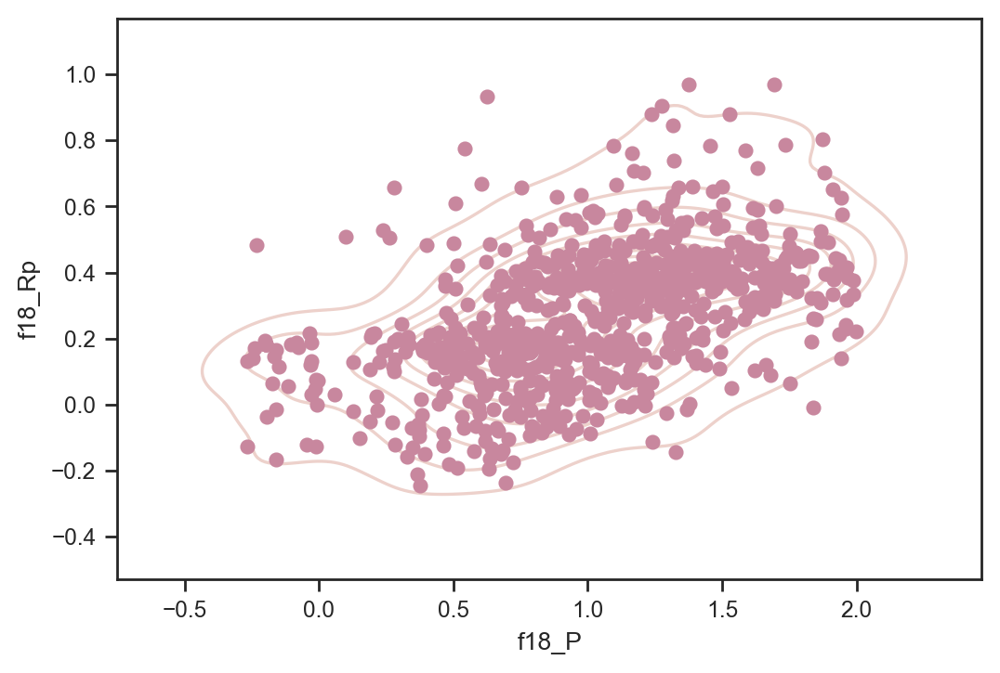

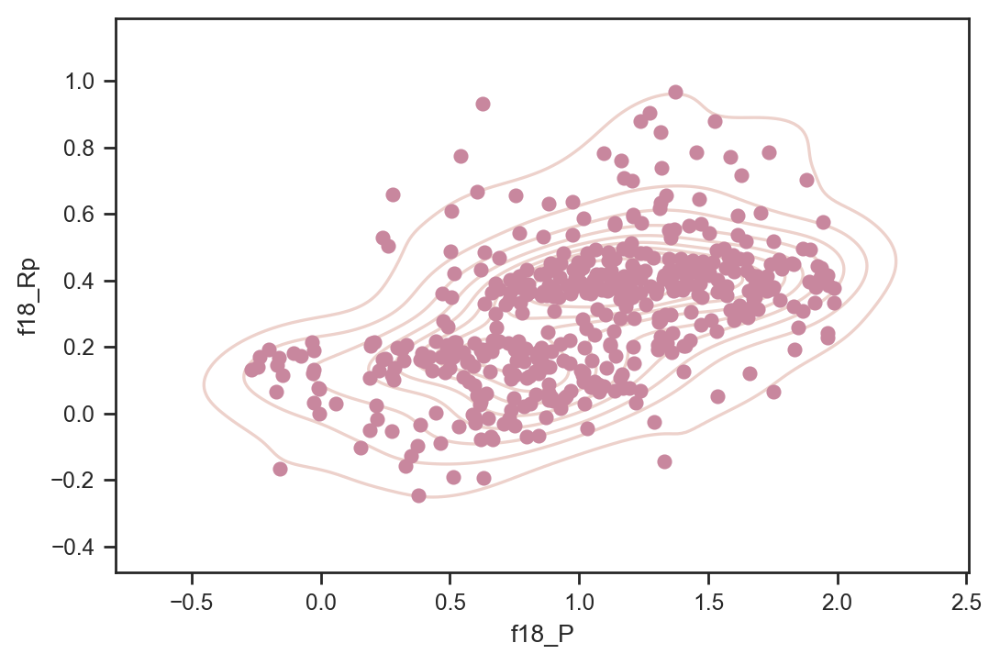

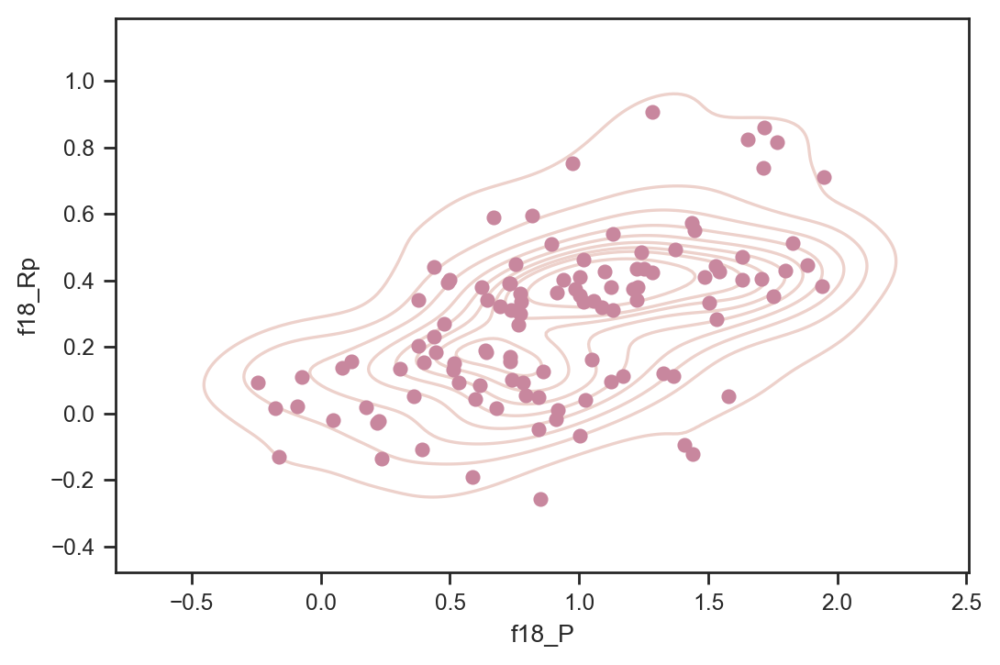

In [123]:
thresh=6
#sns.kdeplot(np.log10(cks['f18_P'][common_cuts&(cks['rp_prec']<thresh)]), np.log10(cks['f18_Rp'][common_cuts&(cks['rp_prec']<thresh)]))
sns.kdeplot(np.log10(cks['f18_P'][iso_yng&(cks['rp_prec']<thresh)]), np.log10(cks['f18_Rp'][iso_yng&(cks['rp_prec']<thresh)]), color='b', levels=15, alpha=0.5)
sns.kdeplot(np.log10(cks['f18_P'][iso_old&(cks['rp_prec']<thresh)]), np.log10(cks['f18_Rp'][iso_old&(cks['rp_prec']<thresh)]), color='r', levels=15, alpha=0.5)
plt.show()

thresh=6
sns.kdeplot(np.log10(cks['f18_P'][common_cuts&(cks['rp_prec']<thresh)]), np.log10(cks['f18_Rp'][common_cuts&(cks['rp_prec']<thresh)]))
plt.plot(np.log10(cks['f18_P'][iso_old&(cks['rp_prec']<thresh)]), np.log10(cks['f18_Rp'][iso_old&(cks['rp_prec']<thresh)]), 'o')
plt.show()


thresh=5
sns.kdeplot(np.log10(cks['f18_P'][common_cuts&m_nongrazing&(cks['rp_prec']<thresh)]), np.log10(cks['f18_Rp'][common_cuts&m_nongrazing&(cks['rp_prec']<thresh)]))
plt.plot(np.log10(cks['f18_P'][iso_old&m_nongrazing&(cks['rp_prec']<thresh)]), np.log10(cks['f18_Rp'][iso_old&m_nongrazing&(cks['rp_prec']<thresh)]), 'o')
plt.show()


sns.kdeplot(np.log10(cks['f18_P'][common_cuts&m_nongrazing&(cks['rp_prec']<thresh)]), np.log10(cks['f18_Rp'][common_cuts&m_nongrazing&(cks['rp_prec']<thresh)]))
plt.plot(np.log10(cks['f18_P'][iso_allyng&m_nongrazing&(cks['rp_prec']<thresh)]), np.log10(cks['f18_Rp'][iso_allyng&m_nongrazing&(cks['rp_prec']<thresh)]), 'o')
plt.show()

In [124]:
print(np.median(cks['rp_prec'][common_cuts]))
print(np.nanmedian(cks['rp_prec']))

print(np.percentile(cks['rp_prec'][iso_yng], [16.,50.,84.]))
print(np.percentile(cks['rp_prec'][iso_allyng], [16.,50.,84.]))
print(np.percentile(cks['rp_prec'][iso_old], [16.,50.,84.]))

print(np.percentile(cks['rp_prec'][gyro_yng], [16.,50.,84.]))
print(np.percentile(cks['rp_prec'][gyro_old], [16.,50.,84.]))
print(np.percentile(cks['rp_prec'][gyro_nop], [16.,50.,84.]))

5.014409221902016
5.232400522867026
[3.15820004 4.51352369 7.76660488]
[3.16811021 4.51352369 7.72711599]
[3.47578376 5.17241379 8.47220745]
[3.24298942 4.59467299 7.17837114]
[3.42667522 5.07176379 7.67061195]
[3.51577362 5.35162808 9.35214511]


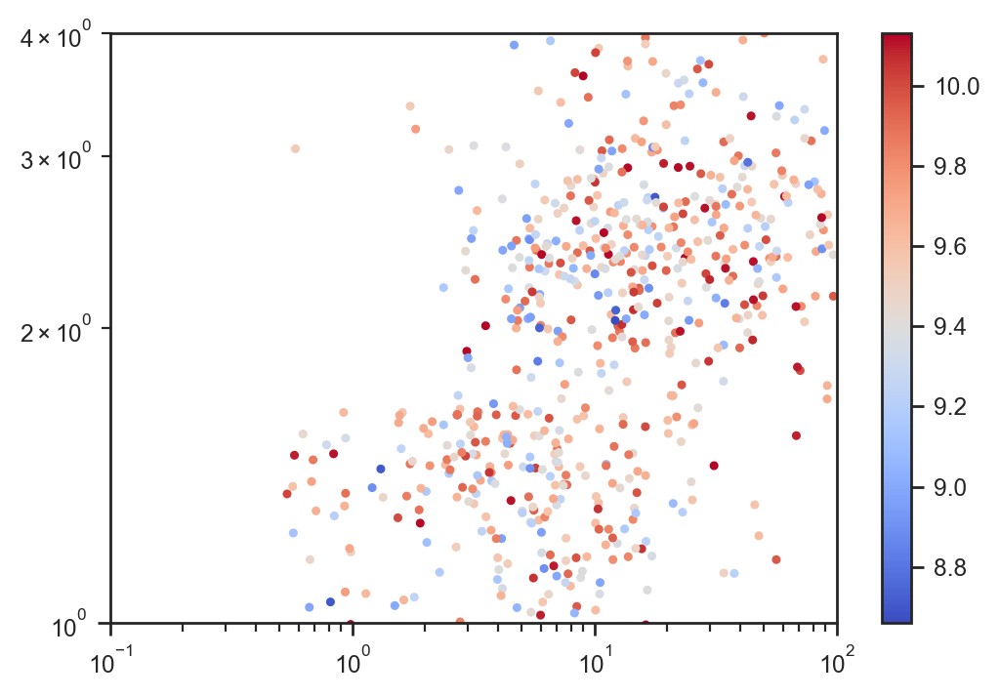

In [125]:
thresh=5

tmp = common_cuts&(cks['rp_prec']<thresh)
plt.scatter(cks['f18_P'][tmp], 
            cks['f18_Rp'][tmp], c=cks['f18_logAiso'][tmp], cmap='coolwarm', s=6)

plt.loglog()
plt.xlim(0.1,100)
plt.ylim(1,4)
plt.colorbar()
plt.show()

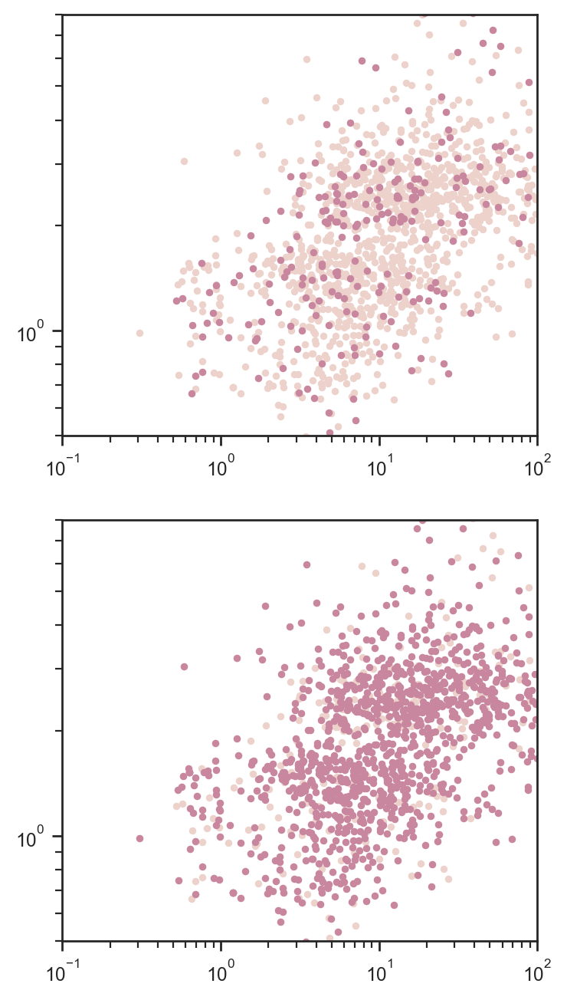

In [128]:
thresh=10

plt.subplot(211)
plt.plot(cks['f18_P'][common_cuts&(cks['rp_prec']<thresh)], cks['f18_Rp'][common_cuts&(cks['rp_prec']<thresh)], '.')
plt.plot(cks['f18_P'][iso_allyng&(cks['rp_prec']<thresh)], cks['f18_Rp'][iso_allyng&(cks['rp_prec']<thresh)], '.')
plt.loglog()
plt.xlim(0.1,100)
plt.ylim(0.5,8)

plt.subplot(212)
plt.plot(cks['f18_P'][common_cuts&(cks['rp_prec']<thresh)], cks['f18_Rp'][common_cuts&(cks['rp_prec']<thresh)], '.')
plt.plot(cks['f18_P'][iso_old&(cks['rp_prec']<thresh)], cks['f18_Rp'][iso_old&(cks['rp_prec']<thresh)], '.')
plt.loglog()
plt.xlim(0.1,100)
plt.ylim(0.5,8)

plt.gcf().set_size_inches(4,8)

In [129]:
for pr in prec:    
    tmp = len(cks['rp_prec'][common_cuts&(cks['rp_prec']<pr)])
    plt.plot(pr, tmp, '.')
plt.xlim(2.5,15)
plt.show()

NameError: name 'prec' is not defined

In [130]:
def upper_margin(logp, sample):
    if sample=="A":
        smed = np.median(slopes_A[:][3])
        imed = np.median(intercepts_A[:][3])
        mmed = np.median(margins_A[:][3])        
    elif sample=="B":
        smed = np.median(slopes_B[:][3])
        imed = np.median(intercepts_B[:][3])
        mmed = np.median(margins_B[:][3])                
    elif sample=="C":
        smed = np.median(slopes_C[:][3])
        imed = np.median(intercepts_C[:][3])
        mmed = np.median(margins_C[:][3])                        
    
    return smed*logp + imed + np.sqrt(1+smed**2) * mmed

def lower_margin(logp, sample):
    if sample=="A":
        smed = np.median(slopes_A[:][3])
        imed = np.median(intercepts_A[:][3])
        mmed = np.median(margins_A[:][3])        
    elif sample=="B":
        smed = np.median(slopes_B[:][3])
        imed = np.median(intercepts_B[:][3])
        mmed = np.median(margins_B[:][3])                
    elif sample=="C":
        smed = np.median(slopes_C[:][3])
        imed = np.median(intercepts_C[:][3])
        mmed = np.median(margins_C[:][3])                            
    
    return smed*logp + imed - np.sqrt(1+smed**2) * mmed



#THIS NEEDS TO BE WRITTEN MORE CLEARLY
#Bootstrapping
_x, _y = np.array(np.log10(cks['f18_P'])), np.array(np.log10(cks['f18_Rp']))  
_yerr = np.max([_y-np.log10(cks['f18_Rp']-cks['f18_e_Rp']), np.log10(cks['f18_Rp']+cks['f18_E_Rp'])-_y],axis=0)
_z = np.array(cks['rp_prec'])

prec = np.arange(3.0,20.5,0.5)

fitv_yng = [[] for i in range(len(prec))]
fitv_old = [[] for i in range(len(prec))]
fitv_base = [[] for i in range(len(prec))]
fitv_frac = [[] for i in range(len(prec))]
fitv_gyng = [[] for i in range(len(prec))]
fitv_gold = [[] for i in range(len(prec))]

nst_yng = [[] for i in range(len(prec))]
nst_old = [[] for i in range(len(prec))]
nst_base = [[] for i in range(len(prec))]
nst_gyng = [[] for i in range(len(prec))]
nst_gold = [[] for i in range(len(prec))]

for i,pr in enumerate(prec):
    for __ in range(100):
        
        smpl1 = iso_allyng & (cks['rp_prec']<pr) 
        smpl2 = iso_old & (cks['rp_prec']<pr) #& (cks['f18_logAiso']-cks['f18_e_logAiso']>9.25)
        smpl3 = common_cuts & (cks['rp_prec']<pr)
        
        x1 = _x[smpl1]
        x2 = _x[smpl2]
        x3 = _x[smpl3]
        
        y1 = np.random.normal(_y[smpl1], _yerr[smpl1])
        y2 = np.random.normal(_y[smpl2], _yerr[smpl2])
        y3 = np.random.normal(_y[smpl3], _yerr[smpl3])
        
        z1 = _z[smpl1]
        z2 = _z[smpl2]
        
        bsarg1 = np.random.choice(len(x1), len(x1), replace=True)
        #bsarg2 = np.random.choice(len(x2), len(x1), replace=True)
        bsarg2 = np.random.choice(len(x2), len(x2), replace=True)
        bsarg3 = np.random.choice(len(x3), len(x3), replace=True)
        
        _itv1 = (y1[bsarg1]>lower_margin(x1[bsarg1], sample='B'))&(y1[bsarg1]<upper_margin(x1[bsarg1], sample='B'))
        _itv2 = (y2[bsarg2]>lower_margin(x2[bsarg2], sample='B'))&(y2[bsarg2]<upper_margin(x2[bsarg2], sample='B'))
        _itv3 = (y3[bsarg3]>lower_margin(x3[bsarg3], sample='B'))&(y3[bsarg3]<upper_margin(x3[bsarg3], sample='B'))

        fitv_yng[i].append(len(x1[bsarg1][_itv1])/len(x1[bsarg1]))
        fitv_old[i].append(len(x2[bsarg2][_itv2])/len(x2[bsarg2]))
        fitv_base[i].append(len(x3[bsarg3][_itv3])/len(x3[bsarg3]))
        
        try:
            fitv_frac[i].append( (len(x2[bsarg2][_itv2])/len(x2[bsarg2])) / (len(x1[bsarg1][_itv1])/len(x1[bsarg1])))
        except:
            fitv_frac[i].append(np.nan)

        nst_yng[i].append(len(x1[bsarg1]))
        nst_old[i].append(len(x2[bsarg2]))
        nst_base[i].append(len(x3[bsarg3]))
        
        # Gyro sample
        smpl1 = gyro_yng & (cks['rp_prec']<pr) 
        smpl2 = np.any([gyro_old, gyro_nop], axis=0) & (cks['rp_prec']<pr)
        #smpl2 = gyro_nop & (cks['rp_prec']<pr) 
        
        x1 = _x[smpl1]
        x2 = _x[smpl2]
        
        y1 = np.random.normal(_y[smpl1], _yerr[smpl1])
        y2 = np.random.normal(_y[smpl2], _yerr[smpl2])
        
        z1 = _z[smpl1]
        z2 = _z[smpl2]
        
        bsarg1 = np.random.choice(len(x1), len(x1), replace=True)
        #bsarg2 = np.random.choice(len(x2), len(x1), replace=True)
        bsarg2 = np.random.choice(len(x2), len(x2), replace=True)
        
        _itv1 = (y1[bsarg1]>lower_margin(x1[bsarg1], sample='C'))&(y1[bsarg1]<upper_margin(x1[bsarg1], sample='C'))
        _itv2 = (y2[bsarg2]>lower_margin(x2[bsarg2], sample='C'))&(y2[bsarg2]<upper_margin(x2[bsarg2], sample='C'))

        fitv_gyng[i].append(len(x1[bsarg1][_itv1])/len(x1[bsarg1]))
        fitv_gold[i].append(len(x2[bsarg2][_itv2])/len(x2[bsarg2]))

        nst_gyng[i].append(len(x1[bsarg1]))
        nst_gold[i].append(len(x2[bsarg2]))
        
        
#         #print(len(_y[smpl1]), len(_y[smpl2]))
#         _itv1 = (_y[smpl1]>lower_margin(_x[smpl1]))&(_y[smpl1]<upper_margin(_x[smpl1]))
#         _itv2 = (_y[smpl2]>lower_margin(_x[smpl2]))&(_y[smpl2]<upper_margin(_x[smpl2]))

#         fitv_gyng.append(len(_x[smpl1][_itv1])/len(_x[smpl1]))
#         fitv_gold.append(len(_x[smpl2][_itv2])/len(_x[smpl2]))

#         nst_gyng.append(len(_x[smpl1]))
#         nst_gold.append(len(_x[smpl2]))    


/Users/tdavid/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


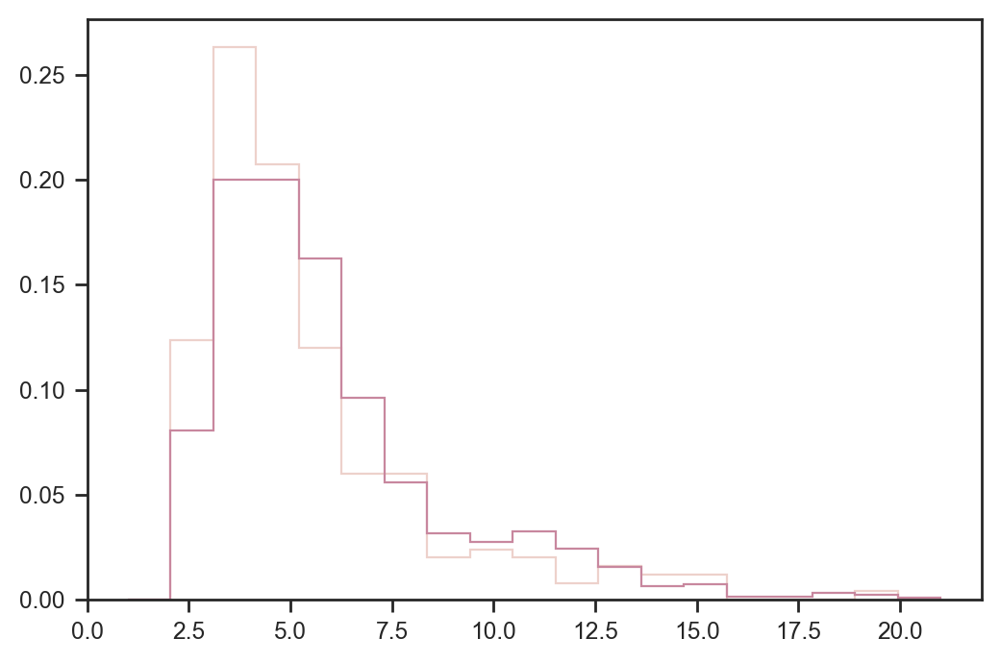

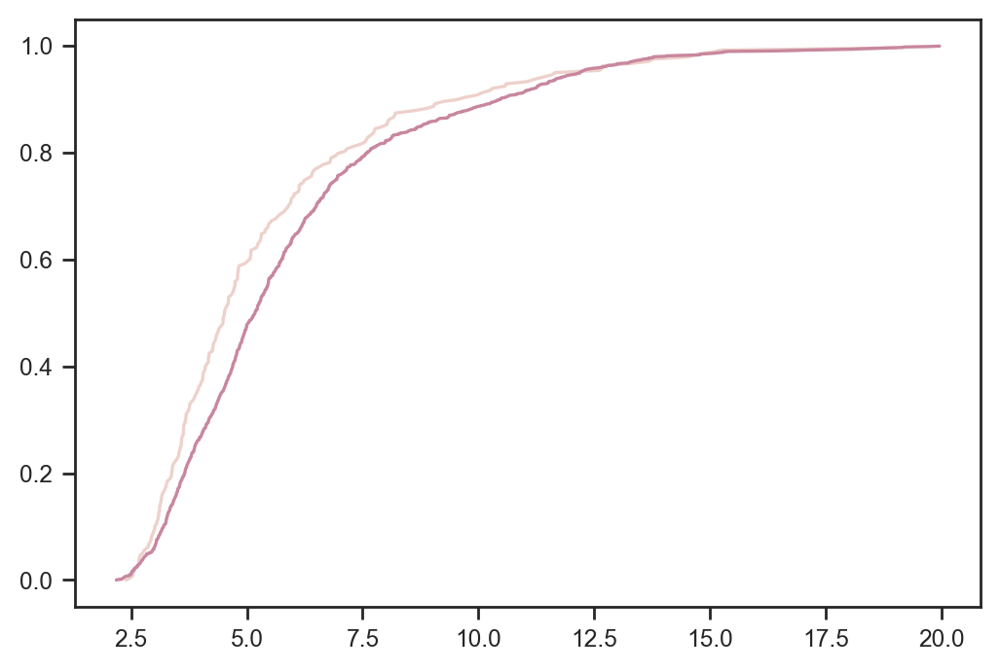

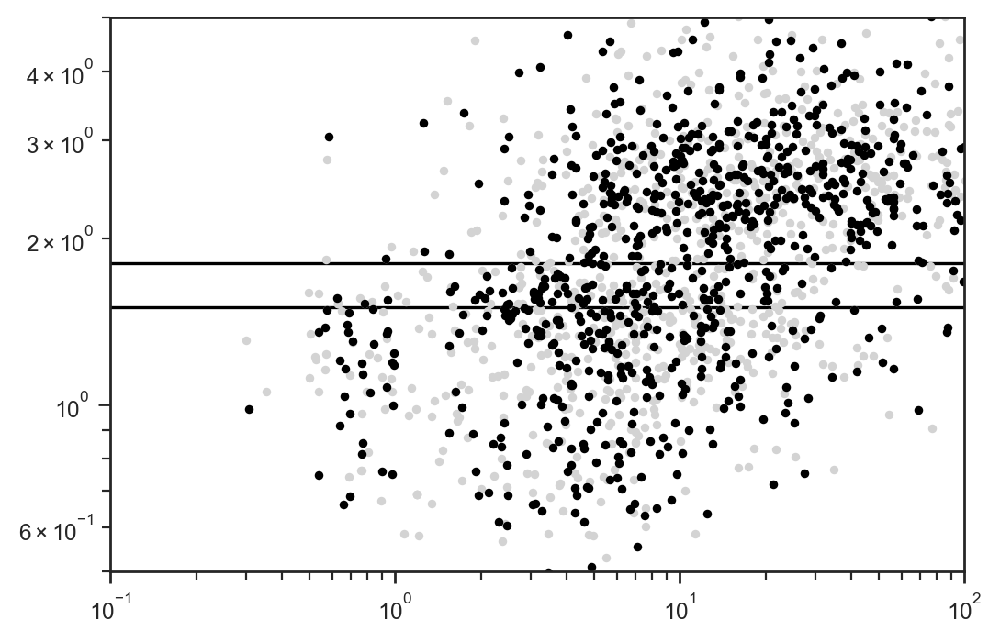

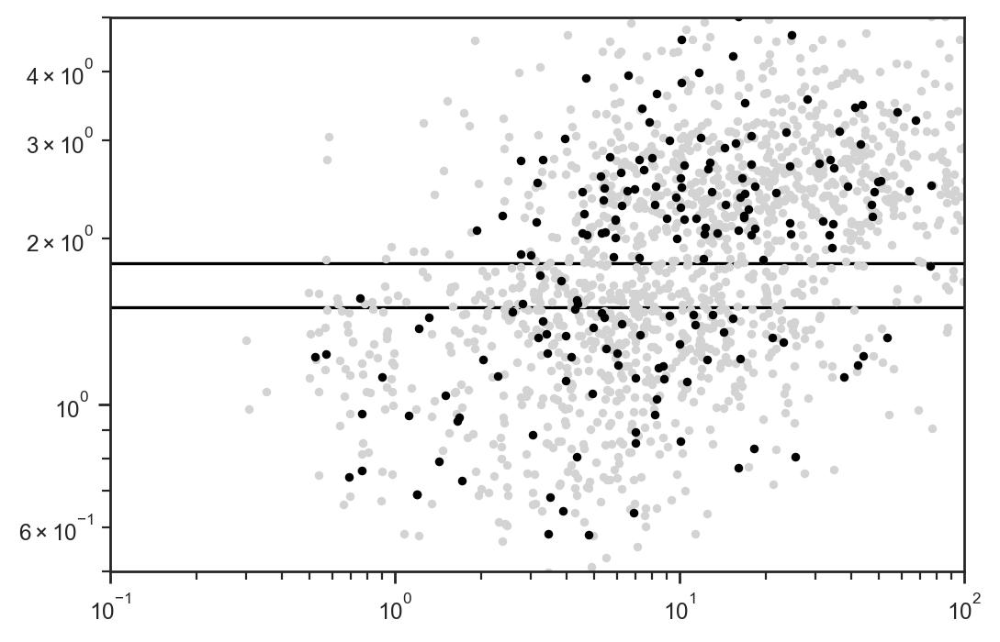

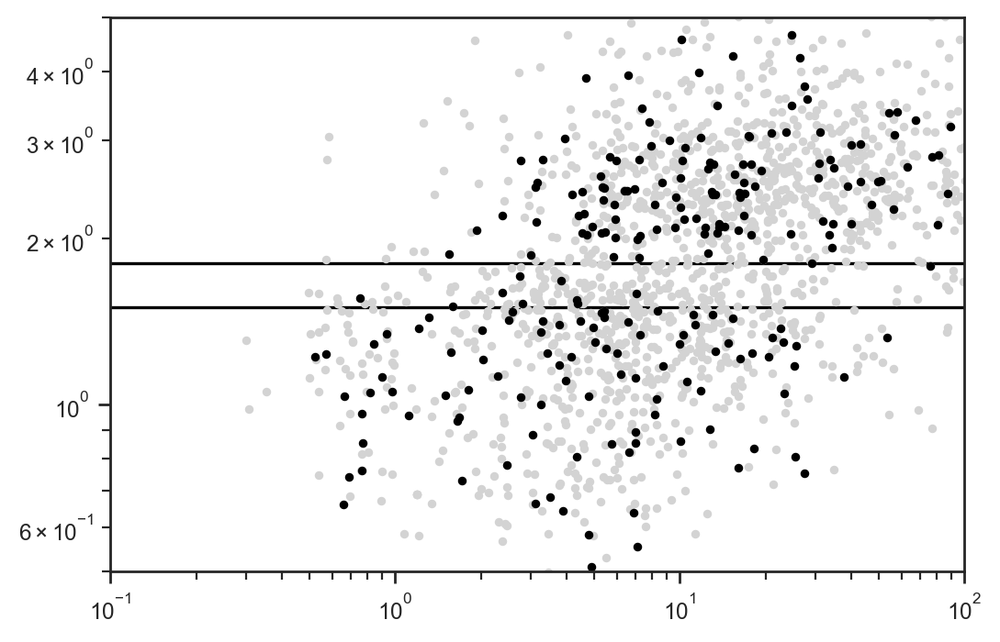

In [1690]:
plt.hist(cks['rp_prec'][iso_allyng], bins=np.linspace(1,21,20), histtype='step', density=True)
plt.hist(cks['rp_prec'][iso_old], bins=np.linspace(1,21,20), histtype='step', density=True)
plt.show()

ad_result = stats.anderson_ksamp([cks['rp_prec'][iso_allyng], 
                                  cks['rp_prec'][iso_old]])


_cdfx,_cdfy = cdf(cks['rp_prec'][iso_allyng])
plt.plot(_cdfx, _cdfy)

_cdfx,_cdfy = cdf(cks['rp_prec'][iso_old])
plt.plot(_cdfx, _cdfy)
plt.show()



#np.any([True, True, False],[True,False,False])

tmp = np.any([gyro_old, gyro_nop], axis=0)

plt.plot(cks['f18_P'], cks['f18_Rp'], '.', color='lightgrey')
plt.plot(cks['f18_P'][tmp], cks['f18_Rp'][tmp], 'k.')
plt.loglog()
plt.hlines([1.5,1.8],xmin=0.1,xmax=100,color='k')
plt.xlim(0.1,100)
plt.ylim(0.5,5)
plt.show()


plt.plot(cks['f18_P'], cks['f18_Rp'], '.', color='lightgrey')
plt.plot(cks['f18_P'][gyro_yng], cks['f18_Rp'][gyro_yng], 'k.')
#plt.axhline(1.6,color='k')
#plt.axhline(1.8,color='k')
plt.hlines([1.5,1.8],xmin=0.1,xmax=100,color='k')
plt.loglog()
plt.xlim(0.1,100)
plt.ylim(0.5,5)
plt.show()

plt.plot(cks['f18_P'], cks['f18_Rp'], '.', color='lightgrey')
plt.plot(cks['f18_P'][iso_allyng], cks['f18_Rp'][iso_allyng], 'k.')
#plt.axhline(1.6,color='k')
#plt.axhline(1.8,color='k')
plt.hlines([1.5,1.8],xmin=0.1,xmax=100,color='k')
plt.loglog()
plt.xlim(0.1,100)
plt.ylim(0.5,5)
plt.show()

In [1705]:
print(np.arange(10,100,10))
print(np.percentile(cks['rp_prec'][common_cuts], np.arange(10,100,10)))

[10 20 30 40 50 60 70 80 90]
[ 3.14684948  3.59357837  4.07042759  4.59067544  5.01440922  5.64106385
  6.38792677  7.54859425 10.31953537]


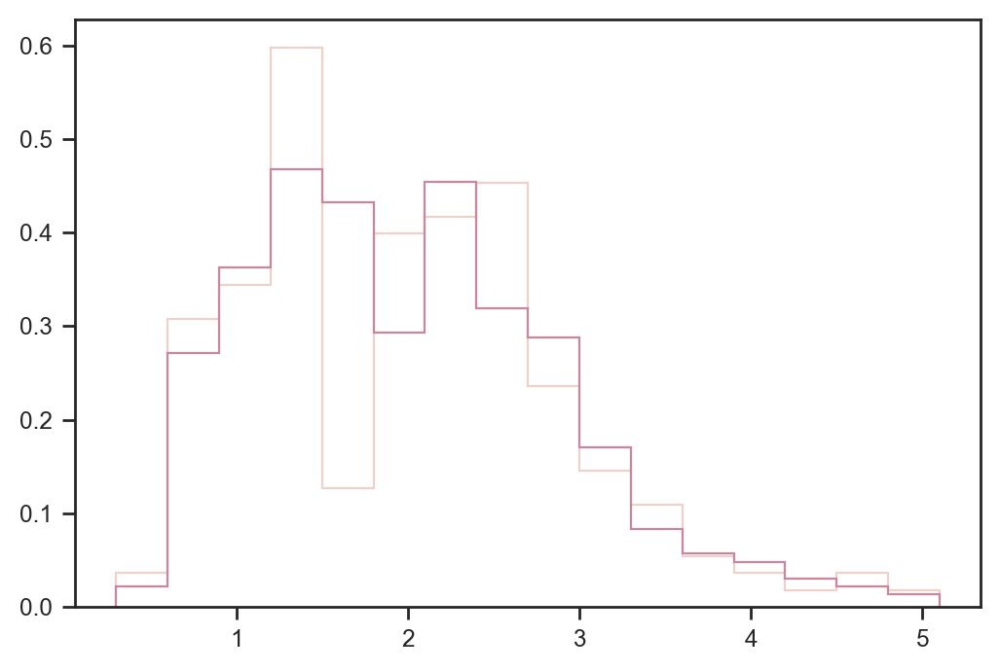

In [1693]:
#bins = [0.6,0.9,1.2,1.5,1.8,2.1,2.5,2.8,3.1,3.4,3.7,4.1]
bins = np.arange(0.3,5.3,0.3)
plt.hist(cks['f18_Rp'][gyro_yng], bins=bins, histtype='step', density=True)
plt.hist(cks['f18_Rp'][tmp], bins=bins, histtype='step', density=True)
plt.show()

In [1665]:
print(np.nanpercentile(cks['rp_prec'][common_cuts], 50))
print(np.nanpercentile(cks['rp_prec'][iso_allyng], 50))
print(np.nanpercentile(cks['rp_prec'][iso_old], 50))

5.014409221902016
4.513523692072331
5.172413793103448


In [1656]:
tmp = []

tmpx = np.arange(50,len(cks['f18_P'][common_cuts]))

#for i in range(len(tmpx)):

for i in range(1000):
    
    _x, _y = np.array(np.log10(cks['f18_P'][common_cuts])), np.array(np.log10(cks['f18_Rp'][common_cuts]))  
    _yerr = np.max([_y-np.log10(cks['f18_Rp'][common_cuts]-cks['f18_e_Rp'][common_cuts]), np.log10(cks['f18_Rp'][common_cuts]+cks['f18_E_Rp'][common_cuts])-_y],axis=0)
    
    #arg = np.random.choice(len(_x), tmpx[i], replace=False)
    arg = np.random.choice(len(_x), 150, replace=False)
    
    _itv = (_y[arg]>lower_margin(_x[arg], sample='A'))&(_y[arg]<upper_margin(_x[arg], sample='A'))
    
    tmp.append(len(_y[arg][_itv]))
    #tmp.append(len(_y[arg][_itv])/len(_y[arg]))
    
    #print(tmpx[i], len(_y[arg][_itv]))
    
    
#plt.plot(tmpx, tmp)
#plt.show()
print(np.mean(tmp), np.std(tmp), np.mean(tmp)/np.std(tmp))

20.551 4.033038432745217 5.0956618298356515


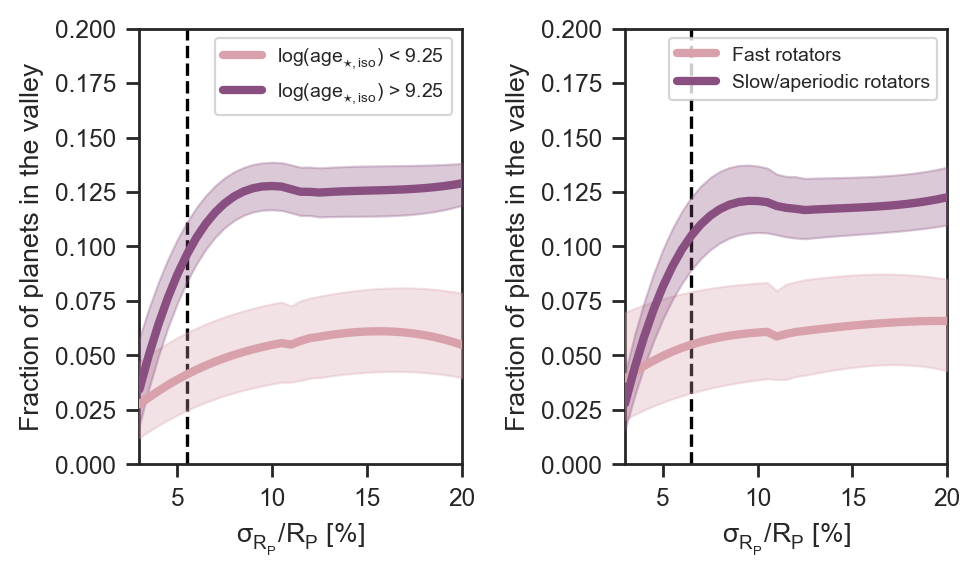

In [1711]:
from scipy import signal

y1 = signal.savgol_filter(np.percentile(fitv_yng, [50-0.5*68.3,
                                                  50,
                                                  50+0.5*68.3], axis=1), 31, 3)

y2 = signal.savgol_filter(np.percentile(fitv_old, [50-0.5*68.3,
                                                  50,
                                                  50+0.5*68.3], axis=1), 31, 3)

y3 = signal.savgol_filter(np.percentile(fitv_gyng, [50-0.5*68.3,
                                                  50,
                                                  50+0.5*68.3], axis=1), 31, 3)

y4 = signal.savgol_filter(np.percentile(fitv_gold, [50-0.5*68.3,
                                                  50,
                                                  50+0.5*68.3], axis=1), 31, 3)





plt.subplot(121)
#plt.plot(prec, np.median(fitv_yng, axis=1), color=tt_cpal[0], lw=3, label=r'$\mathregular{log(age_{\star,iso})}$ < 9.25', zorder=999)
#plt.fill_between(prec, np.percentile(fitv_yng, 16., axis=1), np.percentile(fitv_yng, 84., axis=1), color=tt_cpal[0], alpha=0.3, zorder=999)

plt.plot(prec, y1[1], lw=3, color=tt_cpal[0], label=r'$\mathregular{log(age_{\star,iso})}$ < 9.25', zorder=999)
plt.fill_between(prec, y1[0], y1[2], color=tt_cpal[0], alpha=0.3, zorder=999)

plt.plot(prec, y2[1], lw=3, color=tt_cpal[1], label=r'$\mathregular{log(age_{\star,iso})}$ > 9.25', zorder=999)
plt.fill_between(prec, y2[0], y2[2], color=tt_cpal[1], alpha=0.3, zorder=999)


_arg = np.array(np.mean(nst_yng, axis=1)>150)*np.array(np.mean(nst_old, axis=1)>150)
plt.axvline(prec[_arg][0], color='k', ls='--')


#plt.plot(prec, np.median(fitv_old, axis=1), color=tt_cpal[1], lw=3, label=r'$\mathregular{log(age_{\star,iso})}$ > 9.25')
#plt.fill_between(prec, np.percentile(fitv_old, 16., axis=1), np.percentile(fitv_old, 84., axis=1), color=tt_cpal[1], alpha=0.3)

plt.xlabel(r'$\mathregular{\sigma_{R_P}/R_P}$ [%]')
plt.ylabel('Fraction of planets in the valley')
plt.xlim(3,20)
plt.ylim(0,0.2)
plt.legend(prop={'size': 7})


plt.subplot(122)

plt.plot(prec, y3[1], lw=3, color=tt_cpal[0], label='Fast rotators', zorder=999)
plt.fill_between(prec, y3[0], y3[2], color=tt_cpal[0], alpha=0.3, zorder=999)

plt.plot(prec, y4[1], lw=3, color=tt_cpal[1], label='Slow/aperiodic rotators', zorder=999)
plt.fill_between(prec, y4[0], y4[2], color=tt_cpal[1], alpha=0.3, zorder=999)


_arg = np.array(np.mean(nst_gyng, axis=1)>150)*np.array(np.mean(nst_gold, axis=1)>150)
plt.axvline(prec[_arg][0], color='k', ls='--')


# plt.plot(prec, np.median(fitv_gyng, axis=1), color=tt_cpal[0], lw=3, label='Fast rotators', zorder=999)
# plt.fill_between(prec, np.percentile(fitv_gyng, 16., axis=1), np.percentile(fitv_gyng, 84., axis=1), color=tt_cpal[0], alpha=0.3, zorder=999)

# plt.plot(prec, np.median(fitv_gold, axis=1), color=tt_cpal[1], lw=3, label='Slow rotators + aperiodic')
# plt.fill_between(prec, np.percentile(fitv_gold, 16., axis=1), np.percentile(fitv_gold, 84., axis=1), color=tt_cpal[1], alpha=0.3)


plt.legend(prop={'size': 7})
plt.xlabel(r'$\mathregular{\sigma_{R_P}/R_P}$ [%]')
plt.ylabel('Fraction of planets in the valley')
plt.xlim(3,20)
plt.ylim(0,0.2)
plt.gcf().set_size_inches(5,3)
plt.tight_layout()
#plt.savefig('../figures/fitv-precision.pdf')
plt.show()

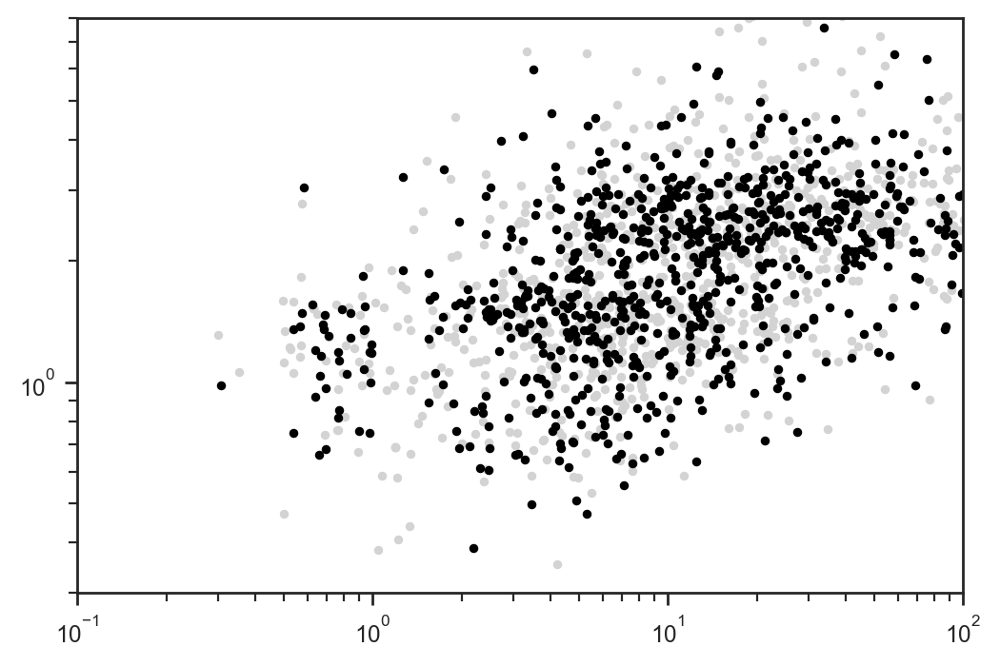

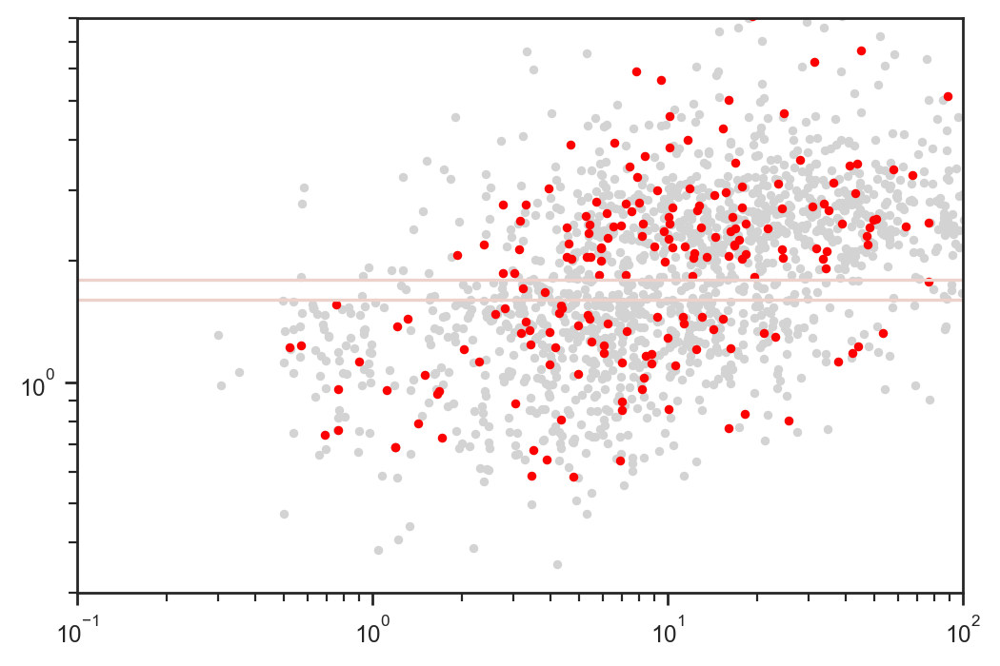

In [1486]:
#np.any([True, True, False],[True,False,False])

tmp = np.any([gyro_old, gyro_nop], axis=0)

plt.plot(cks['f18_P'], cks['f18_Rp'], '.', color='lightgrey')
plt.plot(cks['f18_P'][tmp], cks['f18_Rp'][tmp], 'k.')
plt.loglog()
plt.xlim(0.1,100)
plt.ylim(0.3,8)
plt.show()


plt.plot(cks['f18_P'], cks['f18_Rp'], '.', color='lightgrey')
plt.plot(cks['f18_P'][gyro_yng], cks['f18_Rp'][gyro_yng], 'r.')
plt.axhline(1.6)
plt.axhline(1.8)
plt.loglog()
plt.xlim(0.1,100)
plt.ylim(0.3,8)
plt.show()

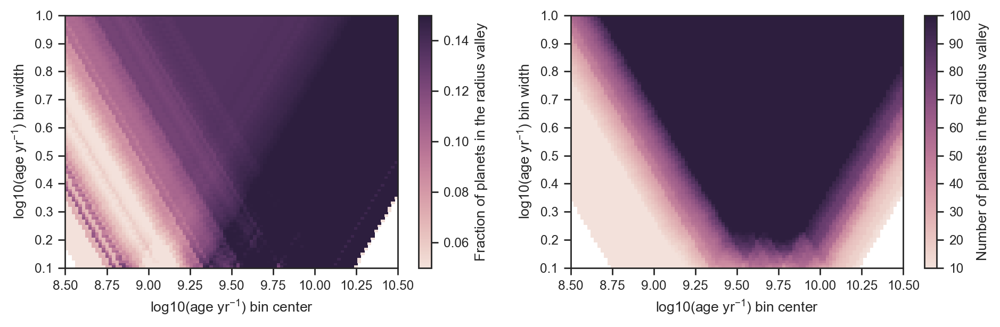

In [1278]:
cmap = sns.cubehelix_palette(start=3, light=0.9, as_cmap=True)

#fig, ax = plt.subplots()

plt.subplot(121)
plt.pcolormesh(cen_age, wid_age, fitv_age, cmap=cmap, vmin=0.05, vmax=0.15)
plt.colorbar(label="Fraction of planets in the radius valley")
plt.xlabel(r"log10(age yr$^\mathregular{-1}$) bin center")
plt.ylabel(r"log10(age yr$^\mathregular{-1}$) bin width")

plt.subplot(122)
plt.pcolormesh(cen_age, wid_age, nitv_age, cmap=cmap, vmin=10, vmax=100)
plt.colorbar(label="Number of planets in the radius valley")
plt.xlabel(r"log10(age yr$^\mathregular{-1}$) bin center")
plt.ylabel(r"log10(age yr$^\mathregular{-1}$) bin width")

plt.gcf().set_size_inches(0.8*12,0.8*4)
plt.tight_layout()
#plt.savefig('../figures/agebins.pdf')

In [43]:
# smed = np.median(slopes[:][3])
# imed = np.median(intercepts[:][3])
# mmed = np.median(margins[:][3])

# def upper_margin(logp):
#     return smed*logp - imed + np.sqrt(1+smed**2) * mmed

# def lower_margin(logp):
#     return smed*logp - imed - np.sqrt(1+smed**2) * mmed


# print(np.percentile(smed, [16.,84.]))
# print(np.percentile(imed, [16.,84.]))
# print(np.percentile(mmed, [16.,84.]))

[-0.05691662 -0.05691662]
[-0.28326378 -0.28326378]
[0.05540205 0.05540205]


### Accounting for age uncertainties.
How does the fraction of planets in the valley change with age?

In [1447]:
smed = np.median(slopes_C[:][3])
imed = np.median(intercepts_C[:][3])
mmed = np.median(margins_C[:][3])

def upper_margin(logp):
    return smed*logp - imed + np.sqrt(1+smed**2) * mmed

def lower_margin(logp):
    return smed*logp - imed - np.sqrt(1+smed**2) * mmed


tmp = np.log10([3.0,30.0])

print(10.**upper_margin(tmp))
print(10.**lower_margin(tmp))

#[2.06866162 1.79153714]
#[1.59836249 1.38424077]

#[2.0386728  1.67726679]
#[1.63308308 1.34357804]

#[1.94250722 1.81883082]
#[1.56451081 1.46490084]

[1.94250722 1.81883082]
[1.56451081 1.46490084]


### Gaby's implementation

In [780]:
#This part is not done yet.

def trend_plot():
    
    smed = np.median(slopes_A[:][3])
    imed = np.median(intercepts_A[:][3])
    mmed = np.median(margins_A[:][3])

    def upper_margin(logp):
        return smed*logp - imed + np.sqrt(1+smed**2) * mmed

    def lower_margin(logp):
        return smed*logp - imed - np.sqrt(1+smed**2) * mmed


    nsim = int(1e3)
    bin_centers = np.linspace(8.25,10.25,50)
    fitv_012 = np.zeros([len(bin_centers),nsim])
    fitv_025 = np.zeros([len(bin_centers),nsim])
    fitv_050 = np.zeros([len(bin_centers),nsim])
    
    
    
        
    mc_age = np.random.normal([cks['f18_logAiso'], 
                               np.max([cks['f18_e_logAiso'], 
                                       cks['f18_E_logAiso']], axis=0) for n in range(nsim)])    
    
    
    m_duplic = np.repeat([m], nsamples, axis=0)
    
    p_duplic = np.repeat([cks['f18_P']], nsamples, axis=0)
    
    Rp_duplic = np.repeat([cks['f18_Rp']], nsamples, axis=0)
    ERp_dupl =  np.repeat([cks['f18_E_Rp']], nsamples, axis=0)
    eRp_dupl =  np.repeat([cks['f18_e_Rp']], nsamples, axis=0)
    
    mc_rp = np.random.normal(Rp_duplic, 
                                 np.max([ERp_dupl,eRp_dupl], axis=0)) - Rp_valley(p_duplic)
    
    

    for i in range(len(bin_centers)):

        for j in range(nsim):

            mc_age = np.random.normal(cks['f18_logAiso'], 
                                      np.max([cks['f18_e_logAiso'], cks['f18_E_logAiso']], axis=0))

            #mc_age = np.random.uniform(cks['f18_logAiso']-cks['f18_e_logAiso'], cks['f18_logAiso']+cks['f18_E_logAiso'])

            mask_012 = (cks['f18_Rp']<10)&\
            (cks['f18_P']<100)&\
            (cks['p17_Disp']!='FP')&\
            (mc_age>=bin_centers[i]-0.125)&(mc_age<bin_centers[i]+0.125)

            mask_025 = (cks['f18_Rp']<10)&\
            (cks['f18_P']<100)&\
            (cks['p17_Disp']!='FP')&\
            (mc_age>=bin_centers[i]-0.25)&(mc_age<bin_centers[i]+0.25)

            mask_050 = (cks['f18_Rp']<10)&\
            (cks['f18_P']<100)&\
            (cks['p17_Disp']!='FP')&\
            (mc_age>=bin_centers[i]-0.5)&(mc_age<bin_centers[i]+0.5)        

            x_012,y_012 = np.array(cks['f18_P'][mask_012]), np.array(cks['f18_Rp'][mask_012])
            x_025,y_025 = np.array(cks['f18_P'][mask_025]), np.array(cks['f18_Rp'][mask_025])
            x_050,y_050 = np.array(cks['f18_P'][mask_050]), np.array(cks['f18_Rp'][mask_050])

            arg_012 = (np.log10(y_012)>lower_margin(np.log10(x_012))) & (np.log10(y_012)<upper_margin(np.log10(x_012)))
            arg_025 = (np.log10(y_025)>lower_margin(np.log10(x_025))) & (np.log10(y_025)<upper_margin(np.log10(x_025)))
            arg_050 = (np.log10(y_050)>lower_margin(np.log10(x_050))) & (np.log10(y_050)<upper_margin(np.log10(x_050)))

            try:
                fitv_012[i,j] = len(y_012[arg_012])/len(y_012)
            except:
                fitv_012[i,j] = np.nan

            try:
                fitv_025[i,j] = len(y_025[arg_025])/len(y_025)
            except:
                fitv_025[i,j] = np.nan

            try:
                fitv_050[i,j] = len(y_050[arg_050])/len(y_050)
            except:
                fitv_050[i,j] = np.nan    

SyntaxError: invalid syntax (<ipython-input-780-2086f5f64857>, line 25)

### Trend plot

In [1612]:
smed = np.median(slopes_A[:][3])
imed = np.median(intercepts_A[:][3])
mmed = np.median(margins_A[:][3])

def upper_margin(logp):
    return smed*logp + imed + np.sqrt(1+smed**2) * mmed

def lower_margin(logp):
    return smed*logp + imed - np.sqrt(1+smed**2) * mmed


nsim = int(1e3)
bin_centers = np.linspace(8.25,10.25,50)
fitv_012 = np.zeros([len(bin_centers),nsim])
fitv_025 = np.zeros([len(bin_centers),nsim])
fitv_050 = np.zeros([len(bin_centers),nsim])
fitv_100 = np.zeros([len(bin_centers),nsim])


for i in range(len(bin_centers)):
    
    for j in range(nsim):
        
        mc_age = np.random.normal(cks['f18_logAiso'], np.max([cks['f18_e_logAiso'], cks['f18_E_logAiso']], axis=0))

        #mc_age = np.random.uniform(cks['f18_logAiso']-cks['f18_e_logAiso'], cks['f18_logAiso']+cks['f18_E_logAiso'])

        mask_012 = common_cuts & (mc_age>=bin_centers[i]-0.125)&(mc_age<bin_centers[i]+0.125)
        mask_025 = common_cuts & (mc_age>=bin_centers[i]-0.25)&(mc_age<bin_centers[i]+0.25)
        mask_050 = common_cuts & (mc_age>=bin_centers[i]-0.5)&(mc_age<bin_centers[i]+0.5)    
        mask_100 = common_cuts & (mc_age>=bin_centers[i]-1)&(mc_age<bin_centers[i]+1)
        
        x_012,y_012 = np.array(cks['f18_P'][mask_012]), np.array(cks['f18_Rp'][mask_012])
        x_025,y_025 = np.array(cks['f18_P'][mask_025]), np.array(cks['f18_Rp'][mask_025])
        x_050,y_050 = np.array(cks['f18_P'][mask_050]), np.array(cks['f18_Rp'][mask_050])
        x_100,y_100 = np.array(cks['f18_P'][mask_100]), np.array(cks['f18_Rp'][mask_100])
        
        arg_012 = (np.log10(y_012)>lower_margin(np.log10(x_012))) & (np.log10(y_012)<upper_margin(np.log10(x_012)))
        arg_025 = (np.log10(y_025)>lower_margin(np.log10(x_025))) & (np.log10(y_025)<upper_margin(np.log10(x_025)))
        arg_050 = (np.log10(y_050)>lower_margin(np.log10(x_050))) & (np.log10(y_050)<upper_margin(np.log10(x_050)))
        arg_100 = (np.log10(y_100)>lower_margin(np.log10(x_100))) & (np.log10(y_100)<upper_margin(np.log10(x_100)))
        
        try:
            fitv_012[i,j] = len(y_012[arg_012])/len(y_012)
        except:
            fitv_012[i,j] = np.nan
            
        try:
            fitv_025[i,j] = len(y_025[arg_025])/len(y_025)
        except:
            fitv_025[i,j] = np.nan
            
        try:
            fitv_050[i,j] = len(y_050[arg_050])/len(y_050)
        except:
            fitv_050[i,j] = np.nan
            
            
        try:
            fitv_100[i,j] = len(y_100[arg_100])/len(y_100)
        except:
            fitv_100[i,j] = np.nan
            

/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in greater_equal
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in less
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in greater_equal
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in less
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in greater_equal
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in less
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in greater_equal
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launch

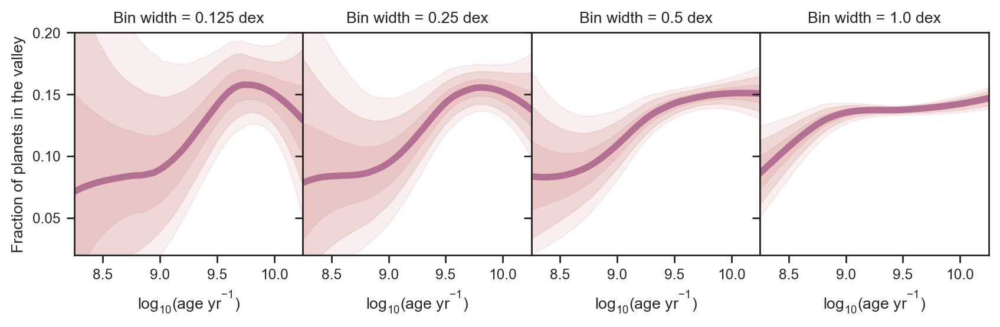

In [1613]:
# signal.savgol_filter(y,
#                            53, # window size used for filtering
#                            3), # order of fitted polynomial

from scipy import signal

ft_cpal = sns.cubehelix_palette(4, light=0.8, dark=0.4, as_cmap=False)

fig, ax = plt.subplots(nrows=1,ncols=4,
                       sharex=True,sharey=True,
                       figsize=(10,2.5))

titles = ['0.125 dex', '0.25 dex', '0.5 dex', '1.0 dex']

for i,frac in enumerate([fitv_012, fitv_025, fitv_050, fitv_100]):
    
    y = signal.savgol_filter(np.percentile(frac, [50-0.5*99.7,
                                                  50-0.5*95.4,
                                                  50-0.5*68.3,
                                                  50,
                                                  50+0.5*68.3,
                                                  50+0.5*95.4,
                                                  50+0.5*99.7], axis=1), 25, 3)
    
  
    ax[i].fill_between(bin_centers, y[0], y[-1], color=ft_cpal[0], alpha=0.25)
    ax[i].fill_between(bin_centers, y[1], y[-2], color=ft_cpal[0], alpha=0.50)
    ax[i].fill_between(bin_centers, y[2], y[-3], color=ft_cpal[0], alpha=0.75)
    ax[i].plot(bin_centers, y[3], lw=4, color=ft_cpal[2])

    ax[i].set_xlabel(r'$\mathregular{log_{10}(age~yr^{-1})}$')
    #ax[i].set_xlim(8.6,10.1)
    ax[i].set_xlim(8.25,10.25)
    ax[i].set_ylim(0.02,0.2)
    ax[i].set_title('Bin width = '+ titles[i])

    
ax[0].set_ylabel('Fraction of planets in the valley')
plt.subplots_adjust(wspace=0)
plt.savefig('../figures/trend.pdf')

In [299]:
mass = cks['f18_Miso']

bin_centers = np.linspace(0.5,1.6,100)
bin_widths  = np.linspace(0.02,0.2,100)

cen,wid = np.meshgrid(bin_centers, bin_widths)
mass_nitv = np.zeros([100,100])
mass_fitv = np.zeros([100,100])

for i in range(len(bin_centers)):
    for j in range(len(bin_widths)):
        
        mask = (cks['f18_Rp']<10)&\
        (cks['f18_P']<100)&\
        (cks['p17_Disp']!='FP')&\
        (mass>=cen[i,j]-wid[i,j])&(mass<cen[i,j]+wid[i,j])
        
        x,y = np.array(cks['f18_P'][mask]), np.array(cks['f18_Rp'][mask])
        
        arg = (np.log10(y)>lower_margin(np.log10(x))) & (np.log10(y)<upper_margin(np.log10(x)))
        try:
            mass_fitv[i,j] = len(y[arg])/len(y)
        except:
            mass_fitv[i,j] = np.nan
            
        if len(y[arg])>0:
            mass_nitv[i,j] = len(y[arg])
        else:
            mass_nitv[i,j] = np.nan

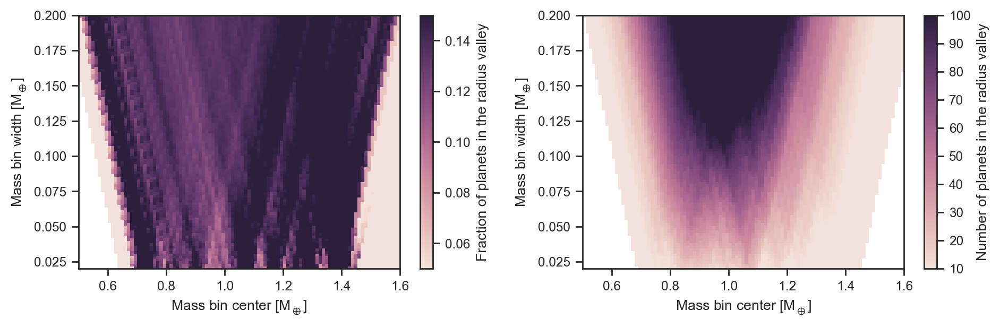

In [304]:
cmap = sns.cubehelix_palette(start=3, light=0.9, as_cmap=True)

plt.subplot(121)
plt.pcolormesh(cen, wid, mass_fitv, cmap=cmap, vmin=0.05, vmax=0.15)
plt.colorbar(label="Fraction of planets in the radius valley")
plt.xlabel(r"Mass bin center $\mathregular{[M_\oplus]}$")
plt.ylabel(r"Mass bin width $\mathregular{[M_\oplus]}$")

plt.subplot(122)
plt.pcolormesh(cen, wid, mass_nitv, cmap=cmap, vmin=10, vmax=100)
plt.colorbar(label="Number of planets in the radius valley")
plt.xlabel(r"Mass bin center $\mathregular{[M_\oplus]}$")
plt.ylabel(r"Mass bin width $\mathregular{[M_\oplus]}$")

plt.gcf().set_size_inches(0.8*12,0.8*4)
plt.tight_layout()
plt.savefig('../figures/massbins.pdf')

In [305]:
feh = cks['f18_[Fe/H]']
bin_centers = np.linspace(-0.6,0.5,100)
bin_widths  = np.linspace(0.02,0.2,100)

cen,wid = np.meshgrid(bin_centers, bin_widths)
feh_nitv = np.zeros([100,100])
feh_fitv = np.zeros([100,100])

for i in range(len(bin_centers)):
    for j in range(len(bin_widths)):
        
        mask = (cks['f18_Rp']<10)&\
        (cks['f18_P']<100)&\
        (cks['p17_Disp']!='FP')&\
        (feh>=cen[i,j]-wid[i,j])&(feh<cen[i,j]+wid[i,j])
        
        x,y = np.array(cks['f18_P'][mask]), np.array(cks['f18_Rp'][mask])
        
        arg = (np.log10(y)>lower_margin(np.log10(x))) & (np.log10(y)<upper_margin(np.log10(x)))
        try:
            feh_fitv[i,j] = len(y[arg])/len(y)
        except:
            feh_fitv[i,j] = np.nan
            
        if len(y[arg])>0:
            feh_nitv[i,j] = len(y[arg])
        else:
            feh_nitv[i,j] = np.nan

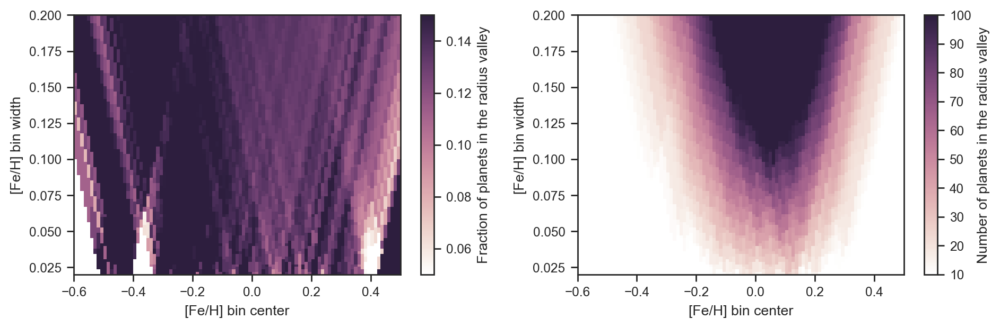

In [307]:
cmap = sns.cubehelix_palette(start=3, light=1, as_cmap=True)

#fig, ax = plt.subplots()

plt.subplot(121)
plt.pcolormesh(cen, wid, feh_fitv, cmap=cmap, vmin=0.05, vmax=0.15)
plt.colorbar(label="Fraction of planets in the radius valley")
plt.xlabel(r"[Fe/H] bin center")
plt.ylabel(r"[Fe/H] bin width")

plt.subplot(122)
plt.pcolormesh(cen, wid, feh_nitv, cmap=cmap, vmin=10, vmax=100)
plt.colorbar(label="Number of planets in the radius valley")
plt.xlabel(r"[Fe/H] bin center")
plt.ylabel(r"[Fe/H] bin width")

plt.gcf().set_size_inches(0.8*12,0.8*4)
plt.tight_layout()
plt.savefig('../figures/fehbins.pdf')

/Users/tdavid/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/tdavid/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:1659: FutureWarning: The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`. Using 0.25 for `bw_method`, but please see the docs for the new parameters and update your code.
  warnings.warn(msg, FutureWarning)


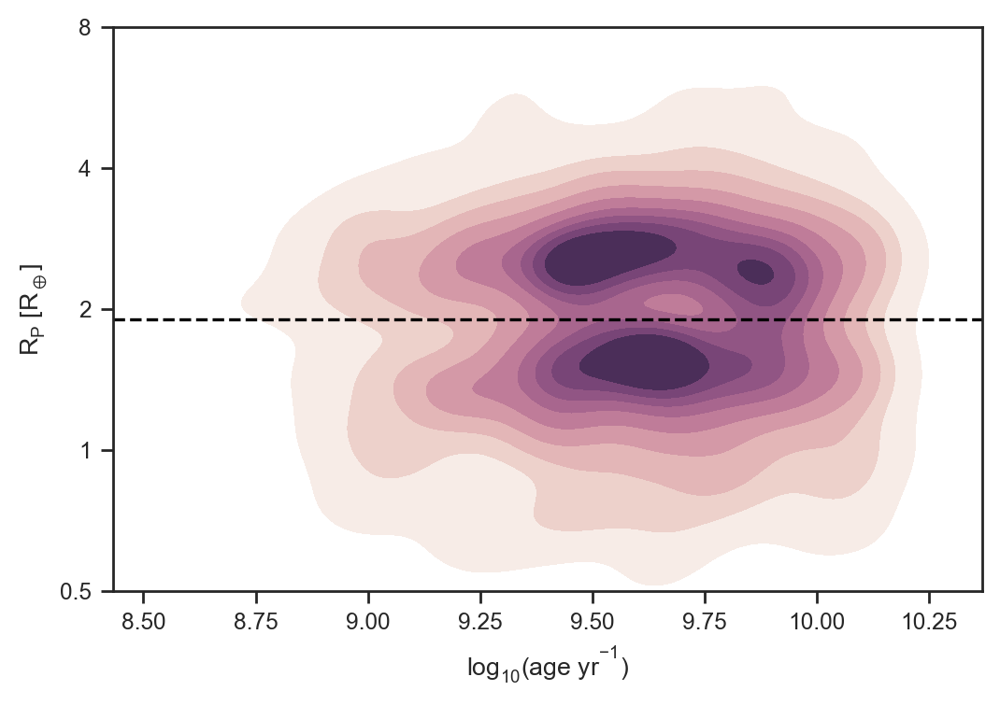

In [1268]:
gold_mask = m_disp & m_ms & m_period & m_rp & m_rperr & m_ruwe & m_rcf & m_r8 & m_rcf & m_nongrazing

fig, ax = plt.subplots(nrows=1,ncols=1)

#ax = sns.kdeplot(cks['f18_logAiso'][mask], np.log10(cks['f18_Rp'][mask]), shade=True, bw='scott')

#fin = (np.isfinite(cks['f18_logAiso'])) & (np.isfinite(cks['f18_Rp']))

ax = sns.kdeplot(cks['f18_logAiso'][gold_mask], np.log10(cks['f18_Rp'][gold_mask]), shade=True, bw=0.25, cmap=cmap)
ax.set_xlabel(r'$\mathregular{log_{10}(age~yr^{-1})}$')
#ax.set_ylabel(r'$\mathregular{log_{10}(R_P~R_\oplus^{-1})}$')
ax.set_ylabel(r'$\mathregular{R_P~[R_\oplus]}$')
ax.set_ylim(0.3,8)
ax.set_ylim(np.log10(0.5),np.log10(8))
ax.set_yticks(np.log10([0.5,1,2,4,8]))
ax.set_yticklabels(['0.5','1','2','4','8'])
ax.axhline(np.log10(1.9), color='k', ls='--')

#ax.axhline(np.log10(1.9), color='#333333', ls=':')
#ax.set_ylim(-0.3,0.8)
#ax.set_yticks(np.log10([0.5,1,2,4,8]), ['0.5', '1', '2', '4', '8'])

/Users/tdavid/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


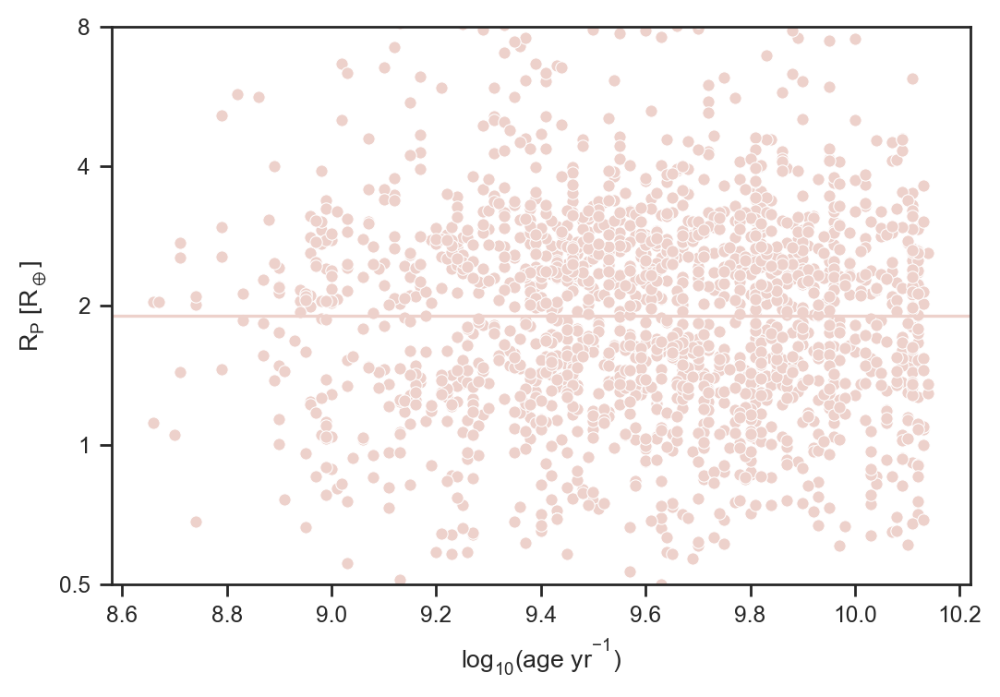

In [53]:
ax = sns.scatterplot(cks['f18_logAiso'][fin], np.log10(cks['f18_Rp'][fin]))
ax.set_xlabel(r'$\mathregular{log_{10}(age~yr^{-1})}$')
#ax.set_ylabel(r'$\mathregular{log_{10}(R_P~R_\oplus^{-1})}$')
ax.set_ylabel(r'$\mathregular{R_P~[R_\oplus]}$')
ax.set_ylim(0.3,8)
ax.set_ylim(np.log10(0.5),np.log10(8))
ax.set_yticks(np.log10([0.5,1,2,4,8]))
ax.set_yticklabels(['0.5','1','2','4','8'])
ax.axhline(np.log10(1.9))

In [55]:
for col in cks.columns:
    print(col)

f18_KOI
f18_P
f18_E_P
f18_e_P
f18_Rp/R*
f18_E_Rp/R*
f18_e_Rp/R*
f18_Rp
f18_E_Rp
f18_e_Rp
f18_a
f18_E_a
f18_e_a
f18_Sinc
f18_E_Sinc
f18_e_Sinc
f18_KOI_star
f18_Teff
f18_E_Teff
f18_e_Teff
f18_[Fe/H]
f18_E_[Fe/H]
f18_e_[Fe/H]
f18_Ksmag
f18_e_Ksmag
f18_plx
f18_e_plx
f18_R
f18_E_R
f18_e_R
f18_Miso
f18_E_Miso
f18_e_Miso
f18_Riso
f18_E_Riso
f18_e_Riso
f18_rhoiso
f18_E_rhoiso
f18_e_rhoiso
f18_logAiso
f18_E_logAiso
f18_e_logAiso
f18_plxspec
f18_E_plxspec
f18_e_plxspec
f18_r8
f18_RCF
p17_KOI
p17_Disp
p17_M16
p17_M15
p17_NEA
dr25_kepid
dr25_kepoi_name
dr25_kepler_name
dr25_ra
dr25_ra_err
dr25_ra_str
dr25_dec
dr25_dec_err
dr25_dec_str
dr25_koi_gmag
dr25_koi_gmag_err
dr25_koi_rmag
dr25_koi_rmag_err
dr25_koi_imag
dr25_koi_imag_err
dr25_koi_zmag
dr25_koi_zmag_err
dr25_koi_jmag
dr25_koi_jmag_err
dr25_koi_hmag
dr25_koi_hmag_err
dr25_koi_kmag
dr25_koi_kmag_err
dr25_koi_kepmag
dr25_koi_kepmag_err
dr25_koi_delivname
dr25_koi_vet_stat
dr25_koi_quarters
dr25_koi_disposition
dr25_koi_pdisposition
dr25_koi_co

In [883]:
columns = [
"dr25_kepid",
"dr25_ra",
"dr25_dec",        
"prot",
"prot_err1",
"prot_err2",
"Prot_flag",
"a18_period",
"a18_period_errm",
"a18_period_errp",    
"m15_Prot",
"m15_e_Prot",
"m15_Rvar",
"m15_Prot",
"m15_e_Prot",
"m15_LPH",
"m15_w",
"m15_C",
"m15_R",    
"m13_Prot",
"m13_e_Prot",
"m13_Rvar",
"m13_Flag",
"p17_Disp",
"p20_cks_steff",
"p20_cks_steff_err1",
"p20_cks_steff_err2",
"p20_cks_slogg",
"p20_cks_slogg_err1",
"p20_cks_slogg_err2",
"p20_cks_smet",
"p20_cks_smet_err1",
"p20_cks_smet_err2",
"p20_cks_svsini",
"p20_cks_svsini_err1",
"p20_cks_svsini_err2",
"f18_logAiso",
"f18_e_logAiso",
"f18_E_logAiso",
"f18_Miso",
"f18_e_Miso",
"f18_E_Miso",    
"b20_log10_iso_age",
"b20_E_log10_iso_age",
"b20_e_log10_iso_age",
"b20_iso_mass",
"b20_iso_mass_err1",
"b20_iso_mass_err2",
"b20_iso_avs",
"gaia_ra",
"gaia_dec",
"gaia_parallax",
"gaia_parallax_error",
"gaia_phot_g_mean_mag",
"gaia_phot_g_mean_flux",    
"gaia_phot_g_mean_flux_error",
"gaia_phot_bp_mean_mag",
"gaia_phot_bp_mean_flux",    
"gaia_phot_bp_mean_flux_error",
"gaia_phot_rp_mean_mag",
"gaia_phot_rp_mean_flux",    
"gaia_phot_rp_mean_flux_error",    
"gaia_a_g_val",
"gaia_a_g_percentile_lower",
"gaia_a_g_percentile_upper",
"l20_Av",
"l20_Av_errp",
"l20_Av_errm",
"Prot_adopted"
]

ruth = cks[columns].copy()
print(len(ruth))
ruth = ruth[np.isfinite(ruth['prot'])]
print(len(ruth))
ruth.drop_duplicates(subset=['dr25_kepid'])
print(len(ruth))
ruth.head()
ruth.to_csv('../data/for_ruth.csv', index=False)
# Prot, Prot_err, 
# spectroscopic parameters: Teff, Teff_err, Feh, Feh_err, logg, logg_err, Av, Av_err, 
# Gaia G_mag, Gmag_err, parallax, parallax_err
# Bp, bp_err and rp and rp_err

1913
881
881


Radius uncertainty and age: 0.019714922835430734 0.4533220385052502
Fractional radius uncertainty and age: 0.09780408628678372 0.00019245970328804105
Fractional radius uncertainty and age: 0.07551454060663992 0.004025673842485542
Fractional radius uncertainty and distance from RV: -0.06465045542051938 0.01383888753332179
Distance from RV and age: 0.09780408628678372 0.00019245970328804105


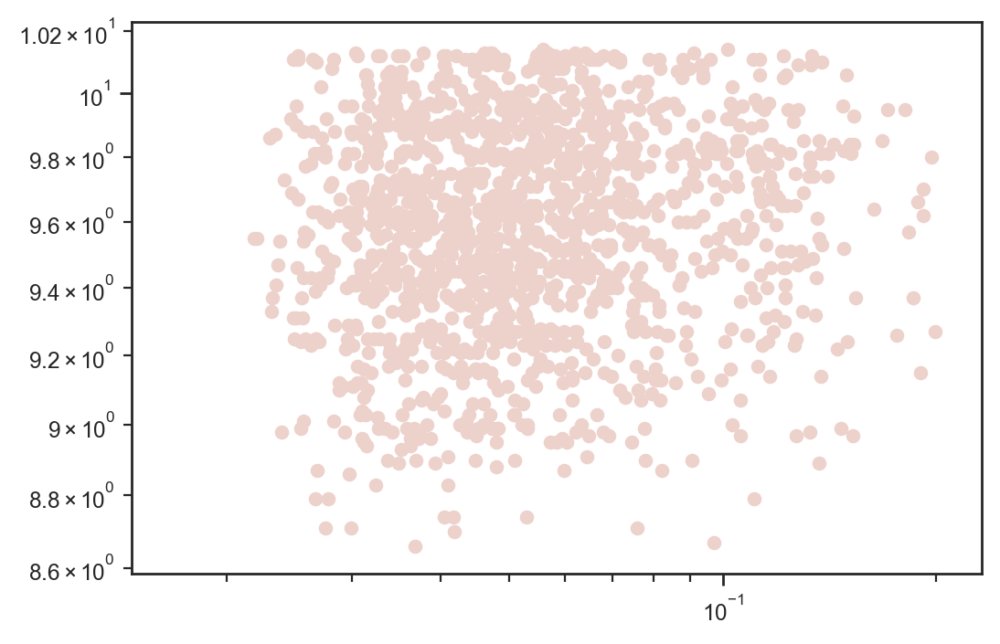

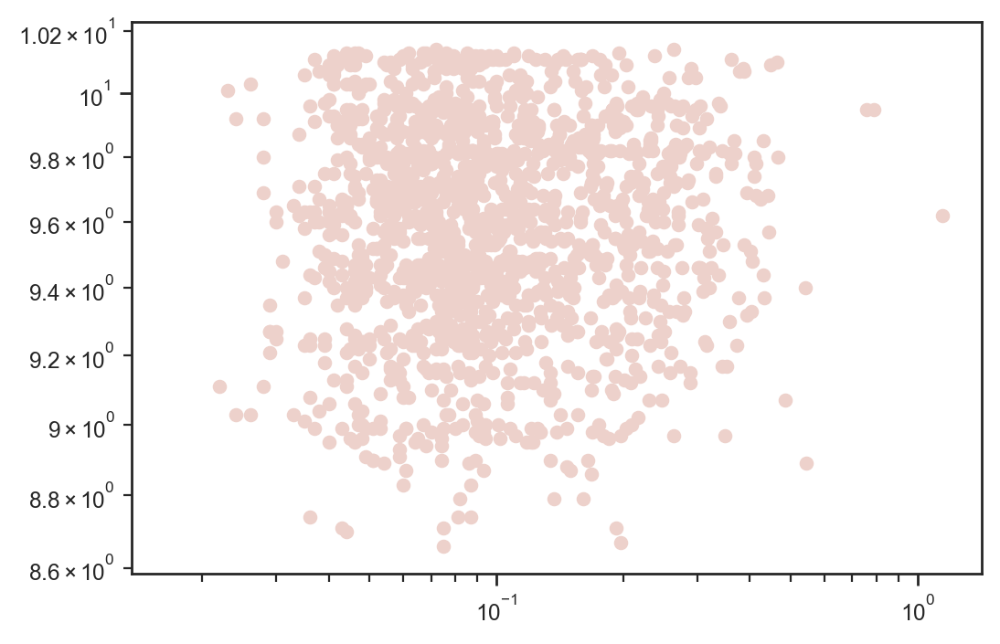

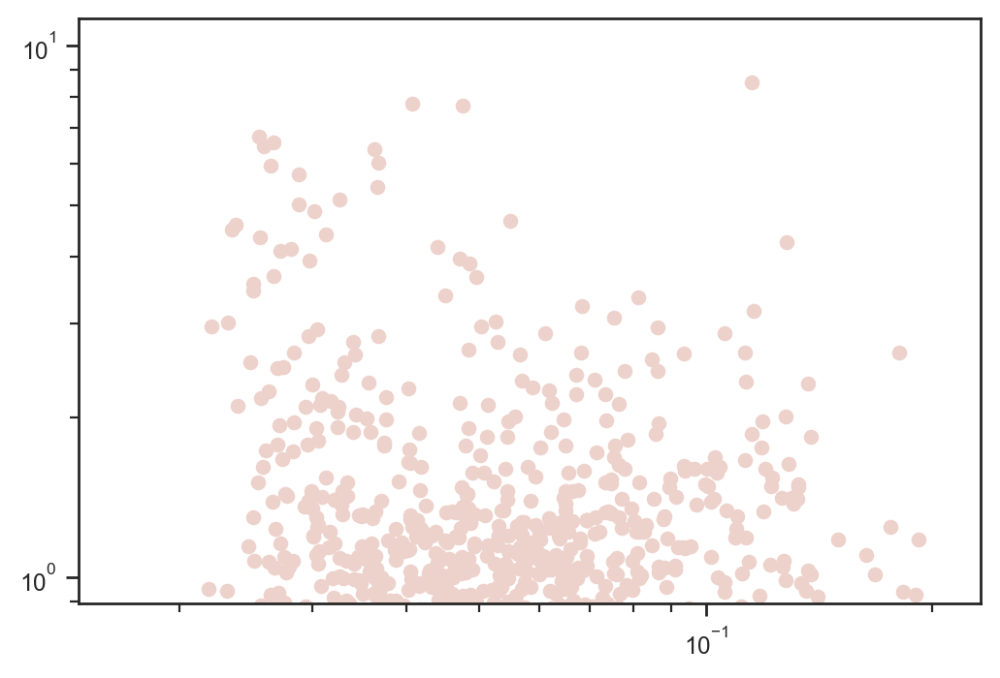

In [347]:
from scipy import stats

_ = np.isfinite(cks['f18_E_Rp']) &\
    np.isfinite(cks['f18_logAiso']) &\
    (cks['f18_P']<100) &\
    (cks['f18_Rp']<10) &\
    (cks['p17_Disp']!='FP') &\
    (cks['f18_R'] < cks['Rcut']) &\
    (cks['f18_E_Rp']/cks['f18_Rp'] < 0.2)

rho, pval = stats.spearmanr(cks['f18_E_Rp'][_], cks['f18_logAiso'][_])
print('Radius uncertainty and age:', rho, pval)

rho, pval = stats.spearmanr(cks['f18_E_Rp'][_]/cks['f18_Rp'][_], cks['f18_logAiso'][_])
print('Fractional radius uncertainty and age:', rho, pval)

rho, pval = stats.pearsonr(cks['f18_E_Rp'][_]/cks['f18_Rp'][_], cks['f18_logAiso'][_])
print('Fractional radius uncertainty and age:', rho, pval)

def d20_valley(p):
    log10rp = -0.07*np.log10(p)+0.30
    return 10.**log10rp

_drv = abs(cks['f18_Rp'] - d20_valley(cks['f18_P']))

rho, pval = stats.spearmanr(cks['f18_E_Rp'][_]/cks['f18_Rp'][_], _drv[_])
print('Fractional radius uncertainty and distance from RV:', rho, pval)

rho, pval = stats.spearmanr(cks['f18_E_Rp'][_]/cks['f18_Rp'][_], cks['f18_logAiso'][_])
print('Distance from RV and age:', rho, pval)



#plt.scatter(cks['f18_logAiso'][_], _drv[_])
#plt.show()

plt.scatter(cks['f18_E_Rp'][_]/cks['f18_Rp'][_], cks['f18_logAiso'][_])
plt.loglog()
plt.show()

plt.scatter(cks['f18_E_Rp'][_], cks['f18_logAiso'][_])
plt.loglog()
plt.show()

#plt.scatter(cks['f18_E_Rp'][_], _drv[_])
#plt.loglog()
#plt.show()

plt.scatter(cks['f18_E_Rp'][_]/cks['f18_Rp'][_], _drv[_])
plt.loglog()
plt.show()



### Signal-to-noise plot

/Users/tdavid/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


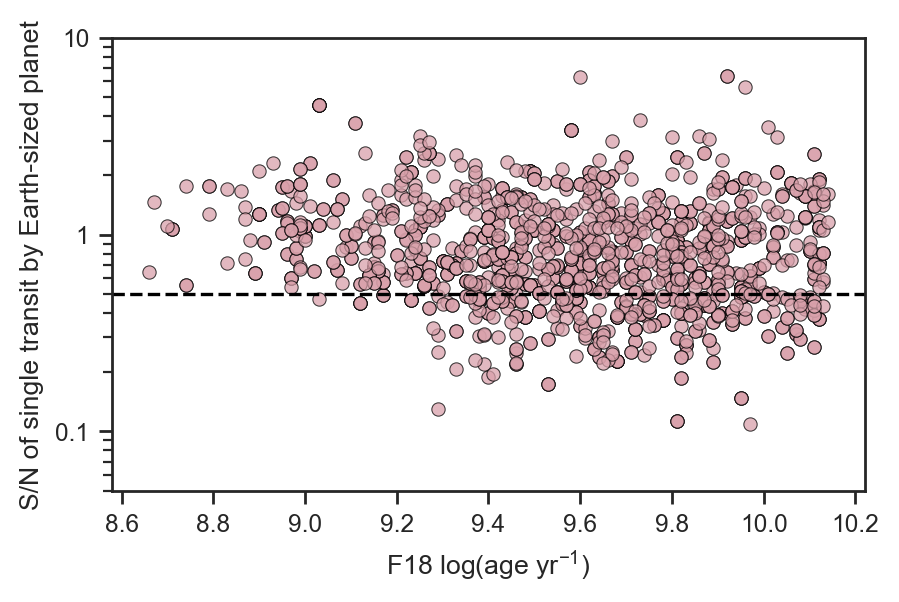

In [867]:
_ = (cks['f18_P']<100) &\
    (cks['f18_Rp']<10) &\
    (cks['p17_Disp']!='FP') &\
    (cks['f18_R'] < cks['Rcut'])

sns.scatterplot(cks['f18_logAiso'][_], cks['single_transit_snr'][_], edgecolor='k', alpha=0.75)
plt.axhline(0.5, color='k', ls='--')
plt.xlabel(r'F18 log(age yr$^\mathregular{-1}$)')
plt.ylabel('S/N of single transit by Earth-sized planet')
plt.semilogy()
plt.ylim(5e-2,10)
plt.yticks([0.1,1,10],['0.1','1','10'])
plt.gcf().set_size_inches(1.618*3,3)
plt.savefig('../figures/snr.pdf')
plt.show()

[ 8.6         8.77777778  8.95555556  9.13333333  9.31111111  9.48888889
  9.66666667  9.84444444 10.02222222 10.2       ]


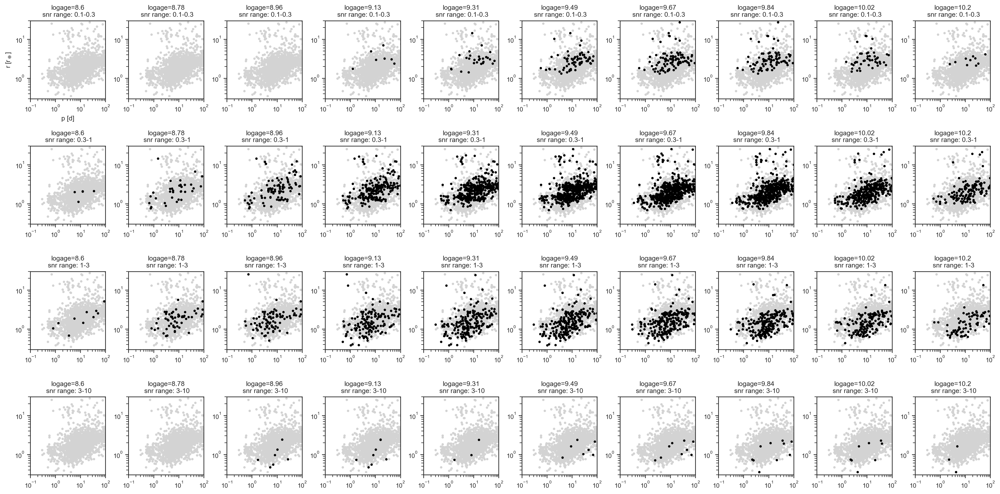

In [879]:
snr_grid    = [0.1,0.3,1,3,10]
logage_grid = np.linspace(8.6,10.2,10)

fig,ax = plt.subplots(nrows=len(snr_grid)-1, ncols=len(logage_grid), figsize=(20,10))

for i in range(len(snr_grid)-1):
    for j in range(len(logage_grid)):
        
        arg = (cks['single_transit_snr']>snr_grid[i]) &\
              (cks['single_transit_snr']<=snr_grid[i+1]) &\
              (abs(cks['f18_logAiso']-logage_grid[j])<0.25)
        
        ax[i][j].plot(cks['f18_P'], cks['f18_Rp'], '.', color='lightgrey', rasterized=True)
        ax[i][j].plot(cks['f18_P'][arg], cks['f18_Rp'][arg], '.', color='k', rasterized=True)
        ax[i][j].loglog()
        ax[i][j].set_xlim(0.1,100)
        ax[i][j].set_ylim(0.3,30)
        ax[i][j].set_title('logage='+str(logage_grid[j].round(2))+'\n snr range: '+str(snr_grid[i])+'-'+str(snr_grid[i+1]))
        if i==0 and j==0:
            ax[i][j].set_xlabel('p [d]')
            ax[i][j].set_ylabel('r [r$_\oplus$]')

plt.tight_layout()
plt.savefig('../figures/snr-age-pr.pdf')

#print(len(logage_grid))
print(logage_grid)

In [ ]:
#show different planet populations in a gyro diagram

0         m
1         m
2       NaN
3         m
4       NaN
       ... 
1908    NaN
1909      b
1910    NaN
1911    NaN
1912    NaN
Name: Prot_flag, Length: 1913, dtype: object


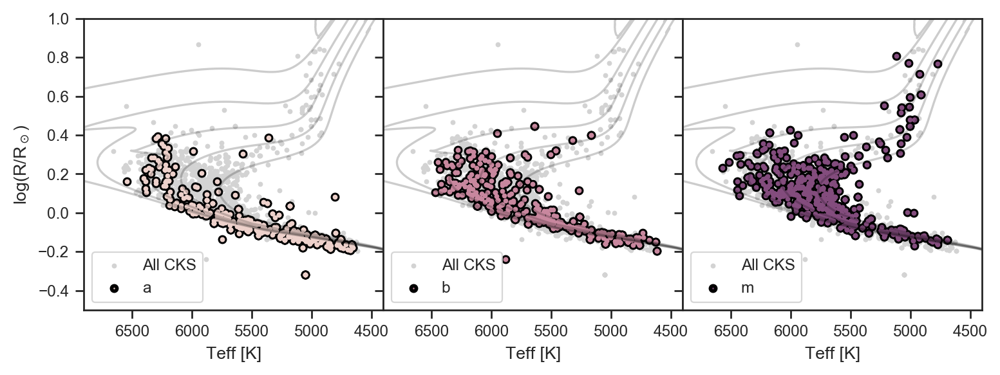

In [865]:
print(cks['Prot_flag'])

fig, ax = plt.subplots(nrows=1,ncols=3, sharey=True, figsize=(9,3))

for i,_ in enumerate(['a','b','m']):
    ca = ax[i]
    ca.scatter(cks['f18_Teff'], np.log10(cks['f18_R']), color='lightgrey', s=4, label='All CKS')
    ca.scatter(cks['f18_Teff'][cks['Prot_flag']==_], np.log10(cks['f18_R'][cks['Prot_flag']==_]), color=cpal[i], edgecolor='k', lw=3, s=4, label=_)
    ca.scatter(cks['f18_Teff'][cks['Prot_flag']==_], np.log10(cks['f18_R'][cks['Prot_flag']==_]), color=cpal[i], s=4)
    ca.set_xlim(6900,4400)
    ca.set_ylim(-0.5,1)
    ca.set_xlabel('Teff [K]')
    ca.legend()
    
    
    for la in [9.,9.25,9.5,9.75,10]:
        __ = mist['log10_isochrone_age_yr']==la
        ca.plot(10.**mist['log_Teff'][__], mist['log_R'][__], color='k', alpha=0.2)
    
    
    if i==0:
        ca.set_ylabel(r'log(R/R$_\odot$)')


plt.subplots_adjust(wspace=0)
plt.show()

0         m
1         m
2       NaN
3         m
4       NaN
       ... 
1908    NaN
1909      b
1910    NaN
1911    NaN
1912    NaN
Name: Prot_flag, Length: 1913, dtype: object


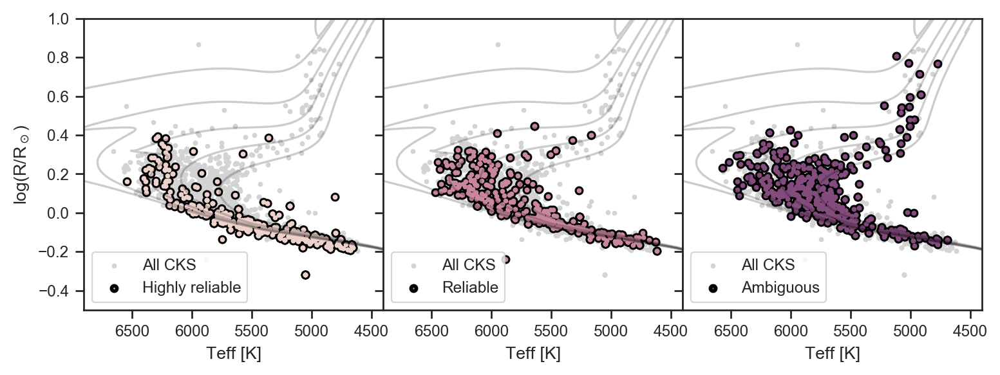

In [771]:
print(cks['Prot_flag'])

fig, ax = plt.subplots(nrows=1,ncols=3, sharey=True, figsize=(9,3))

labels = ['Highly reliable', 'Reliable', 'Ambiguous']

for i,_ in enumerate(['a','b','m']):
    ca = ax[i]
    ca.scatter(cks['f18_Teff'], np.log10(cks['f18_R']), color='lightgrey', s=4, label='All CKS')
    ca.scatter(cks['f18_Teff'][cks['Prot_flag']==_], np.log10(cks['f18_R'][cks['Prot_flag']==_]), color=cpal[i], edgecolor='k', lw=3, s=4, label=labels[i])
    ca.scatter(cks['f18_Teff'][cks['Prot_flag']==_], np.log10(cks['f18_R'][cks['Prot_flag']==_]), color=cpal[i], s=4)
    ca.set_xlim(6900,4400)
    ca.set_ylim(-0.5,1)
    ca.set_xlabel('Teff [K]')
    ca.legend()
    
    
    for la in [9.,9.25,9.5,9.75,10]:
        __ = mist['log10_isochrone_age_yr']==la
        ca.plot(10.**mist['log_Teff'][__], mist['log_R'][__], color='k', alpha=0.2)
    
    
    if i==0:
        ca.set_ylabel(r'log(R/R$_\odot$)')


plt.subplots_adjust(wspace=0)
plt.show()

/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: All-NaN axis encountered
  del sys.path[0]
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: All-NaN axis encountered
  
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: Mean of empty slice
/Users/tdavid/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


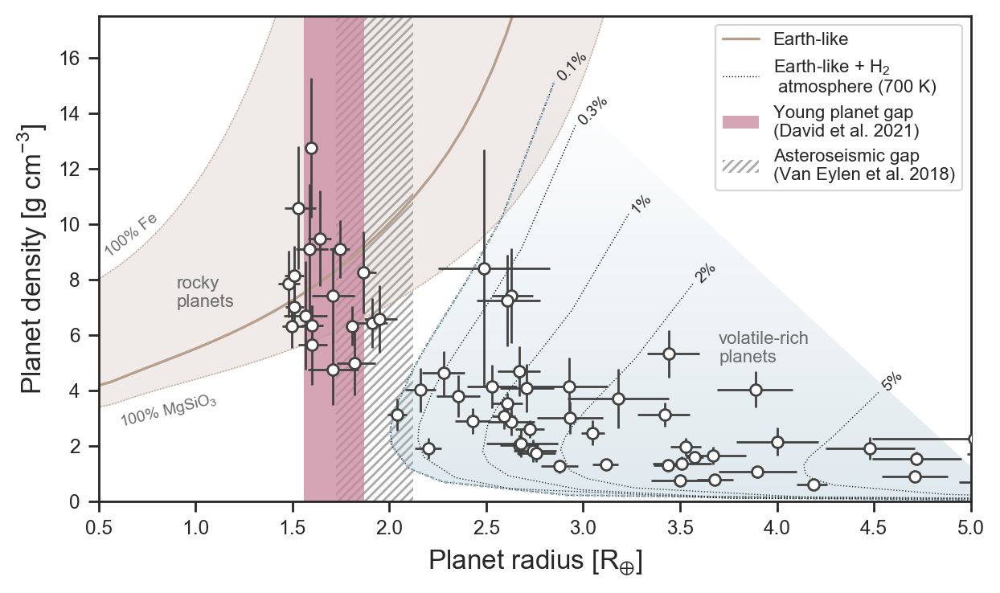

In [402]:
mearth = c.M_earth.cgs.value
rearth = c.R_earth.cgs.value

nea = get_catalog('planets')
nea.head()

mthresh = 0.2
rthresh = 0.2

nea['rho_gcc'] = nea['pl_masse']*mearth / (4./3.*np.pi*(nea['pl_rade']*rearth)**3.)

nsamples = 1000
_mp = np.array([np.random.normal(nea['pl_masse'], np.nanmax([nea['pl_masseerr2'], nea['pl_masseerr1']], axis=0)) for n in range(nsamples)])
_rp = np.array([np.random.normal(nea['pl_rade'], np.nanmax([nea['pl_radeerr2'], nea['pl_radeerr1']], axis=0)) for n in range(nsamples)])
_rho = (_mp*mearth)/(4./3.*np.pi*(_rp*rearth)**3.)

nea['rho_gcc'] = np.nanmean(_rho, axis=0)
nea['rho_gcc_err'] = np.nanstd(_rho, axis=0)

nea_m = (nea['pl_masseerr1']/nea['pl_masse']<mthresh) &\
        (nea['pl_masseerr2']/nea['pl_masse']<mthresh) &\
        (nea['pl_radeerr1']/nea['pl_rade']<rthresh) &\
        (nea['pl_radeerr2']/nea['pl_rade']<rthresh) &\
        (abs(nea['pl_radelim'])!=1) &\
        (abs(nea['pl_masselim'])!=1) &\
        (nea['pl_orbper']<100.) & (nea['st_teff']>4500) & (nea['st_teff']<6500)


def v18(p):
    logr = -0.09*np.log10(p)+0.37
    return 10.**logr

from scipy.interpolate import interp1d

import matplotlib.colors as mcolors
from matplotlib.patches import Polygon
np.random.seed(1977)

def main():
    for _ in range(1):
        gradient_fill(*generate_data(100))
    plt.show()

def generate_data(num):
    x = np.linspace(0, 100, num)
    y = np.random.normal(0, 1, num).cumsum()
    return x, y

def gradient_fill(x, y, fill_color=None, ax=None, **kwargs):
    """
    Plot a line with a linear alpha gradient filled beneath it.

    Parameters
    ----------
    x, y : array-like
        The data values of the line.
    fill_color : a matplotlib color specifier (string, tuple) or None
        The color for the fill. If None, the color of the line will be used.
    ax : a matplotlib Axes instance
        The axes to plot on. If None, the current pyplot axes will be used.
    Additional arguments are passed on to matplotlib's ``plot`` function.

    Returns
    -------
    line : a Line2D instance
        The line plotted.
    im : an AxesImage instance
        The transparent gradient clipped to just the area beneath the curve.
    """
    if ax is None:
        ax = plt.gca()

    line, = ax.plot(x, y, **kwargs)
    if fill_color is None:
        fill_color = line.get_color()

    zorder = line.get_zorder()
    alpha = line.get_alpha()
    alpha = 0.3 if alpha is None else alpha

    z = np.empty((100, 1, 4), dtype=float)
    rgb = mcolors.colorConverter.to_rgb(fill_color)
    z[:,:,:3] = rgb
    z[:,:,-1] = np.linspace(alpha, 0, 100)[:,None]

    xmin, xmax, ymin, ymax = x.min(), x.max(), y.min(), y.max()
    im = ax.imshow(z, aspect='auto', extent=[xmin, xmax, ymin, ymax],
                   origin='lower', zorder=zorder)

    xy = np.column_stack([x, y])
    xy = np.vstack([[xmin, ymin], xy, [xmax, ymin], [xmin, ymin]])
    clip_path = Polygon(xy, facecolor='none', edgecolor='none', closed=True)
    ax.add_patch(clip_path)
    im.set_clip_path(clip_path)
    
    ax.autoscale(True)
    return line, im

#main()


def zeng_curve(comp='earth'):
    
    url_dict = {"earth": "https://www.cfa.harvard.edu/~lzeng/tables/massradiusEarthlikeRocky.txt",
                "iron": "https://www.cfa.harvard.edu/~lzeng/tables/massradiusFe.txt",
                "rock": "https://www.cfa.harvard.edu/~lzeng/tables/massradiusmgsio3.txt"}
    
    data = Table.read(url_dict[comp], format="ascii")
    mass = data['col1']
    radius = data['col2']
    rho = mass*mearth / (4./3.*np.pi*(radius*rearth)**3.)
    
    r2rho = interp1d(radius, rho, fill_value='extrapolate')
    
    return mass,radius,rho,r2rho

zeng = Table.read('https://www.cfa.harvard.edu/~lzeng/tables/massradiusEarthlikeRocky.txt',
                  format="ascii")

zmearth, zrearth, zrhearth, zfearth = zeng_curve(comp='earth')
zmrock, zrrock, zrhrock, zfrock = zeng_curve(comp='rock')
zmfe, zrfe, zrhfe, zffe = zeng_curve(comp='iron')

def composition_plot(fig_path=None,
                     point_shade=False, 
                     ebar_kwargs={"fmt":'o', 
                                  "color":'white', 
                                  "mec":'#424242', 
                                  "ms":5, 
                                  "mew":1,
                                  "lw":1,
                                  "ecolor":'#424242', 
                                  "rasterized":True,
                                  "zorder": np.inf}):

    se_clr = '#b89f8c'
    sn_clr = '#97b6c7'
    
    if point_shade==True:
        plt.errorbar(nea['pl_rade'][nea_m], nea['rho_gcc'][nea_m],
                 xerr=[-nea['pl_radeerr2'][nea_m],nea['pl_radeerr1'][nea_m]],
                 yerr=nea['rho_gcc_err'][nea_m], fmt='.', color='k', lw=0.5, zorder=998, rasterized=True)
        
        
        plt.scatter(nea['pl_rade'][nea_m], nea['rho_gcc'][nea_m], 
                    c=nea['pl_orbper'][nea_m], cmap=cmap, zorder=999, edgecolors='k', vmin=1, vmax=20, rasterized=True)

        plt.colorbar(label='Orbital period [d]')
        
        plt.axvspan(1.56,1.87, color=tt_cpal[1], alpha=0.4, lw=0, label='Young planet gap\n(David et al. 2021)')
        plt.axvspan(v18(3),v18(30), color=tt_cpal[0], alpha=0.4, lw=0, label='Asteroseismic gap\n(Van Eylen et al. 2018)')
        
        
    elif point_shade==False:
        plt.errorbar(nea['pl_rade'][nea_m], nea['rho_gcc'][nea_m],
                     xerr=[-nea['pl_radeerr2'][nea_m], nea['pl_radeerr1'][nea_m]],
                     yerr=nea['rho_gcc_err'][nea_m], **ebar_kwargs)
        
        plt.axvspan(1.56,1.87, color=cpal[1], alpha=0.75, lw=0, label='Young planet gap\n(David et al. 2021)')
        plt.fill_between([v18(30),v18(3)],[18,18], facecolor="none", hatch="//////", edgecolor="darkgrey", linewidth=0.0, label='Asteroseismic gap\n(Van Eylen et al. 2018)')


    _x = np.linspace(0.5,3.5,1000)
    plt.fill_between(_x, zfrock(_x), zffe(_x), color=se_clr, alpha=0.2)


    zeng['rho_gcc'] = zeng['col1']*c.M_earth.cgs.value / (4./3.*np.pi*(zeng['col2']*c.R_earth.cgs.value)**3)
    plt.plot(zeng['col2'], zeng['rho_gcc'], se_clr, label='Earth-like')

    zeng_rock = Table.read('https://www.cfa.harvard.edu/~lzeng/tables/massradiusmgsio3.txt', format='ascii')
    zeng_rock['rho_gcc'] = zeng_rock['col1']*mearth / (4./3.*np.pi*(zeng_rock['col2']*rearth)**3)
    plt.plot(zeng_rock['col2'], zeng_rock['rho_gcc'], ls=':', lw=0.5, color=se_clr)

    zeng_iron = Table.read('https://www.cfa.harvard.edu/~lzeng/tables/massradiusFe.txt', format='ascii')
    zeng_iron['rho_gcc'] = zeng_iron['col1']*mearth / (4./3.*np.pi*(zeng_iron['col2']*rearth)**3)
    plt.plot(zeng_iron['col2'], zeng_iron['rho_gcc'], ls=':', lw=0.5, color=se_clr)

    # zeng_h2o = Table.read('https://www.cfa.harvard.edu/~lzeng/tables/massradius_100percentH2O_700K_1mbar.txt', format='ascii')
    # zeng_h2o['rho_gcc'] = zeng_h2o['col1']*mearth / (4./3.*np.pi*(zeng_h2o['col2']*rearth)**3)
    # plt.plot(zeng_h2o['col2'], zeng_h2o['rho_gcc'], 'b', label='H2O')


    #Option 1
    labels = ['0.1%', '0.3%', '1%', '2%', '5%']
    for i,_t in enumerate(['01','03','1','2','5']):

        _zeng = Table.read("https://www.cfa.harvard.edu/~lzeng/tables/Earthlike"+_t+"h700K1mbar.txt", format="ascii")
        if i==0:
            label='Earth-like + H$_\mathregular{2}$\n atmosphere (700 K)'
        else:
            label=None
        _zeng_rho = _zeng['col1']*mearth / (4./3.*np.pi*(_zeng['col2']*rearth)**3)
        plt.plot(_zeng['col2'], _zeng_rho, 'k:', lw=0.5, label=label)
        plt.text(_zeng['col2'][-1], _zeng_rho[-1], labels[i], size=7, rotation=45)    

        if i==0:
            gradient_fill(_zeng['col2'], _zeng_rho, **{'color': sn_clr, 'ls':':'})        

    #Option 2
    # for i,_t in enumerate(['300','500','700','1000','2000']):

    #     _zeng = Table.read("https://www.cfa.harvard.edu/~lzeng/tables/Earthlike1h"+_t+"K1mbar.txt", format="ascii")
    #     if i==0:
    #         label='Earth-like + 0.1% H$_\mathregular{2}$ atmosphere'
    #     else:
    #         label=None
    #     _zeng_rho = _zeng['col1']*mearth / (4./3.*np.pi*(_zeng['col2']*rearth)**3)
    #     plt.plot(_zeng['col2'], _zeng_rho, 'k:', lw=0.5, label=label)
    #     plt.text(_zeng['col2'][-1], _zeng_rho[-1], _t, size=5, rotation=45)
    #     if i==0:
    #         gradient_fill(_zeng['col2'], _zeng_rho, **{'color': sn_clr, 'ls':':'})        



    plt.text(0.9, 7, 'rocky\nplanets', color='#6a6b6b', size=8)
    plt.text(0.6, 2.7, '100% MgSiO$_\mathregular{3}$', color='#6a6b6b', size=7, rotation=14)
    plt.text(0.52, 8.8, '100% Fe', color='#6a6b6b', size=7, rotation=38)
    plt.text(3.7, 5, 'volatile-rich\nplanets', color='#6a6b6b', size=8)

    plt.ylabel('Planet density [g cm$^\mathregular{-3}$]')
    plt.xlabel(r'Planet radius [R$_\mathregular{\oplus}$]')
    plt.legend(prop={'size':8}, loc='best')
    plt.xlim(0.5,5)
    plt.ylim(0,17.5)

    #plt.semilogy()
    #plt.ylim(0.5,17.5)

    plt.gcf().set_size_inches(7,4)
    if fig_path:
        plt.savefig(fig_path)
    plt.show()
    
#composition_plot(fig_path='../figures/composition.pdf')
composition_plot()

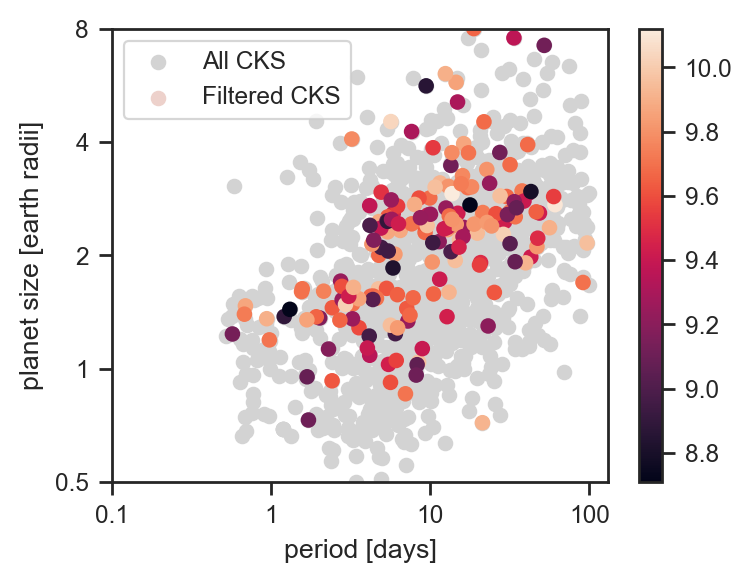

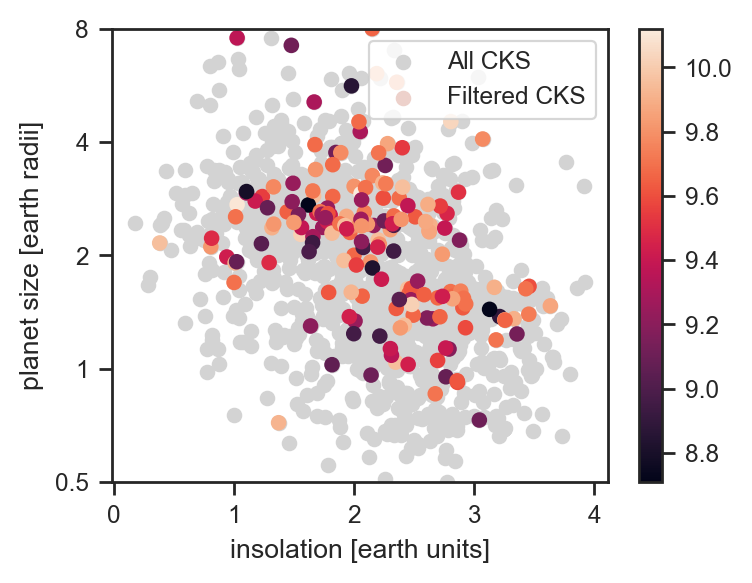

In [467]:
tmp = m&(cks['rp_prec']<4)&(cks['d20_ruwe']<1.1)&(cks['dr25_koi_score']>0.99)&(cks['l20_Av']<0.5)

plt.scatter(np.log10(cks['f18_P'][common_cuts]), 
            np.log10(cks['f18_Rp'][common_cuts]), 
            c='lightgrey', label='All CKS')

plt.scatter(np.log10(cks['f18_P'][tmp]), 
            np.log10(cks['f18_Rp'][tmp]), 
            c=cks['f18_logAiso'][tmp], label='Filtered CKS')
plt.colorbar()
plt.xticks(np.log10([0.1,1,10,100]),['0.1','1','10','100'])
plt.yticks(np.log10([0.5,1,2,4,8]),['0.5','1','2','4','8'])
#plt.xlim(0.4,100)
plt.ylim(np.log10(0.5),np.log10(8))
plt.gcf().set_size_inches(4,3)
plt.legend()
plt.ylabel('planet size [earth radii]')
plt.xlabel('period [days]')
plt.show()

plt.scatter(np.log10(cks['f18_Sinc'][common_cuts]), 
            np.log10(cks['f18_Rp'][common_cuts]), 
            c='lightgrey', label='All CKS')

plt.scatter(np.log10(cks['f18_Sinc'][tmp]), 
            np.log10(cks['f18_Rp'][tmp]), 
            c=cks['f18_logAiso'][tmp], label='Filtered CKS')
plt.colorbar()
#plt.xticks(np.log10([0.1,1,10,100]),['0.1','1','10','100'])
plt.yticks(np.log10([0.5,1,2,4,8]),['0.5','1','2','4','8'])

plt.ylim(np.log10(0.5),np.log10(8))
plt.gcf().set_size_inches(4,3)
plt.legend()
plt.ylabel('planet size [earth radii]')
plt.xlabel('insolation [earth units]')
plt.show()

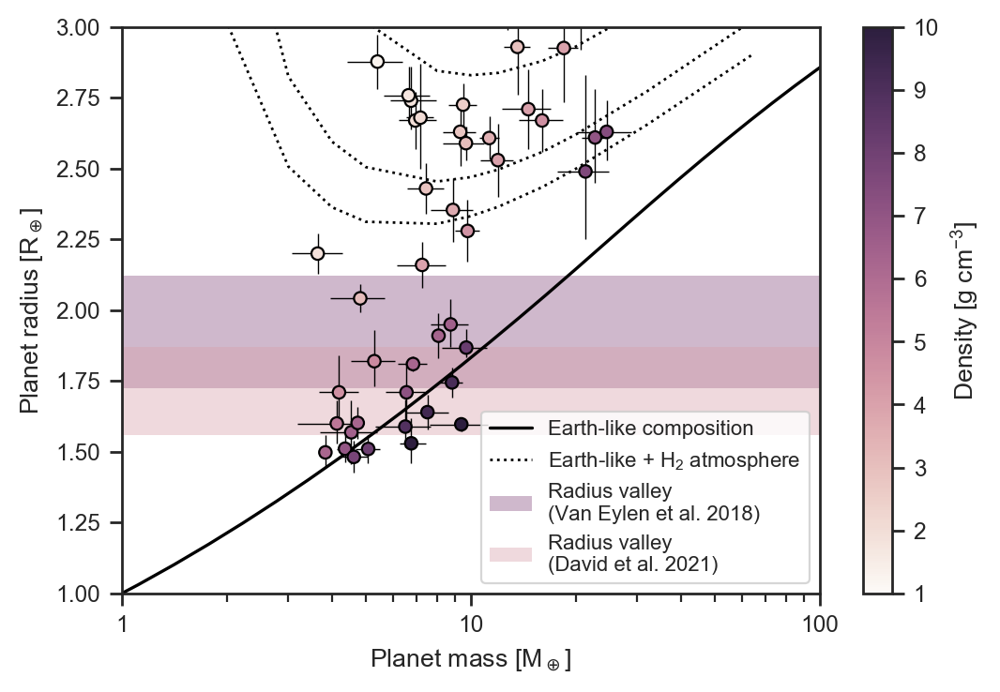

In [781]:
zeng = Table.read('https://www.cfa.harvard.edu/~lzeng/tables/massradiusEarthlikeRocky.txt',
                  format="ascii")

def v18(p):
    logr = -0.09*np.log10(p)+0.37
    return 10.**logr

mthresh = 0.2
rthresh = 0.2

nea['rho_gcc'] = nea['pl_masse']*mearth / (4./3.*np.pi*(nea['pl_rade']*rearth)**3.)

nea_m = (nea['pl_masseerr1']/nea['pl_masse']<mthresh) &\
        (nea['pl_masseerr2']/nea['pl_masse']<mthresh) &\
        (nea['pl_radeerr1']/nea['pl_rade']<rthresh) &\
        (nea['pl_radeerr2']/nea['pl_rade']<rthresh) &\
        (abs(nea['pl_radelim'])!=1) &\
        (nea['pl_orbper']<100.) & (nea['st_teff']>4500) & (nea['st_teff']<6500)

plt.errorbar(nea['pl_masse'][nea_m], nea['pl_rade'][nea_m],
             xerr=[-nea['pl_masseerr2'][nea_m],nea['pl_masseerr1'][nea_m]],
             yerr=[-nea['pl_radeerr2'][nea_m],nea['pl_radeerr1'][nea_m]], fmt='.', color='k', lw=0.5)


#plt.scatter(nea['pl_masse'][nea_m], nea['pl_rade'][nea_m], c=nea['pl_dens'][nea_m], cmap='viridis', zorder=999)
#plt.scatter(nea['pl_masse'][nea_m], nea['pl_rade'][nea_m], c=(nea['pl_masse'][nea_m]/(4./3.*np.pi*nea['pl_rade'][nea_m]**3.)), cmap=cmap, zorder=999, edgecolors='k')
#plt.scatter(nea['pl_masse'][nea_m], nea['pl_rade'][nea_m], c=nea['st_teff'][nea_m], cmap=cmap, zorder=999, edgecolors='k')
plt.scatter(nea['pl_masse'][nea_m], nea['pl_rade'][nea_m], c=nea['rho_gcc'][nea_m], 
            cmap=cmap, zorder=999, edgecolors='k', vmin=1, vmax=10.)

plt.colorbar(label=r'Density [g cm$^\mathregular{-3}$]')
plt.axhspan(v18(3),v18(30), color=tt_cpal[1], alpha=0.4, lw=0, label='Radius valley\n(Van Eylen et al. 2018)')
plt.axhspan(1.56,1.87, color=tt_cpal[0], alpha=0.4, lw=0, label='Radius valley\n(David et al. 2021)')
plt.plot(zeng['col1'], zeng['col2'], 'k', label='Earth-like composition')



# for i,_t in enumerate(['300','500','700','1000','2000']):

#     _zeng = Table.read("https://www.cfa.harvard.edu/~lzeng/tables/Earthlike1h"+_t+"K1mbar.txt", format="ascii")
#     if i==0:
#         label='Earth-like + 1% H$_\mathregular{2}$ atmosphere'
#     else:
#         label=None
#     plt.plot(_zeng['col1'], _zeng['col2'], 'k:', lw=0.5, label=label)

from scipy.interpolate import interp1d

for i,_t in enumerate(['01','03','1','2','5']):

    _zeng = Table.read("https://www.cfa.harvard.edu/~lzeng/tables/Earthlike"+_t+"h1000K1mbar.txt", format="ascii")
    if i==0:
        label='Earth-like + H$_\mathregular{2}$ atmosphere'
    else:
        label=None
        
    #_z = np.polyfit(_zeng['col1'], _zeng['col2'], 5)
    #_p = np.poly1d(_z)
    #_x = np.linspace(0.1,100,100)
    
    #f2 = interp1d(_zeng['col1'], _zeng['col2'], kind='cubic', fill_value="extrapolate")
    
    plt.plot(_zeng['col1'], _zeng['col2'], 'k:', lw=1, label=label)
    
    
    
    
    #plt.plot(_x, f2(_x))



plt.ylim(1,3)
plt.semilogx()
plt.xlim(1,70)
plt.xticks([1,10,100],['1','10','100'])
plt.xlabel(r'Planet mass [M$_\oplus$]')
plt.ylabel(r'Planet radius [R$_\oplus$]')
plt.legend(prop={'size':8})
plt.show()

In [539]:
nsamples = 1000
_mp = np.array([np.random.normal(nea['pl_masse'], np.nanmax([nea['pl_masseerr2'], nea['pl_masseerr1']], axis=0)) for n in range(nsamples)])
_rp = np.array([np.random.normal(nea['pl_rade'], np.nanmax([nea['pl_radeerr2'], nea['pl_radeerr1']], axis=0)) for n in range(nsamples)])
_rho = (_mp*mearth)/(4./3.*np.pi*(_rp*rearth)**3.)

nea['rho_gcc'] = np.nanmean(_rho, axis=0)
nea['rho_gcc_err'] = np.nanstd(_rho, axis=0)

/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: All-NaN axis encountered
  
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: All-NaN axis encountered
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: Mean of empty slice
  
/Users/tdavid/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


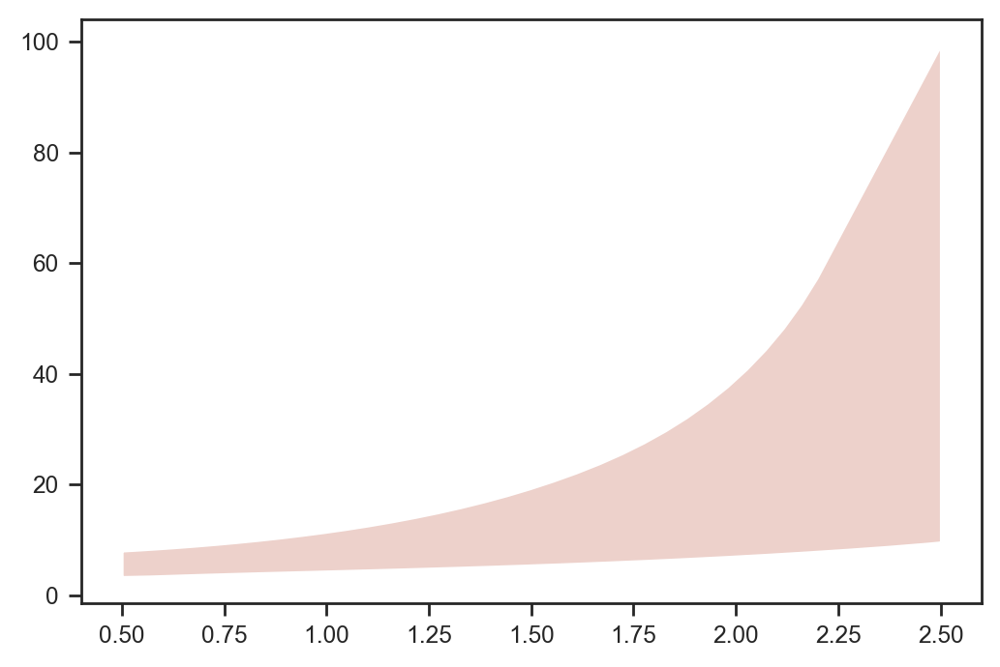

In [523]:
from scipy.interpolate import interp1d

def zeng_curve(comp='earth'):
    
    url_dict = {"earth": "https://www.cfa.harvard.edu/~lzeng/tables/massradiusEarthlikeRocky.txt",
                "iron": "https://www.cfa.harvard.edu/~lzeng/tables/massradiusFe.txt",
                "rock": "https://www.cfa.harvard.edu/~lzeng/tables/massradiusmgsio3.txt"}
    
    data = Table.read(url_dict[comp], format="ascii")
    mass = data['col1']
    radius = data['col2']
    rho = mass*mearth / (4./3.*np.pi*(radius*rearth)**3.)
    
    r2rho = interp1d(radius, rho, fill_value='extrapolate')
    
    return mass,radius,rho,r2rho


zmearth, zrearth, zrhearth, zfearth = zeng_curve(comp='earth')
zmrock, zrrock, zrhrock, zfrock = zeng_curve(comp='rock')
zmfe, zrfe, zrhfe, zffe = zeng_curve(comp='iron')
# _x = np.linspace(0.5,2.5,1000)
# plt.fill_between(_x, zfrock(_x), zffe(_x))
# plt.show()

### Van Eylen et al. 2018 sample

In [112]:
sup = get_catalog('q1_q17_dr25_sup_koi')
sup.head()

vans = pd.read_csv('../data/vaneylen2018_params_table_final.csv')
vanm = pd.read_csv('../data/vaneylen2018_params_table_multis_final.csv')

frames = [vans, vanm]
van = pd.concat(frames)

#Merge with CKS
van['koiname'] = van['koiname'].astype('object')
#van = van.merge(cks, how='left', left_on='koiname', right_on='f18_KOI')
#van = van.merge(sup, how='left', left_on='koiname', right_on='kepoi_name')

van.head()

FileNotFoundError: [Errno 2] File ../data/vaneylen2018_params_table_final.csv does not exist: '../data/vaneylen2018_params_table_final.csv'

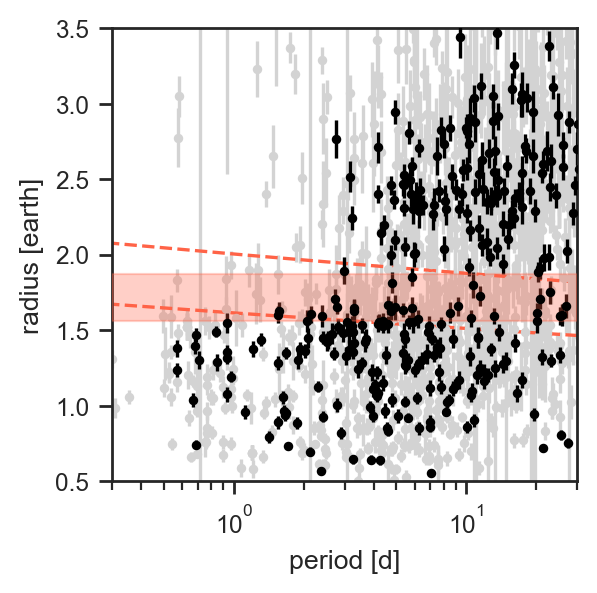

In [160]:
# m = m_disp&\
#     m_r8&\
#     m_rcf&\
#     m_ms&\
#     m_period&\
#     m_mass&\
#     m_feh&\
#     m_rperr&\
#     m_rp&\
#     m_ruwe&\
#     m_deltamag&\
#     m_plx&\
#     m_nongrazing & m_red & m_depth #& m_snr  & m_deltaage


p, rp, erp = cks['f18_P'], cks['f18_Rp'], cks['f18_E_Rp']

gold = m & (cks['rp_prec']<5) & (cks['l20_Av']<1.0) # (cks['nkoi']>1)

_slopes = slopes_D[:][3]
_intercepts = intercepts_D[:][3]
_margins = margins_D[:][3]

xx = np.log10(np.linspace(0.1,100,100))

plt.plot(10.**xx, 10.**(np.median(_slopes)*xx + np.median(_intercepts) + np.sqrt(1+np.median(_slopes)**2) * np.median(_margins)), '--', color='tomato')
plt.plot(10.**xx, 10.**(np.median(_slopes)*xx + np.median(_intercepts) - np.sqrt(1+np.median(_slopes)**2) * np.median(_margins)), '--', color='tomato')

plt.errorbar(p, rp, yerr=erp, fmt='.', color='lightgrey')
plt.errorbar(p[gold], rp[gold], yerr=erp[gold], fmt='.', color='k', zorder=999)
#plt.errorbar(p[iso_allyng], rp[iso_allyng], yerr=erp[iso_allyng], fmt='.', color='k', zorder=999)
plt.semilogx()
plt.axhspan(1.56, 1.87, color='tomato', alpha=0.3, zorder=999)
plt.ylim(0.5,3.5)
plt.xlim(0.3,30)
plt.xlabel('period [d]')
plt.ylabel('radius [earth]')
plt.gcf().set_size_inches(3,3)
plt.show()

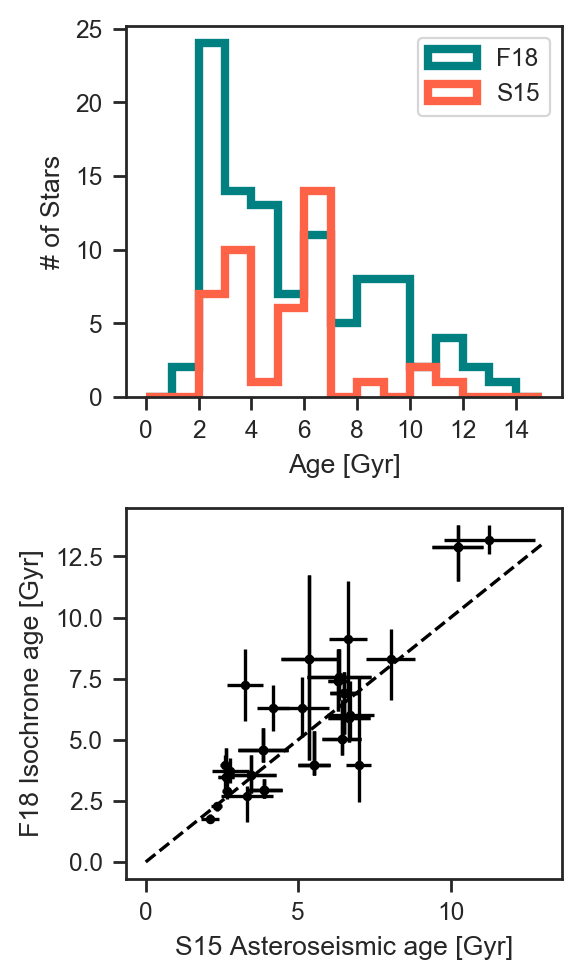

In [237]:
vv = van.merge(cks, left_on='koiname', right_on='f18_KOI')
vv.head()

vv['cks_age'] = 10.**vv['f18_logAiso']/1.0e9
vv['cks_age_E'] = 10.**(vv['f18_logAiso']+vv['f18_E_logAiso'])/1.0e9 - vv['cks_age']
vv['cks_age_e'] = vv['cks_age'] - 10.**(vv['f18_logAiso']-vv['f18_e_logAiso'])/1.0e9

plt.subplot(211)
plt.hist(10.**vv['f18_logAiso']/1.0e9, bins=np.arange(0,16), histtype='step', lw=3, label='F18', color='teal')
plt.hist(vv['s15_Age'], bins=np.arange(0,16), histtype='step', lw=3, label='S15', color='tomato')
plt.xticks(np.arange(0,16,2))
plt.xlabel('Age [Gyr]')
plt.ylabel('# of Stars')
plt.legend()

plt.subplot(212)
plt.errorbar(vv['s15_Age'], vv['cks_age'], xerr=vv['s15_E_Age'], yerr=[vv['cks_age_e'],vv['cks_age_E']], fmt='.', color='k')
plt.plot([0,13],[0,13],'k--')
plt.xlabel('S15 Asteroseismic age [Gyr]')
plt.ylabel('F18 Isochrone age [Gyr]')

plt.gcf().set_size_inches(3,5)
plt.tight_layout()
plt.show()




In [214]:
vv.head()

,Kepler,koiname,Ecc,Ecc_low,Ecc_upp,Period,U_Per,Rp,U_Rp,Rovera,...,prot,prot_err1,prot_err2,prot_numflag,f18_depth_ppm,single_transit_snr,Rcut,rs_prec,rp_prec,nkoi
0,TrES-2,K00001.01,0.008503,4.607463e-07,0.101349,2.470613,2.470613,13.208982,13.486926,0.126034,...,NaN,NaN,NaN,1.0,15339.070201,2.970791,2.093577,2.392344,2.340711,1
1,HAT-P-7,K00002.01,0.011169,3.354116e-06,0.125706,2.204735,2.204735,16.883074,17.137615,0.240748,...,NaN,NaN,NaN,1.0,5686.366464,0.541455,2.889940,2.179422,2.147692,1
2,Kepler-4,K00007.01,0.023892,3.386884e-07,0.211062,3.213671,3.213672,4.220782,4.337596,0.164712,...,NaN,NaN,NaN,1.0,611.820225,0.836632,2.102164,2.650762,2.625123,1
3,Kepler-93,K00069.01,0.017136,3.509737e-07,0.179505,4.726739,4.726740,1.476553,1.509301,0.080183,...,NaN,NaN,NaN,1.0,251.476164,5.642633,1.865902,2.337938,3.928791,1
4,K00075.01,K00075.01,0.018484,1.706625e-06,0.183488,105.881623,105.882376,10.722781,11.015695,0.024964,...,NaN,NaN,NaN,1.0,1449.172624,0.310122,2.227295,2.346858,2.678401,1


Kepler
koiname
Ecc
Ecc_low
Ecc_upp
Period
U_Per
Rp
U_Rp
Rovera
Rovera_low
Rovera-upp
RpRs
RpRs_low
RpRs_upp
Mstar
Mstar_low
Mstar_upp
Rstar
Rstar_low
Rstar_upp
Rho
Rho_low
Rho_upp
Temperature
Temperature_low
Temperature_upp
Metl
Metl_low
Metl_upp
Kepmag
relrho
relrho_low
relrho_upp


No handles with labels found to put in legend.


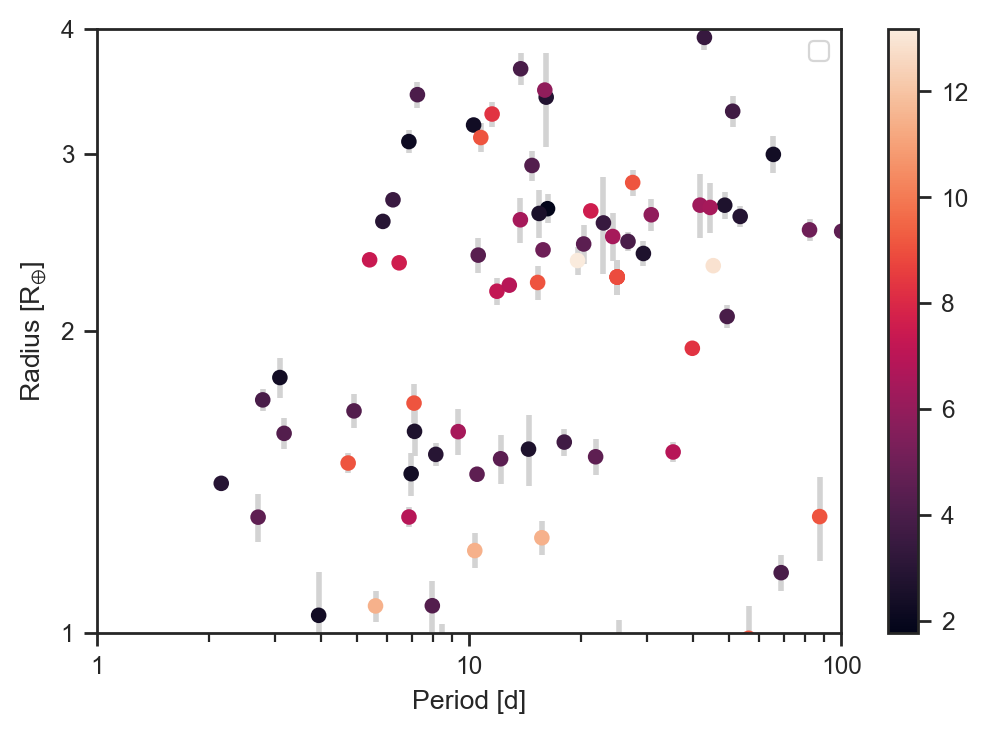

In [251]:
#plt.scatter(van['Period'], van['Rp'], c=van['Rho'])
#plt.scatter(vv['Period'], vv['Rp'], c=vv['s15_Age'])
plt.errorbar(vv['Period'], vv['Rp'], yerr=vv['U_Rp']-vv['Rp'], fmt='.', ecolor='lightgrey', lw=2, zorder=1)
plt.scatter(vv['Period'], vv['Rp'], c=vv['cks_age'], zorder=2)
plt.loglog()
plt.xlim(1,100)
plt.ylim(1,4)
plt.xticks([1,10,100],['1','10','100'])
plt.yticks([1,2,3,4],['1','2','3','4'])
plt.legend()
plt.ylabel('Radius [R$_\mathregular{\oplus}$]')
plt.xlabel('Period [d]')
plt.colorbar()
plt.show()

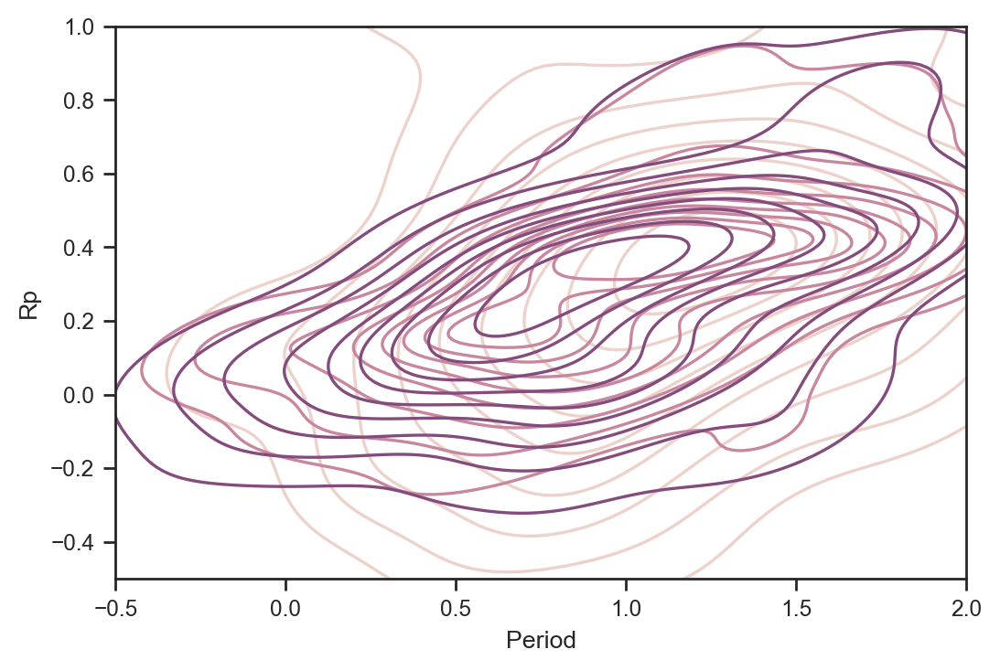

In [212]:
sns.kdeplot(np.log10(van['Period']), np.log10(van['Rp']))
sns.kdeplot(np.log10(cks['f18_P'][gold]), np.log10(cks['f18_Rp'][gold]))
sns.kdeplot(np.log10(cks['f18_P'][iso_allyng&gold]), np.log10(cks['f18_Rp'][iso_allyng&gold]))
plt.ylim(-0.5,1)
plt.xlim(-0.5,2)
plt.show()

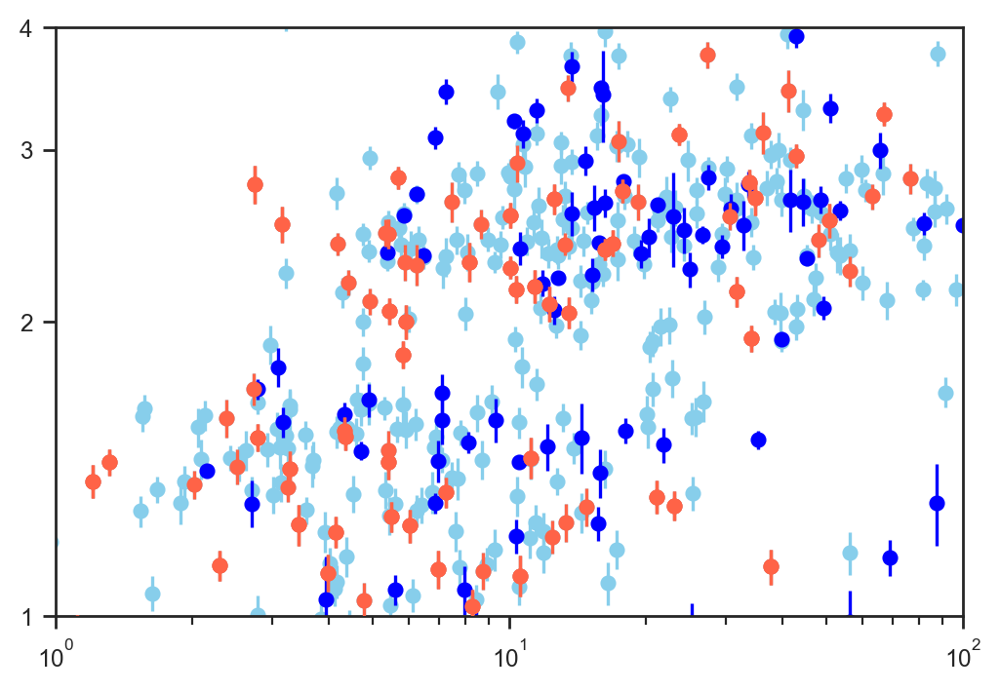

In [202]:
plt.errorbar(van['Period'], van['Rp'], yerr=van['U_Rp']-van['Rp'], fmt='o', color='b', zorder=2)
plt.errorbar(cks['f18_P'][gold], cks['f18_Rp'][gold], yerr=cks['f18_E_Rp'][gold], fmt='o', color='skyblue', zorder=1)
plt.errorbar(cks['f18_P'][iso_allyng&gold], cks['f18_Rp'][iso_allyng&gold], yerr=cks['f18_E_Rp'][iso_allyng&gold], fmt='o', color='tomato', zorder=3)
plt.errorbar(cks['f18_P'][gyro_yng&gold], cks['f18_Rp'][gyro_yng&gold], yerr=cks['f18_E_Rp'][gyro_yng&gold], fmt='o', color='tomato', zorder=3)
plt.loglog()
plt.xlim(1,100)
plt.ylim(1,4)
plt.yticks([1,2,3,4],['1','2','3','4'])
#plt.legend()
plt.show()

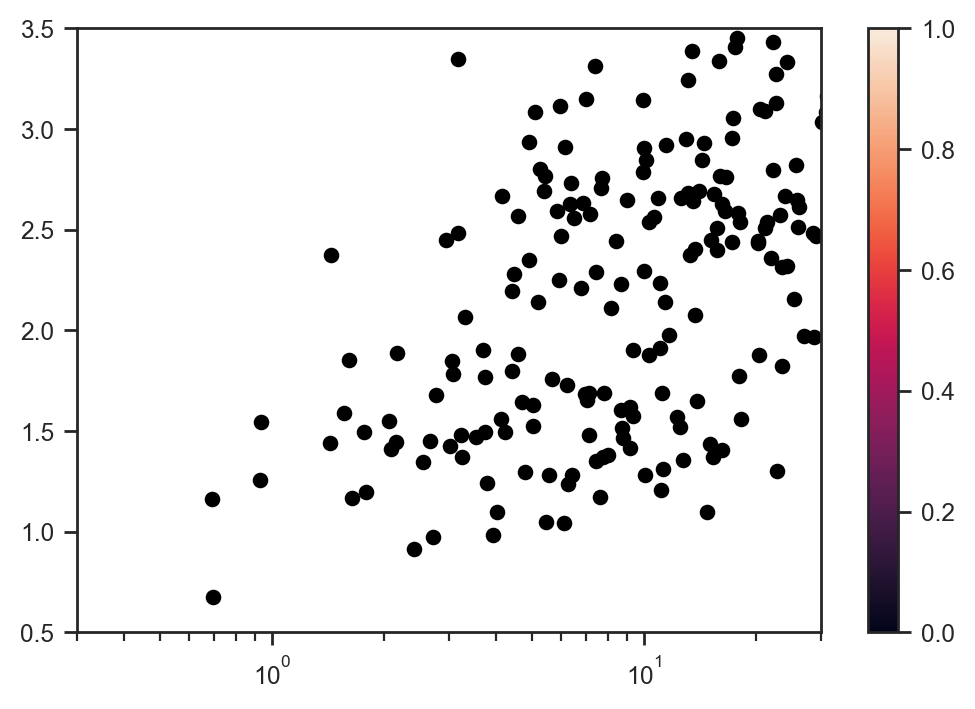

In [126]:
tmp = dr25.merge(b20, left_on='dr25_kepid', right_on='b20_KIC')
tmp.head()

tmp['rp'] = tmp['dr25_koi_ror']*tmp['b20_iso_rad']*c.R_sun/c.R_earth

tm = (tmp.dr25_koi_score>0.99) &\
     (tmp.dr25_koi_disposition=='CONFIRMED') &\
     (tmp['dr25_koi_ror_err1']/tmp['dr25_koi_ror']<0.05) &\
     (tmp['dr25_koi_ror_err2']/tmp['dr25_koi_ror']<0.05) &\
     (tmp['b20_iso_rad_err1']/tmp['b20_iso_rad']<0.05) &\
     (tmp['b20_iso_rad_err2']/tmp['b20_iso_rad']<0.05) &\
     (tmp['b20_iso_teff']>5500.) & (tmp['b20_iso_age']<3)

plt.scatter(tmp['dr25_koi_period'][tm], tmp['rp'][tm], c='k')
plt.semilogx()
plt.ylim(0.5,3.5)
plt.xlim(0.3,30)
plt.colorbar()
plt.show()

In [92]:
for col in dr25.columns:
    print(col)

dr25_kepid
dr25_kepoi_name
dr25_kepler_name
dr25_ra
dr25_ra_err
dr25_ra_str
dr25_dec
dr25_dec_err
dr25_dec_str
dr25_koi_gmag
dr25_koi_gmag_err
dr25_koi_rmag
dr25_koi_rmag_err
dr25_koi_imag
dr25_koi_imag_err
dr25_koi_zmag
dr25_koi_zmag_err
dr25_koi_jmag
dr25_koi_jmag_err
dr25_koi_hmag
dr25_koi_hmag_err
dr25_koi_kmag
dr25_koi_kmag_err
dr25_koi_kepmag
dr25_koi_kepmag_err
dr25_koi_delivname
dr25_koi_vet_stat
dr25_koi_quarters
dr25_koi_disposition
dr25_koi_pdisposition
dr25_koi_count
dr25_koi_num_transits
dr25_koi_max_sngle_ev
dr25_koi_max_mult_ev
dr25_koi_bin_oedp_sig
dr25_koi_limbdark_mod
dr25_koi_ldm_coeff4
dr25_koi_ldm_coeff3
dr25_koi_ldm_coeff2
dr25_koi_ldm_coeff1
dr25_koi_trans_mod
dr25_koi_model_snr
dr25_koi_model_dof
dr25_koi_model_chisq
dr25_koi_time0bk
dr25_koi_time0bk_err1
dr25_koi_time0bk_err2
dr25_koi_eccen
dr25_koi_eccen_err1
dr25_koi_eccen_err2
dr25_koi_longp
dr25_koi_longp_err1
dr25_koi_longp_err2
dr25_koi_prad
dr25_koi_prad_err1
dr25_koi_prad_err2
dr25_koi_sma
dr25_koi_sma_

In [83]:
for col in dr25.columns:
    print(col)
#b20['b20_iso_rad']

dr25_kepid
dr25_kepoi_name
dr25_kepler_name
dr25_ra
dr25_ra_err
dr25_ra_str
dr25_dec
dr25_dec_err
dr25_dec_str
dr25_koi_gmag
dr25_koi_gmag_err
dr25_koi_rmag
dr25_koi_rmag_err
dr25_koi_imag
dr25_koi_imag_err
dr25_koi_zmag
dr25_koi_zmag_err
dr25_koi_jmag
dr25_koi_jmag_err
dr25_koi_hmag
dr25_koi_hmag_err
dr25_koi_kmag
dr25_koi_kmag_err
dr25_koi_kepmag
dr25_koi_kepmag_err
dr25_koi_delivname
dr25_koi_vet_stat
dr25_koi_quarters
dr25_koi_disposition
dr25_koi_pdisposition
dr25_koi_count
dr25_koi_num_transits
dr25_koi_max_sngle_ev
dr25_koi_max_mult_ev
dr25_koi_bin_oedp_sig
dr25_koi_limbdark_mod
dr25_koi_ldm_coeff4
dr25_koi_ldm_coeff3
dr25_koi_ldm_coeff2
dr25_koi_ldm_coeff1
dr25_koi_trans_mod
dr25_koi_model_snr
dr25_koi_model_dof
dr25_koi_model_chisq
dr25_koi_time0bk
dr25_koi_time0bk_err1
dr25_koi_time0bk_err2
dr25_koi_eccen
dr25_koi_eccen_err1
dr25_koi_eccen_err2
dr25_koi_longp
dr25_koi_longp_err1
dr25_koi_longp_err2
dr25_koi_prad
dr25_koi_prad_err1
dr25_koi_prad_err2
dr25_koi_sma
dr25_koi_sma_

In [ ]:
#CKS radii of van eylen planets

In [972]:
print(len(van))
print(len(van[~np.isnan(van['kepid'])]))
#print(len(van[~np.isnan(van['gaia_kepid'])]))

117
51


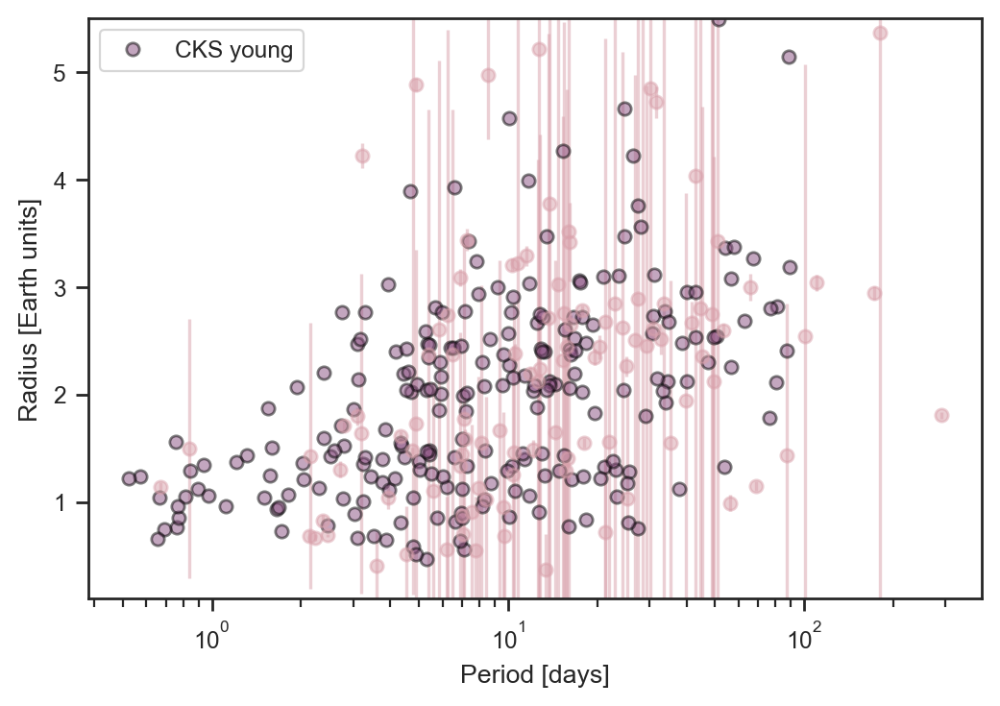

In [117]:
#plt.plot(cks['f18_P'][common_cuts&m_nongrazing&(cks['rp_prec']<thresh)], cks['f18_Rp'][common_cuts&m_nongrazing&(cks['rp_prec']<thresh)], 'o')
#plt.plot(cks['f18_P'][iso_allyng&m_nongrazing&(cks['rp_prec']<6)], 
#         cks['f18_Rp'][iso_allyng&m_nongrazing&(cks['rp_prec']<6)], 'o', color=tt_cpal[1], label='CKS young', alpha=0.5, mec='k')
#plt.plot(cks['f18_P'][gyro_yng&m_nongrazing&(cks['rp_prec']<thresh)], cks['f18_Rp'][gyro_yng&m_nongrazing&(cks['rp_prec']<thresh)], 'o', mec='grey')

plt.plot(cks['f18_P'][iso_allyng], 
         cks['f18_Rp'][iso_allyng], 'o', color=tt_cpal[1], label='CKS young', alpha=0.5, mec='k')

plt.errorbar(van['Period'], van['Rp'], yerr=van['U_Rp']-van['Rp'], color=tt_cpal[0], alpha=0.5, fmt='o')
#plt.errorbar(vanm['Period'], vanm['Rp'], yerr=vanm['U_Rp']-vanm['Rp'], color=tt_cpal[0], alpha=0.5, fmt='o', label='Van Eylen et al. 2018 asteroseismic')

plt.semilogx()
plt.legend()
plt.ylim(0.1,5.5)
plt.ylabel('Radius [Earth units]')
plt.xlabel('Period [days]')
plt.show()

### For stephen kane

In [867]:
prot_table = cks[['f18_KOI_int', 
                  'dr25_kepid', 
                  'prot', #'prot_err1', #'prot_err2', 
                  'Prot_adopted',
                  'prot_numflag',
                  'a18_period', #'a18_period_errm', #'a18_period_errp',
                  'm13_Prot',
                  'm15_Prot',
                  'w13_Per']].copy()
                  #'w13_e_Per']].copy()
    

#Only keep targets where at least one rotation period determination exists
#prot_table = prot_table[prot_table['prot'].notna()]

#Remove duplicate rows
prot_table = prot_table.drop_duplicates(subset='f18_KOI_int', keep='first')
#Formatting
#prot_table.dr25_kepid = prot_table.dr25_kepid.astype(int)    
#Rounding
prot_table.prot = prot_table.prot.round(2)
prot_table.a18_period = prot_table.a18_period.round(2)
prot_table.m13_Prot = prot_table.m13_Prot.round(2)


prot_table = prot_table.rename(columns={"f18_KOI_int": "koi", 
                           "dr25_kepid": "kepid",
                           "Prot_adopted": "prot_ref",
                           "a18_period": "a18_prot",
                           "m13_Prot": "m13_prot",
                           "m15_Prot": "m15_prot",
                           "w13_Per": "w13_prot"})

prot_table.to_csv('/Users/tdavid/Desktop/table1.csv', index=False)

prot_table.head()

,koi,kepid,prot,prot_ref,prot_numflag,a18_prot,m13_prot,m15_prot,w13_prot
0,1,11446443.0,NaN,NaN,1.0,24.85,NaN,70.55,NaN
1,2,10666592.0,NaN,NaN,1.0,19.60,NaN,70.69,NaN
2,6,3248033.0,NaN,NaN,0.0,22.77,NaN,NaN,NaN
3,7,11853905.0,NaN,NaN,1.0,25.31,NaN,NaN,NaN
4,8,5903312.0,NaN,NaN,0.0,15.32,NaN,NaN,13.88


/Users/tdavid/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/tdavid/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


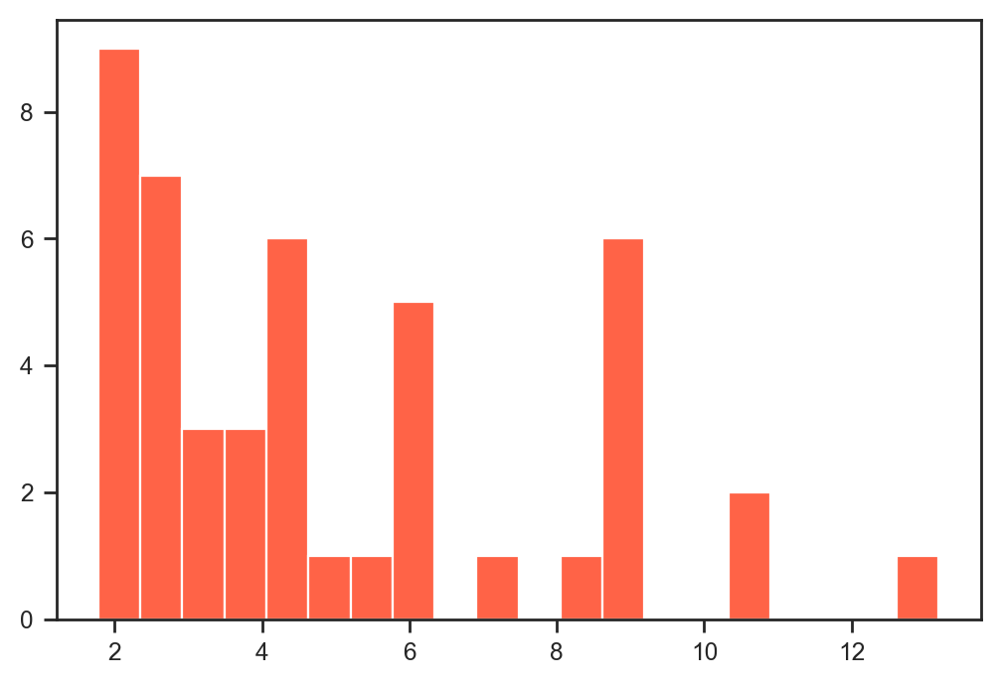

In [945]:
van['f18_age'] = (10.**van['f18_logAiso'])/1.0e9
van['f18_age_uerr'] = (10.**(van['f18_logAiso']+van['f18_E_logAiso']))/1.0e9 - van['f18_age']
van['f18_age_lerr'] = van['f18_age'] - (10.**(van['f18_logAiso']-van['f18_e_logAiso']))/1.0e9 

plt.hist(van['f18_age'], bins=20, color='tomato')
plt.show()

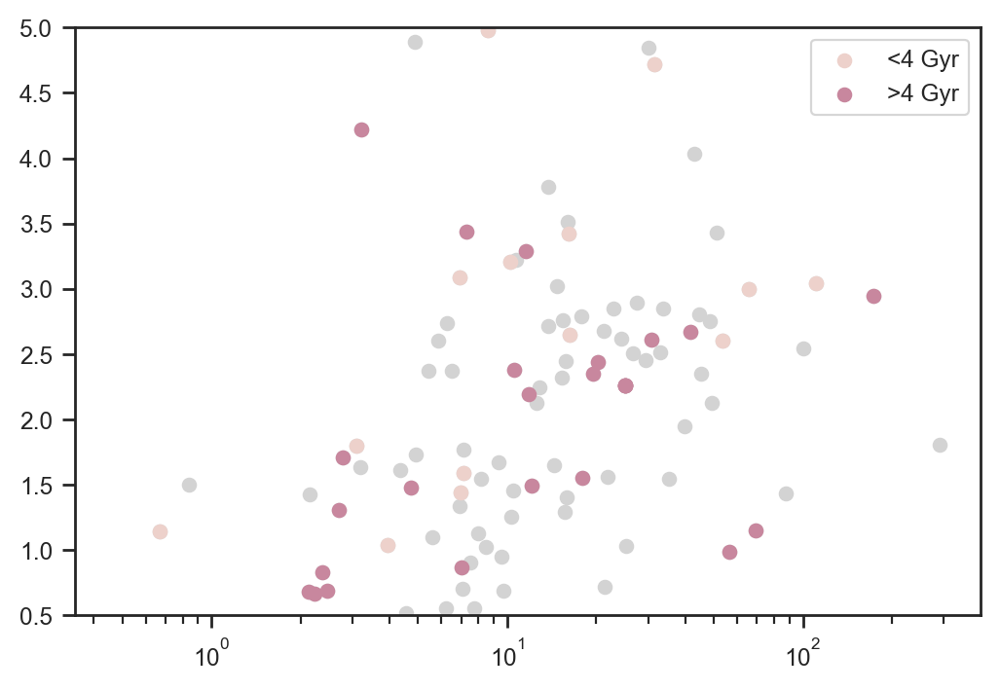

In [924]:
#tmp1 = van['s15_Age']<4.0
#tmp2 = van['s15_Age']>4.0

tmp1 = van['f18_age']<3.0
tmp2 = van['f18_age']>3.0

plt.scatter(van['Period'], van['Rp'], color='lightgrey')
plt.scatter(van['Period'][tmp1], van['Rp'][tmp1], label='<4 Gyr')
plt.scatter(van['Period'][tmp2], van['Rp'][tmp2], label='>4 Gyr')
plt.legend()
plt.semilogx()
plt.ylim(0.5,5)
plt.show()

In [940]:
print(len(van))

120


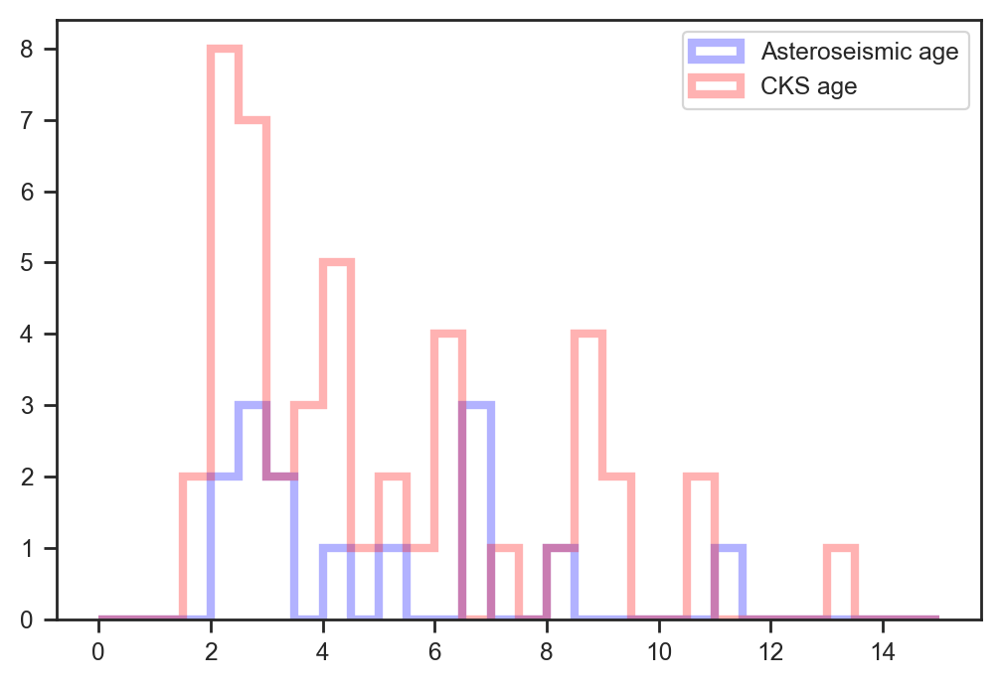

In [942]:
_bins = np.arange(0,15.5,0.5)

plt.hist(van['s15_Age'][~np.isnan(van['s15_Age'])], bins=_bins, color='b', alpha=0.3, histtype='step', lw=3, label='Asteroseismic age')
plt.hist(van['f18_age'][~np.isnan(van['f18_age'])], bins=_bins, color='r', alpha=0.3, histtype='step', lw=3, label='CKS age')
plt.legend()
plt.show()

In [958]:
print(len(van))
print(len(van[~np.isnan(van['f18_age'])]), 'have CKS ages')
print(len(van[~np.isnan(van['s15_Age'])]), 'have asteroseismic ages')
print(len(van[~np.isnan(van['b20_iso_age'])]), 'have Berger et al. 2020 ages')

120
46 have CKS ages
14 have asteroseismic ages
46 have Berger et al. 2020 ages


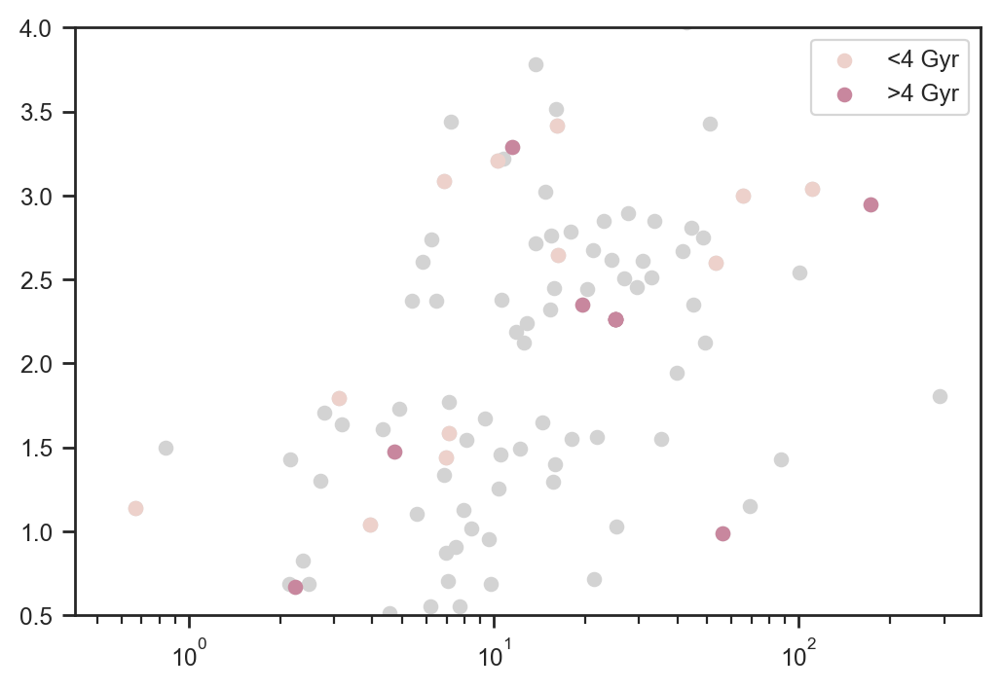

In [952]:
tmp1 = van['f18_age']<3.0
tmp2 = van['f18_age']>8.0

plt.scatter(van['Period'], van['Rp'], color='lightgrey')
plt.scatter(van['Period'][tmp1], van['Rp'][tmp1], label='<4 Gyr')
plt.scatter(van['Period'][tmp2], van['Rp'][tmp2], label='>4 Gyr')
plt.semilogx()
plt.legend()
plt.ylim(0.5,4)
plt.show()

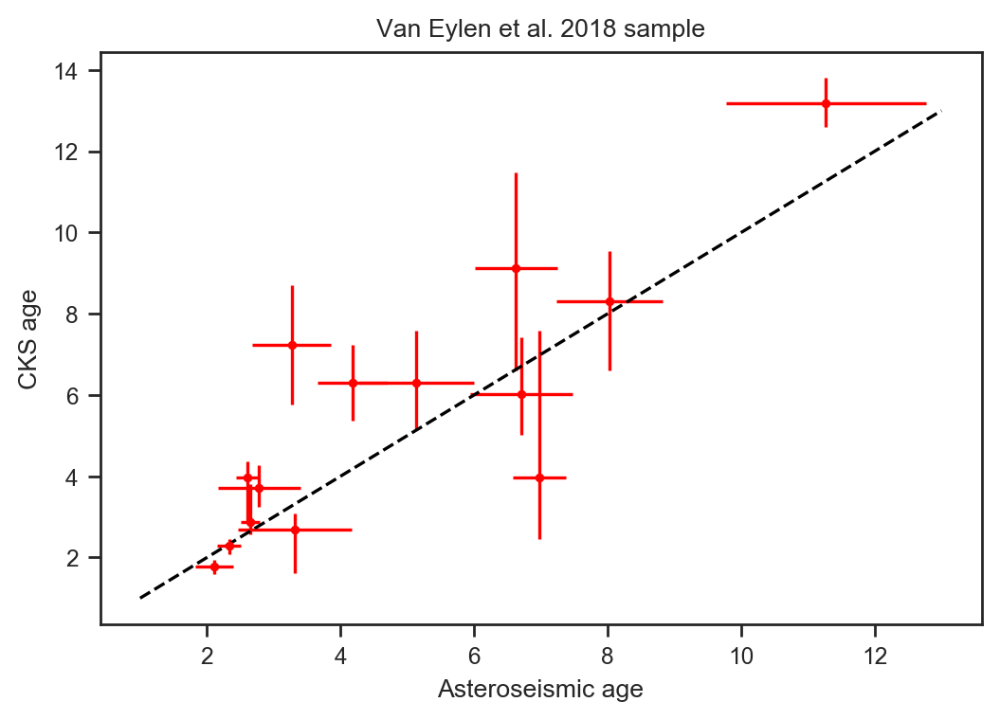

In [948]:
plt.errorbar(van['s15_Age'], van['f18_age'], 
             xerr=van['s15_E_Age'], 
             yerr=[van['f18_age_lerr'], van['f18_age_uerr']], fmt='.', color='r')

plt.plot([1,13],[1,13],'k--')
plt.xlabel('Asteroseismic age')
plt.ylabel('CKS age')
plt.title('Van Eylen et al. 2018 sample')
plt.show()

In [ ]:
### plt.plot(cks['f18_Teff'], cks['f18_R'], '.', color='lightgrey')
plt.plot(vans['f18_Teff'], vans['f18_R'], 'ro')
plt.plot(vanm['f18_Teff'], vanm['f18_R'], 'ro')
plt.semilogy()
plt.gca().invert_xaxis()
plt.show()

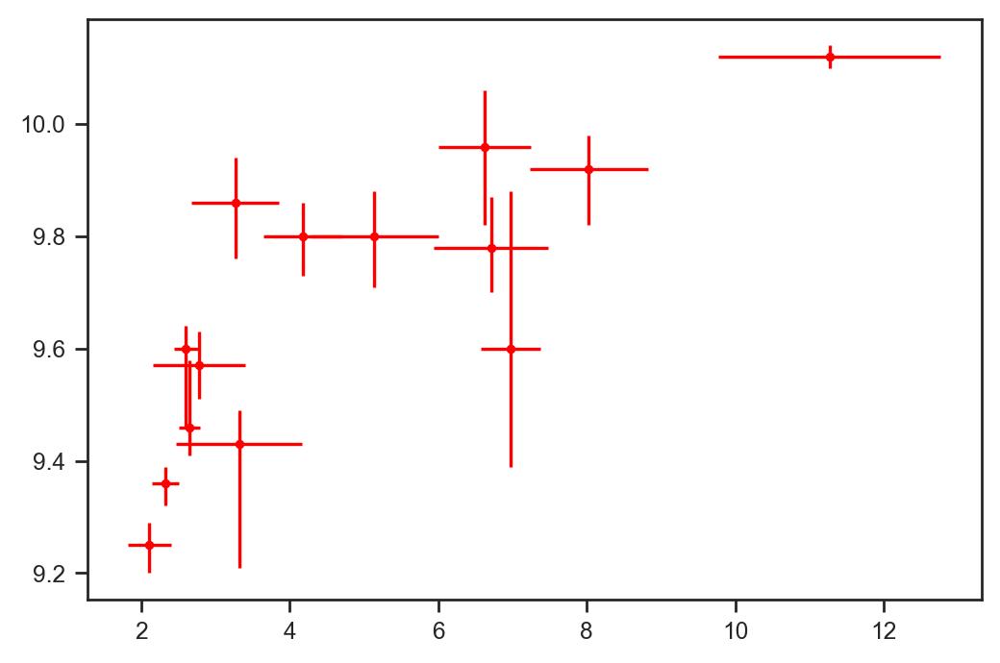

In [901]:
plt.errorbar(vanm['s15_Age'], vanm['f18_logAiso'], 
             xerr=vanm['s15_E_Age'], yerr=[vanm['f18_e_logAiso'], vanm['f18_E_logAiso']], fmt='.', color='r')

plt.show()

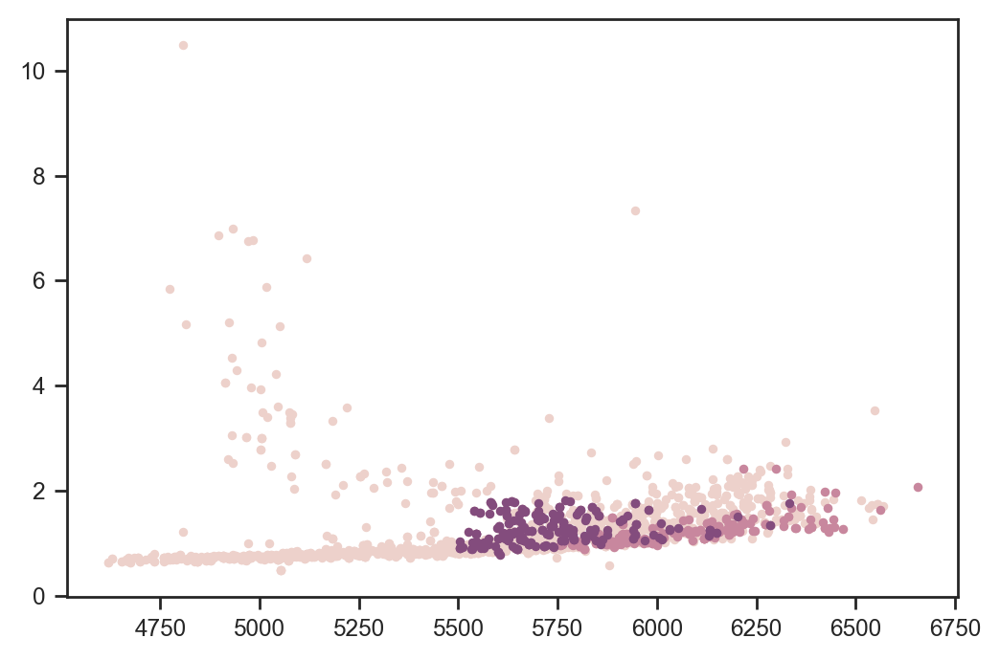

In [934]:
tmp = (cks['b20_log10_iso_age']<9.25) & (cks['f18_Teff']>5750) & m_ms

plt.plot(cks['f18_Teff'], cks['f18_R'], '.')
plt.plot(cks['f18_Teff'][tmp], cks['f18_R'][tmp], '.')
plt.plot(cks['f18_Teff'][tmp2], cks['f18_R'][tmp2], '.')
plt.show()

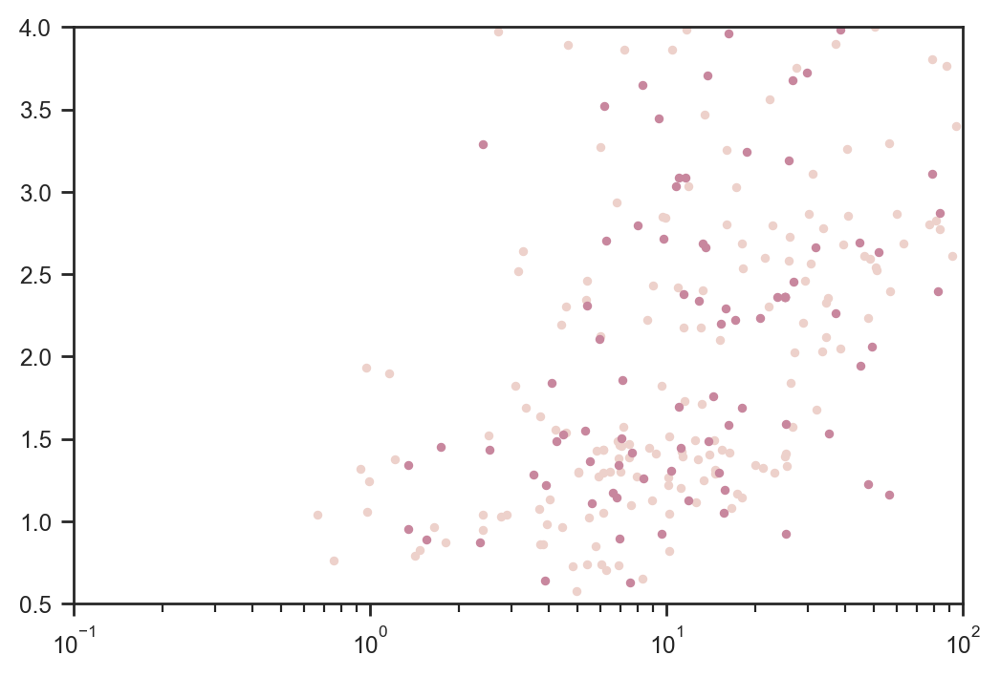

In [935]:
tmp2 = (cks['b20_log10_iso_age']>9.75) & (cks['f18_Teff']>5750) & m_ms

plt.plot(cks['f18_P'][tmp], cks['f18_Rp'][tmp], '.')
plt.plot(cks['f18_P'][tmp2], cks['f18_Rp'][tmp2], '.')
plt.semilogx()
plt.xlim(0.1,100)
plt.ylim(0.5,4)
plt.show()

/Users/tdavid/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Users/tdavid/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


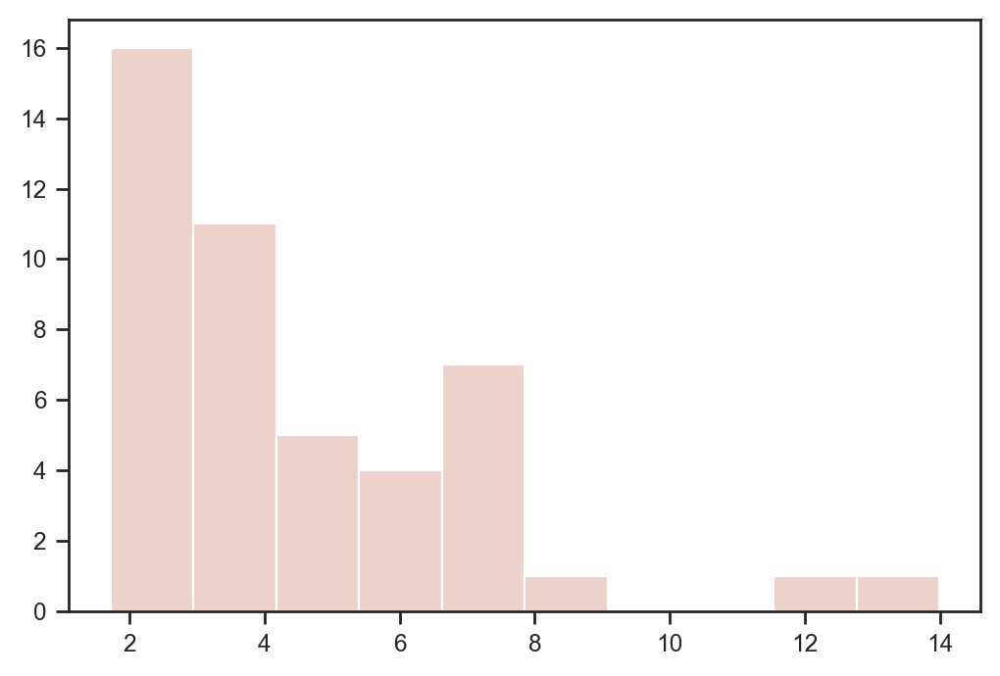

In [957]:
plt.hist(van['b20_iso_age'])
plt.show()

,Kepler,koiname,Ecc,Ecc_low,Ecc_upp,Period,U_Per,Rp,U_Rp,Rovera,...,single_transit_snr,Rcut,rs_prec,rp_prec,f18_age,f18_agehi,f18_agelo,f18_age_pcterr,f18_age_uerr,f18_age_lerr
0,TrES-2,K00001.01,0.008503,4.607463e-07,0.101349,2.470613,2.470613,13.208982,13.486926,0.126034,...,2.970791,2.093577,2.392344,2.340711,5.495409,7.413102,3.890451,0.348963,1.917694,1.604957
1,HAT-P-7,K00002.01,0.011169,3.354116e-06,0.125706,2.204735,2.204735,16.883074,17.137615,0.240748,...,0.541455,2.889940,2.179422,2.147692,1.778279,1.949845,1.584893,0.108749,0.171565,0.193386
2,HAT-P-11,K00003.01,0.091153,6.389376e-02,0.274010,4.887802,4.887803,4.887142,4.951733,0.066093,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Kepler-4,K00007.01,0.023892,3.386884e-07,0.211062,3.213671,3.213672,4.220782,4.337596,0.164712,...,0.836632,2.102164,2.650762,2.625123,6.025596,7.413102,5.011872,0.230269,1.387507,1.013724
4,Kepler-410,K00042.01,0.184489,1.259499e-01,0.415954,17.833613,17.833659,2.786468,2.831038,0.043962,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
